<a href="https://colab.research.google.com/github/Riley-19282/Permafrost_Research/blob/main/Final_Cumulative_incubation_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from google.colab import files
import io
from sklearn.metrics import r2_score
import matplotlib.patches as patches
import statsmodels.formula.api as smf
from sklearn.linear_model import LinearRegression

# !pip install openpyxl==3.1.2

In [2]:
#upload file
#added QA/QC column for CO2 CH4 and d13C values where 0=no issues 1=area 45 went off scale 2=both area 44 and 45 went off scale 3=unusable (due to too low conc or invalid d13C values due to going off scale)
data=pd.read_csv('https://docs.google.com/spreadsheets/d/1nEPA9Qt-DeFt2w9k_eOxp9BUcJqW0KwpzJUzflcXB98/export?format=csv')

data = data.reset_index()
data


,index,Sample Date,Days of incubation,Name,injection vol (mL),Temperature (K),Raw CO2 (nmols),Raw CH4 (nmols),d13C CO2,d13C CH4,...,dry mass (g),water vol (mL),soil vol (mL),Vial Vol (mL),TOC (wt%),g OC in dry mass (g),pH,DOC (mg/L),DOC in water (mg),alpha values
0,0,2/21/2024,15,SL4_d0_1,1.0,298,56.628999,NaN,-12.430035,NaN,...,1.433583,0.766417,0.547169,12.016,0.90,0.012902,NaN,NaN,NaN,NaN
1,1,2/21/2024,15,SL4_d0_2,1.0,298,47.380749,NaN,-13.980494,NaN,...,1.498746,0.801254,0.572040,12.016,0.90,0.013489,NaN,NaN,NaN,NaN
2,2,2/21/2024,15,SL4_d0_3,1.0,298,77.393786,NaN,-20.910760,NaN,...,1.563909,0.836091,0.596912,12.016,0.90,0.014075,NaN,NaN,NaN,NaN
3,3,2/21/2024,15,SL4_d0_4,1.0,279,71.522193,NaN,-12.384654,NaN,...,1.954886,1.045114,0.746140,12.016,0.90,0.017594,NaN,NaN,NaN,NaN
4,4,2/21/2024,15,SL4_d0_5,1.0,279,79.468921,NaN,-10.527998,NaN,...,2.411026,1.288974,0.920239,12.016,0.90,0.021699,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
615,615,5/1/25,42,SL4_dC+dAA_1,0.3,298,55.024771,11.286080,-17.155823,-37.721221,...,4.163166,3.876834,1.584761,24.800,1.22,0.050791,6.179590,114.8,0.556561,NaN
616,616,5/1/25,42,SL4_dC+dAA_2,0.3,298,65.271614,NaN,-20.011862,68.369051,...,3.563505,3.606495,1.356492,24.800,1.22,0.043475,6.165554,114.8,0.525526,NaN
617,617,5/1/25,42,SL4_dC+dAA_3,0.3,298,123.879285,NaN,-21.698401,96.065394,...,4.170059,3.879941,1.587384,24.800,1.22,0.050875,6.179742,114.8,0.556917,NaN
618,618,11/8/2024,1,N2 blank vial,2.0,298,6.502147,5.012000,12.764738,NaN,...,0.000000,0.000000,0.000000,24.800,0.00,0.000000,NaN,NaN,0.000000,NaN


#corrections

In [3]:
data['pH'] = pd.to_numeric(data['pH'], errors='coerce')
# data['pH'] = data['pH'].astype(float)

# data

In [4]:
#assign some variables
R = 0.082057  #L atm/mol K
KH_CO2_298 = 0.034 #mol/L atm
KH_CO2_279 = 0.0588
KH_CO2_275 = 0.06668

KH_CH4_298 = 0.0014
KH_CH4_279 = 0.002088
KH_CH4_275 = 0.002288

#find headspace volume (mL)
data['headspace vol (mL)'] = data['Vial Vol (mL)'] - (data['water vol (mL)'] + data['soil vol (mL)'])

#find scale factor
data['scale factor'] = (data['headspace vol (mL)'] + data['injection vol (mL)']) / data['injection vol (mL)']

#find headspace CO2 and CH4
data['headspace CO2 (nmols)'] = data['Raw CO2 (nmols)'] * data['scale factor']
data['headspace CH4 (nmols)'] = data['Raw CH4 (nmols)'] * data['scale factor']

Headspace_CO2 = data['headspace CO2 (nmols)'] * 10**-9
Headspace_CH4 = data['headspace CH4 (nmols)'] * 10**-9   #headpsace in mols

#find pCO2 and pCH4
data['pCO2 (atm)'] = (Headspace_CO2 * data['Temperature (K)'] * R) / (data['headspace vol (mL)']/1000)
data['pCH4 (atm)'] = (Headspace_CH4 * data['Temperature (K)'] * R) / (data['headspace vol (mL)']/1000)

#find dissolved fraction (porewater CO2), need to assign differet KH values based on temp
def calculate_porewater_CO2(row):
    if row['Temperature (K)'] == 298:
        KH_CO2 = KH_CO2_298
    elif row['Temperature (K)'] == 279:
        KH_CO2 = KH_CO2_279
    elif row['Temperature (K)'] == 275:
        KH_CO2 = KH_CO2_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    porewater_CO2 = (row['water vol (mL)']/1000) * row['pCO2 (atm)'] * KH_CO2
    return porewater_CO2

data['porewater_CO2 (mols)'] = data.apply(calculate_porewater_CO2, axis=1)

#find dissolved fraction (porewater CH4)
def calculate_porewater_CH4(row):
    if row['Temperature (K)'] == 298:
        KH_CH4 = KH_CH4_298
    elif row['Temperature (K)'] == 279:
        KH_CH4 = KH_CH4_279
    elif row['Temperature (K)'] == 275:
        KH_CH4 = KH_CH4_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    porewater_CH4 = (row['water vol (mL)']/1000) * row['pCH4 (atm)'] * KH_CH4
    return porewater_CH4

data['porewater_CH4 (mols)'] = data.apply(calculate_porewater_CH4, axis=1)

#find total CO2 and CH4 inn micromols
data['total CO2 (micromols)'] = ((data['porewater_CO2 (mols)'] + Headspace_CO2) * 10**6) + (data['Missing CO2']/1000)   #manuallly made missing C columns in google sheets - if vial starts producing methane that wasn't orginially, will need to revist formula used
data['total CH4 (micromols)'] = ((data['porewater_CH4 (mols)'] + Headspace_CH4) * 10**6) + (data['Missing CH4']/1000)

#find OC weighted CO2 and CH4
data['totCO2/gC'] = data['total CO2 (micromols)'] / data['g OC in dry mass (g)']
data['totCH4/gC'] = data['total CH4 (micromols)'] / data['g OC in dry mass (g)']

# data['headspace vol (mL)']

# data

In [5]:
#new DIC corrections - Hilman

#define variables
KH_298 = 0.034054738 #(mol/L atm)
K1_298 = 4.44716e-7 #(mol/L atm)
K2_298 = 4.68876e-11
Kcal_298 = 3.31304e-9

KH_279 = 0.06193477
K1_279 = 3.12531e-7
K2_279 = 2.87972e-11
Kcal_279 = 4.00712e-9

KH_275 = 0.072029582
K1_275 = 2.80152e-7
K2_275 = 2.52286e-11
Kcal_275 = 4.11053e-9

# pH = 7.1 #6.3

#find dissolved fraction (porewater CO2), need to assign differet KH values based on temp
def calculate_porewater_CO2_Hilman(row):
    if row['Temperature (K)'] == 298:
        KH = KH_298
        K1 = K1_298
        K2 = K2_298
        Kcal = Kcal_298
    elif row['Temperature (K)'] == 279:
        KH = KH_279
        K1 = K1_279
        K2 = K2_279
        Kcal = Kcal_279
    elif row['Temperature (K)'] == 275:
        KH = KH_275
        K1 = K1_275
        K2 = K2_275
        Kcal = Kcal_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    # denominator_1 = ((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))

    # tolerance = 1e-20
    # if abs(denominator_1) < tolerance:
    #     denominator_1 = tolerance

    porewater_CO2_Hilman = (row['water vol (mL)']/1000) * ((row['pCO2 (atm)']) * KH) #(row['water vol (mL)']/1000) * ((row['pCO2 (atm)']) * KH * (1+ (K1*10**(row['pH'])) +((K1*K2)*((10**(2*(row['pH'])))))))
    return porewater_CO2_Hilman

data['porewater dissCO2 (mols)'] = data.apply(calculate_porewater_CO2_Hilman, axis=1)

#find dissolved fraction (HCO3-), need to assign differet KH values based on temp
def calculate_porewater_HCO3_Hilman(row):
    if row['Temperature (K)'] == 298:
        KH = KH_298
        K1 = K1_298
        K2 = K2_298
        Kcal = Kcal_298
    elif row['Temperature (K)'] == 279:
        KH = KH_279
        K1 = K1_279
        K2 = K2_279
        Kcal = Kcal_279
    elif row['Temperature (K)'] == 275:
        KH = KH_275
        K1 = K1_275
        K2 = K2_275
        Kcal = Kcal_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    # denominator_1 = ((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))

    # tolerance = 1e-20
    # if abs(denominator_1) < tolerance:
    #     denominator_1 = tolerance

    porewater_HCO3_Hilman = (row['water vol (mL)']/1000) * (((row['pCO2 (atm)']) * KH * K1)*(10**(row['pH']))) #(row['water vol (mL)']/1000) * ((row['pCO2 (atm)']) * KH * (1+ (K1*10**(row['pH'])) +((K1*K2)*((10**(2*(row['pH'])))))))
    return porewater_HCO3_Hilman
data['porewater HCO3 (mols)'] = data.apply(calculate_porewater_HCO3_Hilman, axis=1)

#find dissolved fraction (CO32-), need to assign differet KH values based on temp
def calculate_porewater_CO32_Hilman(row):
    if row['Temperature (K)'] == 298:
        KH = KH_298
        K1 = K1_298
        K2 = K2_298
        Kcal = Kcal_298
    elif row['Temperature (K)'] == 279:
        KH = KH_279
        K1 = K1_279
        K2 = K2_279
        Kcal = Kcal_279
    elif row['Temperature (K)'] == 275:
        KH = KH_275
        K1 = K1_275
        K2 = K2_275
        Kcal = Kcal_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    # denominator_1 = ((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))

    # tolerance = 1e-20
    # if abs(denominator_1) < tolerance:
    #     denominator_1 = tolerance

    porewater_CO32_Hilman = (row['water vol (mL)']/1000) * (((row['pCO2 (atm)']) * KH * K1 * K2)/((10**(-row['pH']))**2)) #(row['water vol (mL)']/1000) * ((row['pCO2 (atm)']) * KH * (1+ (K1*10**(row['pH'])) +((K1*K2)*((10**(2*(row['pH'])))))))
    return porewater_CO32_Hilman
data['porewater CO32 (mols)'] = data.apply(calculate_porewater_CO32_Hilman, axis=1)

#find DIC mols
data['porewater_DIC_Hilman (mols)'] = data['porewater dissCO2 (mols)'] +data['porewater HCO3 (mols)'] +data['porewater CO32 (mols)'] #data.apply(calculate_porewater_DIC_Hilman, axis=1)
#find total CO2
data['total CO2 new Hilman (micromols)'] = ((((data['porewater_DIC_Hilman (mols)']) + Headspace_CO2) * 10**6) + (data['Missing CO2']/1000))
#find OC weighted CO2 and CH4
data['totCO2/gC new Hilman'] = data['total CO2 new Hilman (micromols)'] / data['g OC in dry mass (g)']

#find Ca2++ dissolved assuming carbonates present
def calculate_Ca_Hilman(row):
    if row['Temperature (K)'] == 298:
        KH = KH_298
        K1 = K1_298
        K2 = K2_298
        Kcal = Kcal_298
    elif row['Temperature (K)'] == 279:
        KH = KH_279
        K1 = K1_279
        K2 = K2_279
        Kcal = Kcal_279
    elif row['Temperature (K)'] == 275:
        KH = KH_275
        K1 = K1_275
        K2 = K2_275
        Kcal = Kcal_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    denominator_1 = ((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))

    tolerance = 1e-20
    if abs(denominator_1) < tolerance:
        denominator_1 = tolerance

    porewater_Ca_Hilman = (row['water vol (mL)']/1000) * 0.5*((K1*KH*(row['pCO2 (atm)']))/(10**(-row['pH']))) #(np.cbrt(denominator_1)) #(Kcal/((K2*K1*KH*row['pCO2 (atm)'])/(((10**(-pH*2)))))) #0.5*((K1*KH*(row['pCO2 (atm)']))/(10**-pH))  # #
    if pd.isna(row['pH']):
        porewater_Ca_Hilman = np.nan  # Or any other desired handling for NaN
    else:
        porewater_Ca_Hilman = (row['water vol (mL)']/1000) * 0.5*((K1*KH*(row['pCO2 (atm)']))/(10**(-row['pH'])))
    return porewater_Ca_Hilman

data['porewater_Ca_Hilman (mols)'] = data.apply(calculate_Ca_Hilman, axis=1)

data['porewater_Ca_Hilman (micromols)'] = data['porewater_Ca_Hilman (mols)'] * 10**6

#find CO2 respired
data['CO2 resp Hilman (micromols)'] = data['total CO2 new Hilman (micromols)'] - (data['porewater_Ca_Hilman (mols)']*10**6)
#find OC weighted CO2 and CH4

data['resp totCO2/gC new Hilman'] = data['CO2 resp Hilman (micromols)'] / data['g OC in dry mass (g)']

data

,index,Sample Date,Days of incubation,Name,injection vol (mL),Temperature (K),Raw CO2 (nmols),Raw CH4 (nmols),d13C CO2,d13C CH4,...,porewater dissCO2 (mols),porewater HCO3 (mols),porewater CO32 (mols),porewater_DIC_Hilman (mols),total CO2 new Hilman (micromols),totCO2/gC new Hilman,porewater_Ca_Hilman (mols),porewater_Ca_Hilman (micromols),CO2 resp Hilman (micromols),resp totCO2/gC new Hilman
0,0,2/21/2024,15,SL4_d0_1,1.0,298,56.628999,NaN,-12.430035,NaN,...,3.951911e-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2/21/2024,15,SL4_d0_2,1.0,298,47.380749,NaN,-13.980494,NaN,...,3.458466e-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2/21/2024,15,SL4_d0_3,1.0,298,77.393786,NaN,-20.910760,NaN,...,5.897685e-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2/21/2024,15,SL4_d0_4,1.0,279,71.522193,NaN,-12.384654,NaN,...,1.163544e-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2/21/2024,15,SL4_d0_5,1.0,279,79.468921,NaN,-10.527998,NaN,...,1.600537e-07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
615,615,5/1/25,42,SL4_dC+dAA_1,0.3,298,55.024771,11.286080,-17.155823,-37.721221,...,6.013249e-07,4.043727e-07,2.867014e-11,0.000001,5.214995,102.676339,2.021864e-07,0.202186,5.012809,98.695558
616,616,5/1/25,42,SL4_dC+dAA_2,0.3,298,65.271614,NaN,-20.011862,68.369051,...,6.633102e-07,4.318707e-07,2.964599e-11,0.000001,6.232032,143.348284,2.159353e-07,0.215935,6.016096,138.381370
617,617,5/1/25,42,SL4_dC+dAA_3,0.3,298,123.879285,NaN,-21.698401,96.065394,...,1.354876e-06,9.114328e-07,6.464353e-11,0.000002,11.275504,221.632773,4.557164e-07,0.455716,10.819788,212.675152
618,618,11/8/2024,1,N2 blank vial,2.0,298,6.502147,5.012000,12.764738,NaN,...,0.000000e+00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
#new DIC corrections -Drever

#define variables
KH_298 = 0.034054738 #(mol/L atm)
K1_298 = 4.44716e-7 #(mol/L atm)
K2_298 = 4.68876e-11
Kcal_298 = 3.31304e-9

KH_279 = 0.06193477
K1_279 = 3.12531e-7
K2_279 = 2.87972e-11
Kcal_279 = 4.00712e-9

KH_275 = 0.072029582
K1_275 = 2.80152e-7
K2_275 = 2.52286e-11
Kcal_275 = 4.11053e-9

# pH = 7   #6.3

#find dissolved fraction (porewater CO2), need to assign differet KH values based on temp
def calculate_porewater_DIC(row):
    if row['Temperature (K)'] == 298:
        KH = KH_298
        K1 = K1_298
        K2 = K2_298
        Kcal = Kcal_298
    elif row['Temperature (K)'] == 279:
        KH = KH_279
        K1 = K1_279
        K2 = K2_279
        Kcal = Kcal_279
    elif row['Temperature (K)'] == 275:
        KH = KH_275
        K1 = K1_275
        K2 = K2_275
        Kcal = Kcal_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    denominator_1 = ((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))

    tolerance = 1e-20
    if abs(denominator_1) < tolerance:
        denominator_1 = tolerance

    porewater_DIC = (row['water vol (mL)']/1000) * ((KH*(row['pCO2 (atm)'])) + (Kcal/(np.cbrt(denominator_1))) + (2*(np.cbrt(denominator_1))))
    #old eqs (KH*(row['pCO2 (atm)']) + (KH/(10**pH))*((np.cbrt(denominator_1)) + 2*(np.cbrt(denominator_1)))) #((KH*(row['pCO2 (atm)'])) + (KH/(10**-pH))*(((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))**(1/3)) + (2*(((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))**(1/3))))*(row['water vol (mL)']/1000)            #(row['water vol (mL)']/1000) * (row['pCO2 (atm)'] * KH * (1+ (K1/10**-pH) +((K1*K2)/((10**-pH)**2))))
    return porewater_DIC
#find DIC mols
data['porewater_DIC (mols)'] = data.apply(calculate_porewater_DIC, axis=1)
#find total CO2
data['total CO2 new (micromols)'] = ((((data['porewater_DIC (mols)']) + Headspace_CO2) * 10**6) + (data['Missing CO2']/1000))
#find OC weighted CO2 and CH4
data['totCO2/gC new'] = data['total CO2 new (micromols)'] / data['g OC in dry mass (g)']

#find pH - Drever eqs
def calculate_pH(row):
    if row['Temperature (K)'] == 298:
        KH = KH_298
        K1 = K1_298
        K2 = K2_298
        Kcal = Kcal_298
    elif row['Temperature (K)'] == 279:
        KH = KH_279
        K1 = K1_279
        K2 = K2_279
        Kcal = Kcal_279
    elif row['Temperature (K)'] == 275:
        KH = KH_275
        K1 = K1_275
        K2 = K2_275
        Kcal = Kcal_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    denominator_1 = ((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))
    pH = -np.log10((K1*KH*(row['pCO2 (atm)']))/(2*(np.cbrt(denominator_1))))  #-np.log10((K2*(2*(np.cbrt(denominator_1))))/((Kcal/(np.cbrt(denominator_1))))) BOTH eqs give SAME pH
    return pH
data['pH'] = data.apply(calculate_pH, axis=1)

#find Ca2++ dissolved assuming carbonates present
def calculate_Ca(row):
    if row['Temperature (K)'] == 298:
        KH = KH_298
        K1 = K1_298
        K2 = K2_298
        Kcal = Kcal_298
    elif row['Temperature (K)'] == 279:
        KH = KH_279
        K1 = K1_279
        K2 = K2_279
        Kcal = Kcal_279
    elif row['Temperature (K)'] == 275:
        KH = KH_275
        K1 = K1_275
        K2 = K2_275
        Kcal = Kcal_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    denominator_1 = ((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))

    tolerance = 1e-20
    if abs(denominator_1) < tolerance:
        denominator_1 = tolerance

    porewater_Ca = (row['water vol (mL)']/1000) * (np.cbrt(denominator_1)) #(Kcal/((K2*K1*KH*row['pCO2 (atm)'])/(((10**-pH)**2))))    #(row['water vol (mL)']/1000) * #((K2*K1*KH* row['pCO2 (atm)'])/(Kcal*((10**-pH)**2)))
    return porewater_Ca

data['porewater_Ca (mols)'] = data.apply(calculate_Ca, axis=1)

#find CO2 respired
data['CO2 resp (micromols)'] = data['total CO2 new (micromols)'] - (data['porewater_Ca (mols)']*10**6)
#find OC weighted CO2 and CH4
data['resp totCO2/gC new'] = data['CO2 resp (micromols)'] / data['g OC in dry mass (g)']

#find Ca2++ drever eqs
def calculate_mCa(row):
    if row['Temperature (K)'] == 298:
        KH = KH_298
        K1 = K1_298
        K2 = K2_298
        Kcal = Kcal_298
    elif row['Temperature (K)'] == 279:
        KH = KH_279
        K1 = K1_279
        K2 = K2_279
        Kcal = Kcal_279
    elif row['Temperature (K)'] == 275:
        KH = KH_275
        K1 = K1_275
        K2 = K2_275
        Kcal = Kcal_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    denominator_1 = ((K1*Kcal*KH*(row['pCO2 (atm)']))/(4*K2))

    tolerance = 1e-20
    if abs(denominator_1) < tolerance:
        denominator_1 = tolerance

    mCa = (np.cbrt(denominator_1)) #(row['pCO2 (atm)']*((K1*Kcal*KH)/(4*K2)))**(1/3)
    return mCa

data['mCa (mols/L)'] = data.apply(calculate_mCa, axis=1)

# data

In [7]:
data_quick = data[['Days of incubation', 'Name', 'totCO2/gC new', 'resp totCO2/gC new', 'resp totCO2/gC new Hilman',
                   'totCO2/gC new Hilman', 'total CO2 new Hilman (micromols)', 'CO2 resp Hilman (micromols)']]
data_quick

,Days of incubation,Name,totCO2/gC new,resp totCO2/gC new,resp totCO2/gC new Hilman,totCO2/gC new Hilman,total CO2 new Hilman (micromols),CO2 resp Hilman (micromols)
0,15,SL4_d0_1,142.595584,98.643682,NaN,NaN,NaN,NaN
1,15,SL4_d0_2,126.587318,85.164968,NaN,NaN,NaN,NaN
2,15,SL4_d0_3,165.701980,116.910995,NaN,NaN,NaN,NaN
3,15,SL4_d0_4,179.078906,115.772941,NaN,NaN,NaN,NaN
4,15,SL4_d0_5,178.472217,112.820601,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...
615,42,SL4_dC+dAA_1,258.004973,176.477973,98.695558,102.676339,5.214995,5.012809
616,42,SL4_dC+dAA_2,321.222168,227.439526,138.381370,143.348284,6.232032,6.016096
617,42,SL4_dC+dAA_3,417.418335,310.657544,212.675152,221.632773,11.275504,10.819788
618,1,N2 blank vial,inf,inf,NaN,NaN,NaN,NaN


#cal corr d13C

In [8]:
#convert missing CO2 to mols (prev in nmols)
data['Missing CO2 (mols)'] = data['Missing CO2']*10**-9
data['headspace CO2 (mols)'] = data['headspace CO2 (nmols)']*10**-9

#find d13C CO2 if no CO2 was removed
def calc_d13C_CO2_MissingCorr(row):
  d13C_CO2_MissingCorr = (row['net d13C CO2 missing']*(row['Missing CO2 (mols)']/(row['Missing CO2 (mols)']+row['headspace CO2 (mols)'])))+(row['d13C CO2']*(1-((row['Missing CO2 (mols)']/(row['Missing CO2 (mols)']+row['headspace CO2 (mols)'])))))
  return d13C_CO2_MissingCorr

data['Missing Corr d13C CO2'] = data.apply(calc_d13C_CO2_MissingCorr, axis=1)


In [9]:
#speciate DIC - find d13C values

#find 1000lnalphas - collected from Myrttinen et al 2012
#HCO3* to CO2 (g):
thousand_alpha_HCO3_star_298 = -0.3728*(1000/298) + 0.1868 #from Vogel et al 1970, range 0-60C (Zhang et al 1995 also good but temp range only 5-25C)
thousand_alpha_HCO3_star_279 = -0.3728*(1000/279) + 0.1868
thousand_alpha_HCO3_star_275 = -0.3728*(1000/275) + 0.1868

#HCO3- to CO2(g):
thousand_alpha_HCO3_298 = 9.552*(1000/298) - 24.1 #from Mook et al 1974, range 0-126C (Zhang 1995, Szaran 1997, Malinin 1967, Emrich 1970 ranges out of bounds, Deuser and Degens 1967 deviated)
thousand_alpha_HCO3_279 = 9.552*(1000/279) - 24.1
thousand_alpha_HCO3_275 = 9.552*(1000/275) - 24.1

#CO32- to CO2(g):
thousand_alpha_CO32_298 = -0.0802*(1000/298) + 2.9484 #from Halas et al 1997 experimental 0-80C range (didn't use Halas extrapolated as it was questioned, Zhange out of range)
thousand_alpha_CO32_279 = -0.0802*(1000/279) + 2.9484
thousand_alpha_CO32_275 = -0.0802*(1000/275) + 2.9484

#find d13C DIC - eq from Myrttinen et al 2012
def calculate_d13C_DIC(row):
    if row['Temperature (K)'] == 298:
        thousand_alpha_HCO3_star = thousand_alpha_HCO3_star_298
        thousand_alpha_HCO3 = thousand_alpha_HCO3_298
        thousand_alpha_CO32 = thousand_alpha_CO32_298
    elif row['Temperature (K)'] == 279:
        thousand_alpha_HCO3_star = thousand_alpha_HCO3_star_279
        thousand_alpha_HCO3 = thousand_alpha_HCO3_279
        thousand_alpha_CO32 = thousand_alpha_CO32_279
    elif row['Temperature (K)'] == 275:
        thousand_alpha_HCO3_star = thousand_alpha_HCO3_star_275
        thousand_alpha_HCO3 = thousand_alpha_HCO3_275
        thousand_alpha_CO32 = thousand_alpha_CO32_275
    else:
        raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

    d13C_DIC = (row['porewater dissCO2 (mols)']*(row['d13C CO2']+thousand_alpha_HCO3_star) + row['porewater HCO3 (mols)']*(row['d13C CO2']+thousand_alpha_HCO3) + row['porewater CO32 (mols)']*(row['d13C CO2']+thousand_alpha_CO32))/(row['porewater_DIC_Hilman (mols)'])
    return d13C_DIC

data['d13C DIC'] = data.apply(calculate_d13C_DIC, axis=1)
data


,index,Sample Date,Days of incubation,Name,injection vol (mL),Temperature (K),Raw CO2 (nmols),Raw CH4 (nmols),d13C CO2,d13C CH4,...,total CO2 new (micromols),totCO2/gC new,porewater_Ca (mols),CO2 resp (micromols),resp totCO2/gC new,mCa (mols/L),Missing CO2 (mols),headspace CO2 (mols),Missing Corr d13C CO2,d13C DIC
0,0,2/21/2024,15,SL4_d0_1,1.0,298,56.628999,NaN,-12.430035,NaN,...,1.839803,142.595584,5.670783e-07,1.272725,98.643682,0.000740,0.000000e+00,6.626960e-07,NaN,NaN
1,1,2/21/2024,15,SL4_d0_2,1.0,298,47.380749,NaN,-13.980494,NaN,...,1.707500,126.587318,5.587341e-07,1.148766,85.164968,0.000697,0.000000e+00,5.516401e-07,NaN,NaN
2,2,2/21/2024,15,SL4_d0_3,1.0,298,77.393786,NaN,-20.910760,NaN,...,2.332285,165.701980,6.867418e-07,1.645543,116.910995,0.000821,0.000000e+00,8.964520e-07,NaN,NaN
3,3,2/21/2024,15,SL4_d0_4,1.0,279,71.522193,NaN,-12.384654,NaN,...,3.150709,179.078906,1.113803e-06,2.036906,115.772941,0.001066,0.000000e+00,8.028185e-07,NaN,NaN
4,4,2/21/2024,15,SL4_d0_5,1.0,279,79.468921,NaN,-10.527998,NaN,...,3.872710,178.472217,1.424590e-06,2.448120,112.820601,0.001105,0.000000e+00,8.588037e-07,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
615,615,5/1/25,42,SL4_dC+dAA_1,0.3,298,55.024771,11.286080,-17.155823,-37.721221,...,13.104234,258.004973,4.140807e-06,8.963427,176.477973,0.001068,6.072733e-07,3.601996e-06,NaN,-14.594094
616,616,5/1/25,42,SL4_dC+dAA_2,0.3,298,65.271614,NaN,-20.011862,68.369051,...,13.965056,321.222168,4.077178e-06,9.887878,227.439526,0.001131,7.555702e-07,4.381251e-06,NaN,-17.519971
617,617,5/1/25,42,SL4_dC+dAA_3,0.3,298,123.879285,NaN,-21.698401,96.065394,...,21.236039,417.418335,5.431425e-06,15.804614,310.657544,0.001400,9.021919e-07,8.106939e-06,NaN,-19.135911
618,618,11/8/2024,1,N2 blank vial,2.0,298,6.502147,5.012000,12.764738,NaN,...,0.087129,inf,0.000000e+00,0.087129,inf,0.000284,0.000000e+00,8.712877e-08,NaN,NaN


In [10]:
#now consider calcite dissolution - Myrttinen et al 2012 equation
d13C_CALCITE = 0 #just a guess between 0- -8 per mil
#find d13C DIC - eq from Myrttinen et al 2012
# def calculate_d13C_DIC_wCALCITE(row):
#     if row['Temperature (K)'] == 298:
#         thousand_alpha_HCO3_star = thousand_alpha_HCO3_star_298
#         thousand_alpha_HCO3 = thousand_alpha_HCO3_298
#         thousand_alpha_CO32 = thousand_alpha_CO32_298
#     elif row['Temperature (K)'] == 279:
#         thousand_alpha_HCO3_star = thousand_alpha_HCO3_star_279
#         thousand_alpha_HCO3 = thousand_alpha_HCO3_279
#         thousand_alpha_CO32 = thousand_alpha_CO32_279
#     elif row['Temperature (K)'] == 275:
#         thousand_alpha_HCO3_star = thousand_alpha_HCO3_star_275
#         thousand_alpha_HCO3 = thousand_alpha_HCO3_275
#         thousand_alpha_CO32 = thousand_alpha_CO32_275
#     else:
#         raise ValueError(f'unexpected temperature: {row["Temperature (K)"]}')

#     d13C_DIC_wCALCITE = (row['porewater dissCO2 (mols)']*(row['d13C CO2']+thousand_alpha_HCO3_star) + row['porewater HCO3 (mols)']*(row['d13C CO2']+thousand_alpha_HCO3) + row['porewater CO32 (mols)']*(row['d13C CO2']+thousand_alpha_CO32) + row['porewater_Ca_Hilman (mols)']*d13C_CALCITE)/(row['porewater_DIC_Hilman (mols)']+row['porewater_Ca_Hilman (mols)'])
#     return d13C_DIC_wCALCITE

# data['d13C DIC wCALCITE'] = data.apply(calculate_d13C_DIC_wCALCITE, axis=1)

#need to mix DIC and CO2(g)
data['d13C CO2eq'] = data['d13C CO2']*(Headspace_CO2/(Headspace_CO2+data['porewater_DIC_Hilman (mols)'])) + data['d13C DIC']*(1-(Headspace_CO2/(Headspace_CO2+data['porewater_DIC_Hilman (mols)'])))

#try mixing model

data['X_cal'] = data['porewater_Ca_Hilman (mols)']/(data['porewater_DIC_Hilman (mols)'] + Headspace_CO2) #+ data['porewater_Ca_Hilman (mols)']
data['d13C_DIC_CALCITE'] = (data['d13C CO2eq']-(d13C_CALCITE*data['X_cal']))/(1-data['X_cal'])

data['d13C_pure_CO2'] = data['d13C_DIC_CALCITE'] #using bad name bc I already set up avgs using it :(

data

,index,Sample Date,Days of incubation,Name,injection vol (mL),Temperature (K),Raw CO2 (nmols),Raw CH4 (nmols),d13C CO2,d13C CH4,...,resp totCO2/gC new,mCa (mols/L),Missing CO2 (mols),headspace CO2 (mols),Missing Corr d13C CO2,d13C DIC,d13C CO2eq,X_cal,d13C_DIC_CALCITE,d13C_pure_CO2
0,0,2/21/2024,15,SL4_d0_1,1.0,298,56.628999,NaN,-12.430035,NaN,...,98.643682,0.000740,0.000000e+00,6.626960e-07,NaN,NaN,NaN,NaN,NaN,NaN
1,1,2/21/2024,15,SL4_d0_2,1.0,298,47.380749,NaN,-13.980494,NaN,...,85.164968,0.000697,0.000000e+00,5.516401e-07,NaN,NaN,NaN,NaN,NaN,NaN
2,2,2/21/2024,15,SL4_d0_3,1.0,298,77.393786,NaN,-20.910760,NaN,...,116.910995,0.000821,0.000000e+00,8.964520e-07,NaN,NaN,NaN,NaN,NaN,NaN
3,3,2/21/2024,15,SL4_d0_4,1.0,279,71.522193,NaN,-12.384654,NaN,...,115.772941,0.001066,0.000000e+00,8.028185e-07,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2/21/2024,15,SL4_d0_5,1.0,279,79.468921,NaN,-10.527998,NaN,...,112.820601,0.001105,0.000000e+00,8.588037e-07,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
615,615,5/1/25,42,SL4_dC+dAA_1,0.3,298,55.024771,11.286080,-17.155823,-37.721221,...,176.477973,0.001068,6.072733e-07,3.601996e-06,NaN,-14.594094,-16.596675,0.043880,-17.358358,-17.358358
616,616,5/1/25,42,SL4_dC+dAA_2,0.3,298,65.271614,NaN,-20.011862,68.369051,...,227.439526,0.001131,7.555702e-07,4.381251e-06,NaN,-17.519971,-19.513521,0.039430,-20.314517,-20.314517
617,617,5/1/25,42,SL4_dC+dAA_3,0.3,298,123.879285,NaN,-21.698401,96.065394,...,310.657544,0.001400,9.021919e-07,8.106939e-06,NaN,-19.135911,-21.138545,0.043932,-22.109867,-22.109867
618,618,11/8/2024,1,N2 blank vial,2.0,298,6.502147,5.012000,12.764738,NaN,...,inf,0.000284,0.000000e+00,8.712877e-08,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
data['headspace CO2 (micromols)'] = data['headspace CO2 (nmols)'] / 1000
# data['resp headspace (micromols)'] = data['headspace CO2 (micromols)'] - data['porewater_Ca_Hilman (micromols)']



#averaging every 3 cells

In [12]:
#make smaller frame to find avgs
corr_data = data[['Sample Date', 'Days of incubation', 'Name', 'Temperature (K)', 'd13C CO2', 'd13C CH4', 'total CO2 (micromols)', 'total CH4 (micromols)',
                  'totCO2/gC', 'totCH4/gC', 'total mass (g)', 'dry mass (g)', 'water vol (mL)', 'soil vol (mL)', 'TOC (wt%)', 'g OC in dry mass (g)', 'CO2 QA/QC', 'CH4 QA/QC',
                  'd13C CO2 QA/QC', 'd13C CH4 QA/QC', 'total CO2 new (micromols)', 'totCO2/gC new','porewater_Ca (mols)', 'CO2 resp (micromols)', 'resp totCO2/gC new',
                  'total CO2 new Hilman (micromols)', 'CO2 resp Hilman (micromols)', 'resp totCO2/gC new Hilman', 'DOC in water (mg)', 'alpha values', 'Missing Corr d13C CO2', 'd13C_pure_CO2']]

# corr_data = pd.merge(corr_data, data_headspace_slim, on=['Name', 'Days of incubation'], how='left')

#replace total CO2 (micromols) with new hilman correction
corr_data.loc[:, 'total CO2 (micromols)'] = corr_data['CO2 resp Hilman (micromols)'] # total CO2 new Hilman (micromols)

#find new CO2/g dry mass
corr_data = corr_data.copy()
corr_data['total CO2/gDW'] = corr_data['total CO2 (micromols)']  / corr_data['dry mass (g)']
corr_data['total CH4/gDW'] = corr_data['total CH4 (micromols)'] / corr_data['dry mass (g)']
corr_data['total CO2/gDOC'] = corr_data['total CO2 (micromols)'] / corr_data['DOC in water (mg)']
corr_data['total CH4/gDOC'] = corr_data['total CH4 (micromols)'] / corr_data['DOC in water (mg)']

#filter out unusable data (QA/QC >= to 3)
corr_data.loc[corr_data['CO2 QA/QC'] >= 3, 'total CO2 (micromols)'] = np.nan
corr_data.loc[corr_data['CH4 QA/QC'] >= 3, 'total CH4 (micromols)'] = np.nan

corr_data.loc[corr_data['CO2 QA/QC'] >= 3, 'totCO2/gC'] = np.nan
corr_data.loc[corr_data['CH4 QA/QC'] >= 3, 'totCH4/gC'] = np.nan

corr_data.loc[corr_data['d13C CO2 QA/QC'] >= 3, 'd13C CO2'] = np.nan
corr_data.loc[corr_data['d13C CH4 QA/QC'] >= 3, 'd13C CH4'] = np.nan

corr_data.loc[corr_data['CO2 QA/QC'] >= 3, 'resp totCO2/gC new Hilman'] = np.nan
corr_data.loc[corr_data['CO2 QA/QC'] >= 3, 'resp totCO2/gC new'] = np.nan

corr_data.loc[corr_data['CO2 QA/QC'] >= 3, 'total CO2/gDW'] = np.nan
corr_data.loc[corr_data['CH4 QA/QC'] >= 3, 'total CH4/gDW'] = np.nan

corr_data.loc[corr_data['CO2 QA/QC'] >= 3, 'total CO2/gDOC'] = np.nan
corr_data.loc[corr_data['CH4 QA/QC'] >= 3, 'total CH4/gDOC'] = np.nan

corr_data.loc[corr_data['d13C CO2 QA/QC'] >= 3, 'alpha values'] = np.nan
corr_data.loc[corr_data['d13C CH4 QA/QC'] >= 3, 'alpha values'] = np.nan

corr_data.loc[corr_data['d13C CO2 QA/QC'] >= 3, 'd13C_pure_CO2'] = np.nan
corr_data.loc[corr_data['d13C CO2 QA/QC'] >= 3, 'Missing Corr d13C CO2'] =np.nan

#drop N2 blank vial
corr_data = corr_data[~corr_data['Name'].str.contains('N2 blank vial')]

#unit conversion
corr_data['total C-CO2 (g)'] = ((corr_data['total CO2 (micromols)'] * 10**-6) * 44.01) * (12.01/44.01)

corr_data

,Sample Date,Days of incubation,Name,Temperature (K),d13C CO2,d13C CH4,total CO2 (micromols),total CH4 (micromols),totCO2/gC,totCH4/gC,...,resp totCO2/gC new Hilman,DOC in water (mg),alpha values,Missing Corr d13C CO2,d13C_pure_CO2,total CO2/gDW,total CH4/gDW,total CO2/gDOC,total CH4/gDOC,total C-CO2 (g)
0,2/21/2024,15,SL4_d0_1,298,-12.430035,NaN,NaN,NaN,54.420878,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2/21/2024,15,SL4_d0_2,298,-13.980494,NaN,NaN,NaN,43.456275,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2/21/2024,15,SL4_d0_3,298,-20.910760,NaN,NaN,NaN,67.873675,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2/21/2024,15,SL4_d0_4,279,-12.384654,NaN,NaN,NaN,51.908899,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2/21/2024,15,SL4_d0_5,279,-10.527998,NaN,NaN,NaN,46.580285,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
613,5/1/25,42,SL1_dB+dAA_2,298,-17.036562,NaN,8.478313,0.0000,480.225514,0.000000,...,502.825001,0.719129,NaN,NaN,-17.223255,1.759888,0.000000,11.789690,0.000000,0.000102
614,5/1/25,42,SL1_dB+dAA_3,298,-17.184229,NaN,6.435715,0.0000,372.870996,0.000000,...,389.726201,0.711329,NaN,NaN,-17.375839,1.364042,0.000000,9.047454,0.000000,0.000077
615,5/1/25,42,SL4_dC+dAA_1,298,-17.155823,-37.721221,5.012809,0.7594,94.695182,14.951569,...,98.695558,0.556561,NaN,NaN,-17.358358,1.204086,0.182409,9.006763,1.364451,0.000060
616,5/1/25,42,SL4_dC+dAA_2,298,-20.011862,NaN,6.016096,NaN,133.389251,NaN,...,138.381370,0.525526,NaN,NaN,-20.314517,1.688253,NaN,11.447769,NaN,0.000072


In [13]:
corr_data['d13C diff'] = corr_data['d13C CO2'] - corr_data['d13C_pure_CO2']

corr_data_slim = corr_data[['Days of incubation', 'Name', 'd13C CO2', 'd13C_pure_CO2', 'd13C diff']]
corr_data_slim

,Days of incubation,Name,d13C CO2,d13C_pure_CO2,d13C diff
0,15,SL4_d0_1,-12.430035,NaN,NaN
1,15,SL4_d0_2,-13.980494,NaN,NaN
2,15,SL4_d0_3,-20.910760,NaN,NaN
3,15,SL4_d0_4,-12.384654,NaN,NaN
4,15,SL4_d0_5,-10.527998,NaN,NaN
...,...,...,...,...,...
613,42,SL1_dB+dAA_2,-17.036562,-17.223255,0.186693
614,42,SL1_dB+dAA_3,-17.184229,-17.375839,0.191611
615,42,SL4_dC+dAA_1,-17.155823,-17.358358,0.202535
616,42,SL4_dC+dAA_2,-20.011862,-20.314517,0.302655


#no loop avging

In [14]:
#average every 3 cells

#make new dataframe
avg_data = corr_data.copy()

#average data every 3 cells using index and groupby function
avg_data['avg d13C_pure_CO2'] = avg_data.groupby(avg_data.index // 3)['d13C_pure_CO2'].transform('mean')

avg_data['avg alpha values'] = avg_data.groupby(avg_data.index // 3)['alpha values'].transform('mean')

avg_data['avg DOC in water (mg)'] = avg_data.groupby(avg_data.index // 3)['DOC in water (mg)'].transform('mean')

avg_data['avg total CO2/gDOC'] = avg_data.groupby(avg_data.index // 3)['total CO2/gDOC'].transform('mean')
avg_data['avg total CH4/gDOC'] = avg_data.groupby(avg_data.index // 3)['total CH4/gDOC'].transform('mean')

avg_data['avg total CO2 (micromols)'] = avg_data.groupby(avg_data.index // 3)['total CO2 (micromols)'].transform('mean')
avg_data['avg total CH4 (micromols)'] = avg_data.groupby(avg_data.index // 3)['total CH4 (micromols)'].transform('mean')

avg_data['avg total CO2 new (micromols)'] = avg_data.groupby(avg_data.index // 3)['total CO2 new (micromols)'].transform('mean')
avg_data['CO2 resp (micromols)'] = avg_data.groupby(avg_data.index // 3)['CO2 resp (micromols)'].transform('mean')

avg_data['avg total CO2 new Hilman (micromols)'] = avg_data.groupby(avg_data.index // 3)['total CO2 new Hilman (micromols)'].transform('mean')
avg_data['CO2 resp Hilman (micromols)'] = avg_data.groupby(avg_data.index // 3)['CO2 resp Hilman (micromols)'].transform('mean')

avg_data['avg total CO2/gDW'] = avg_data.groupby(avg_data.index // 3)['total CO2/gDW'].transform('mean')
avg_data['avg total CH4/gDW'] = avg_data.groupby(avg_data.index // 3)['total CH4/gDW'].transform('mean')

avg_data['avg totCO2/gC (micromols/gC)'] = avg_data.groupby(avg_data.index // 3)['totCO2/gC'].transform('mean')
avg_data['avg totCH4/gC (micromols/gC)'] = avg_data.groupby(avg_data.index // 3)['totCH4/gC'].transform('mean')

avg_data['avg totCO2/gC new'] = avg_data.groupby(avg_data.index // 3)['totCO2/gC new'].transform('mean')
avg_data['resp totCO2/gC new'] = avg_data.groupby(avg_data.index // 3)['resp totCO2/gC new'].transform('mean')
avg_data['resp totCO2/gC new Hilman'] = avg_data.groupby(avg_data.index // 3)['resp totCO2/gC new Hilman'].transform('mean')

avg_data['avg d13C CO2'] = avg_data.groupby(avg_data.index // 3)['d13C CO2'].transform('mean')
avg_data['avg d13C CH4'] = avg_data.groupby(avg_data.index // 3)['d13C CH4'].transform('mean')

avg_data['avg total C-CO2 (g)'] = avg_data.groupby(avg_data.index // 3)['total C-CO2 (g)'].transform('mean')

#initial org C
avg_data['avg g OC in dry mass (g)'] = avg_data.groupby(avg_data.index // 3)['g OC in dry mass (g)'].transform('mean')

#std of 3 cell avg
avg_data['std d13C_pure_CO2'] = avg_data.groupby(avg_data.index // 3)['d13C_pure_CO2'].transform('std')

avg_data['std alpha values'] = avg_data.groupby(avg_data.index // 3)['alpha values'].transform('std')

avg_data['std total CO2/gDOC'] = avg_data.groupby(avg_data.index // 3)['total CO2/gDOC'].transform('std')
avg_data['std total CH4/gDOC'] = avg_data.groupby(avg_data.index // 3)['total CH4/gDOC'].transform('std')

avg_data['std total CO2 (micromols)'] = avg_data.groupby(avg_data.index // 3)['total CO2 (micromols)'].transform('std')
avg_data['std total CH4 (micromols)'] = avg_data.groupby(avg_data.index // 3)['total CH4 (micromols)'].transform('std')

avg_data['std totCO2/gC (micromols/gC)'] = avg_data.groupby(avg_data.index // 3)['totCO2/gC'].transform('std')
avg_data['std totCH4/gC (micromols/gC)'] = avg_data.groupby(avg_data.index // 3)['totCH4/gC'].transform('std')

avg_data['std d13C CO2'] = avg_data.groupby(avg_data.index // 3)['d13C CO2'].transform('std')
avg_data['std d13C CH4'] = avg_data.groupby(avg_data.index // 3)['d13C CH4'].transform('std')

avg_data['std resp totCO2/gC new Hilman'] = avg_data.groupby(avg_data.index // 3)['resp totCO2/gC new Hilman'].transform('std')
avg_data['std resp totCO2/gC new'] = avg_data.groupby(avg_data.index // 3)['resp totCO2/gC new'].transform('std')
#avg_data['std total CO2/gDW'] = avg_data.groupby(avg_data.index // 3)['total CO2/gDW'].transform('std')
avg_data['std total CO2/gDW'] = avg_data.groupby(avg_data.index // 3)['total CO2/gDW'].transform(lambda x: x.std(skipna=True))

avg_data['std total C-CO2 (g)'] = avg_data.groupby(avg_data.index // 3)['total C-CO2 (g)'].transform('std')

#standard error
avg_data['SE d13C_pure_CO2'] = avg_data.groupby(avg_data.index // 3)['d13C_pure_CO2'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))
avg_data['SE alpha values'] = avg_data.groupby(avg_data.index // 3)['alpha values'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))

avg_data['SE total CO2/gDOC'] = avg_data.groupby(avg_data.index // 3)['total CO2/gDOC'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))
avg_data['SE total CH4/gDOC'] = avg_data.groupby(avg_data.index // 3)['total CH4/gDOC'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))

avg_data['SE total CO2 (micromols)'] = avg_data.groupby(avg_data.index // 3)['total CO2 (micromols)'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))
avg_data['SE total CH4 (micromols)'] = avg_data.groupby(avg_data.index // 3)['total CH4 (micromols)'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))

avg_data['SE totCO2/gC (micromols/gC)'] = avg_data.groupby(avg_data.index // 3)['totCO2/gC'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))
avg_data['SE totCH4/gC (micromols/gC)'] = avg_data.groupby(avg_data.index // 3)['totCH4/gC'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))

avg_data['SE resp totCO2/gC new Hilman'] = avg_data.groupby(avg_data.index // 3)['totCO2/gC'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))
avg_data['SE resp totCO2/gC new'] = avg_data.groupby(avg_data.index // 3)['totCO2/gC'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))
avg_data['SE total CO2/gDW'] = avg_data.groupby(avg_data.index // 3)['total CO2/gDW'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))
avg_data['SE total CH4/gDW'] = avg_data.groupby(avg_data.index // 3)['total CH4/gDW'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))

avg_data['SE d13C CO2'] = avg_data.groupby(avg_data.index // 3)['d13C CO2'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))
avg_data['SE d13C CH4'] = avg_data.groupby(avg_data.index // 3)['d13C CH4'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))

avg_data['SE total C-CO2 (g)'] = avg_data.groupby(avg_data.index // 3)['total C-CO2 (g)'].transform(lambda x: x.std(skipna=True) / np.sqrt(x.notna().sum()))

# Create a new DataFrame with averaged data and Name column - bc I'm going to transpose columns use a new df for each variable
pure_d13C_CO2_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg d13C_pure_CO2', 'std d13C_pure_CO2', 'SE d13C_pure_CO2']].mean().reset_index()
alpha_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg alpha values', 'std alpha values', 'SE alpha values']].mean().reset_index()
DOC_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg DOC in water (mg)']].mean().reset_index()

CO2_DOC_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg total CO2/gDOC', 'std total CO2/gDOC', 'SE total CO2/gDOC']].mean().reset_index()
CH4_DOC_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg total CH4/gDOC', 'std total CH4/gDOC', 'SE total CH4/gDOC']].mean().reset_index() #

CO2_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg total CO2 (micromols)', 'std total CO2 (micromols)', 'SE total CO2 (micromols)']].mean().reset_index()
CH4_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg total CH4 (micromols)', 'std total CH4 (micromols)', 'SE total CH4 (micromols)']].mean().reset_index()

CO2_new_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg total CO2 new (micromols)']].mean().reset_index()
CO2_resp_avg = avg_data.groupby(['Name', 'Days of incubation'])[['CO2 resp (micromols)']].mean().reset_index()

CO2_gC_new_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg totCO2/gC new']].mean().reset_index()
CO2_gC_resp_avg = avg_data.groupby(['Name', 'Days of incubation'])[['resp totCO2/gC new']].mean().reset_index()
CO2_gC_resp_hilman_avg = avg_data.groupby(['Name', 'Days of incubation'])[['resp totCO2/gC new Hilman']].mean().reset_index()

CO2_gC_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg totCO2/gC (micromols/gC)', 'std totCO2/gC (micromols/gC)', 'SE totCO2/gC (micromols/gC)']].mean().reset_index()
CH4_gC_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg totCH4/gC (micromols/gC)', 'std totCH4/gC (micromols/gC)', 'SE totCH4/gC (micromols/gC)']].mean().reset_index()

d13C_CO2_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg d13C CO2', 'std d13C CO2', 'SE d13C CO2']].mean().reset_index()
d13C_CH4_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg d13C CH4', 'std d13C CH4', 'SE d13C CH4']].mean().reset_index()

Ci_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg g OC in dry mass (g)']].mean().reset_index()

CO2_gDW_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg total CO2/gDW']].mean().reset_index()
CH4_gDW_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg total CH4/gDW']].mean().reset_index()

total_C_CO2_avg = avg_data.groupby(['Name', 'Days of incubation'])[['avg total C-CO2 (g)']].mean().reset_index()

In [15]:
#pivot C-CO2
total_C_CO2_avg = total_C_CO2_avg.pivot(index='Name', columns='Days of incubation', values='avg total C-CO2 (g)')
total_C_CO2_avg = total_C_CO2_avg.rename(columns={1:'total CO2 1 day of incubation', 8:'total CO2 8 days of incubation', 11: 'total CO2 11 days of incubation',
                                  15:'total CO2 15 days of incubation', 17:'total CO2 17 days of incubation', 27:'total CO2 27 days of incubation',
                                  29:'total CO2 29 days of incubation',
                                  30:'total CO2 30 days of incubation', 35:'total CO2 35 days of incubation',
                                  42:'total CO2 42 days of incubation',
                                  58:'total CO2 58 days of incubation', 59:'total CO2 59 days of incubation',
                                  61:'total CO2 61 days of incubation',
                                  68:'total CO2 68 days of incubation',
                                  88:'total CO2 88 days of incubation', 96:'total CO2 96 days of incubation', 134:'total CO2 134 days of incubation', 161:'total CO2 161 days of incubation', 162:'total CO2 162 days of incubation'})

total_C_CO2_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std total C-CO2 (g)')
total_C_CO2_std = total_C_CO2_std.rename(columns={1:'std total CO2 1 day of incubation', 8:'std total CO2 8 days of incubation', 15:'std total CO2 15 days of incubation',
                                  17:'std total CO2 17 days of incubation', 27:'std total CO2 27 days of incubation', 29:'std total CO2 29 days of incubation',
                                  30:'std total CO2 30 days of incubation', 35:'std total CO2 35 days of incubation', 58:'std total CO2 58 days of incubation',
                                  42:'std total CO2 42 days of incubation',
                                  59:'std total CO2 59 days of incubation', 68:'std total CO2 68 days of incubation',
                                  61:'std total CO2 61 days of incubation',
                                  88:'std total CO2 88 days of incubation', 96:'std total CO2 96 days of incubation', 161:'std total CO2 161 days of incubation', 134:'std total CO2 134 days of incubation', 162:'std total CO2 162 days of incubation'})

total_C_CO2_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE total C-CO2 (g)')
total_C_CO2_SE = total_C_CO2_SE.rename(columns={1:'SE total CO2 1 day of incubation', 8:'SE total CO2 8 days of incubation', 15:'SE total CO2 15 days of incubation',
                                  17:'SE total CO2 17 days of incubation', 27:'SE total CO2 27 days of incubation', 29:'SE total CO2 29 days of incubation',
                                  30:'SE total CO2 30 days of incubation', 35:'SE total CO2 35 days of incubation', 58:'SE total CO2 58 days of incubation',
                                  42:'SE total CO2 42 days of incubation',
                                  59:'SE total CO2 59 days of incubation', 68:'SE total CO2 68 days of incubation',
                                  61:'SE total CO2 61 days of incubation',
                                  88:'SE total CO2 88 days of incubation', 96:'SE total CO2 96 days of incubation', 161:'SE total CO2 161 days of incubation',
                                  134:'SE total CO2 134 days of incubation', 162:'SE total CO2 162 days of incubation'})



#pivot cal corr d13C
pure_d13C_CO2_avg = pure_d13C_CO2_avg.pivot(index='Name', columns='Days of incubation', values='avg d13C_pure_CO2')
pure_d13C_CO2_avg = pure_d13C_CO2_avg.rename(columns={1:'d13C-CO2 1 day of incubation', 8:'d13C-CO2 8 days of incubation', 11: 'd13C-CO2 11 days of incubation',
                                            15: 'd13C-CO2 15 days of incubation', 17: 'd13C-CO2 17 days of incubation', 27: 'd13C-CO2 27 days of incubation',
                                            29:'d13C-CO2 29 days of incubation',
                                            30:'d13C-CO2 30 days of incubation', 35:'d13C-CO2 35 days of incubation',
                                            42:'d13C-CO2 42 days of incubation',
                                            58:'d13C-CO2 58 days of incubation', 59:'d13C-CO2 59 days of incubation', 68:'d13C-CO2 68 days of incubation',
                                            61:'d13C-CO2 61 days of incubation',
                                            88:'d13C-CO2 88 days of incubation', 96:'d13C-CO2 96 days of incubation', 134:'d13C-CO2 134 days of incubation', 161:'d13C-CO2 161 days of incubation', 162:'d13C-CO2 162 days of incubation'})

pure_d13C_CO2_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std d13C_pure_CO2')
pure_d13C_CO2_std = pure_d13C_CO2_std.rename(columns={1:'std d13C-CO2 1 day of incubation', 8:'std d13C-CO2 8 days of incubation', 11: 'std d13C-CO2 11 days of incubation',
                                            15: 'std d13C-CO2 15 days of incubation', 17: 'std d13C-CO2 17 days of incubation', 27: 'std d13C-CO2 27 days of incubation',
                                            29: 'std d13C-CO2 29 days of incubation',
                                            30:'std d13C-CO2 30 days of incubation', 35: 'std d13C-CO2 35 days of incubation',
                                            42:'std d13C-CO2 42 days of incubation',
                                            58:'std d13C-CO2 58 days of incubation', 59: 'std d13C-CO2 59 days of incubation', 68: 'std d13C-CO2 68 days of incubation',
                                            61: 'std d13C-CO2 61 days of incubation',
                                            88: 'std d13C-CO2 88 days of incubation', 96: 'std d13C-CO2 96 days of incubation', 161: 'std d13C-CO2 161 days of incubation', 134: 'std d13C-CO2 134 days of incubation', 162: 'std d13C-CO2 162 days of incubation'})

pure_d13C_CO2_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE d13C_pure_CO2')
pure_d13C_CO2_SE = pure_d13C_CO2_SE.rename(columns={1:'SE d13C-CO2 1 day of incubation', 8:'SE d13C-CO2 8 days of incubation', 11: 'SE d13C-CO2 11 days of incubation',
                                          15: 'SE d13C-CO2 15 days of incubation', 17: 'SE d13C-CO2 17 days of incubation', 27: 'SE d13C-CO2 27 days of incubation', 29: 'SE d13C-CO2 29 days of incubation',
                                          30:'SE d13C-CO2 30 days of incubation', 35: 'SE d13C-CO2 35 days of incubation',
                                          42:'SE d13C-CO2 42 days of incubation',
                                          58:'SE d13C-CO2 58 days of incubation', 59: 'SE d13C-CO2 59 days of incubation', 68: 'SE d13C-CO2 68 days of incubation',
                                          61: 'SE d13C-CO2 61 days of incubation',
                                          88: 'SE d13C-CO2 88 days of incubation', 96: 'SE d13C-CO2 96 days of incubation', 161: 'SE d13C-CO2 161 days of incubation', 134: 'SE d13C-CO2 134 days of incubation', 162: 'SE d13C-CO2 162 days of incubation'})


#pivot alpha
alpha_avg = alpha_avg.pivot(index='Name', columns='Days of incubation', values='avg alpha values')
alpha_avg = alpha_avg.rename(columns={1:'alpha 1 day of incubation', 8:'alpha 8 days of incubation', 11: 'alpha 11 days of incubation', 15: 'alpha 15 days of incubation', 17: 'alpha 17 days of incubation', 27: 'alpha 27 days of incubation', 29:'alpha 29 days of incubation',
                                        30:'alpha 30 days of incubation', 35:'alpha 35 days of incubation', 58:'alpha 58 days of incubation', 59:'alpha 59 days of incubation', 68:'alpha 68 days of incubation',
                                        88:'alpha 88 days of incubation', 96:'alpha 96 days of incubation', 134:'alpha 134 days of incubation', 161:'alpha 161 days of incubation', 162:'alpha 162 days of incubation'})

alpha_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE alpha values')
alpha_SE = alpha_SE.rename(columns={1:'SE alpha 1 day of incubation', 8:'SE alpha 8 days of incubation', 11: 'SE alpha 11 days of incubation', 15: 'SE alpha 15 days of incubation', 17: 'SE alpha 17 days of incubation', 27: 'SE alpha 27 days of incubation', 29:'SE alpha 29 days of incubation',
                                        30:'SE alpha 30 days of incubation', 35:'SE alpha 35 days of incubation', 58:'SE alpha 58 days of incubation', 59:'SE alpha 59 days of incubation', 68:'SE alpha 68 days of incubation',
                                        88:'SE alpha 88 days of incubation', 96:'SE alpha 96 days of incubation', 134:'SE alpha 134 days of incubation', 161:'SE alpha 161 days of incubation', 162:'SE alpha 162 days of incubation'})


#pivot DOC
DOC_avg = DOC_avg.pivot(index='Name', columns='Days of incubation', values='avg DOC in water (mg)')
DOC_avg = DOC_avg.rename(columns={1:'total DOC (mg) 1 day of incubation', 8:'total DOC (mg) 8 days of incubation', 11: 'total DOC (mg) 11 days of incubation',
                                  15: 'total DOC (mg) 15 days of incubation', 17: 'total DOC (mg) 17 days of incubation', 27: 'total DOC (mg) 27 days of incubation',
                                  29:'total DOC (mg) 29 days of incubation', 30:'total DOC (mg) 30 days of incubation', 35:'total DOC (mg) 35 days of incubation', 42:'total DOC (mg) 42 days of incubation',
                                  58:'total DOC (mg) 58 days of incubation', 59:'total DOC (mg) 59 days of incubation', 61:'total DOC (mg) 61 days of incubation', 68:'total DOC (mg) 68 days of incubation',
                                  88:'total DOC (mg) 88 days of incubation', 96:'total DOC (mg) 96 days of incubation',
                                  134:'total DOC (mg) 134 days of incubation', 161:'total DOC (mg) 161 days of incubation', 162:'total DOC (mg) 162 days of incubation'})


CH4_DOC_avg = CH4_DOC_avg.pivot(index='Name', columns='Days of incubation', values='avg total CH4/gDOC')
CH4_DOC_avg = CH4_DOC_avg.rename(columns={1:'total CH4/mgC 1 day of incubation', 8:'total CH4/mgC 8 days of incubation', 11: 'total CH4/mgC 11 days of incubation',
                                          15: 'total CH4/mgC 15 days of incubation', 17: 'total CH4/mgC 17 days of incubation', 27: 'total CH4/mgC 27 days of incubation',
                                          29:'total CH4/mgC 29 days of incubation', 30:'total CH4/mgC 30 days of incubation', 35:'total CH4/mgC 35 days of incubation',
                                          42:'total CH4/mgC 42 days of incubation',
                                          58:'total CH4/mgC 58 days of incubation', 59:'total CH4/mgC 59 days of incubation', 61:'total CH4/mgC 61 days of incubation',
                                          68:'total CH4/mgC 68 days of incubation', 88:'total CH4/mgC 88 days of incubation', 96:'total CH4/mgC 96 days of incubation',
                                          134:'total CH4/mgC 134 days of incubation', 161:'total CH4/mgC 161 days of incubation', 162:'total CH4/mgC 162 days of incubation'})

CO2_DOC_avg = CO2_DOC_avg.pivot(index='Name', columns='Days of incubation', values='avg total CO2/gDOC')
CO2_DOC_avg = CO2_DOC_avg.rename(columns={1:'total CO2/mgC 1 day of incubation', 8:'total CO2/mgC 8 days of incubation', 11: 'total CO2/mgC 11 days of incubation',
                                          15: 'total CO2/mgC 15 days of incubation', 17: 'total CO2/mgC 17 days of incubation', 27: 'total CO2/mgC 27 days of incubation',
                                          29:'total CO2/mgC 29 days of incubation', 30:'total CO2/mgC 30 days of incubation', 35:'total CO2/mgC 35 days of incubation',
                                          42:'total CO2/mgC 42 days of incubation',
                                          58:'total CO2/mgC 58 days of incubation', 59:'total CO2/mgC 59 days of incubation', 61:'total CO2/mgC 61 days of incubation',
                                          68:'total CO2/mgC 68 days of incubation', 88:'total CO2/mgC 88 days of incubation', 96:'total CO2/mgC 96 days of incubation',
                                          134:'total CO2/mgC 134 days of incubation', 161:'total CO2/mgC 161 days of incubation', 162:'total CO2/mgC 162 days of incubation'})

CH4_DOC_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std total CH4/gDOC')
CH4_DOC_std = CH4_DOC_std.rename(columns={1:'std total CH4/mgC 1 day of incubation', 8:'std total CH4/mgC 8 days of incubation', 11: 'std total CH4/mgC 11 days of incubation',
                                          15: 'std total CH4/mgC 15 days of incubation', 17: 'std total CH4/mgC 17 days of incubation', 27: 'std total CH4/mgC 27 days of incubation',
                                          29:'std total CH4/mgC 29 days of incubation', 30:'std total CH4/mgC 30 days of incubation', 35:'std total CH4/mgC 35 days of incubation',
                                          42:'std total CH4/mgC 42 days of incubation',
                                          58:'std total CH4/mgC 58 days of incubation', 59:'std total CH4/mgC 59 days of incubation', 61:'std total CH4/mgC 61 days of incubation',
                                          68:'std total CH4/mgC 68 days of incubation',
                                          88:'std total CH4/mgC 88 days of incubation', 96:'std total CH4/mgC 96 days of incubation', 134:'std total CH4/mgC 134 days of incubation',
                                          161:'std total CH4/mgC 161 days of incubation', 162:'std total CH4/mgC 162 days of incubation'})

CO2_DOC_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std total CO2/gDOC')
CO2_DOC_std = CO2_DOC_std.rename(columns={1:'std total CO2/mgC 1 day of incubation', 8:'std total CO2/mgC 8 days of incubation', 11: 'std total CO2/mgC 11 days of incubation',
                                          15: 'std total CO2/mgC 15 days of incubation', 17: 'std total CO2/mgC 17 days of incubation', 27: 'std total CO2/mgC 27 days of incubation',
                                          29:'std total CO2/mgC 29 days of incubation', 30:'std total CO2/mgC 30 days of incubation', 35:'std total CO2/mgC 35 days of incubation',
                                          42:'std total CO2/mgC 42 days of incubation',
                                          58:'std total CO2/mgC 58 days of incubation', 59:'std total CO2/mgC 59 days of incubation',
                                          61:'std total CO2/mgC 61 days of incubation', 68:'std total CO2/mgC 68 days of incubation',
                                          88:'std total CO2/mgC 88 days of incubation', 96:'std total CO2/mgC 96 days of incubation', 134:'std total CO2/mgC 134 days of incubation',
                                          161:'std total CO2/mgC 161 days of incubation', 162:'std total CO2/mgC 162 days of incubation'})

CH4_DOC_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE total CH4/gDOC')
CH4_DOC_SE = CH4_DOC_SE.rename(columns={1:'SE total CH4/mgC 1 day of incubation', 8:'SE total CH4/mgC 8 days of incubation', 11: 'SE total CH4/mgC 11 days of incubation',
                                        15: 'SE total CH4/mgC 15 days of incubation', 17: 'SE total CH4/mgC 17 days of incubation', 27: 'SE total CH4/mgC 27 days of incubation',
                                        29:'SE total CH4/mgC 29 days of incubation',
                                        30:'SE total CH4/mgC 30 days of incubation', 35:'SE total CH4/mgC 35 days of incubation',
                                        42:'SE total CH4/mgC 42 days of incubation',
                                        58:'SE total CH4/mgC 58 days of incubation', 59:'SE total CH4/mgC 59 days of incubation',
                                        61:'SE total CH4/mgC 61 days of incubation',
                                        68:'SE total CH4/mgC 68 days of incubation',
                                        88:'SE total CH4/mgC 88 days of incubation', 96:'SE total CH4/mgC 96 days of incubation',
                                        134:'SE total CH4/mgC 134 days of incubation', 161:'SE total CH4/mgC 161 days of incubation', 162:'SE total CH4/mgC 162 days of incubation'})

CO2_DOC_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE total CO2/gDOC')
CO2_DOC_SE = CO2_DOC_SE.rename(columns={1:'SE total CO2/mgC 1 day of incubation', 8:'SE total CO2/mgC 8 days of incubation', 11: 'SE total CO2/mgC 11 days of incubation',
                                        15: 'SE total CO2/mgC 15 days of incubation', 17: 'SE total CO2/mgC 17 days of incubation', 27: 'SE total CO2/mgC 27 days of incubation',
                                        29:'SE total CO2/mgC 29 days of incubation',
                                        30:'SE total CO2/mgC 30 days of incubation', 35:'SE total CO2/mgC 35 days of incubation',
                                        42:'SE total CO2/mgC 42 days of incubation',
                                        58:'SE total CO2/mgC 58 days of incubation', 59:'SE total CO2/mgC 59 days of incubation',
                                        61:'SE total CO2/mgC 61 days of incubation',
                                        68:'SE total CO2/mgC 68 days of incubation',
                                        88:'SE total CO2/mgC 88 days of incubation', 96:'SE total CO2/mgC 96 days of incubation', 134:'SE total CO2/mgC 134 days of incubation',
                                        161:'SE total CO2/mgC 161 days of incubation', 162:'SE total CO2/mgC 162 days of incubation'})


#pivot dry weight
CO2_gDW_avg = CO2_gDW_avg.pivot(index='Name', columns='Days of incubation', values='avg total CO2/gDW')
CO2_gDW_avg = CO2_gDW_avg.rename(columns={1:'total CO2/g 1 day of incubation', 8:'total CO2/g 8 days of incubation', 11: 'total CO2/g 11 days of incubation',
                                          15: 'total CO2/g 15 days of incubation', 17: 'total CO2/g 17 days of incubation', 27: 'total CO2/g 27 days of incubation',
                                          29:'total CO2/g 29 days of incubation',
                                          30:'total CO2/g 30 days of incubation', 35:'total CO2/g 35 days of incubation',
                                          42:'total CO2/g 42 days of incubation',
                                          58:'total CO2/g 58 days of incubation', 59:'total CO2/g 59 days of incubation', 68:'total CO2/g 68 days of incubation',
                                          61:'total CO2/g 61 days of incubation',
                                          88:'total CO2/g 88 days of incubation', 96:'total CO2/g 96 days of incubation', 134:'total CO2/g 134 days of incubation', 161:'total CO2/g 161 days of incubation', 162:'total CO2/g 162 days of incubation'})

CO2_gDW_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std total CO2/gDW')
CO2_gDW_std = CO2_gDW_std.rename(columns={1:'std CO2/g 1 day of incubation', 8:'std CO2/g 8 days of incubation', 11: 'std CO2/g 11 days of incubation',
                                          15:'std CO2/g 15 days of incubation', 17: 'std CO2/g 17 days of incubation', 27: 'std CO2/g 27 days of incubation',
                                          29:'std CO2/g 29 days of incubation',
                                          30:'std CO2/g 30 days of incubation', 35:'std CO2/g 35 days of incubation',
                                          42:'std CO2/g 42 days of incubation',
                                          58:'std CO2/g 58 days of incubation', 59:'std CO2/g 59 days of incubation',
                                          61:'std CO2/g 61 days of incubation',
                                          68:'std CO2/g 68 days of incubation',
                                          88:'std CO2/g 88 days of incubation', 96:'std CO2/g 96 days of incubation', 161:'std CO2/g 161 days of incubation', 134:'std CO2/g 134 days of incubation', 162:'std CO2/g 162 days of incubation'})

CO2_gDW_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE total CO2/gDW')
CO2_gDW_SE = CO2_gDW_SE.rename(columns={1:'SE CO2/g 1 day of incubation', 8:'SE CO2/g 8 days of incubation', 11: 'SE CO2/g 11 days of incubation',
                                        15:'SE CO2/g 15 days of incubation', 17: 'SE CO2/g 17 days of incubation', 27: 'SE CO2/g 27 days of incubation',
                                        29:'SE CO2/g 29 days of incubation',
                                        30:'SE CO2/g 30 days of incubation', 35:'SE CO2/g 35 days of incubation',
                                        42:'SE CO2/g 42 days of incubation',
                                        58:'SE CO2/g 58 days of incubation', 59:'SE CO2/g 59 days of incubation',
                                        61:'SE CO2/g 61 days of incubation',
                                        68:'SE CO2/g 68 days of incubation',
                                        88:'SE CO2/g 88 days of incubation', 96:'SE CO2/g 96 days of incubation', 161:'SE CO2/g 161 days of incubation', 134:'SE CO2/g 134 days of incubation', 162:'SE CO2/g 162 days of incubation'})

CH4_gDW_avg = CH4_gDW_avg.pivot(index='Name', columns='Days of incubation', values='avg total CH4/gDW')
CH4_gDW_avg = CH4_gDW_avg.rename(columns={1:'total CH4/g 1 day of incubation', 8:'total CH4/g 8 days of incubation', 11: 'total CH4/g 11 days of incubation',
                                          15: 'total CH4/g 15 days of incubation', 17: 'total CH4/g 17 days of incubation', 27: 'total CH4/g 27 days of incubation',
                                          29:'total CH4/g 29 days of incubation',
                                          30:'total CH4/g 30 days of incubation', 35:'total CH4/g 35 days of incubation',
                                          42:'total CH4/g 42 days of incubation',
                                          58:'total CH4/g 58 days of incubation', 59:'total CH4/g 59 days of incubation', 68:'total CH4/g 68 days of incubation',
                                          61:'total CH4/g 61 days of incubation',
                                          88:'total CH4/g 88 days of incubation', 96:'total CH4/g 96 days of incubation', 134:'total CH4/g 134 days of incubation', 161:'total CH4/g 161 days of incubation', 162:'total CH4/g 162 days of incubation'})

CH4_gDW_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE total CH4/gDW')
CH4_gDW_SE = CH4_gDW_SE.rename(columns={1:'SE CH4/g 1 day of incubation', 8:'SE CH4/g 8 days of incubation', 11: 'SE CH4/g 11 days of incubation',
                                        15:'SE CH4/g 15 days of incubation', 17: 'SE CH4/g 17 days of incubation', 27: 'SE CH4/g 27 days of incubation',
                                        29:'SE CH4/g 29 days of incubation',
                                        30:'SE CH4/g 30 days of incubation', 35:'SE CH4/g 35 days of incubation',
                                        42:'SE CH4/g 42 days of incubation',
                                        58:'SE CH4/g 58 days of incubation', 59:'SE CH4/g 59 days of incubation',
                                        61:'SE CH4/g 61 days of incubation',
                                        68:'SE CH4/g 68 days of incubation',
                                        88:'SE CH4/g 88 days of incubation', 96:'SE CH4/g 96 days of incubation', 161:'SE CH4/g 161 days of incubation', 134:'SE CH4/g 134 days of incubation', 162:'SE CH4/g 162 days of incubation'})


# Pivot the table to transpose Days of incubation and rename columns
CO2_avg = CO2_avg.pivot(index='Name', columns='Days of incubation', values='avg total CO2 (micromols)')
CO2_avg = CO2_avg.rename(columns={1:'total CO2 1 day of incubation', 8:'total CO2 8 days of incubation', 11: 'total CO2 11 days of incubation',
                                  15:'total CO2 15 days of incubation', 17:'total CO2 17 days of incubation', 27:'total CO2 27 days of incubation',
                                  29:'total CO2 29 days of incubation',
                                  30:'total CO2 30 days of incubation', 35:'total CO2 35 days of incubation',
                                  42:'total CO2 42 days of incubation',
                                  58:'total CO2 58 days of incubation', 59:'total CO2 59 days of incubation',
                                  61:'total CO2 61 days of incubation',
                                  68:'total CO2 68 days of incubation',
                                  88:'total CO2 88 days of incubation', 96:'total CO2 96 days of incubation', 134:'total CO2 134 days of incubation', 161:'total CO2 161 days of incubation', 162:'total CO2 162 days of incubation'})

CO2_new_avg = CO2_new_avg.pivot(index='Name', columns='Days of incubation', values='avg total CO2 new (micromols)')
CO2_new_avg = CO2_new_avg.rename(columns={1:'total CO2 1 day of incubation', 8:'total CO2 8 days of incubation', 15:'total CO2 15 days of incubation',
                                          29:'total CO2 29 days of incubation', 30:'total CO2 30 days of incubation', 35:'total CO2 35 days of incubation',
                                          42:'total CO2 42 days of incubation',
                                          58:'total CO2 58 days of incubation', 59:'total CO2 59 days of incubation', 68:'total CO2 68 days of incubation',
                                          61:'total CO2 61 days of incubation',
                                          88:'total CO2 88 days of incubation', 96:'total CO2 96 days of incubation', 134:'total CO2 134 days of incubation', 161:'total CO2 161 days of incubation', 162:'total CO2 162 days of incubation'})

CO2_resp_avg = CO2_resp_avg.pivot(index='Name', columns='Days of incubation', values='CO2 resp (micromols)')
CO2_resp_avg = CO2_resp_avg.rename(columns={1:'total CO2 1 day of incubation', 8:'total CO2 8 days of incubation', 15:'total CO2 15 days of incubation',
                                            29:'total CO2 29 days of incubation',
                                            30:'total CO2 30 days of incubation', 35:'total CO2 35 days of incubation',
                                            42:'total CO2 42 days of incubation',
                                            58:'total CO2 58 days of incubation', 59:'total CO2 59 days of incubation', 68:'total CO2 68 days of incubation',
                                            61:'total CO2 61 days of incubation',
                                            88:'total CO2 88 days of incubation', 96:'total CO2 96 days of incubation', 134:'total CO2 134 days of incubation', 161:'total CO2 161 days of incubation', 162:'total CO2 162 days of incubation'})

CH4_avg = CH4_avg.pivot(index='Name', columns='Days of incubation', values='avg total CH4 (micromols)')
CH4_avg = CH4_avg.rename(columns={1:'total CH4 1 day of incubation', 8:'total CH4 8 days of incubation', 11:'total CH4 11 days of incubation',
                                  15:'total CH4 15 days of incubation', 17:'total CH4 17 days of incubation', 27:'total CH4 27 days of incubation',
                                  29:'total CH4 29 days of incubation',
                                  30:'total CH4 30 days of incubation', 35: 'total CH4 35 days of incubation', 58: 'total CH4 58 days of incubation',
                                  41: 'total CH4 41 days of incubation', 62: 'total CH4 62 days of incubation',
                                  59: 'total CH4 59 days of incubation', 68: 'total CH4 68 days of incubation',
                                  88: 'total CH4 88 days of incubation', 96: 'total CH4 96 days of incubation', 134:'total CH4 134 days of incubation', 161:'total CH4 161 days of incubation', 162:'total CH4 162 days of incubation'})

#pivot per gram C
CO2_gC_avg = CO2_gC_avg.pivot(index='Name', columns='Days of incubation', values='avg totCO2/gC (micromols/gC)')
CO2_gC_avg = CO2_gC_avg.rename(columns={1:'total CO2/gC 1 day of incubation', 8:'total CO2/gC 8 days of incubation', 11: 'total CO2/gC 11 days of incubation',
                                        15: 'total CO2/gC 15 days of incubation', 29:'total CO2/gC 29 days of incubation',
                                        30:'total CO2/gC 30 days of incubation', 35:'total CO2/gC 35 days of incubation',
                                        42:'total CO2/gC 42 days of incubation',
                                        58:'total CO2/gC 58 days of incubation', 59:'total CO2/gC 59 days of incubation', 68:'total CO2/gC 68 days of incubation',
                                        61:'total CO2/gC 61 days of incubation',
                                        88:'total CO2/gC 88 days of incubation', 96:'total CO2/gC 96 days of incubation', 134:'total CO2/gC 134 days of incubation', 161:'total CO2/gC 161 days of incubation', 162:'total CO2/gC 162 days of incubation'})

CO2_gC_new_avg = CO2_gC_new_avg.pivot(index='Name', columns='Days of incubation', values='avg totCO2/gC new')
CO2_gC_new_avg = CO2_gC_new_avg.rename(columns={1:'total CO2/gC 1 day of incubation', 8:'total CO2/gC 8 days of incubation', 15: 'total CO2/gC 15 days of incubation',
                                                29:'total CO2/gC 29 days of incubation', 30:'total CO2/gC 30 days of incubation', 35:'total CO2/gC 35 days of incubation',
                                                42:'total CO2/gC 42 days of incubation',
                                                58:'total CO2/gC 58 days of incubation', 59:'total CO2/gC 59 days of incubation', 68:'total CO2/gC 68 days of incubation',
                                                61:'total CO2/gC 61 days of incubation',
                                                88:'total CO2/gC 88 days of incubation', 96:'total CO2/gC 96 days of incubation', 134:'total CO2/gC 134 days of incubation', 161:'total CO2/gC 161 days of incubation', 162:'total CO2/gC 162 days of incubation'})

CO2_gC_resp_avg = CO2_gC_resp_avg.pivot(index='Name', columns='Days of incubation', values='resp totCO2/gC new')
CO2_gC_resp_avg = CO2_gC_resp_avg.rename(columns={1:'total CO2/gC 1 day of incubation', 8:'total CO2/gC 8 days of incubation', 11: 'total CO2/gC 11 days of incubation',
                                                  15: 'total CO2/gC 15 days of incubation', 29:'total CO2/gC 29 days of incubation',
                                                  30:'total CO2/gC 30 days of incubation', 35:'total CO2/gC 35 days of incubation',
                                                  42:'total CO2/gC 42 days of incubation',
                                                  58:'total CO2/gC 58 days of incubation', 59:'total CO2/gC 59 days of incubation', 68:'total CO2/gC 68 days of incubation',
                                                  61:'total CO2/gC 61 days of incubation',
                                                  88:'total CO2/gC 88 days of incubation', 96:'total CO2/gC 96 days of incubation', 134:'total CO2/gC 134 days of incubation', 161:'total CO2/gC 161 days of incubation', 162:'total CO2/gC 162 days of incubation'})

CO2_gC_resp_hilman_avg = CO2_gC_resp_hilman_avg.pivot(index='Name', columns='Days of incubation', values='resp totCO2/gC new Hilman')
CO2_gC_resp_hilman_avg = CO2_gC_resp_hilman_avg.rename(columns={1:'total CO2/gC 1 day of incubation', 8:'total CO2/gC 8 days of incubation',
                                                                11: 'total CO2/gC 11 days of incubation', 15: 'total CO2/gC 15 days of incubation',
                                                                17: 'total CO2/gC 17 days of incubation', 27: 'total CO2/gC 27 days of incubation',
                                                                29:'total CO2/gC 29 days of incubation', 30:'total CO2/gC 30 days of incubation',
                                                                35:'total CO2/gC 35 days of incubation',
                                                                42:'total CO2/gC 42 days of incubation',
                                                                58:'total CO2/gC 58 days of incubation', 59:'total CO2/gC 59 days of incubation',
                                                                61:'total CO2/gC 61 days of incubation',
                                                                68:'total CO2/gC 68 days of incubation',
                                                                88:'total CO2/gC 88 days of incubation', 96:'total CO2/gC 96 days of incubation',
                                                                134:'total CO2/gC 134 days of incubation', 161:'total CO2/gC 161 days of incubation', 162:'total CO2/gC 162 days of incubation'})


CH4_gC_avg = CH4_gC_avg.pivot(index='Name', columns='Days of incubation', values='avg totCH4/gC (micromols/gC)')
CH4_gC_avg = CH4_gC_avg.rename(columns={1:'total CH4/gC 1 day of incubation', 8:'total CH4/gC 8 days of incubation', 11: 'total CH4/gC 11 days of incubation',
                                        15: 'total CH4/gC 15 days of incubation', 17: 'total CH4/gC 17 days of incubation', 27: 'total CH4/gC 27 days of incubation',
                                        29:'total CH4/gC 29 days of incubation',
                                        30:'total CH4/gC 30 days of incubation', 35:'total CH4/gC 35 days of incubation',
                                        42:'total CH4/gC 42 days of incubation',
                                        58:'total CH4/gC 58 days of incubation', 59:'total CH4/gC 59 days of incubation', 68:'total CH4/gC 68 days of incubation',
                                        61:'total CH4/gC 61 days of incubation',
                                        88:'total CH4/gC 88 days of incubation', 96:'total CH4/gC 96 days of incubation', 134:'total CH4/gC 134 days of incubation', 161:'total CH4/gC 161 days of incubation', 162:'total CH4/gC 162 days of incubation'})

d13C_CO2_avg = d13C_CO2_avg.pivot(index='Name', columns='Days of incubation', values='avg d13C CO2')
d13C_CO2_avg = d13C_CO2_avg.rename(columns={1:'d13C-CO2 1 day of incubation', 8:'d13C-CO2 8 days of incubation', 11: 'd13C-CO2 11 days of incubation',
                                            15: 'd13C-CO2 15 days of incubation', 17: 'd13C-CO2 17 days of incubation', 27: 'd13C-CO2 27 days of incubation',
                                            29:'d13C-CO2 29 days of incubation',
                                            30:'d13C-CO2 30 days of incubation', 35:'d13C-CO2 35 days of incubation',
                                            42:'d13C-CO2 42 days of incubation',
                                            58:'d13C-CO2 58 days of incubation', 59:'d13C-CO2 59 days of incubation', 68:'d13C-CO2 68 days of incubation',
                                            61:'d13C-CO2 61 days of incubation',
                                            88:'d13C-CO2 88 days of incubation', 96:'d13C-CO2 96 days of incubation', 134:'d13C-CO2 134 days of incubation', 161:'d13C-CO2 161 days of incubation', 162:'d13C-CO2 162 days of incubation'})

d13C_CH4_avg = d13C_CH4_avg.pivot(index='Name', columns='Days of incubation', values='avg d13C CH4')
d13C_CH4_avg = d13C_CH4_avg.rename(columns={1:'d13C-CH4 1 day of incubation', 8:'d13C-CH4 8 days of incubation', 11: 'd13C-CH4 11 days of incubation',
                                            15: 'd13C-CH4 15 days of incubation',
                                            17: 'd13C-CH4 17 days of incubation', 27: 'd13C-CH4 27 days of incubation', 29:'d13C-CH4 29 days of incubation',
                                            30:'d13C-CH4 30 days of incubation', 35:'d13C-CH4 35 days of incubation',
                                            42:'d13C-CH4 42 days of incubation',
                                            58:'d13C-CH4 58 days of incubation', 59:'d13C-CH4 59 days of incubation', 68:'d13C-CH4 68 days of incubation',
                                            61:'d13C-CH4 61 days of incubation',
                                            88:'d13C-CH4 88 days of incubation', 96:'d13C-CH4 96 days of incubation', 134:'d13C-CH4 134 days of incubation', 161:'d13C-CH4 161 days of incubation', 162:'d13C-CH4 162 days of incubation'})

Ci_avg = Ci_avg.pivot(index='Name', columns='Days of incubation', values='avg g OC in dry mass (g)')
Ci_avg = Ci_avg.rename(columns={1:'initial organic C/ g dry mass 1 day of incubation', 8:'initial organic C/ g dry mass 8 days of incubation',
                                15:'initial organic C/ g dry mass 15 days of incubation',
                                29: 'initial organic C/ g dry mass 29 days of incubation', 30: 'initial organic C/ g dry mass 30 days of incubation',
                                35: 'initial organic C/ g dry mass 35 days of incubation',
                                42: 'initial organic C/ g dry mass 42 days of incubation',
                                58: 'initial organic C/ g dry mass 58 days of incubation', 59: 'initial organic C/ g dry mass 59 days of incubation',
                                68: 'initial organic C/ g dry mass 68 days of incubation',
                                61: 'initial organic C/ g dry mass 61 days of incubation',
                                88: 'initial organic C/ g dry mass 88 days of incubation', 96: 'initial organic C/ g dry mass 96 days of incubation', 134: 'initial organic C/ g dry mass 134 days of incubation',
                                161: 'initial organic C/ g dry mass 161 days of incubation', 162: 'initial organic C/ g dry mass 162 days of incubation'})

#pivot for stdev
CO2_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std total CO2 (micromols)')
CO2_std = CO2_std.rename(columns={1:'std total CO2 1 day of incubation', 8:'std total CO2 8 days of incubation', 15:'std total CO2 15 days of incubation',
                                  17:'std total CO2 17 days of incubation', 27:'std total CO2 27 days of incubation', 29:'std total CO2 29 days of incubation',
                                  30:'std total CO2 30 days of incubation', 35:'std total CO2 35 days of incubation', 58:'std total CO2 58 days of incubation',
                                  42:'std total CO2 42 days of incubation',
                                  59:'std total CO2 59 days of incubation', 68:'std total CO2 68 days of incubation',
                                  61:'std total CO2 61 days of incubation',
                                  88:'std total CO2 88 days of incubation', 96:'std total CO2 96 days of incubation', 161:'std total CO2 161 days of incubation', 134:'std total CO2 134 days of incubation', 162:'std total CO2 162 days of incubation'})

CH4_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std total CH4 (micromols)')
CH4_std = CH4_std.rename(columns={1:'std total CH4 1 day of incubation', 8:'std total CH4 8 days of incubation', 15:'std total CH4 15 days of incubation',
                                  29:'std total CH4 29 days of incubation',
                                  30:'std total CH4 30 days of incubation', 35:'std total CH4 35 days of incubation',
                                  42:'std total CH4 42 days of incubation',
                                  58:'std total CH4 58 days of incubation', 59:'std total CH4 59 days of incubation', 68:'std total CH4 68 days of incubation',
                                  61:'std total CH4 61 days of incubation',
                                  88:'std total CH4 88 days of incubation', 96:'std total CH4 96 days of incubation', 161:'std total CH4 161 days of incubation', 134:'std total CH4 134 days of incubation', 162:'std total CH4 162 days of incubation'})

CO2_gC_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std totCO2/gC (micromols/gC)')
CO2_gC_std = CO2_gC_std.rename(columns={1:'std CO2/gC 1 day of incubation', 8:'std CO2/gC 8 days of incubation', 15:'std CO2/gC 15 days of incubation',
                                        29:'std CO2/gC 29 days of incubation',
                                        30:'std CO2/gC 30 days of incubation', 35:'std CO2/gC 35 days of incubation',
                                        42:'std CO2/gC 42 days of incubation',
                                        58:'std CO2/gC 58 days of incubation', 59:'std CO2/gC 59 days of incubation', 68:'std CO2/gC 68 days of incubation',
                                        61:'std CO2/gC 61 days of incubation',
                                        88:'std CO2/gC 88 days of incubation', 96:'std CO2/gC 96 days of incubation', 161:'std CO2/gC 161 days of incubation', 134:'std CO2/gC 134 days of incubation', 162:'std CO2/gC 162 days of incubation'})

CO2_gC_resp_avg_hilman_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std resp totCO2/gC new Hilman')
CO2_gC_resp_avg_hilman_std = CO2_gC_resp_avg_hilman_std.rename(columns={1:'std CO2/gC 1 day of incubation', 8:'std CO2/gC 8 days of incubation', 11:'std CO2/gC 11 days of incubation', 15:'std CO2/gC 15 days of incubation', 29:'std CO2/gC 29 days of incubation',
                                        17:'std  CO2/gC 17 days of incubation', 27:'std  CO2/gC 27 days of incubation',
                                        30:'std CO2/gC 30 days of incubation', 35:'std CO2/gC 35 days of incubation',
                                        42:'std CO2/gC 42 days of incubation',
                                        58:'std CO2/gC 58 days of incubation', 59:'std CO2/gC 59 days of incubation',
                                        61:'std CO2/gC 61 days of incubation',
                                        68:'std CO2/gC 68 days of incubation',
                                        88:'std CO2/gC 88 days of incubation', 96:'std CO2/gC 96 days of incubation', 161:'std CO2/gC 161 days of incubation', 134:'std CO2/gC 134 days of incubation', 162:'std CO2/gC 162 days of incubation'})

CO2_gC_resp_avg_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std resp totCO2/gC new')
CO2_gC_resp_avg_std = CO2_gC_resp_avg_std.rename(columns={1:'std CO2/gC 1 day of incubation', 8:'std CO2/gC 8 days of incubation', 15:'std CO2/gC 15 days of incubation',
                                                          29:'std CO2/gC 29 days of incubation', 30:'std CO2/gC 30 days of incubation', 35:'std CO2/gC 35 days of incubation',
                                                          42:'std CO2/gC 42 days of incubation',
                                                          58:'std CO2/gC 58 days of incubation', 59:'std CO2/gC 59 days of incubation',
                                                          61:'std CO2/gC 61 days of incubation',
                                                          68:'std CO2/gC 68 days of incubation',
                                                          88:'std CO2/gC 88 days of incubation', 96:'std CO2/gC 96 days of incubation', 161:'std CO2/gC 161 days of incubation', 134:'std CO2/gC 134 days of incubation', 162:'std CO2/gC 162 days of incubation'})


CH4_gC_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std totCH4/gC (micromols/gC)')
CH4_gC_std = CH4_gC_std.rename(columns={1:'std CH4/gC 1 day of incubation', 8:'std CH4/gC 8 days of incubation', 11:'std CH4/gC 11 days of incubation',
                                        15:'std CH4/gC 15 days of incubation', 17:'std CH4/gC 17 days of incubation', 27:'std CH4/gC 27 days of incubation',
                                        29:'std CH4/gC 29 days of incubation',
                                        30:'std CH4/gC 30 days of incubation', 35:'std CH4/gC 35 days of incubation',
                                        42:'std CH4/gC 42 days of incubation',
                                        58:'std CH4/gC 58 days of incubation', 59:'std CH4/gC 59 days of incubation', 68:'std CH4/gC 68 days of incubation',
                                        61:'std CH4/gC 61 days of incubation',
                                        88:'std CH4/gC 88 days of incubation', 96:'std CH4/gC 96 days of incubation', 161:'std CH4/gC 161 days of incubation', 134:'std CH4/gC 134 days of incubation', 162:'std CH4/gC 162 days of incubation'})

d13C_CO2_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std d13C CO2')
d13C_CO2_std = d13C_CO2_std.rename(columns={1:'std d13C-CO2 1 day of incubation', 8:'std d13C-CO2 8 days of incubation', 11: 'std d13C-CO2 11 days of incubation',
                                            15: 'std d13C-CO2 15 days of incubation', 17: 'std d13C-CO2 17 days of incubation', 27: 'std d13C-CO2 27 days of incubation',
                                            29: 'std d13C-CO2 29 days of incubation',
                                            30:'std d13C-CO2 30 days of incubation', 35: 'std d13C-CO2 35 days of incubation',
                                            42:'std d13C-CO2 42 days of incubation',
                                            58:'std d13C-CO2 58 days of incubation', 59: 'std d13C-CO2 59 days of incubation', 68: 'std d13C-CO2 68 days of incubation',
                                            61: 'std d13C-CO2 61 days of incubation',
                                            88: 'std d13C-CO2 88 days of incubation', 96: 'std d13C-CO2 96 days of incubation', 161: 'std d13C-CO2 161 days of incubation', 134: 'std d13C-CO2 134 days of incubation', 162: 'std d13C-CO2 162 days of incubation'})

d13C_CH4_std = avg_data.pivot(index='Name', columns='Days of incubation', values='std d13C CH4')
d13C_CH4_std = d13C_CH4_std.rename(columns={1:'std d13C-CH4 1 day of incubation', 8:'std d13C-CH4 8 days of incubation', 11: 'std d13C-CH4 11 days of incubation',
                                            15: 'std d13C-CH4 15 days of incubation', 17: 'std d13C-CH4 17 days of incubation', 27: 'std d13C-CH4 27 days of incubation',
                                            29: 'std d13C-CH4 29 days of incubation',
                                            30:'std d13C-CH4 30 days of incubation', 35: 'std d13C-CH4 35 days of incubation', 58:'std d13C-CH4 58 days of incubation',
                                            42:'std d13C-CH4 42 days of incubation',
                                            59: 'std d13C-CH4 59 days of incubation', 68: 'std d13C-CH4 68 days of incubation',
                                            61: 'std d13C-CH4 61 days of incubation',
                                            88: 'std d13C-CH4 88 days of incubation', 96: 'std d13C-CH4 96 days of incubation', 161: 'std d13C-CH4 161 days of incubation', 134: 'std d13C-CH4 134 days of incubation', 162: 'std d13C-CH4 162 days of incubation'})

#pivot for standard error SE
CO2_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE total CO2 (micromols)')
CO2_SE = CO2_SE.rename(columns={1:'SE total CO2 1 day of incubation', 8:'SE total CO2 8 days of incubation', 15:'SE total CO2 15 days of incubation',
                                17:'SE total CO2 17 days of incubation', 27:'SE total CO2 27 days of incubation', 29:'SE total CO2 29 days of incubation',
                                30:'SE total CO2 30 days of incubation', 35:'SE total CO2 35 days of incubation',
                                42:'SE total CO2 42 days of incubation',
                                58:'SE total CO2 58 days of incubation', 59:'SE total CO2 59 days of incubation', 68:'SE total CO2 68 days of incubation',
                                61:'SE total CO2 61 days of incubation',
                                88:'SE total CO2 88 days of incubation', 96:'SE total CO2 96 days of incubation', 161:'SE total CO2 161 days of incubation', 134:'SE total CO2 134 days of incubation', 162:'SE total CO2 162 days of incubation'})

CH4_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE total CH4 (micromols)')
CH4_SE = CH4_SE.rename(columns={1:'SE total CH4 1 day of incubation', 8:'SE total CH4 8 days of incubation', 15:'SE total CH4 15 days of incubation',
                                29:'SE total CH4 29 days of incubation',
                                30:'SE total CH4 30 days of incubation', 35:'SE total CH4 35 days of incubation',
                                42:'SE total CH4 42 days of incubation',
                                58:'SE total CH4 58 days of incubation', 59:'SE total CH4 59 days of incubation', 68:'SE total CH4 68 days of incubation',
                                61:'SE total CH4 61 days of incubation',
                                88:'SE total CH4 88 days of incubation', 96:'SE total CH4 96 days of incubation', 161:'SE total CH4 161 days of incubation', 134:'SE total CH4 134 days of incubation', 162:'SE total CH4 162 days of incubation'})

CO2_gC_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE totCO2/gC (micromols/gC)')
CO2_gC_SE = CO2_gC_SE.rename(columns={1:'SE CO2/gC 1 day of incubation', 8:'SE CO2/gC 8 days of incubation', 15:'SE CO2/gC 15 days of incubation',
                                      29:'SE CO2/gC 29 days of incubation',
                                      30:'SE CO2/gC 30 days of incubation', 35:'SE CO2/gC 35 days of incubation',
                                      42:'SE CO2/gC 42 days of incubation',
                                      58:'SE CO2/gC 58 days of incubation', 59:'SE CO2/gC 59 days of incubation', 68:'SE CO2/gC 68 days of incubation',
                                      61:'SE CO2/gC 61 days of incubation',
                                      88:'SE CO2/gC 88 days of incubation', 96:'SE CO2/gC 96 days of incubation', 161:'SE CO2/gC 161 days of incubation', 134:'SE CO2/gC 134 days of incubation', 162:'SE CO2/gC 162 days of incubation'})

CO2_gC_resp_avg_hilman_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE resp totCO2/gC new Hilman')
CO2_gC_resp_avg_hilman_SE = CO2_gC_resp_avg_hilman_SE.rename(columns={1:'SE CO2/gC 1 day of incubation', 8:'SE CO2/gC 8 days of incubation',
                                                                      11:'SE CO2/gC 11 days of incubation', 15:'SE CO2/gC 15 days of incubation',
                                                                      29:'SE CO2/gC 29 days of incubation',
                                                                      17:'SE CO2/gC 17 days of incubation', 27:'SE CO2/gC 27 days of incubation',
                                                                      30:'SE CO2/gC 30 days of incubation', 35:'SE CO2/gC 35 days of incubation',
                                                                      42:'SE CO2/gC 42 days of incubation',
                                                                      58:'SE CO2/gC 58 days of incubation', 59:'SE CO2/gC 59 days of incubation',
                                                                      61:'SE CO2/gC 61 days of incubation',
                                                                      68:'SE CO2/gC 68 days of incubation',
                                                                      88:'SE CO2/gC 88 days of incubation', 96:'SE CO2/gC 96 days of incubation', 161:'SE CO2/gC 161 days of incubation', 134:'SE CO2/gC 134 days of incubation', 162:'SE CO2/gC 162 days of incubation'})

CO2_gC_resp_avg_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE resp totCO2/gC new')
CO2_gC_resp_avg_SE = CO2_gC_resp_avg_SE.rename(columns={1:'SE CO2/gC 1 day of incubation', 8:'SE CO2/gC 8 days of incubation', 11:'SE CO2/gC 11 days of incubation',
                                                        15:'SE CO2/gC 15 days of incubation', 17:'SE CO2/gC 17 days of incubation', 27:'SE CO2/gC 27 days of incubation',
                                                        29:'SE CO2/gC 29 days of incubation',
                                                        30:'SE CO2/gC 30 days of incubation', 35:'SE CO2/gC 35 days of incubation',
                                                        42:'SE CO2/gC 42 days of incubation',
                                                        58:'SE CO2/gC 58 days of incubation', 59:'SE CO2/gC 59 days of incubation',
                                                        61:'SE CO2/gC 61 days of incubation',
                                                        68:'SE CO2/gC 68 days of incubation',
                                                        88:'SE CO2/gC 88 days of incubation', 96:'SE CO2/gC 96 days of incubation', 161:'SE CO2/gC 161 days of incubation', 134:'SE CO2/gC 134 days of incubation', 162:'SE CO2/gC 162 days of incubation'})

CH4_gC_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE totCH4/gC (micromols/gC)')
CH4_gC_SE = CH4_gC_SE.rename(columns={1:'SE CH4/gC 1 day of incubation', 8:'SE CH4/gC 8 days of incubation', 11:'SE CH4/gC 11 days of incubation',
                                      15:'SE CH4/gC 15 days of incubation', 17:'SE CH4/gC 17 days of incubation', 27:'SE CH4/gC 27 days of incubation', 29:'SE CH4/gC 29 days of incubation',
                                      30:'SE CH4/gC 30 days of incubation', 35:'SE CH4/gC 35 days of incubation',
                                      42:'SE CH4/gC 42 days of incubation',
                                      58:'SE CH4/gC 58 days of incubation', 59:'SE CH4/gC 59 days of incubation', 68:'SE CH4/gC 86 days of incubation',
                                      61:'SE CH4/gC 61 days of incubation',
                                      88:'SE CH4/gC 88 days of incubation', 96:'SE CH4/gC 96 days of incubation', 161:'SE CH4/gC 161 days of incubation', 134:'SE CH4/gC 134 days of incubation', 162:'SE CH4/gC 162 days of incubation'})

d13C_CO2_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE d13C CO2')
d13C_CO2_SE = d13C_CO2_SE.rename(columns={1:'SE d13C-CO2 1 day of incubation', 8:'SE d13C-CO2 8 days of incubation', 11: 'SE d13C-CO2 11 days of incubation',
                                          15: 'SE d13C-CO2 15 days of incubation', 17: 'SE d13C-CO2 17 days of incubation', 27: 'SE d13C-CO2 27 days of incubation', 29: 'SE d13C-CO2 29 days of incubation',
                                          30:'SE d13C-CO2 30 days of incubation', 35: 'SE d13C-CO2 35 days of incubation',
                                          42:'SE d13C-CO2 42 days of incubation',
                                          58:'SE d13C-CO2 58 days of incubation', 59: 'SE d13C-CO2 59 days of incubation', 68: 'SE d13C-CO2 68 days of incubation',
                                          61: 'SE d13C-CO2 61 days of incubation',
                                          88: 'SE d13C-CO2 88 days of incubation', 96: 'SE d13C-CO2 96 days of incubation', 161: 'SE d13C-CO2 161 days of incubation', 134: 'SE d13C-CO2 134 days of incubation', 162: 'SE d13C-CO2 162 days of incubation'})

d13C_CH4_SE = avg_data.pivot(index='Name', columns='Days of incubation', values='SE d13C CH4')
d13C_CH4_SE = d13C_CH4_SE.rename(columns={1:'SE d13C-CH4 1 day of incubation', 8:'SE d13C-CH4 8 days of incubation', 11: 'SE d13C-CH4 11 days of incubation',
                                          15: 'SE d13C-CH4 15 days of incubation', 17: 'SE d13C-CH4 17 days of incubation', 27: 'SE d13C-CH4 27 days of incubation', 29: 'SE d13C-CH4 29 days of incubation',
                                          30:'SE d13C-CH4 30 days of incubation', 35: 'SE d13C-CH4 35 days of incubation',
                                          42:'SE d13C-CH4 42 days of incubation',
                                          58:'SE d13C-CH4 58 days of incubation', 59: 'SE d13C-CH4 59 days of incubation', 68: 'SE d13C-CH4 68 days of incubation',
                                          61: 'SE d13C-CH4 61 days of incubation',
                                          88: 'SE d13C-CH4 88 days of incubation', 96: 'SE d13C-CH4 96 days of incubation', 161: 'SE d13C-CH4 161 days of incubation', 134: 'SE d13C-CH4 134 days of incubation', 162: 'SE d13C-CH4 162 days of incubation'})



In [16]:
# Reset index to make 'Name' a regular column
total_C_CO2_avg = total_C_CO2_avg.reset_index()
total_C_CO2_std = total_C_CO2_std.reset_index()
total_C_CO2_SE = total_C_CO2_SE.reset_index()

pure_d13C_CO2_avg = pure_d13C_CO2_avg.reset_index()
pure_d13C_CO2_std = pure_d13C_CO2_std.reset_index()
pure_d13C_CO2_SE = pure_d13C_CO2_SE.reset_index()

alpha_avg = alpha_avg.reset_index()
alpha_SE = alpha_SE.reset_index()

DOC_avg = DOC_avg.reset_index()
CO2_DOC_avg = CO2_DOC_avg.reset_index()
CO2_DOC_std = CO2_DOC_std.reset_index()
CO2_DOC_SE = CO2_DOC_SE.reset_index()

CH4_DOC_avg = CH4_DOC_avg.reset_index()
CH4_DOC_std = CH4_DOC_std.reset_index()
CH4_DOC_SE = CH4_DOC_SE.reset_index()

CO2_gDW_avg = CO2_gDW_avg.reset_index()
CO2_gDW_std = CO2_gDW_std.reset_index()
CO2_gDW_SE = CO2_gDW_SE.reset_index()

CH4_gDW_avg = CH4_gDW_avg.reset_index()
CH4_gDW_SE = CH4_gDW_SE.reset_index()

CO2_avg = CO2_avg.reset_index()
CO2_std = CO2_std.reset_index()
CO2_SE = CO2_SE.reset_index()

CO2_new_avg = CO2_new_avg.reset_index()
CO2_gC_new_avg = CO2_gC_new_avg.reset_index()

CO2_resp_avg = CO2_resp_avg.reset_index()
CO2_gC_resp_avg = CO2_gC_resp_avg.reset_index()
CO2_gC_resp_hilman_avg = CO2_gC_resp_hilman_avg.reset_index()

CH4_avg = CH4_avg.reset_index()
CH4_std = CH4_std.reset_index()
CH4_SE = CH4_SE.reset_index()

CO2_gC_avg = CO2_gC_avg.reset_index()
CO2_gC_std = CO2_gC_std.reset_index()
CO2_gC_SE = CO2_gC_SE.reset_index()

CH4_gC_avg = CH4_gC_avg.reset_index()
CH4_gC_std = CH4_gC_std.reset_index()
CH4_gC_SE = CH4_gC_SE.reset_index()

d13C_CO2_avg = d13C_CO2_avg.reset_index()
d13C_CO2_std = d13C_CO2_std.reset_index()
d13C_CO2_SE = d13C_CO2_SE.reset_index()

d13C_CH4_avg = d13C_CH4_avg.reset_index()
d13C_CH4_std = d13C_CH4_std.reset_index()
d13C_CH4_SE = d13C_CH4_SE.reset_index()

Ci_avg = Ci_avg.reset_index()

#join avg and stds
total_C_CO2_avg = total_C_CO2_avg.merge(total_C_CO2_std, on='Name', how='outer')\
                  .merge(total_C_CO2_SE, on='Name', how='outer')

pure_d13C = pure_d13C_CO2_avg.merge(pure_d13C_CO2_std, on='Name', how='outer')\
                  .merge(pure_d13C_CO2_SE, on='Name', how='outer')

alpha = alpha_avg.merge(alpha_SE, on='Name', how='outer')


CO2_DOC_avg = CO2_DOC_avg.merge(CO2_DOC_std, on='Name', how='outer')\
                  .merge(CO2_DOC_SE, on='Name', how='outer')

CH4_DOC_avg_new = CH4_DOC_avg.merge(CH4_DOC_std, on='Name', how='outer')\
                  .merge(CH4_DOC_SE, on='Name', how='outer')

# CH4_DOC_avg_new = CH4_DOC_avg.merge(CH4_DOC_std, on='Name', how='outer', suffixes=('_avg', '_std')) \
#                        .merge(CH4_DOC_SE, on='Name', how='outer', suffixes=('_std', '_se'))

CO2_gDW_avg = CO2_gDW_avg.merge(CO2_gDW_std, on='Name', how='outer')\
                  .merge(CO2_gDW_SE, on='Name', how='outer')

CH4_gDW_avg = CH4_gDW_avg.merge(CH4_gDW_SE, on='Name', how='outer')

CO2_avg = CO2_avg.merge(CO2_std, on='Name', how='outer')\
                  .merge(CO2_SE, on='Name', how='outer')

CO2_new_avg = CO2_new_avg.merge(CO2_gC_new_avg, on='Name', how='outer')

CO2_resp_avg = CO2_gC_resp_avg.merge(CO2_gC_resp_avg_std, on='Name', how='outer')\
                  .merge(CO2_gC_resp_avg_SE, on='Name', how='outer')

CO2_gC_resp_hilman_avg = CO2_gC_resp_hilman_avg.merge(CO2_gC_resp_avg_hilman_std, on='Name', how='outer')\
                  .merge(CO2_gC_resp_avg_hilman_SE, on='Name', how='outer')

CH4_avg = CH4_avg.merge(CH4_std, on='Name', how='outer')\
                  .merge(CH4_SE, on='Name', how='outer')

CO2_gC_avg = CO2_gC_avg.merge(CO2_gC_std, on='Name', how='outer')\
                  .merge(CO2_gC_SE, on='Name', how='outer')

CH4_gC_avg = CH4_gC_avg.merge(CH4_gC_std, on='Name', how='outer')\
                  .merge(CH4_gC_SE, on='Name', how='outer')

d13C_CO2_avg = d13C_CO2_avg.merge(d13C_CO2_std, on='Name', how='outer')\
                  .merge(d13C_CO2_SE, on='Name', how='outer')

d13C_CH4_avg = d13C_CH4_avg.merge(d13C_CH4_std, on='Name', how='outer')\
                  .merge(d13C_CH4_SE, on='Name', how='outer')

#remove 2nd and third entires (repeats from averaging) ie SL1_dA_1 = 2 = 3 so just keep first and rename
filtered_total_C_CO2 = total_C_CO2_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_pure_d13C = pure_d13C.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_alpha = alpha.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_DOC_avg = DOC_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CO2_DOC_avg = CO2_DOC_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CH4_DOC_avg = CH4_DOC_avg_new.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CH4_gDW_avg = CH4_gDW_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()

filtered_CO2_gDW_avg = CO2_gDW_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CO2_avg = CO2_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CO2_new_avg = CO2_new_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CO2_resp_avg = CO2_resp_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CO2_gC_resp_hilman_avg = CO2_gC_resp_hilman_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()

filtered_CH4_avg = CH4_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CO2_gC_avg = CO2_gC_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_CH4_gC_avg = CH4_gC_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_d13C_CO2_avg = d13C_CO2_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_d13C_CH4_avg = d13C_CH4_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()
filtered_Ci_avg = Ci_avg.iloc[[0,3,6,9,12,15,18,21,24,27,30,33,36,39,42,45,48,51,54,57,60,63,66,69,72,75,78,81,84,87,90,93,96,99,102,105,108,111,114]].copy()

name_map = {
    'SL1_d0_1': 'SL1_d0_25C',
    'SL1_d0_4': 'SL1_d0_6C',
    'SL1_dA_1': 'SL1_dA_25C',
    'SL1_dA_4': 'SL1_dA_6C',
    'SL1_dA_7': 'SL1_dA_2C',
    'SL1_dB_1': 'SL1_dB_25C',
    'SL1_dB_4': 'SL1_dB_6C',
    'SL1_dB_7': 'SL1_dB_2C',
    'SL1_dC_1': 'SL1_dC_25C',
    'SL1_dC_4': 'SL1_dC_6C',
    'SL1_dC_7': 'SL1_dC_2C',
    'SL1_dC_12': 'SL1_dC_25C_wet',
    'SL4_d0_1': 'SL4_d0_25C',
    'SL4_d0_4': 'SL4_d0_6C',
    'SL4_dA_1': 'SL4_dA_25C',
    'SL4_dA_4': 'SL4_dA_6C',
    'SL4_dA_7': 'SL4_dA_2C',
    'SL4_dB_1': 'SL4_dB_25C',
    'SL4_dB_4': 'SL4_dB_6C',
    'SL4_dB_7': 'SL4_dB_2C',
    'SL4_dC_1': 'SL4_dC_25C',
    'SL4_dC_4': 'SL4_dC_6C',
    'SL4_dC_7': 'SL4_dC_2C',
    'BTL_dA_1': 'BTL_dA_25C',
    'BTL_dA_4': 'BTL_dA_6C',
    'BTL_dB_1': 'BTL_dB_25C',
    'BTL_dB_4': 'BTL_dB_6C',
    'BTL_dC_1': 'BTL_dC_25C',
    'BTL_dC_4': 'BTL_dC_6C',
    'BTL_dD_1': 'BTL_dD_25C',
    'BTL_dD_4': 'BTL_dD_6C',
    'BTL_dE_1': 'BTL_dE_25C',
    'BTL_dE_4': 'BTL_dE_6C',
    'SL4_AL_1': 'SL4_AL_25C',
    'SL1_dB_inoc_1': 'SL1_dB_inoc_25C',
    'SL4_dC_inoc_1': 'SL4_dC_inoc_25C',
    'SL4_dAA_1': 'SL4_dAA_25C',
    'SL1_dB+dAA_1': 'SL1_dB+dAA_25C',
    'SL4_dC+dAA_1': 'SL4_dC+dAA_25C',
}

filtered_total_C_CO2['Name'] = filtered_total_C_CO2['Name'].replace(name_map)
filtered_pure_d13C['Name'] = filtered_pure_d13C['Name'].replace(name_map)
filtered_alpha['Name'] = filtered_alpha['Name'].replace(name_map)
filtered_DOC_avg['Name'] = filtered_DOC_avg['Name'].replace(name_map)
filtered_CO2_DOC_avg['Name'] = filtered_CO2_DOC_avg['Name'].replace(name_map)
filtered_CH4_DOC_avg['Name'] = filtered_CH4_DOC_avg['Name'].replace(name_map)
filtered_CO2_gDW_avg['Name'] = filtered_CO2_gDW_avg['Name'].replace(name_map)
filtered_CH4_gDW_avg['Name'] = filtered_CH4_gDW_avg['Name'].replace(name_map)
filtered_CO2_avg['Name'] = filtered_CO2_avg['Name'].replace(name_map)
filtered_CO2_new_avg['Name'] = filtered_CO2_new_avg['Name'].replace(name_map)
filtered_CO2_resp_avg['Name'] = filtered_CO2_resp_avg['Name'].replace(name_map)
filtered_CO2_gC_resp_hilman_avg['Name'] = CO2_gC_resp_hilman_avg['Name'].replace(name_map)
filtered_CH4_avg['Name'] = filtered_CH4_avg['Name'].replace(name_map)
filtered_CO2_gC_avg['Name'] = filtered_CO2_gC_avg['Name'].replace(name_map)
filtered_CH4_gC_avg['Name'] = filtered_CH4_gC_avg['Name'].replace(name_map)
filtered_d13C_CO2_avg['Name'] = filtered_d13C_CO2_avg['Name'].replace(name_map)
filtered_d13C_CH4_avg['Name'] = filtered_d13C_CH4_avg['Name'].replace(name_map)
filtered_Ci_avg['Name'] = filtered_Ci_avg['Name'].replace(name_map)

# Display the new DataFrame
# filtered_CO2_avg
# filtered_CH4_avg
# filtered_d13C_CO2_avg
# filtered_d13C_CH4_avg
# filtered_CH4_gC_avg
# filtered_CO2_gC_avg
# filtered_Ci_avg
# filtered_CO2_new_avg
# filtered_CO2_resp_avg
# filtered_CO2_gC_resp_hilman_avg
# filtered_CO2_gDW_avg
# filtered_CH4_DOC_avg
# filtered_DOC_avg
# filtered_alpha
# filtered_pure_d13C
filtered_total_C_CO2

Days of incubation,Name,total CO2 1 day of incubation,total CO2 8 days of incubation,total CO2 11 days of incubation,total CO2 15 days of incubation,total CO2 17 days of incubation,total CO2 27 days of incubation,total CO2 29 days of incubation,total CO2 30 days of incubation,total CO2 35 days of incubation,...,SE total CO2 42 days of incubation,SE total CO2 58 days of incubation,SE total CO2 59 days of incubation,SE total CO2 61 days of incubation,SE total CO2 68 days of incubation,SE total CO2 88 days of incubation,SE total CO2 96 days of incubation,SE total CO2 134 days of incubation,SE total CO2 161 days of incubation,SE total CO2 162 days of incubation
0,BTL_dA_25C,0.000049,NaN,NaN,NaN,0.000178,0.000232,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BTL_dA_6C,0.000027,NaN,NaN,NaN,0.000115,0.000215,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,BTL_dB_25C,0.000058,NaN,NaN,NaN,0.000121,0.000100,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,BTL_dB_6C,0.000043,NaN,NaN,NaN,0.000089,0.000088,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12,BTL_dC_25C,0.000074,NaN,NaN,NaN,0.000217,0.000199,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,BTL_dC_6C,0.000032,NaN,NaN,NaN,0.000100,0.000101,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
18,BTL_dD_25C,0.000067,NaN,NaN,NaN,0.000140,0.000133,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
21,BTL_dD_6C,0.000038,NaN,NaN,NaN,0.000074,0.000073,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24,BTL_dE_25C,0.000085,NaN,NaN,NaN,0.000239,0.000205,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
27,BTL_dE_6C,0.000032,NaN,NaN,NaN,0.000102,0.000104,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#melting averaged dfs back together

In [17]:
#total C-CO2 (g)
melted_total_C_CO2 = pd.melt(
    filtered_total_C_CO2,
    id_vars=['Name'],
    value_vars=['total CO2 1 day of incubation', 'total CO2 8 days of incubation', 'total CO2 15 days of incubation', 'total CO2 29 days of incubation',
                'total CO2 30 days of incubation', 'total CO2 35 days of incubation',
                'total CO2 42 days of incubation', 'total CO2 61 days of incubation',
                'total CO2 58 days of incubation', 'total CO2 59 days of incubation', 'total CO2 68 days of incubation',
                'total CO2 88 days of incubation', 'total CO2 96 days of incubation', 'total CO2 134 days of incubation', 'total CO2 161 days of incubation', 'total CO2 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2'
)

# Extract incubation time from the 'incubation time' column
melted_total_C_CO2['incubation time'] = melted_total_C_CO2['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

#std total C-CO2
melted_total_C_CO2_std = pd.melt(
    filtered_total_C_CO2,
    id_vars=['Name'],
    value_vars=['std total CO2 1 day of incubation', 'std total CO2 8 days of incubation', 'std total CO2 15 days of incubation', 'std total CO2 29 days of incubation',
                'std total CO2 30 days of incubation', 'std total CO2 35 days of incubation',
                'std total CO2 42 days of incubation', 'std total CO2 61 days of incubation',
                'std total CO2 58 days of incubation', 'std total CO2 59 days of incubation', 'std total CO2 68 days of incubation',
                'std total CO2 88 days of incubation', 'std total CO2 96 days of incubation', 'std total CO2 134 days of incubation',
                'std total CO2 161 days of incubation', 'std total CO2 162 days of incubation'],
    var_name='incubation time',
    value_name='std total CO2'
)

# Extract incubation time from the 'incubation time' column
melted_total_C_CO2_std['incubation time'] = melted_total_C_CO2_std['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

#SE total C-CO2
melted_total_C_CO2_SE = pd.melt(
    filtered_total_C_CO2,
    id_vars=['Name'],
    value_vars=['SE total CO2 1 day of incubation', 'SE total CO2 8 days of incubation', 'SE total CO2 15 days of incubation', 'SE total CO2 29 days of incubation',
                'SE total CO2 30 days of incubation', 'SE total CO2 35 days of incubation',
                'SE total CO2 42 days of incubation', 'SE total CO2 61 days of incubation',
                'SE total CO2 58 days of incubation', 'SE total CO2 59 days of incubation', 'SE total CO2 68 days of incubation',
                'SE total CO2 88 days of incubation', 'SE total CO2 96 days of incubation', 'SE total CO2 134 days of incubation',
                'SE total CO2 161 days of incubation', 'SE total CO2 162 days of incubation'],
    var_name='incubation time',
    value_name='SE total CO2'
)

# Extract incubation time from the 'incubation time' column
melted_total_C_CO2_SE['incubation time'] = melted_total_C_CO2_SE['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

#pure d13C-CO2
melted_pure_d13C = pd.melt(
    filtered_pure_d13C,
    id_vars=['Name'],
    value_vars=['d13C-CO2 1 day of incubation', 'd13C-CO2 8 days of incubation', 'd13C-CO2 11 days of incubation', 'd13C-CO2 15 days of incubation',
                'd13C-CO2 17 days of incubation', 'd13C-CO2 27 days of incubation',
                'd13C-CO2 29 days of incubation', 'd13C-CO2 30 days of incubation', 'd13C-CO2 35 days of incubation',
                'd13C-CO2 42 days of incubation', 'd13C-CO2 61 days of incubation',
                'd13C-CO2 58 days of incubation', 'd13C-CO2 59 days of incubation', 'd13C-CO2 68 days of incubation',
                'd13C-CO2 88 days of incubation', 'd13C-CO2 96 days of incubation', 'd13C-CO2 134 days of incubation', 'd13C-CO2 161 days of incubation','d13C-CO2 162 days of incubation'],
    var_name='incubation time',
    value_name='d13C-CO2'
)

# Extract incubation time from the 'incubation time' column
melted_pure_d13C['incubation time'] = melted_pure_d13C['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

#pure d13C-CO2 std
melted_pure_d13C_std = pd.melt(filtered_pure_d13C, id_vars=['Name'],
                    value_vars=['std d13C-CO2 1 day of incubation', 'std d13C-CO2 8 days of incubation', 'std d13C-CO2 15 days of incubation',
                                'std d13C-CO2 17 days of incubation', 'std d13C-CO2 27 days of incubation',
                                'std d13C-CO2 29 days of incubation', 'std d13C-CO2 30 days of incubation', 'std d13C-CO2 35 days of incubation',
                                'std d13C-CO2 42 days of incubation', 'std d13C-CO2 61 days of incubation',
                                'std d13C-CO2 58 days of incubation',
                                'std d13C-CO2 59 days of incubation', 'std d13C-CO2 68 days of incubation', 'std d13C-CO2 88 days of incubation', 'std d13C-CO2 96 days of incubation',
                                'std d13C-CO2 134 days of incubation', 'std d13C-CO2 161 days of incubation','std d13C-CO2 162 days of incubation'],
                    var_name='incubation time', value_name='std d13C-CO2')

# Extract incubation time from the 'incubation time' column
melted_pure_d13C_std['incubation time'] = melted_pure_d13C_std['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

#pure d13C-CO2 SE
melted_pure_d13C_SE = pd.melt(filtered_pure_d13C, id_vars=['Name'],
                    value_vars=['SE d13C-CO2 1 day of incubation', 'SE d13C-CO2 8 days of incubation', 'SE d13C-CO2 15 days of incubation',
                                'SE d13C-CO2 17 days of incubation' , 'SE d13C-CO2 27 days of incubation' ,
                                'SE d13C-CO2 29 days of incubation', 'SE d13C-CO2 30 days of incubation', 'SE d13C-CO2 35 days of incubation',
                                'SE d13C-CO2 42 days of incubation', 'SE d13C-CO2 61 days of incubation',
                                'SE d13C-CO2 58 days of incubation',
                                'SE d13C-CO2 59 days of incubation', 'SE d13C-CO2 68 days of incubation', 'SE d13C-CO2 88 days of incubation', 'SE d13C-CO2 96 days of incubation',
                                'SE d13C-CO2 134 days of incubation', 'SE d13C-CO2 161 days of incubation', 'SE d13C-CO2 162 days of incubation'],
                    var_name='incubation time', value_name='SE d13C-CO2')

# Extract incubation time from the 'incubation time' column
melted_pure_d13C_SE['incubation time'] = melted_pure_d13C_SE['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)


#alpha
melted_alpha = pd.melt(
    filtered_alpha,
    id_vars=['Name'],
    value_vars=['alpha 1 day of incubation', 'alpha 8 days of incubation', 'alpha 11 days of incubation', 'alpha 15 days of incubation', 'alpha 17 days of incubation',
                                        'alpha 27 days of incubation', 'alpha 29 days of incubation',
                                        'alpha 30 days of incubation', 'alpha 35 days of incubation', 'alpha 58 days of incubation', 'alpha 59 days of incubation', 'alpha 68 days of incubation',
                                        'alpha 88 days of incubation', 'alpha 96 days of incubation', 'alpha 134 days of incubation', 'alpha 161 days of incubation', 'alpha 162 days of incubation'],
    var_name='incubation time',
    value_name='alpha'
)
melted_alpha['incubation time'] = melted_alpha['incubation time'].str.extract('(\d+)\s').astype(int)

melted_alpha_SE = pd.melt(
    filtered_alpha,
    id_vars=['Name'],
    value_vars=['SE alpha 1 day of incubation', 'SE alpha 8 days of incubation', 'SE alpha 11 days of incubation', 'SE alpha 15 days of incubation', 'SE alpha 17 days of incubation', 'SE alpha 27 days of incubation', 'SE alpha 29 days of incubation',
                                        'SE alpha 30 days of incubation', 'SE alpha 35 days of incubation', 'SE alpha 58 days of incubation', 'SE alpha 59 days of incubation', 'SE alpha 68 days of incubation',
                                        'SE alpha 88 days of incubation', 'SE alpha 96 days of incubation', 'SE alpha 134 days of incubation', 'SE alpha 161 days of incubation', 'SE alpha 162 days of incubation'],
    var_name='incubation time',
    value_name='SE alpha'
)
melted_alpha_SE['incubation time'] = melted_alpha_SE['incubation time'].str.extract('(\d+)\s').astype(int)

#DOC melt
melted_DOC_avg =  pd.melt(
    filtered_DOC_avg,
    id_vars=['Name'],
    value_vars=['total DOC (mg) 1 day of incubation', 'total DOC (mg) 8 days of incubation', 'total DOC (mg) 15 days of incubation',
                'total DOC (mg) 11 days of incubation',
                'total DOC (mg) 17 days of incubation', 'total DOC (mg) 27 days of incubation',
                'total DOC (mg) 29 days of incubation', 'total DOC (mg) 30 days of incubation', 'total DOC (mg) 35 days of incubation',
                'total DOC (mg) 42 days of incubation',
                'total DOC (mg) 58 days of incubation','total DOC (mg) 59 days of incubation', 'total DOC (mg) 68 days of incubation',
                'total DOC (mg) 61 days of incubation',
                'total DOC (mg) 88 days of incubation', 'total DOC (mg) 96 days of incubation', 'total DOC (mg) 134 days of incubation', 'total DOC (mg) 161 days of incubation', 'total DOC (mg) 162 days of incubation'],
    var_name='incubation time',
    value_name='total DOC (mg)'
)
melted_DOC_avg['incubation time'] = melted_DOC_avg['incubation time'].str.extract('(\d+)\s').astype(int)

melted_CO2_DOC = pd.melt(
    filtered_CO2_DOC_avg,
    id_vars=['Name'],
    value_vars=['total CO2/mgC 1 day of incubation', 'total CO2/mgC 8 days of incubation', 'total CO2/mgC 15 days of incubation',
                'total CO2/mgC 11 days of incubation',
                'total CO2/mgC 17 days of incubation', 'total CO2/mgC 27 days of incubation',
                'total CO2/mgC 29 days of incubation', 'total CO2/mgC 30 days of incubation', 'total CO2/mgC 35 days of incubation',
                'total CO2/mgC 42 days of incubation', 'total CO2/mgC 61 days of incubation',
                'total CO2/mgC 58 days of incubation','total CO2/mgC 59 days of incubation', 'total CO2/mgC 68 days of incubation',
                'total CO2/mgC 88 days of incubation', 'total CO2/mgC 96 days of incubation', 'total CO2/mgC 134 days of incubation', 'total CO2/mgC 161 days of incubation', 'total CO2/mgC 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2/mgC'
)
melted_CO2_DOC['incubation time'] = melted_CO2_DOC['incubation time'].str.extract('(\d+)\s').astype(int)

melted_CH4_DOC_std = pd.melt(
    filtered_CH4_DOC_avg,
    id_vars=['Name'],
    value_vars=['std total CH4/mgC 1 day of incubation', 'std total CH4/mgC 8 days of incubation', 'std total CH4/mgC 11 days of incubation',
                'std total CH4/mgC 15 days of incubation', 'std total CH4/mgC 17 days of incubation', 'std total CH4/mgC 27 days of incubation',
                'std total CH4/mgC 29 days of incubation', 'std total CH4/mgC 42 days of incubation', 'std total CH4/mgC 61 days of incubation',
                'std total CH4/mgC 58 days of incubation', 'std total CH4/mgC 96 days of incubation', 'std total CH4/mgC 162 days of incubation'],
    var_name='incubation time',
    value_name='std total CH4/mgC'
)
melted_CH4_DOC_std['incubation time'] = melted_CH4_DOC_std['incubation time'].str.extract('(\d+)\s').astype(int)

melted_CO2_DOC_std = pd.melt(
    filtered_CO2_DOC_avg,
    id_vars=['Name'],
    value_vars=['std total CO2/mgC 1 day of incubation', 'std total CO2/mgC 8 days of incubation', 'std total CO2/mgC 15 days of incubation',
                'std total CO2/mgC 11 days of incubation',
                'std total CO2/mgC 17 days of incubation', 'std total CO2/mgC 27 days of incubation',
                'std total CO2/mgC 29 days of incubation', 'std total CO2/mgC 30 days of incubation', 'std total CO2/mgC 35 days of incubation',
                'std total CO2/mgC 42 days of incubation', 'std total CO2/mgC 61 days of incubation',
                'std total CO2/mgC 58 days of incubation','std total CO2/mgC 59 days of incubation', 'std total CO2/mgC 68 days of incubation',
                'std total CO2/mgC 88 days of incubation', 'std total CO2/mgC 96 days of incubation', 'std total CO2/mgC 134 days of incubation',
                'std total CO2/mgC 161 days of incubation', 'std total CO2/mgC 162 days of incubation'],
    var_name='incubation time',
    value_name='std total CO2/mgC'
)
melted_CO2_DOC_std['incubation time'] = melted_CO2_DOC_std['incubation time'].str.extract('(\d+)\s').astype(int)


melted_CH4_DOC_SE = pd.melt(
    filtered_CH4_DOC_avg,
    id_vars=['Name'],
    value_vars=['SE total CH4/mgC 1 day of incubation', 'SE total CH4/mgC 8 days of incubation', 'SE total CH4/mgC 11 days of incubation',
                'SE total CH4/mgC 15 days of incubation', 'SE total CH4/mgC 17 days of incubation', 'SE total CH4/mgC 27 days of incubation',
                'SE total CH4/mgC 29 days of incubation', 'SE total CH4/mgC 42 days of incubation', 'SE total CH4/mgC 61 days of incubation',
                'SE total CH4/mgC 58 days of incubation', 'SE total CH4/mgC 96 days of incubation', 'SE total CH4/mgC 162 days of incubation'],
    var_name='incubation time',
    value_name='SE total CH4/mgC'
)
melted_CH4_DOC_SE['incubation time'] = melted_CH4_DOC_SE['incubation time'].str.extract('(\d+)\s').astype(int)

melted_CO2_DOC_SE = pd.melt(
    filtered_CO2_DOC_avg,
    id_vars=['Name'],
    value_vars=['SE total CO2/mgC 1 day of incubation', 'SE total CO2/mgC 8 days of incubation', 'SE total CO2/mgC 15 days of incubation',
                'SE total CO2/mgC 11 days of incubation',
                'SE total CO2/mgC 17 days of incubation', 'SE total CO2/mgC 27 days of incubation',
                'SE total CO2/mgC 29 days of incubation', 'SE total CO2/mgC 30 days of incubation', 'SE total CO2/mgC 35 days of incubation',
                'SE total CO2/mgC 42 days of incubation', 'SE total CO2/mgC 61 days of incubation',
                'SE total CO2/mgC 58 days of incubation','SE total CO2/mgC 59 days of incubation', 'SE total CO2/mgC 68 days of incubation',
                'SE total CO2/mgC 88 days of incubation', 'SE total CO2/mgC 96 days of incubation', 'SE total CO2/mgC 134 days of incubation',
                'SE total CO2/mgC 161 days of incubation', 'SE total CO2/mgC 162 days of incubation'],
    var_name='incubation time',
    value_name='SE total CO2/mgC'
)
melted_CO2_DOC_SE['incubation time'] = melted_CO2_DOC_SE['incubation time'].str.extract('(\d+)\s').astype(int)


melted_CH4_DOC = pd.melt(
    filtered_CH4_DOC_avg,
    id_vars=['Name'],
    value_vars=['total CH4/mgC 1 day of incubation', 'total CH4/mgC 8 days of incubation', 'total CH4/mgC 11 days of incubation',
                'total CH4/mgC 15 days of incubation', 'total CH4/mgC 17 days of incubation', 'total CH4/mgC 27 days of incubation',
                'total CH4/mgC 29 days of incubation',
                'total CH4/mgC 42 days of incubation', 'total CH4/mgC 61 days of incubation',
                'total CH4/mgC 58 days of incubation', 'total CH4/mgC 96 days of incubation', 'total CH4/mgC 162 days of incubation'],
    var_name='incubation time',
    value_name='total CH4/mgC'
)
melted_CH4_DOC['incubation time'] = melted_CH4_DOC['incubation time'].str.extract('(\d+)\s').astype(int)

#melt dry weight
melted_df_gDW_CH4 = pd.melt(
    filtered_CH4_gDW_avg,
    id_vars=['Name'],
    value_vars=['total CH4/g 1 day of incubation', 'total CH4/g 8 days of incubation', 'total CH4/g 15 days of incubation',
                'total CH4/g 11 days of incubation',
                'total CH4/g 17 days of incubation', 'total CH4/g 27 days of incubation',
                'total CH4/g 29 days of incubation', 'total CH4/g 30 days of incubation', 'total CH4/g 35 days of incubation',
                'total CH4/g 42 days of incubation', 'total CH4/g 61 days of incubation',
                'total CH4/g 58 days of incubation','total CH4/g 59 days of incubation', 'total CH4/g 68 days of incubation',
                'total CH4/g 88 days of incubation', 'total CH4/g 96 days of incubation', 'total CH4/g 134 days of incubation',
                'total CH4/g 161 days of incubation', 'total CH4/g 162 days of incubation'],
    var_name='incubation time',
    value_name='total CH4/g'
)

melted_df_gDW_CH4['incubation time'] = melted_df_gDW_CH4['incubation time'].str.extract('(\d+)\s').astype(int)

melted_df_SE_gDW_CH4 = pd.melt(filtered_CH4_gDW_avg, id_vars=['Name'],
                    value_vars=['SE CH4/g 1 day of incubation', 'SE CH4/g 8 days of incubation','SE CH4/g 11 days of incubation',
                                'SE CH4/g 15 days of incubation',
                                'SE CH4/g 17 days of incubation', 'SE CH4/g 27 days of incubation',
                                'SE CH4/g 29 days of incubation', 'SE CH4/g 30 days of incubation', 'SE CH4/g 35 days of incubation',
                                'SE CH4/g 42 days of incubation', 'SE CH4/g 61 days of incubation',
                                'SE CH4/g 58 days of incubation', 'SE CH4/g 59 days of incubation', 'SE CH4/g 68 days of incubation',
                                'SE CH4/g 88 days of incubation', 'SE CH4/g 96 days of incubation', 'SE CH4/g 134 days of incubation',
                                'SE CH4/g 161 days of incubation', 'SE CH4/g 162 days of incubation'],
                    var_name='incubation time', value_name='SE CH4/g')

# Extract incubation time from the 'incubation time' column
melted_df_SE_gDW_CH4['incubation time'] = melted_df_SE_gDW_CH4['incubation time'].str.extract('(\d+)\s').astype(int)

#CO2 dw
melted_df_gDW = pd.melt(
    filtered_CO2_gDW_avg,
    id_vars=['Name'],
    value_vars=['total CO2/g 1 day of incubation', 'total CO2/g 8 days of incubation', 'total CO2/g 15 days of incubation',
                'total CO2/g 11 days of incubation',
                'total CO2/g 17 days of incubation', 'total CO2/g 27 days of incubation',
                'total CO2/g 29 days of incubation', 'total CO2/g 30 days of incubation', 'total CO2/g 35 days of incubation',
                'total CO2/g 42 days of incubation', 'total CO2/g 61 days of incubation',
                'total CO2/g 58 days of incubation','total CO2/g 59 days of incubation', 'total CO2/g 68 days of incubation',
                'total CO2/g 88 days of incubation', 'total CO2/g 96 days of incubation', 'total CO2/g 134 days of incubation', 'total CO2/g 161 days of incubation', 'total CO2/g 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2/g'
)

melted_df_gDW['incubation time'] = melted_df_gDW['incubation time'].str.extract('(\d+)\s').astype(int)

#add std and SE
melted_df_std_gDW = pd.melt(filtered_CO2_gDW_avg, id_vars=['Name'],
                    value_vars=['std CO2/g 1 day of incubation', 'std CO2/g 8 days of incubation', 'std CO2/g 11 days of incubation', 'std CO2/g 15 days of incubation',
                                'std CO2/g 17 days of incubation', 'std CO2/g 27 days of incubation',
                                'std CO2/g 29 days of incubation', 'std CO2/g 30 days of incubation', 'std CO2/g 35 days of incubation',
                                'std CO2/g 42 days of incubation', 'std CO2/g 61 days of incubation',
                                'std CO2/g 58 days of incubation', 'std CO2/g 59 days of incubation',
                                'std CO2/g 68 days of incubation', 'std CO2/g 88 days of incubation', 'std CO2/g 96 days of incubation', 'std CO2/g 134 days of incubation',
                                'std CO2/g 161 days of incubation', 'std CO2/g 162 days of incubation'],
                    var_name='incubation time', value_name='std CO2/g')

# Extract incubation time from the 'incubation time' column
melted_df_std_gDW['incubation time'] = melted_df_std_gDW['incubation time'].str.extract('(\d+)\s').astype(int)


melted_df_SE_gDW = pd.melt(filtered_CO2_gDW_avg, id_vars=['Name'],
                    value_vars=['SE CO2/g 1 day of incubation', 'SE CO2/g 8 days of incubation','SE CO2/g 11 days of incubation', 'SE CO2/g 15 days of incubation',
                                'SE CO2/g 17 days of incubation', 'SE CO2/g 27 days of incubation',
                                'SE CO2/g 29 days of incubation', 'SE CO2/g 30 days of incubation', 'SE CO2/g 35 days of incubation',
                                'SE CO2/g 42 days of incubation', 'SE CO2/g 61 days of incubation',
                                'SE CO2/g 58 days of incubation', 'SE CO2/g 59 days of incubation', 'SE CO2/g 68 days of incubation',
                                'SE CO2/g 88 days of incubation', 'SE CO2/g 96 days of incubation', 'SE CO2/g 134 days of incubation',
                                'SE CO2/g 161 days of incubation', 'SE CO2/g 162 days of incubation'],
                    var_name='incubation time', value_name='SE CO2/g')

# Extract incubation time from the 'incubation time' column
melted_df_SE_gDW['incubation time'] = melted_df_SE_gDW['incubation time'].str.extract('(\d+)\s').astype(int)


# Melt the DataFrame
melted_df_new_hilman = pd.melt(
    filtered_CO2_gC_resp_hilman_avg,
    id_vars=['Name'],
    value_vars=['total CO2/gC 1 day of incubation', 'total CO2/gC 8 days of incubation', 'total CO2/gC 15 days of incubation',
                'total CO2/gC 11 days of incubation', 'total CO2/gC 17 days of incubation', 'total CO2/gC 27 days of incubation',
                'total CO2/gC 29 days of incubation', 'total CO2/gC 30 days of incubation', 'total CO2/gC 35 days of incubation',
                'total CO2/gC 42 days of incubation', 'total CO2/gC 61 days of incubation',
                'total CO2/gC 58 days of incubation','total CO2/gC 59 days of incubation', 'total CO2/gC 68 days of incubation',
                'total CO2/gC 88 days of incubation', 'total CO2/gC 96 days of incubation', 'total CO2/gC 134 days of incubation', 'total CO2/gC 161 days of incubation', 'total CO2/gC 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2/gC'
)

melted_df_new_hilman['incubation time'] = melted_df_new_hilman['incubation time'].str.extract('(\d+)\s').astype(int)

#add std and SE
# melted_df_std_hilman = pd.melt(filtered_CO2_gC_resp_hilman_avg, id_vars=['Name'],
#                     value_vars=['std CO2/gC 1 day of incubation', 'std CO2/gC 8 days of incubation','std CO2/gC 15 days of incubation',
#                                 'std CO2/gC 11 days of incubation', 'std CO2/gC 17 days of incubation', 'std CO2/gC 27 days of incubation', #UNCOMMENT WHEN BTL CORG ADDED
#                                 'std CO2/gC 29 days of incubation', 'std CO2/gC 30 days of incubation', 'std CO2/gC 35 days of incubation', 'std CO2/gC 58 days of incubation', 'std CO2/gC 59 days of incubation',
#                                 'std CO2/gC 68 days of incubation', 'std CO2/gC 88 days of incubation', 'std CO2/gC 96 days of incubation', 'std CO2/gC 134 days of incubation',
#                                 'std CO2/gC 161 days of incubation', 'std CO2/gC 162 days of incubation'],
#                     var_name='incubation time', value_name='std CO2/gC')

# Extract incubation time from the 'incubation time' column
# melted_df_std_hilman['incubation time'] = melted_df_std_hilman['incubation time'].str.extract('(\d+)\s').astype(int)

# Melt the DataFrame for CO2_gC_SE
melted_df_SE_hilman = pd.melt(filtered_CO2_gC_resp_hilman_avg, id_vars=['Name'],
                    value_vars=['SE CO2/gC 1 day of incubation', 'SE CO2/gC 8 days of incubation','SE CO2/gC 15 days of incubation',
                                'SE CO2/gC 11 days of incubation', 'SE CO2/gC 17 days of incubation', 'SE CO2/gC 27 days of incubation',
                                'SE CO2/gC 29 days of incubation', 'SE CO2/gC 30 days of incubation', 'SE CO2/gC 35 days of incubation',
                                'SE CO2/gC 42 days of incubation', 'SE CO2/gC 61 days of incubation',
                                'SE CO2/gC 58 days of incubation', 'SE CO2/gC 59 days of incubation', 'SE CO2/gC 68 days of incubation',
                                'SE CO2/gC 88 days of incubation', 'SE CO2/gC 96 days of incubation', 'SE CO2/gC 134 days of incubation',
                                'SE CO2/gC 161 days of incubation', 'SE CO2/gC 162 days of incubation'],
                    var_name='incubation time', value_name='SE CO2/gC')

# Extract incubation time from the 'incubation time' column
melted_df_SE_hilman['incubation time'] = melted_df_SE_hilman['incubation time'].str.extract('(\d+)\s').astype(int)

# Melt the DataFrame
melted_df_CO2_new = pd.melt(
    filtered_CO2_new_avg,
    id_vars=['Name'],
    value_vars=['total CO2 1 day of incubation', 'total CO2 8 days of incubation', 'total CO2 15 days of incubation', 'total CO2 29 days of incubation',
                'total CO2 30 days of incubation', 'total CO2 35 days of incubation',
                'total CO2 42 days of incubation', 'total CO2 61 days of incubation',
                'total CO2 58 days of incubation', 'total CO2 59 days of incubation', 'total CO2 68 days of incubation',
                'total CO2 88 days of incubation', 'total CO2 96 days of incubation', 'total CO2 134 days of incubation', 'total CO2 161 days of incubation', 'total CO2 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2'
)

# Extract incubation time from the 'incubation time' column
melted_df_CO2_new['incubation time'] = melted_df_CO2_new['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

# Melt the DataFrame
melted_df_new = pd.melt(
    filtered_CO2_new_avg,
    id_vars=['Name'],
    value_vars=['total CO2/gC 1 day of incubation', 'total CO2/gC 8 days of incubation', 'total CO2/gC 15 days of incubation',
                'total CO2/gC 29 days of incubation', 'total CO2/gC 30 days of incubation', 'total CO2/gC 35 days of incubation',
                'total CO2/gC 42 days of incubation', 'total CO2/gC 61 days of incubation',
                'total CO2/gC 58 days of incubation','total CO2/gC 59 days of incubation', 'total CO2/gC 68 days of incubation',
                'total CO2/gC 88 days of incubation', 'total CO2/gC 96 days of incubation', 'total CO2/gC 134 days of incubation', 'total CO2/gC 161 days of incubation', 'total CO2/gC 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2/gC'
)

# Extract incubation time from the 'incubation time' column
melted_df_new['incubation time'] = melted_df_new['incubation time'].str.extract('(\d+)\s').astype(int)

# merge
new_CO2 = pd.merge(melted_df_CO2_new, melted_df_new, on=['Name', 'incubation time'], how='outer')

# Melt the DataFrame
melted_df_CO2_resp = pd.melt(
    filtered_CO2_resp_avg,
    id_vars=['Name'],
    value_vars=['total CO2/gC 1 day of incubation', 'total CO2/gC 8 days of incubation', 'total CO2/gC 15 days of incubation', 'total CO2/gC 11 days of incubation',
                'total CO2/gC 29 days of incubation', 'total CO2/gC 30 days of incubation', 'total CO2/gC 35 days of incubation',
                'total CO2/gC 42 days of incubation', 'total CO2/gC 61 days of incubation',
                'total CO2/gC 58 days of incubation','total CO2/gC 59 days of incubation', 'total CO2/gC 68 days of incubation',
                'total CO2/gC 88 days of incubation', 'total CO2/gC 96 days of incubation', 'total CO2/gC 134 days of incubation', 'total CO2/gC 161 days of incubation', 'total CO2/gC 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2/gC'
)

# Extract incubation time from the 'incubation time' column
melted_df_CO2_resp['incubation time'] = melted_df_CO2_resp['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

#add std and SE
melted_df_std_resp = pd.melt(filtered_CO2_resp_avg, id_vars=['Name'],
                    value_vars=['std CO2/gC 1 day of incubation', 'std CO2/gC 8 days of incubation', 'std CO2/gC 15 days of incubation',
                                'std CO2/gC 29 days of incubation', 'std CO2/gC 30 days of incubation', 'std CO2/gC 35 days of incubation',
                                'std CO2/gC 42 days of incubation', 'std CO2/gC 61 days of incubation',
                                'std CO2/gC 58 days of incubation', 'std CO2/gC 59 days of incubation',
                                'std CO2/gC 68 days of incubation', 'std CO2/gC 88 days of incubation', 'std CO2/gC 96 days of incubation', 'std CO2/gC 134 days of incubation',
                                'std CO2/gC 161 days of incubation', 'std CO2/gC 162 days of incubation'],
                    var_name='incubation time', value_name='std CO2/gC')

# Extract incubation time from the 'incubation time' column
melted_df_std_resp['incubation time'] = melted_df_std_resp['incubation time'].str.extract('(\d+)\s').astype(int)

# Melt
melted_df_SE_resp = pd.melt(filtered_CO2_resp_avg, id_vars=['Name'],
                    value_vars=['SE CO2/gC 1 day of incubation', 'SE CO2/gC 8 days of incubation', 'SE CO2/gC 15 days of incubation',
                                'SE CO2/gC 29 days of incubation', 'SE CO2/gC 30 days of incubation', 'SE CO2/gC 35 days of incubation',
                                'SE CO2/gC 42 days of incubation', 'SE CO2/gC 61 days of incubation',
                                'SE CO2/gC 58 days of incubation', 'SE CO2/gC 59 days of incubation', 'SE CO2/gC 68 days of incubation',
                                'SE CO2/gC 88 days of incubation', 'SE CO2/gC 96 days of incubation', 'SE CO2/gC 134 days of incubation',
                                'SE CO2/gC 161 days of incubation', 'SE CO2/gC 162 days of incubation'],
                    var_name='incubation time', value_name='SE CO2/gC')

# Extract incubation time from the 'incubation time' column
melted_df_SE_resp['incubation time'] = melted_df_SE_resp['incubation time'].str.extract('(\d+)\s').astype(int)




# Melt the DataFrame
melted_df_resp = pd.melt(
    filtered_CO2_resp_avg,
    id_vars=['Name'],
    value_vars=['total CO2/gC 1 day of incubation', 'total CO2/gC 8 days of incubation', 'total CO2/gC 15 days of incubation',
                'total CO2/gC 29 days of incubation', 'total CO2/gC 30 days of incubation', 'total CO2/gC 35 days of incubation',
                'total CO2/gC 42 days of incubation', 'total CO2/gC 61 days of incubation',
                'total CO2/gC 58 days of incubation','total CO2/gC 59 days of incubation', 'total CO2/gC 68 days of incubation',
                'total CO2/gC 88 days of incubation', 'total CO2/gC 96 days of incubation', 'total CO2/gC 134 days of incubation', 'total CO2/gC 161 days of incubation','total CO2/gC 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2/gC'
)

# Extract incubation time from the 'incubation time' column
melted_df_resp['incubation time'] = melted_df_resp['incubation time'].str.extract('(\d+)\s').astype(int)

#merge
resp_CO2 = pd.merge(melted_df_CO2_resp, melted_df_resp, on=['Name', 'incubation time'], how='outer')

resp_CO2_hilman = pd.merge(melted_df_new_hilman, melted_df_SE_hilman, on=['Name', 'incubation time'], how='outer')
                  # .merge(melted_df_std_hilman, on=['Name', 'incubation time'], how='outer')

CO2_resp = pd.merge(melted_df_CO2_resp, melted_df_std_resp, on=['Name', 'incubation time'], how='outer')\
                  .merge(melted_df_SE_resp, on=['Name', 'incubation time'], how='outer')

CO2_gDW = pd.merge(melted_df_gDW, melted_df_std_gDW, on=['Name', 'incubation time'], how='outer')\
                  .merge(melted_df_SE_gDW, on=['Name', 'incubation time'], how='outer')

CH4_gDW = pd.merge(melted_df_gDW_CH4, melted_df_SE_gDW_CH4, on=['Name', 'incubation time'], how='outer')

C_DOC = pd.merge(melted_CO2_DOC, melted_CH4_DOC, on=['Name', 'incubation time'], how='outer')\
                  .merge(melted_CO2_DOC_SE, on=['Name', 'incubation time'], how='outer')\
                  .merge(melted_CH4_DOC_SE, on=['Name', 'incubation time'], how='outer')\
                  .merge(melted_CO2_DOC_std, on=['Name', 'incubation time'], how='outer')\
                  .merge(melted_CH4_DOC_std, on=['Name', 'incubation time'], how='outer')

alpha_final = pd.merge(melted_alpha, melted_alpha_SE, on=['Name', 'incubation time'], how='outer')

# Merge the melted DataFrames
final_pure_d13C_CO2 = pd.merge(melted_pure_d13C, melted_pure_d13C_std, on=['Name', 'incubation time'], how='outer')\
             .merge(melted_pure_d13C_SE, on=['Name', 'incubation time'], how='outer')

final_total_C_CO2 = pd.merge(melted_total_C_CO2, melted_total_C_CO2_std, on=['Name', 'incubation time'], how='outer')\
             .merge(melted_total_C_CO2_SE, on=['Name', 'incubation time'], how='outer')

#view new dataframes
# resp_CO2
# new_CO2
# melted_df_new_hilman
# resp_CO2_hilman
# CO2_resp
# CO2_gDW
# C_DOC
# melted_DOC_avg
# melted_alpha
# alpha_final
# final_pure_d13C_CO2
final_total_C_CO2

<>:15: SyntaxWarning: invalid escape sequence '\d'
<>:32: SyntaxWarning: invalid escape sequence '\d'
<>:49: SyntaxWarning: invalid escape sequence '\d'
<>:66: SyntaxWarning: invalid escape sequence '\d'
<>:80: SyntaxWarning: invalid escape sequence '\d'
<>:94: SyntaxWarning: invalid escape sequence '\d'
<>:108: SyntaxWarning: invalid escape sequence '\d'
<>:119: SyntaxWarning: invalid escape sequence '\d'
<>:136: SyntaxWarning: invalid escape sequence '\d'
<>:151: SyntaxWarning: invalid escape sequence '\d'
<>:163: SyntaxWarning: invalid escape sequence '\d'
<>:179: SyntaxWarning: invalid escape sequence '\d'
<>:192: SyntaxWarning: invalid escape sequence '\d'
<>:208: SyntaxWarning: invalid escape sequence '\d'
<>:222: SyntaxWarning: invalid escape sequence '\d'
<>:240: SyntaxWarning: invalid escape sequence '\d'
<>:254: SyntaxWarning: invalid escape sequence '\d'
<>:271: SyntaxWarning: invalid escape sequence '\d'
<>:285: SyntaxWarning: invalid escape sequence '\d'
<>:299: SyntaxWarn

,Name,incubation time,total CO2,std total CO2,SE total CO2
0,BTL_dA_25C,1,0.000049,0.000018,0.00001
1,BTL_dA_25C,8,NaN,NaN,NaN
2,BTL_dA_25C,15,NaN,NaN,NaN
3,BTL_dA_25C,29,NaN,NaN,NaN
4,BTL_dA_25C,30,NaN,NaN,NaN
...,...,...,...,...,...
619,SL4_dC_inoc_25C,88,NaN,NaN,NaN
620,SL4_dC_inoc_25C,96,NaN,NaN,NaN
621,SL4_dC_inoc_25C,134,NaN,NaN,NaN
622,SL4_dC_inoc_25C,161,NaN,NaN,NaN


In [18]:
#merging CO2, CH4 (not weighted), initial C
#merge back
# Melt the DataFrame
melted_df_CO2 = pd.melt(
    filtered_CO2_avg,
    id_vars=['Name'],
    value_vars=['total CO2 1 day of incubation', 'total CO2 8 days of incubation', 'total CO2 15 days of incubation', 'total CO2 17 days of incubation', 'total CO2 27 days of incubation', 'total CO2 29 days of incubation',
                'total CO2 30 days of incubation', 'total CO2 35 days of incubation',
                'total CO2 42 days of incubation', 'total CO2 61 days of incubation',
                'total CO2 58 days of incubation', 'total CO2 59 days of incubation', 'total CO2 68 days of incubation',
                'total CO2 88 days of incubation', 'total CO2 96 days of incubation', 'total CO2 134 days of incubation', 'total CO2 161 days of incubation','total CO2 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2'
)

# Extract incubation time from the 'incubation time' column
melted_df_CO2['incubation time'] = melted_df_CO2['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

#melt Ci
melted_df_Ci = pd.melt(
    filtered_Ci_avg,
    id_vars=['Name'],
    value_vars=['initial organic C/ g dry mass 1 day of incubation', 'initial organic C/ g dry mass 8 days of incubation', 'initial organic C/ g dry mass 15 days of incubation',
                'initial organic C/ g dry mass 29 days of incubation', 'initial organic C/ g dry mass 30 days of incubation',
                'initial organic C/ g dry mass 35 days of incubation',
                'initial organic C/ g dry mass 42 days of incubation', 'initial organic C/ g dry mass 61 days of incubation',
                'initial organic C/ g dry mass 58 days of incubation','initial organic C/ g dry mass 59 days of incubation','initial organic C/ g dry mass 68 days of incubation',
                'initial organic C/ g dry mass 88 days of incubation','initial organic C/ g dry mass 88 days of incubation',
                'initial organic C/ g dry mass 134 days of incubation', 'initial organic C/ g dry mass 161 days of incubation','initial organic C/ g dry mass 162 days of incubation'],
    var_name='incubation time',
    value_name='initial_organic_C_g_dry_mass'
)

# Extract incubation time from the 'incubation time' column
melted_df_Ci['incubation time'] = melted_df_Ci['incubation time'].str.extract('(\d+)\s').astype(int)

melted_df_CH4 = pd.melt(
    filtered_CH4_avg,
    id_vars=['Name'],
    value_vars=['total CH4 1 day of incubation', 'total CH4 8 days of incubation', 'total CH4 11 days of incubation', 'total CH4 15 days of incubation', 'total CH4 17 days of incubation', 'total CH4 27 days of incubation',
                'total CH4 30 days of incubation', 'total CH4 35 days of incubation',
                # 'total CH4 42 days of incubation', 'total CH4 61 days of incubation',
                'total CH4 58 days of incubation', 'total CH4 58 days of incubation', 'total CH4 59 days of incubation', 'total CH4 68 days of incubation',
                'total CH4 88 days of incubation', 'total CH4 96 days of incubation', 'total CH4 134 days of incubation', 'total CH4 161 days of incubation','total CH4 162 days of incubation'],
    var_name='incubation time',
    value_name='total CH4'
)

# Extract incubation time from the 'incubation time' column
melted_df_CH4['incubation time'] = melted_df_CH4['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

# Merge the melted DataFrames
#merge CO2 and CH4 first
middle_df_C = pd.merge(melted_df_CO2, melted_df_CH4, on=['Name', 'incubation time'], how='outer')

final_df_C = pd.merge(middle_df_C, melted_df_Ci, on=['Name', 'incubation time'], how='outer')

# Define desired order
desired_order = ['SL1_d0_25C', 'SL1_d0_6C', 'SL1_dA_25C', 'SL1_dA_6C', 'SL1_dA_2C', 'SL1_dB_25C', 'SL1_dB_6C', 'SL1_dB_2C',
                 'SL1_dC_25C', 'SL1_dC_6C', 'SL1_dC_2C', 'SL1_dC_25C_wet', 'SL4_d0_25C', 'SL4_d0_6C', 'SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C',
                 'SL4_dB_25C', 'SL4_dB_6C', 'SL4_dB_2C', 'SL4_dC_25C', 'SL4_dC_6C', 'SL4_dC_2C',
                 'BTL_dA_25C', 'BTL_dA_6C', 'BTL_dB_25C', 'BTL_dB_6C', 'BTL_dC_25C', 'BTL_dC_6C','BTL_dD_25C', 'BTL_dD_6C','BTL_dE_25C', 'BTL_dE_6C',
                 'SL4_AL_25C', 'SL4_dAA_25C', 'SL1_dB_inoc_25C', 'SL4_dC_inoc_25C', 'SL1_dB+dAA_25C', 'SL4_dC+dAA_25C']

# Convert 'Name' to Categorical
final_df_C['Name'] = pd.Categorical(final_df_C['Name'], categories=desired_order, ordered=True)

# Sort the DataFrame
sorted_df_C = final_df_C.sort_values(by=['Name', 'incubation time'])
sorted_df_C = sorted_df_C.reset_index(drop=True)

# sorted_df_C
melted_df_CO2

<>:17: SyntaxWarning: invalid escape sequence '\d'
<>:35: SyntaxWarning: invalid escape sequence '\d'
<>:50: SyntaxWarning: invalid escape sequence '\d'
<>:17: SyntaxWarning: invalid escape sequence '\d'
<>:35: SyntaxWarning: invalid escape sequence '\d'
<>:50: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipython-input-2857110837.py:17: SyntaxWarning: invalid escape sequence '\d'
  melted_df_CO2['incubation time'] = melted_df_CO2['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)
/tmp/ipython-input-2857110837.py:35: SyntaxWarning: invalid escape sequence '\d'
  melted_df_Ci['incubation time'] = melted_df_Ci['incubation time'].str.extract('(\d+)\s').astype(int)
/tmp/ipython-input-2857110837.py:50: SyntaxWarning: invalid escape sequence '\d'
  melted_df_CH4['incubation time'] = melted_df_CH4['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)


,Name,incubation time,total CO2
0,BTL_dA_25C,1,4.048430
1,BTL_dA_6C,1,2.223713
2,BTL_dB_25C,1,4.835506
3,BTL_dB_6C,1,3.561105
4,BTL_dC_25C,1,6.130170
...,...,...,...
697,SL4_dC+dAA_25C,162,NaN
698,SL4_dC_25C,162,8.095084
699,SL4_dC_6C,162,0.577736
700,SL4_dC_2C,162,0.432950


In [19]:
#merge back CO2/gC,
# Melt the DataFrame
melted_df = pd.melt(
    filtered_CO2_gC_avg,
    id_vars=['Name'],
    value_vars=['total CO2/gC 1 day of incubation', 'total CO2/gC 8 days of incubation', 'total CO2/gC 15 days of incubation',
                #'total CO2/gC 11 days of incubation', 'total CO2/gC 17 days of incubation', 'total CO2/gC 27 days of incubation',
                'total CO2/gC 29 days of incubation', 'total CO2/gC 30 days of incubation', 'total CO2/gC 35 days of incubation',
                'total CO2/gC 42 days of incubation', 'total CO2/gC 61 days of incubation',
                'total CO2/gC 58 days of incubation','total CO2/gC 59 days of incubation', 'total CO2/gC 68 days of incubation',
                'total CO2/gC 88 days of incubation', 'total CO2/gC 96 days of incubation', 'total CO2/gC 134 days of incubation',
                'total CO2/gC 161 days of incubation', 'total CO2/gC 162 days of incubation'],
    var_name='incubation time',
    value_name='total CO2/gC'
)

# Extract incubation time from the 'incubation time' column
melted_df['incubation time'] = melted_df['incubation time'].str.extract('(\d+)\s').astype(int)

# Melt the DataFrame for CO2_gC_std
melted_df_std = pd.melt(filtered_CO2_gC_avg, id_vars=['Name'],
                    value_vars=['std CO2/gC 1 day of incubation', 'std CO2/gC 8 days of incubation','std CO2/gC 15 days of incubation',
                                # 'std CO2/gC 11 days of incubation', 'std CO2/gC 17 days of incubation', 'std CO2/gC 27 days of incubation',
                                'std CO2/gC 29 days of incubation', 'std CO2/gC 30 days of incubation', 'std CO2/gC 35 days of incubation',
                                'std CO2/gC 42 days of incubation', 'std CO2/gC 61 days of incubation',
                                'std CO2/gC 58 days of incubation', 'std CO2/gC 59 days of incubation',
                                'std CO2/gC 68 days of incubation', 'std CO2/gC 88 days of incubation', 'std CO2/gC 96 days of incubation', 'std CO2/gC 134 days of incubation',
                                'std CO2/gC 161 days of incubation', 'std CO2/gC 162 days of incubation'],
                    var_name='incubation time', value_name='std CO2/gC')

# Extract incubation time from the 'incubation time' column
melted_df_std['incubation time'] = melted_df_std['incubation time'].str.extract('(\d+)\s').astype(int)

# Melt the DataFrame for CO2_gC_SE
melted_df_SE = pd.melt(filtered_CO2_gC_avg, id_vars=['Name'],
                    value_vars=['SE CO2/gC 1 day of incubation', 'SE CO2/gC 8 days of incubation','SE CO2/gC 15 days of incubation',
                                # 'SE CO2/gC 11 days of incubation', 'SE CO2/gC 17 days of incubation', 'SE CO2/gC 27 days of incubation',
                                'SE CO2/gC 29 days of incubation', 'SE CO2/gC 30 days of incubation', 'SE CO2/gC 35 days of incubation',
                                'SE CO2/gC 42 days of incubation', 'SE CO2/gC 61 days of incubation',
                                'SE CO2/gC 58 days of incubation', 'SE CO2/gC 59 days of incubation', 'SE CO2/gC 68 days of incubation',
                                'SE CO2/gC 88 days of incubation', 'SE CO2/gC 96 days of incubation', 'SE CO2/gC 134 days of incubation',
                                'SE CO2/gC 161 days of incubation', 'SE CO2/gC 162 days of incubation'],
                    var_name='incubation time', value_name='SE CO2/gC')

# Extract incubation time from the 'incubation time' column
melted_df_SE['incubation time'] = melted_df_SE['incubation time'].str.extract('(\d+)\s').astype(int)

# Merge the melted DataFrames
final_df = pd.merge(melted_df, melted_df_std, on=['Name', 'incubation time'], how='outer')\
             .merge(melted_df_SE, on=['Name', 'incubation time'], how='outer')

# Define desired order
desired_order = ['SL1_d0_25C', 'SL1_d0_6C', 'SL1_dA_25C', 'SL1_dA_6C', 'SL1_dA_2C', 'SL1_dB_25C', 'SL1_dB_6C', 'SL1_dB_2C',
                 'SL1_dC_25C', 'SL1_dC_6C', 'SL1_dC_2C', 'SL1_dC_25C_wet', 'SL4_d0_25C', 'SL4_d0_6C', 'SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C',
                 'SL4_dB_25C', 'SL4_dB_6C', 'SL4_dB_2C', 'SL4_dC_25C', 'SL4_dC_6C', 'SL4_dC_2C', 'SL4_AL_25C', 'SL4_dAA_25C', 'SL1_dB_inoc_25C', 'SL4_dC_inoc_25C', 'SL1_dB+dAA_25C', 'SL4_dC+dAA_25C']

# Convert 'Name' to Categorical
final_df['Name'] = pd.Categorical(final_df['Name'], categories=desired_order, ordered=True)

# Sort the DataFrame
sorted_df = final_df.sort_values(by=['Name', 'incubation time'])
sorted_df = sorted_df.reset_index(drop=True)

# Sort the DataFrame by 'Name' and 'incubation time'
# sorted_df = final_df.sort_values(by=['Name', 'incubation time'])
# sorted_df = sorted_df.reset_index(drop=True)

#find change in CO2/gC/day
def calculate_rate(group):
    # Rate between 1 and 8 days
    try:
        rate_1_8 = (group.loc[group['incubation time'] == 8, 'total CO2/mgC'].values[0] -
                    group.loc[group['incubation time'] == 1, 'total CO2/mgC'].values[0]) / (8 - 1)
    except IndexError:
        rate_1_8 = float('nan')  # or any other appropriate value

    # Rate between 8 and 15 days
    try:
        rate_8_15 = (group.loc[group['incubation time'] == 15, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 8, 'total CO2/mgC'].values[0]) / (15 - 8)
    except IndexError:
        rate_8_15 = float('nan')  # or any other appropriate value

    # Rate between 15 and 29 days
    try:
        rate_15_29 = (group.loc[group['incubation time'] == 29, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CO2/mgC'].values[0]) / (29 - 15)
    except IndexError:
        rate_15_29 = float('nan') # or any other appropriate value

    try:
        rate_15_35 = (group.loc[group['incubation time'] == 35, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CO2/mgC'].values[0]) / (35 - 15)
    except IndexError:
        rate_15_35 = float('nan') # or any other appropriate value

    try:
        rate_35_59 = (group.loc[group['incubation time'] == 59, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 35, 'total CO2/mgC'].values[0]) / (59 - 35)
    except IndexError:
        rate_35_59 = float('nan') # or any other appropriate value

    try:
        rate_59_88 = (group.loc[group['incubation time'] == 88, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 59, 'total CO2/mgC'].values[0]) / (88 - 59)
    except IndexError:
        rate_59_88 = float('nan') # or any other appropriate value

    try:
        rate_88_161 = (group.loc[group['incubation time'] == 161, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 88, 'total CO2/mgC'].values[0]) / (161 - 88)
    except IndexError:
        rate_88_161 = float('nan') # or any other appropriate value


  # Rate between 29 and 58 days
    try:
        rate_29_58 = (group.loc[group['incubation time'] == 58, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 29, 'total CO2/mgC'].values[0]) / (58 - 29)
    except IndexError:
        rate_29_58 = float('nan') # or any other appropriate value

  # Rate between 8 and 30 days
    try:
        rate_8_30 = (group.loc[group['incubation time'] == 30, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 8, 'total CO2/mgC'].values[0]) / (30 - 8)
    except IndexError:
        rate_8_30 = float('nan') # or any other appropriate value

    try:
        rate_58_96 = (group.loc[group['incubation time'] == 96, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 58, 'total CO2/mgC'].values[0]) / (96-58)
    except IndexError:
        rate_58_96 = float('nan') # or any other appropriate value

    try:
        rate_30_68 = (group.loc[group['incubation time'] == 68, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 30, 'total CO2/mgC'].values[0]) / (68-30)
    except IndexError:
        rate_30_68 = float('nan') # or any other appropriate value

    #since SL4_dA is missing 29 days need to patch rate
    try:
        rate_15_58 = (group.loc[group['incubation time'] == 58, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CO2/mgC'].values[0]) / (58-15)
    except IndexError:
        rate_15_58 = float('nan') # or any other appropriate value

    try:
        rate_96_162 = (group.loc[group['incubation time'] == 162, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 96, 'total CO2/mgC'].values[0]) / (162-96)
    except IndexError:
        rate_96_162 = float('nan') # or any other appropriate value

    try:
        rate_68_134 = (group.loc[group['incubation time'] == 134, 'total CO2/mgC'].values[0] -
                     group.loc[group['incubation time'] == 68, 'total CO2/mgC'].values[0]) / (134-68)
    except IndexError:
        rate_68_134 = float('nan') # or any other appropriate value


    # Assign rates to new columns
    group['CO2 rate (micromols/mgC/day) 1-8'] = rate_1_8
    group['CO2 rate (micromols/mgC/day) 8-15'] = rate_8_15
    group['CO2 rate (micromols/mgC/day) 15-29'] = rate_15_29
    group['CO2 rate (micromols/mgC/day) 15_35'] = rate_15_35
    group['CO2 rate (micromols/mgC/day) 35_59'] = rate_35_59
    group['CO2 rate (micromols/mgC/day) 59_88'] = rate_59_88
    group['CO2 rate (micromols/mgC/day) 88_161'] = rate_88_161
    group['CO2 rate (micromols/mgC/day) 96_162'] = rate_96_162
    group['CO2 rate (micromols/mgC/day) 29-58'] = rate_29_58
    group['CO2 rate (micromols/mgC/day) 8-30'] = rate_8_30
    group['CO2 rate (micromols/mgC/day) 58-96'] = rate_58_96
    group['CO2 rate (micromols/mgC/day) 30-68'] = rate_30_68
    group['CO2 rate (micromols/mgC/day) 68-134'] = rate_68_134
    group['CO2 rate (micromols/mgC/day) 15-58'] = rate_15_58

    return group

# Apply the function to each group
# sorted_df = sorted_df.groupby('Name').apply(calculate_rate)
# sorted_df = sorted_df.reset_index(drop=True)

C_DOC_rates = C_DOC.groupby('Name').apply(calculate_rate)
C_DOC_rates = C_DOC_rates.reset_index(drop=True)

# Display the final DataFrame
# sorted_df
C_DOC_rates

<>:18: SyntaxWarning: invalid escape sequence '\d'
<>:32: SyntaxWarning: invalid escape sequence '\d'
<>:46: SyntaxWarning: invalid escape sequence '\d'
<>:18: SyntaxWarning: invalid escape sequence '\d'
<>:32: SyntaxWarning: invalid escape sequence '\d'
<>:46: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipython-input-60618512.py:18: SyntaxWarning: invalid escape sequence '\d'
  melted_df['incubation time'] = melted_df['incubation time'].str.extract('(\d+)\s').astype(int)
/tmp/ipython-input-60618512.py:32: SyntaxWarning: invalid escape sequence '\d'
  melted_df_std['incubation time'] = melted_df_std['incubation time'].str.extract('(\d+)\s').astype(int)
/tmp/ipython-input-60618512.py:46: SyntaxWarning: invalid escape sequence '\d'
  melted_df_SE['incubation time'] = melted_df_SE['incubation time'].str.extract('(\d+)\s').astype(int)
/tmp/ipython-input-60618512.py:184: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a f

,Name,incubation time,total CO2/mgC,total CH4/mgC,SE total CO2/mgC,SE total CH4/mgC,std total CO2/mgC,std total CH4/mgC,CO2 rate (micromols/mgC/day) 1-8,CO2 rate (micromols/mgC/day) 8-15,...,CO2 rate (micromols/mgC/day) 35_59,CO2 rate (micromols/mgC/day) 59_88,CO2 rate (micromols/mgC/day) 88_161,CO2 rate (micromols/mgC/day) 96_162,CO2 rate (micromols/mgC/day) 29-58,CO2 rate (micromols/mgC/day) 8-30,CO2 rate (micromols/mgC/day) 58-96,CO2 rate (micromols/mgC/day) 30-68,CO2 rate (micromols/mgC/day) 68-134,CO2 rate (micromols/mgC/day) 15-58
0,BTL_dA_25C,1,25.406207,NaN,5.566852,NaN,9.642071,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BTL_dA_25C,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BTL_dA_25C,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BTL_dA_25C,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BTL_dA_25C,17,92.963503,NaN,25.900360,NaN,44.860739,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736,SL4_dC_inoc_25C,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
737,SL4_dC_inoc_25C,96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
738,SL4_dC_inoc_25C,134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
739,SL4_dC_inoc_25C,161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [20]:

#find change in CO2/gC/day
def calculate_rate(group):
    # Rate between 1 and 8 days
    try:
        rate_1_8 = (group.loc[group['incubation time'] == 8, 'total CO2/g'].values[0] -
                    group.loc[group['incubation time'] == 1, 'total CO2/g'].values[0]) / (8 - 1)
    except IndexError:
        rate_1_8 = float('nan')  # or any other appropriate value

    # Rate between 8 and 15 days
    try:
        rate_8_15 = (group.loc[group['incubation time'] == 15, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 8, 'total CO2/g'].values[0]) / (15 - 8)
    except IndexError:
        rate_8_15 = float('nan')  # or any other appropriate value

    # Rate between 15 and 29 days
    try:
        rate_15_29 = (group.loc[group['incubation time'] == 29, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CO2/g'].values[0]) / (29 - 15)
    except IndexError:
        rate_15_29 = float('nan') # or any other appropriate value

    try:
        rate_15_35 = (group.loc[group['incubation time'] == 35, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CO2/g'].values[0]) / (35 - 15)
    except IndexError:
        rate_15_35 = float('nan') # or any other appropriate value

    try:
        rate_35_59 = (group.loc[group['incubation time'] == 59, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 35, 'total CO2/g'].values[0]) / (59 - 35)
    except IndexError:
        rate_35_59 = float('nan') # or any other appropriate value

    try:
        rate_59_88 = (group.loc[group['incubation time'] == 88, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 59, 'total CO2/g'].values[0]) / (88 - 59)
    except IndexError:
        rate_59_88 = float('nan') # or any other appropriate value

    try:
        rate_88_161 = (group.loc[group['incubation time'] == 161, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 88, 'total CO2/g'].values[0]) / (161 - 88)
    except IndexError:
        rate_88_161 = float('nan') # or any other appropriate value


  # Rate between 29 and 58 days
    try:
        rate_29_58 = (group.loc[group['incubation time'] == 58, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 29, 'total CO2/g'].values[0]) / (58 - 29)
    except IndexError:
        rate_29_58 = float('nan') # or any other appropriate value

  # Rate between 8 and 30 days
    try:
        rate_8_30 = (group.loc[group['incubation time'] == 30, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 8, 'total CO2/g'].values[0]) / (30 - 8)
    except IndexError:
        rate_8_30 = float('nan') # or any other appropriate value

    try:
        rate_58_96 = (group.loc[group['incubation time'] == 96, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 58, 'total CO2/g'].values[0]) / (96-58)
    except IndexError:
        rate_58_96 = float('nan') # or any other appropriate value

    try:
        rate_30_68 = (group.loc[group['incubation time'] == 68, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 30, 'total CO2/g'].values[0]) / (68-30)
    except IndexError:
        rate_30_68 = float('nan') # or any other appropriate value

    #since SL4_dA is missing 29 days need to patch rate
    try:
        rate_15_58 = (group.loc[group['incubation time'] == 58, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CO2/g'].values[0]) / (58-15)
    except IndexError:
        rate_15_58 = float('nan') # or any other appropriate value

    try:
        rate_96_162 = (group.loc[group['incubation time'] == 162, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 96, 'total CO2/g'].values[0]) / (162-96)
    except IndexError:
        rate_96_162 = float('nan') # or any other appropriate value

    try:
        rate_68_134 = (group.loc[group['incubation time'] == 134, 'total CO2/g'].values[0] -
                     group.loc[group['incubation time'] == 68, 'total CO2/g'].values[0]) / (134-68)
    except IndexError:
        rate_68_134 = float('nan') # or any other appropriate value


    # Assign rates to new columns
    group['CO2 rate (micromols/g/day) 1-8'] = rate_1_8
    group['CO2 rate (micromols/g/day) 8-15'] = rate_8_15
    group['CO2 rate (micromols/g/day) 15-29'] = rate_15_29
    group['CO2 rate (micromols/g/day) 15_35'] = rate_15_35
    group['CO2 rate (micromols/g/day) 35_59'] = rate_35_59
    group['CO2 rate (micromols/g/day) 59_88'] = rate_59_88
    group['CO2 rate (micromols/g/day) 88_161'] = rate_88_161
    group['CO2 rate (micromols/g/day) 96_162'] = rate_96_162
    group['CO2 rate (micromols/g/day) 29-58'] = rate_29_58
    group['CO2 rate (micromols/g/day) 8-30'] = rate_8_30
    group['CO2 rate (micromols/g/day) 58-96'] = rate_58_96
    group['CO2 rate (micromols/g/day) 30-68'] = rate_30_68
    group['CO2 rate (micromols/g/day) 68-134'] = rate_68_134
    group['CO2 rate (micromols/g/day) 15-58'] = rate_15_58

    return group

# Apply the function to each group
# sorted_df = sorted_df.groupby('Name').apply(calculate_rate)
# sorted_df = sorted_df.reset_index(drop=True)

CO2_DW_rates = CO2_gDW.groupby('Name').apply(calculate_rate)
CO2_DW_rates = CO2_DW_rates.reset_index(drop=True)
CO2_DW_rates

/tmp/ipython-input-3047450631.py:117: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  CO2_DW_rates = CO2_gDW.groupby('Name').apply(calculate_rate)


,Name,incubation time,total CO2/g,std CO2/g,SE CO2/g,CO2 rate (micromols/g/day) 1-8,CO2 rate (micromols/g/day) 8-15,CO2 rate (micromols/g/day) 15-29,CO2 rate (micromols/g/day) 15_35,CO2 rate (micromols/g/day) 35_59,CO2 rate (micromols/g/day) 59_88,CO2 rate (micromols/g/day) 88_161,CO2 rate (micromols/g/day) 96_162,CO2 rate (micromols/g/day) 29-58,CO2 rate (micromols/g/day) 8-30,CO2 rate (micromols/g/day) 58-96,CO2 rate (micromols/g/day) 30-68,CO2 rate (micromols/g/day) 68-134,CO2 rate (micromols/g/day) 15-58
0,BTL_dA_25C,1,0.929298,0.352684,0.203622,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BTL_dA_25C,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BTL_dA_25C,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BTL_dA_25C,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BTL_dA_25C,17,3.400380,1.640897,0.947373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736,SL4_dC_inoc_25C,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
737,SL4_dC_inoc_25C,96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
738,SL4_dC_inoc_25C,134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
739,SL4_dC_inoc_25C,161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [21]:
#find change in CH4/ngC (DOC) /day
def calculate_rate(group):
    # Rate between 1 and 8 days
    try:
        rate_1_8 = (group.loc[group['incubation time'] == 8, 'total CH4/mgC'].values[0] -
                    group.loc[group['incubation time'] == 1, 'total CH4/mgC'].values[0]) / (8 - 1)
    except IndexError:
        rate_1_8 = float('nan')  # or any other appropriate value

    # Rate between 8 and 15 days
    try:
        rate_8_15 = (group.loc[group['incubation time'] == 15, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 8, 'total CH4/mgC'].values[0]) / (15 - 8)
    except IndexError:
        rate_8_15 = float('nan')  # or any other appropriate value

    # Rate between 15 and 29 days
    try:
        rate_15_29 = (group.loc[group['incubation time'] == 29, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CH4/mgC'].values[0]) / (29 - 15)
    except IndexError:
        rate_15_29 = float('nan') # or any other appropriate value

    try:
        rate_15_35 = (group.loc[group['incubation time'] == 35, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CH4/mgC'].values[0]) / (35 - 15)
    except IndexError:
        rate_15_35 = float('nan') # or any other appropriate value

    try:
        rate_35_59 = (group.loc[group['incubation time'] == 59, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 35, 'total CH4/mgC'].values[0]) / (59 - 35)
    except IndexError:
        rate_35_59 = float('nan') # or any other appropriate value

    try:
        rate_59_88 = (group.loc[group['incubation time'] == 88, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 59, 'total CH4/mgC'].values[0]) / (88 - 59)
    except IndexError:
        rate_59_88 = float('nan') # or any other appropriate value

    try:
        rate_88_161 = (group.loc[group['incubation time'] == 161, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 88, 'total CH4/mgC'].values[0]) / (161 - 88)
    except IndexError:
        rate_88_161 = float('nan') # or any other appropriate value


  # Rate between 29 and 58 days
    try:
        rate_29_58 = (group.loc[group['incubation time'] == 58, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 29, 'total CH4/mgC'].values[0]) / (58 - 29)
    except IndexError:
        rate_29_58 = float('nan') # or any other appropriate value

  # Rate between 8 and 30 days
    try:
        rate_8_30 = (group.loc[group['incubation time'] == 30, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 8, 'total CH4/mgC'].values[0]) / (30 - 8)
    except IndexError:
        rate_8_30 = float('nan') # or any other appropriate value

    try:
        rate_58_96 = (group.loc[group['incubation time'] == 96, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 58, 'total CH4/mgC'].values[0]) / (96-58)
    except IndexError:
        rate_58_96 = float('nan') # or any other appropriate value

    try:
        rate_30_68 = (group.loc[group['incubation time'] == 68, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 30, 'total CH4/mgC'].values[0]) / (68-30)
    except IndexError:
        rate_30_68 = float('nan') # or any other appropriate value

    #since SL4_dA is missing 29 days need to patch rate
    try:
        rate_15_58 = (group.loc[group['incubation time'] == 58, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CH4/mgC'].values[0]) / (58-15)
    except IndexError:
        rate_15_58 = float('nan') # or any other appropriate value

    try:
        rate_96_162 = (group.loc[group['incubation time'] == 162, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 96, 'total CH4/mgC'].values[0]) / (162-96)
    except IndexError:
        rate_96_162 = float('nan') # or any other appropriate value

    try:
        rate_68_134 = (group.loc[group['incubation time'] == 134, 'total CH4/mgC'].values[0] -
                     group.loc[group['incubation time'] == 68, 'total CH4/mgC'].values[0]) / (134-68)
    except IndexError:
        rate_68_134 = float('nan') # or any other appropriate value

        # Assign rates to new columns
    group['CH4 rate (micromols/mgC/day) 1-8'] = rate_1_8
    group['CH4 rate (micromols/mgC/day) 8-15'] = rate_8_15
    group['CH4 rate (micromols/mgC/day) 15-29'] = rate_15_29
    group['CH4 rate (micromols/mgC/day) 15_35'] = rate_15_35
    group['CH4 rate (micromols/mgC/day) 35_59'] = rate_35_59
    group['CH4 rate (micromols/mgC/day) 59_88'] = rate_59_88
    group['CH4 rate (micromols/mgC/day) 88_161'] = rate_88_161
    group['CH4 rate (micromols/mgC/day) 96_162'] = rate_96_162
    group['CH4 rate (micromols/mgCgC/day) 29-58'] = rate_29_58
    group['CH4 rate (micromols/mgC/day) 8-30'] = rate_8_30
    group['CH4 rate (micromols/mgC/day) 58-96'] = rate_58_96
    group['CH4 rate (micromols/mgC/day) 30-68'] = rate_30_68
    group['CH4 rate (micromols/mgC/day) 68-134'] = rate_68_134
    group['CH4 rate (micromols/mgC/day) 15-58'] = rate_15_58

    return group

# Apply the function to each group
# sorted_df = sorted_df.groupby('Name').apply(calculate_rate)
# sorted_df = sorted_df.reset_index(drop=True)

C_DOC_rates_CH4 = C_DOC.groupby('Name').apply(calculate_rate)
C_DOC_rates_CH4 = C_DOC_rates_CH4.reset_index(drop=True)
C_DOC_rates_CH4

/tmp/ipython-input-2568063527.py:116: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  C_DOC_rates_CH4 = C_DOC.groupby('Name').apply(calculate_rate)


,Name,incubation time,total CO2/mgC,total CH4/mgC,SE total CO2/mgC,SE total CH4/mgC,std total CO2/mgC,std total CH4/mgC,CH4 rate (micromols/mgC/day) 1-8,CH4 rate (micromols/mgC/day) 8-15,...,CH4 rate (micromols/mgC/day) 35_59,CH4 rate (micromols/mgC/day) 59_88,CH4 rate (micromols/mgC/day) 88_161,CH4 rate (micromols/mgC/day) 96_162,CH4 rate (micromols/mgCgC/day) 29-58,CH4 rate (micromols/mgC/day) 8-30,CH4 rate (micromols/mgC/day) 58-96,CH4 rate (micromols/mgC/day) 30-68,CH4 rate (micromols/mgC/day) 68-134,CH4 rate (micromols/mgC/day) 15-58
0,BTL_dA_25C,1,25.406207,NaN,5.566852,NaN,9.642071,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BTL_dA_25C,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BTL_dA_25C,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BTL_dA_25C,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BTL_dA_25C,17,92.963503,NaN,25.900360,NaN,44.860739,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736,SL4_dC_inoc_25C,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
737,SL4_dC_inoc_25C,96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
738,SL4_dC_inoc_25C,134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
739,SL4_dC_inoc_25C,161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [22]:
#merge back CH4/gC
# Melt the DataFrame
melted_df_CH4 = pd.melt(
    filtered_CH4_gC_avg,
    id_vars=['Name'],
    value_vars=['total CH4/gC 1 day of incubation', 'total CH4/gC 8 days of incubation', 'total CH4/gC 11 days of incubation', 'total CH4/gC 15 days of incubation','total CH4/gC 17 days of incubation','total CH4/gC 27 days of incubation',
                'total CH4/gC 29 days of incubation',
                'total CH4/gC 30 days of incubation', 'total CH4/gC 35 days of incubation',
                'total CH4/gC 42 days of incubation', 'total CH4/gC 61 days of incubation',
                'total CH4/gC 58 days of incubation', 'total CH4/gC 96 days of incubation', 'total CH4/gC 162 days of incubation'],
    var_name='incubation time',
    value_name='total CH4/gC'
)

# Extract incubation time from the 'incubation time' column
melted_df_CH4['incubation time'] = melted_df_CH4['incubation time'].str.extract('(\d+)\s').astype(int)

# Melt the DataFrame for CO2_gC_std
melted_df_CH4_std = pd.melt(filtered_CH4_gC_avg, id_vars=['Name'],
                    value_vars=['std CH4/gC 1 day of incubation', 'std CH4/gC 8 days of incubation', 'std CH4/gC 11 days of incubation', 'std CH4/gC 15 days of incubation', 'std CH4/gC 27 days of incubation', 'std CH4/gC 27 days of incubation',
                                'std CH4/gC 29 days of incubation', 'std CH4/gC 58 days of incubation', 'std CH4/gC 96 days of incubation', 'std CH4/gC 162 days of incubation'],
                    var_name='incubation time', value_name='std CH4/gC')

# Extract incubation time from the 'incubation time' column
melted_df_CH4_std['incubation time'] = melted_df_CH4_std['incubation time'].str.extract('(\d+)\s').astype(int)

# Melt the DataFrame for CO2_gC_SE
melted_df_CH4_SE = pd.melt(filtered_CH4_gC_avg, id_vars=['Name'],
                    value_vars=['SE CH4/gC 1 day of incubation', 'SE CH4/gC 8 days of incubation', 'SE CH4/gC 11 days of incubation', 'SE CH4/gC 15 days of incubation', 'SE CH4/gC 27 days of incubation', 'SE CH4/gC 27 days of incubation',
                                'SE CH4/gC 29 days of incubation',
                                'SE CH4/gC 30 days of incubation', 'SE CH4/gC 35 days of incubation',
                                'SE CH4/gC 42 days of incubation', 'SE CH4/gC 61 days of incubation',
                                'SE CH4/gC 58 days of incubation', 'SE CH4/gC 96 days of incubation', 'SE CH4/gC 162 days of incubation'],
                    var_name='incubation time', value_name='SE CH4/gC')

# Extract incubation time from the 'incubation time' column
melted_df_CH4_SE['incubation time'] = melted_df_CH4_SE['incubation time'].str.extract('(\d+)\s').astype(int)

# Merge the melted DataFrames
final_df_CH4 = pd.merge(melted_df_CH4, melted_df_CH4_std, on=['Name', 'incubation time'], how='outer')\
             .merge(melted_df_CH4_SE, on=['Name', 'incubation time'], how='outer')

# Define desired order
desired_order = ['SL1_d0_25C', 'SL1_d0_6C', 'SL1_dA_25C', 'SL1_dA_6C', 'SL1_dA_2C', 'SL1_dB_25C', 'SL1_dB_6C', 'SL1_dB_2C',
                 'SL1_dC_25C', 'SL1_dC_6C', 'SL1_dC_2C', 'SL1_dC_25C_wet', 'SL4_d0_25C', 'SL4_d0_6C', 'SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C',
                 'SL4_dB_25C', 'SL4_dB_6C', 'SL4_dB_2C', 'SL4_dC_25C', 'SL4_dC_6C', 'SL4_dC_2C', 'SL4_AL_25C', 'SL4_dAA_25C', 'SL1_dB_inoc_25C', 'SL4_dC_inoc_25C', 'SL1_dB+dAA_25C', 'SL4_dC+dAA_25C']

# Convert 'Name' to Categorical
final_df_CH4['Name'] = pd.Categorical(final_df_CH4['Name'], categories=desired_order, ordered=True)

# Sort the DataFrame
sorted_df_CH4 = final_df_CH4.sort_values(by=['Name', 'incubation time'])
sorted_df_CH4 = sorted_df_CH4.reset_index(drop=True)

# Sort the DataFrame by 'Name' and 'incubation time'
# sorted_df_CH4 = final_df_CH4.sort_values(by=['incubation time', 'Name'])
# sorted_df_CH4 = sorted_df_CH4.reset_index(drop=True)

#find change in CH4/gC/day
def calculate_rate(group):
    # Rate between 1 and 8 days
    try:
        rate_1_8 = (group.loc[group['incubation time'] == 8, 'total CH4/gC'].values[0] -
                    group.loc[group['incubation time'] == 1, 'total CH4/gC'].values[0]) / (8 - 1)
    except IndexError:
        rate_1_8 = float('nan')  # or any other appropriate value

    # Rate between 8 and 15 days
    try:
        rate_8_15 = (group.loc[group['incubation time'] == 15, 'total CH4/gC'].values[0] -
                     group.loc[group['incubation time'] == 8, 'total CH4/gC'].values[0]) / (15 - 8)
    except IndexError:
        rate_8_15 = float('nan')  # or any other appropriate value

    # Rate between 15 and 29 days
    try:
        rate_15_29 = (group.loc[group['incubation time'] == 29, 'total CH4/gC'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CH4/gC'].values[0]) / (29 - 15)
    except IndexError:
        rate_15_29 = float('nan') # or any other appropriate value

    # Rate between 29 and 58 days
    try:
        rate_29_58 = (group.loc[group['incubation time'] == 58, 'total CH4/gC'].values[0] -
                     group.loc[group['incubation time'] == 29, 'total CH4/gC'].values[0]) / (58 - 29)
    except IndexError:
        rate_29_58 = float('nan') # or any other appropriate value

    # Rate between 58 and 96 days
    try:
        rate_58_96 = (group.loc[group['incubation time'] == 96, 'total CH4/gC'].values[0] -
                     group.loc[group['incubation time'] == 58, 'total CH4/gC'].values[0]) / (96 - 58)
    except IndexError:
        rate_58_96 = float('nan') # or any other appropriate value

    # patch rate for SL4_dA
    try:
        rate_15_58 = (group.loc[group['incubation time'] == 58, 'total CH4/gC'].values[0] -
                     group.loc[group['incubation time'] == 15, 'total CH4/gC'].values[0]) / (58 - 15)
    except IndexError:
        rate_15_58 = float('nan') # or any other appropriate value

    # Assign rates to new columns
    group['CH4 rate (micromols/gC/day) 1-8'] = rate_1_8
    group['CH4 rate (micromols/gC/day) 8-15'] = rate_8_15
    group['CH4 rate (micromols/gC/day) 15-29'] = rate_15_29
    group['CH4 rate (micromols/gC/day) 29-58'] = rate_29_58
    group['CH4 rate (micromols/gC/day) 58-96'] = rate_58_96
    group['CH4 rate (micromols/gC/day) 15-58'] = rate_15_58

    return group

# Apply the function to each group
sorted_df_CH4 = sorted_df_CH4.groupby('Name').apply(calculate_rate)
sorted_df_CH4 = sorted_df_CH4.reset_index(drop=True)

# Display the final DataFrame
sorted_df_CH4

<>:16: SyntaxWarning: invalid escape sequence '\d'
<>:25: SyntaxWarning: invalid escape sequence '\d'
<>:37: SyntaxWarning: invalid escape sequence '\d'
<>:16: SyntaxWarning: invalid escape sequence '\d'
<>:25: SyntaxWarning: invalid escape sequence '\d'
<>:37: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipython-input-1379219907.py:16: SyntaxWarning: invalid escape sequence '\d'
  melted_df_CH4['incubation time'] = melted_df_CH4['incubation time'].str.extract('(\d+)\s').astype(int)
/tmp/ipython-input-1379219907.py:25: SyntaxWarning: invalid escape sequence '\d'
  melted_df_CH4_std['incubation time'] = melted_df_CH4_std['incubation time'].str.extract('(\d+)\s').astype(int)
/tmp/ipython-input-1379219907.py:37: SyntaxWarning: invalid escape sequence '\d'
  melted_df_CH4_SE['incubation time'] = melted_df_CH4_SE['incubation time'].str.extract('(\d+)\s').astype(int)
/tmp/ipython-input-1379219907.py:114: FutureWarning: The default of observed=False is deprecated and will be changed to Tr

,Name,incubation time,total CH4/gC,std CH4/gC,SE CH4/gC,CH4 rate (micromols/gC/day) 1-8,CH4 rate (micromols/gC/day) 8-15,CH4 rate (micromols/gC/day) 15-29,CH4 rate (micromols/gC/day) 29-58,CH4 rate (micromols/gC/day) 58-96,CH4 rate (micromols/gC/day) 15-58
0,SL1_d0_25C,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,SL1_d0_25C,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,SL1_d0_25C,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,SL1_d0_25C,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SL1_d0_25C,17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
401,SL4_dC+dAA_25C,42,14.951569,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
402,SL4_dC+dAA_25C,58,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
403,SL4_dC+dAA_25C,61,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN
404,SL4_dC+dAA_25C,96,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN


In [23]:
#merge back d13C CO2
# Melt the DataFrame
melted_df_d13C_CO2 = pd.melt(
    filtered_d13C_CO2_avg,
    id_vars=['Name'],
    value_vars=['d13C-CO2 1 day of incubation', 'd13C-CO2 8 days of incubation', 'd13C-CO2 11 days of incubation', 'd13C-CO2 15 days of incubation', 'd13C-CO2 17 days of incubation', 'd13C-CO2 27 days of incubation',
                'd13C-CO2 29 days of incubation', 'd13C-CO2 30 days of incubation', 'd13C-CO2 35 days of incubation',
                'd13C-CO2 42 days of incubation', 'd13C-CO2 61 days of incubation',
                'd13C-CO2 58 days of incubation', 'd13C-CO2 59 days of incubation', 'd13C-CO2 68 days of incubation',
                'd13C-CO2 88 days of incubation', 'd13C-CO2 96 days of incubation', 'd13C-CO2 134 days of incubation', 'd13C-CO2 161 days of incubation','d13C-CO2 162 days of incubation'],
    var_name='incubation time',
    value_name='d13C-CO2'
)

# Extract incubation time from the 'incubation time' column
melted_df_d13C_CO2['incubation time'] = melted_df_d13C_CO2['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

# Melt the DataFrame for CO2_gC_std
melted_df_d13C_CO2_std = pd.melt(filtered_d13C_CO2_avg, id_vars=['Name'],
                    value_vars=['std d13C-CO2 1 day of incubation', 'std d13C-CO2 8 days of incubation', 'std d13C-CO2 15 days of incubation', 'std d13C-CO2 15 days of incubation', 'std d13C-CO2 17 days of incubation', 'std d13C-CO2 27 days of incubation',
                                'std d13C-CO2 29 days of incubation', 'std d13C-CO2 30 days of incubation', 'std d13C-CO2 35 days of incubation',
                                'std d13C-CO2 42 days of incubation', 'std d13C-CO2 61 days of incubation',
                                'std d13C-CO2 58 days of incubation',
                                'std d13C-CO2 59 days of incubation', 'std d13C-CO2 68 days of incubation', 'std d13C-CO2 88 days of incubation', 'std d13C-CO2 96 days of incubation',
                                'std d13C-CO2 134 days of incubation', 'std d13C-CO2 161 days of incubation','std d13C-CO2 162 days of incubation'],
                    var_name='incubation time', value_name='std d13C-CO2')

# Extract incubation time from the 'incubation time' column
melted_df_d13C_CO2_std['incubation time'] = melted_df_d13C_CO2_std['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

# Melt the DataFrame for CO2_gC_SE
melted_df_d13C_CO2_SE = pd.melt(filtered_d13C_CO2_avg, id_vars=['Name'],
                    value_vars=['SE d13C-CO2 1 day of incubation', 'SE d13C-CO2 8 days of incubation', 'SE d13C-CO2 15 days of incubation', 'SE d13C-CO2 15 days of incubation' , 'SE d13C-CO2 17 days of incubation' , 'SE d13C-CO2 27 days of incubation' ,
                                'SE d13C-CO2 29 days of incubation', 'SE d13C-CO2 30 days of incubation', 'SE d13C-CO2 35 days of incubation',
                                'SE d13C-CO2 42 days of incubation', 'SE d13C-CO2 61 days of incubation',
                                'SE d13C-CO2 58 days of incubation',
                                'SE d13C-CO2 59 days of incubation', 'SE d13C-CO2 68 days of incubation', 'SE d13C-CO2 88 days of incubation', 'SE d13C-CO2 96 days of incubation',
                                'SE d13C-CO2 134 days of incubation', 'SE d13C-CO2 161 days of incubation', 'SE d13C-CO2 162 days of incubation'],
                    var_name='incubation time', value_name='SE d13C-CO2')

# Extract incubation time from the 'incubation time' column
melted_df_d13C_CO2_SE['incubation time'] = melted_df_d13C_CO2_SE['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

# Merge the melted DataFrames
final_df_d13C_CO2 = pd.merge(melted_df_d13C_CO2, melted_df_d13C_CO2_std, on=['Name', 'incubation time'], how='outer')\
             .merge(melted_df_d13C_CO2_SE, on=['Name', 'incubation time'], how='outer')

# Define desired order
desired_order = ['SL1_d0_25C', 'SL1_d0_6C', 'SL1_dA_25C', 'SL1_dA_6C', 'SL1_dA_2C', 'SL1_dB_25C', 'SL1_dB_6C', 'SL1_dB_2C',
                 'SL1_dC_25C', 'SL1_dC_6C', 'SL1_dC_2C', 'SL1_dC_25C_wet', 'SL4_d0_25C', 'SL4_d0_6C', 'SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C',
                 'SL4_dB_25C', 'SL4_dB_6C', 'SL4_dB_2C', 'SL4_dC_25C', 'SL4_dC_6C', 'SL4_dC_2C',
                 'BTL_dA_25C', 'BTL_dA_6C', 'BTL_dB_25C', 'BTL_dB_6C', 'BTL_dC_25C', 'BTL_dC_6C','BTL_dD_25C', 'BTL_dD_6C','BTL_dE_25C', 'BTL_dE_6C',
                 'SL4_AL_25C', 'SL4_dAA_25C', 'SL1_dB_inoc_25C', 'SL4_dC_inoc_25C', 'SL1_dB+dAA_25C', 'SL4_dC+dAA_25C']

# Convert 'Name' to Categorical
final_df_d13C_CO2['Name'] = pd.Categorical(final_df_d13C_CO2['Name'], categories=desired_order, ordered=True)

# Sort the DataFrame
sorted_df_d13C_CO2 = final_df_d13C_CO2.sort_values(by=['Name', 'incubation time'])
sorted_df_d13C_CO2 = sorted_df_d13C_CO2.reset_index(drop=True)

# Sort the DataFrame by 'Name' and 'incubation time'
# sorted_df_d13C_CO2 = final_df_d13C_CO2.sort_values(by=['incubation time', 'Name'])
# sorted_df_d13C_CO2 = sorted_df_d13C_CO2.reset_index(drop=True)

# Display the final DataFrame
sorted_df_d13C_CO2

<>:16: SyntaxWarning: invalid escape sequence '\d'
<>:29: SyntaxWarning: invalid escape sequence '\d'
<>:42: SyntaxWarning: invalid escape sequence '\d'
<>:16: SyntaxWarning: invalid escape sequence '\d'
<>:29: SyntaxWarning: invalid escape sequence '\d'
<>:42: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipython-input-47183894.py:16: SyntaxWarning: invalid escape sequence '\d'
  melted_df_d13C_CO2['incubation time'] = melted_df_d13C_CO2['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)
/tmp/ipython-input-47183894.py:29: SyntaxWarning: invalid escape sequence '\d'
  melted_df_d13C_CO2_std['incubation time'] = melted_df_d13C_CO2_std['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)
/tmp/ipython-input-47183894.py:42: SyntaxWarning: invalid escape sequence '\d'
  melted_df_d13C_CO2_SE['incubation time'] = melted_df_d13C_CO2_SE['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)


,Name,incubation time,d13C-CO2,std d13C-CO2,SE d13C-CO2
0,SL1_d0_25C,1,NaN,NaN,NaN
1,SL1_d0_25C,8,NaN,NaN,NaN
2,SL1_d0_25C,11,NaN,NaN,NaN
3,SL1_d0_25C,15,-19.160639,0.632925,0.365419
4,SL1_d0_25C,17,NaN,NaN,NaN
...,...,...,...,...,...
736,SL4_dC+dAA_25C,88,NaN,NaN,NaN
737,SL4_dC+dAA_25C,96,NaN,NaN,NaN
738,SL4_dC+dAA_25C,134,NaN,NaN,NaN
739,SL4_dC+dAA_25C,161,NaN,NaN,NaN


In [24]:
#merge back d13C CH4
# Melt the DataFrame
melted_df_d13C_CH4 = pd.melt(
    filtered_d13C_CH4_avg,
    id_vars=['Name'],
    value_vars=['d13C-CH4 1 day of incubation', 'd13C-CH4 8 days of incubation', 'd13C-CH4 11 days of incubation', 'd13C-CH4 15 days of incubation',
                'd13C-CH4 17 days of incubation', 'd13C-CH4 27 days of incubation', 'd13C-CH4 29 days of incubation',
                'd13C-CH4 30 days of incubation', 'd13C-CH4 35 days of incubation',
                'd13C-CH4 42 days of incubation', 'd13C-CH4 61 days of incubation',
                'd13C-CH4 58 days of incubation', 'd13C-CH4 96 days of incubation', 'd13C-CH4 162 days of incubation'],
    var_name='incubation time',
    value_name='d13C-CH4'
)

# Extract incubation time from the 'incubation time' column
melted_df_d13C_CH4['incubation time'] = melted_df_d13C_CH4['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

# Melt the DataFrame for CO2_gC_std
melted_df_d13C_CH4_std = pd.melt(filtered_d13C_CH4_avg, id_vars=['Name'],
                    value_vars=['std d13C-CH4 1 day of incubation', 'std d13C-CH4 8 days of incubation', 'std d13C-CH4 11 days of incubation', 'std d13C-CH4 15 days of incubation',
                                'std d13C-CH4 17 days of incubation', 'std d13C-CH4 27 days of incubation', 'std d13C-CH4 29 days of incubation',
                                'std d13C-CH4 30 days of incubation', 'std d13C-CH4 35 days of incubation',
                                'std d13C-CH4 42 days of incubation', 'std d13C-CH4 61 days of incubation',
                                'std d13C-CH4 58 days of incubation', 'std d13C-CH4 96 days of incubation', 'std d13C-CH4 162 days of incubation'],
                    var_name='incubation time', value_name='std d13C-CH4')

# Extract incubation time from the 'incubation time' column
melted_df_d13C_CH4_std['incubation time'] = melted_df_d13C_CH4_std['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

# Melt the DataFrame for CO2_gC_SE
melted_df_d13C_CH4_SE = pd.melt(filtered_d13C_CH4_avg, id_vars=['Name'],
                    value_vars=['SE d13C-CH4 1 day of incubation', 'SE d13C-CH4 8 days of incubation', 'SE d13C-CH4 11 days of incubation', 'SE d13C-CH4 15 days of incubation',
                                'SE d13C-CH4 17 days of incubation', 'SE d13C-CH4 27 days of incubation', 'SE d13C-CH4 29 days of incubation',
                                'SE d13C-CH4 30 days of incubation', 'SE d13C-CH4 35 days of incubation',
                                'SE d13C-CH4 42 days of incubation', 'SE d13C-CH4 61 days of incubation',
                                'SE d13C-CH4 58 days of incubation', 'SE d13C-CH4 96 days of incubation', 'SE d13C-CH4 162 days of incubation'],
                    var_name='incubation time', value_name='SE d13C-CH4')

# Extract incubation time from the 'incubation time' column
melted_df_d13C_CH4_SE['incubation time'] = melted_df_d13C_CH4_SE['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)

# Merge the melted DataFrames
final_df_d13C_CH4 = pd.merge(melted_df_d13C_CH4, melted_df_d13C_CH4_std, on=['Name', 'incubation time'], how='outer')\
             .merge(melted_df_d13C_CH4_SE, on=['Name', 'incubation time'], how='outer')

# Define desired order
desired_order = ['SL1_dA_25C', 'SL1_dA_6C', 'SL1_dA_2C', 'SL1_dB_25C', 'SL1_dB_6C', 'SL1_dB_2C',
                 'SL1_dC_25C', 'SL1_dC_6C', 'SL1_dC_2C', 'SL1_dC_25C_wet', 'SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C',
                 'SL4_dB_25C', 'SL4_dB_6C', 'SL4_dB_2C', 'SL4_dC_25C', 'SL4_dC_6C', 'SL4_dC_2C',
                 'SL4_AL_25C', 'SL4_dAA_25C', 'SL1_dB_inoc_25C', 'SL4_dC_inoc_25C', 'SL1_dB+dAA_25C', 'SL4_dC+dAA_25C']

# Convert 'Name' to Categorical
final_df_d13C_CH4['Name'] = pd.Categorical(final_df_d13C_CH4['Name'], categories=desired_order, ordered=True)

# Sort the DataFrame
sorted_df_d13C_CH4 = final_df_d13C_CH4.sort_values(by=['Name', 'incubation time'])
sorted_df_d13C_CH4 = sorted_df_d13C_CH4.reset_index(drop=True)

# Sort the DataFrame by 'Name' and 'incubation time'
# sorted_df_d13C_CH4 = final_df_d13C_CH4.sort_values(by=['incubation time', 'Name'])
# sorted_df_d13C_CH4 = sorted_df_d13C_CH4.reset_index(drop=True)

# Display the final DataFrame
# sorted_df_d13C_CH4

<>:16: SyntaxWarning: invalid escape sequence '\d'
<>:28: SyntaxWarning: invalid escape sequence '\d'
<>:40: SyntaxWarning: invalid escape sequence '\d'
<>:16: SyntaxWarning: invalid escape sequence '\d'
<>:28: SyntaxWarning: invalid escape sequence '\d'
<>:40: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipython-input-3024106374.py:16: SyntaxWarning: invalid escape sequence '\d'
  melted_df_d13C_CH4['incubation time'] = melted_df_d13C_CH4['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)
/tmp/ipython-input-3024106374.py:28: SyntaxWarning: invalid escape sequence '\d'
  melted_df_d13C_CH4_std['incubation time'] = melted_df_d13C_CH4_std['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)
/tmp/ipython-input-3024106374.py:40: SyntaxWarning: invalid escape sequence '\d'
  melted_df_d13C_CH4_SE['incubation time'] = melted_df_d13C_CH4_SE['incubation time'].str.extract('(\d+)\s+(?:day|days)').astype(int)


#add some values

In [25]:
#merge sorted_df and sorted_df_d13C_CO2
merged_CO2_d13C = pd.merge(sorted_df, sorted_df_d13C_CO2, on=['Name', 'incubation time'], how='outer')

#map d13C values of initial parent C
name_mapping = {
    'SL1_d0_25C': -26.02,
    'SL1_d0_6C': -26.02,
    'SL1_dA_25C': -25.64,
    'SL1_dA_6C': -25.64,
    'SL1_dA_2C': -25.64,
    'SL1_dB_25C': -24.83,
    'SL1_dB_6C': -24.83,
    'SL1_dB_2C': -24.83,
    'SL1_dC_25C': -24.91,
    'SL1_dC_6C': -24.91,
    'SL1_dC_2C': -24.91,
    'SL1_dC_25C_wet': -24.91,
    'SL4_d0_25C': -25.91,
    'SL4_d0_6C': -25.91,
    'SL4_dA_25C': -26.80,
    'SL4_dA_6C': -26.80,
    'SL4_dA_2C': -26.80,
    'SL4_AL_25C': -26.77,
    'SL4_dB_25C': -27.03,
    'SL4_dB_6C': -27.03,
    'SL4_dB_2C': -27.03,
    'SL4_dC_25C': -25.65,
    'SL4_dC_6C': -25.65,
    'SL4_dC_2C': -25.65
}

merged_CO2_d13C['parent d13C'] = merged_CO2_d13C['Name'].map(name_mapping)
CO2_gDW['parent d13C'] = CO2_gDW['Name'].map(name_mapping)

merged_CO2_d13C

,Name,incubation time,total CO2/gC,std CO2/gC,SE CO2/gC,d13C-CO2,std d13C-CO2,SE d13C-CO2,parent d13C
0,BTL_dA_25C,1,NaN,NaN,NaN,-22.451775,NaN,NaN,NaN
1,BTL_dA_25C,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BTL_dA_25C,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BTL_dA_25C,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BTL_dA_25C,17,NaN,NaN,NaN,-23.235000,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
896,NaN,162,NaN,NaN,NaN,NaN,NaN,NaN,NaN
897,NaN,162,NaN,NaN,NaN,NaN,NaN,NaN,NaN
898,NaN,162,NaN,NaN,NaN,NaN,NaN,NaN,NaN
899,NaN,162,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#linear rates

In [26]:
#maek df more manageable, remove d0 samples
corr_data_cut = corr_data[['Days of incubation', 'Name', 'total CO2/gDOC']]
corr_data_cut = corr_data_cut[~corr_data_cut['Name'].str.contains('SL1_d0_|SL4_d0')]
corr_data_cut = corr_data_cut.dropna()
# corr_data_cut

corr_data_cut_CH4 =corr_data[['Days of incubation', 'Name', 'total CH4/gDOC']]
corr_data_cut_CH4 = corr_data_cut_CH4[~corr_data_cut_CH4['Name'].str.contains('SL1_d0_|SL4_d0')]
corr_data_cut_CH4 = corr_data_cut_CH4.dropna()
corr_data_cut_CH4

,Days of incubation,Name,total CH4/gDOC
87,1,SL4_dA_1,0.283323
88,1,SL4_dA_2,0.381166
89,1,SL4_dA_3,0.319460
90,1,SL4_dA_4,0.058888
91,1,SL4_dA_5,0.051494
...,...,...,...
611,42,SL4_dAA_3,27.105965
612,42,SL1_dB+dAA_1,0.000000
613,42,SL1_dB+dAA_2,0.000000
614,42,SL1_dB+dAA_3,0.000000


In [27]:
#maek df more manageable, remove d0 samples
corr_data_cut_DW = corr_data[['Days of incubation', 'Name', 'total CO2/gDW']]
corr_data_cut_DW = corr_data_cut_DW[~corr_data_cut_DW['Name'].str.contains('SL1_d0_|SL4_d0')]
corr_data_cut_DW = corr_data_cut_DW.dropna()

#short dataframe
corr_data_cut_DW_short = corr_data_cut_DW[corr_data_cut_DW['Days of incubation'] <= 30]

# corr_data_cut

corr_data_cut_CH4_DW =corr_data[['Days of incubation', 'Name', 'total CH4/gDW']]
corr_data_cut_CH4_DW = corr_data_cut_CH4_DW[~corr_data_cut_CH4_DW['Name'].str.contains('SL1_d0_|SL4_d0')]
corr_data_cut_CH4_DW = corr_data_cut_CH4_DW.dropna()
corr_data_cut_CH4_DW

,Days of incubation,Name,total CH4/gDW
87,1,SL4_dA_1,0.265218
88,1,SL4_dA_2,0.356808
89,1,SL4_dA_3,0.299045
90,1,SL4_dA_4,0.055125
91,1,SL4_dA_5,0.048204
...,...,...,...
611,42,SL4_dAA_3,25.372275
612,42,SL1_dB+dAA_1,0.000000
613,42,SL1_dB+dAA_2,0.000000
614,42,SL1_dB+dAA_3,0.000000


In [28]:
corr_data_cut_DW_short

,Days of incubation,Name,total CO2/gDW
60,1,SL1_dA_1,0.274058
61,1,SL1_dA_2,0.337932
62,1,SL1_dA_3,0.318846
63,1,SL1_dA_4,0.219781
64,1,SL1_dA_5,0.267549
...,...,...,...
595,11,SL1_dB+dAA_2,0.962686
596,11,SL1_dB+dAA_3,0.943439
597,11,SL4_dC+dAA_1,0.960447
598,11,SL4_dC+dAA_2,1.240905


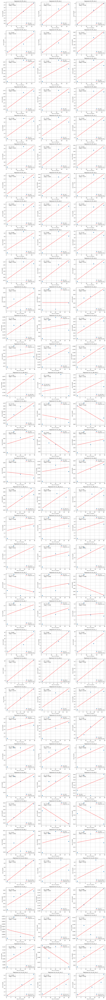

In [29]:
#individual samples, up to 30 days of incubation
# Group data by replicate
grouped = corr_data_cut_DW_short.groupby('Name')

# Store slopes and intercepts for each replicate
slopes = []
intercepts = []
results_DW_short = {}


# Calculate the number of rows needed for 3 columns
num_plots = len(grouped)
num_rows = (num_plots + 2) // 3  # Round up to the nearest integer

# Create subplots with 3 columns
fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 4))  # Adjust figsize as needed

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot data and regression for each name
plot_index = 0
# Iterate through each replicate and perform regression
for name, group in grouped:
    X = group['Days of incubation'].values.reshape(-1, 1)  # Reshape for scikit-learn
    y = group['total CO2/gDW']
    model = LinearRegression().fit(X, y)

    y_pred = model.predict(X)
    r_squared = r2_score(y, y_pred)

    results_DW_short[name] = (model.coef_[0], model.intercept_, r_squared)

    # Plot on the current subplot
    ax = axes[plot_index]
    ax.scatter(X, y, label=name)
    ax.plot(X, y_pred, color='red', label='Regression Line')

    # Display R² and slope
    ax.text(0.1, 0.9, f"R² = {r_squared:.3f}", transform=ax.transAxes, fontsize=10)
    ax.text(0.1, 0.85, f"Slope = {model.coef_[0]:.3f}", transform=ax.transAxes, fontsize=10)

    ax.set_xlabel('Days of Incubation', fontsize=8)
    ax.set_ylabel('total CO2/gDW', fontsize=8)
    ax.set_title(f'Regression for {name}', fontsize=10)
    ax.legend(fontsize=8)
    ax.grid(True)

    plot_index += 1

# Hide any extra subplots
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

In [30]:
results_df_DW_short = pd.DataFrame(results_DW_short).T.reset_index()
results_df_DW_short.columns = ['Name', 'Slope', 'Intercept', 'r_squared']
results_df_DW_short

,Name,Slope,Intercept,r_squared
0,BTL_dA_1,0.061964,0.459039,0.999969
1,BTL_dA_2,0.162053,1.107077,0.971325
2,BTL_dA_3,0.186445,1.046274,0.995014
3,BTL_dA_4,0.179119,0.218018,0.929421
4,BTL_dA_5,0.150460,0.131485,0.963464
...,...,...,...,...
100,SL4_dC_8,-0.000632,0.091316,0.557800
101,SL4_dC_9,0.003279,0.091953,0.668041
102,SL4_dC_inoc_1,0.036506,1.139373,0.832437
103,SL4_dC_inoc_2,0.036410,1.108669,0.792584


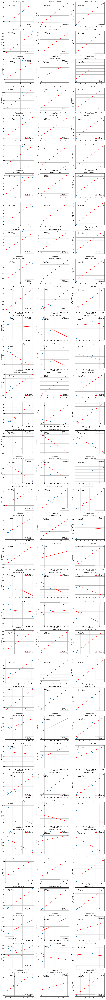

In [31]:
#lin reg individual samples
# Group data by replicate
grouped = corr_data_cut.groupby('Name')

# Store slopes and intercepts for each replicate
slopes = []
intercepts = []
results = {}


# Calculate the number of rows needed for 3 columns
num_plots = len(grouped)
num_rows = (num_plots + 2) // 3  # Round up to the nearest integer

# Create subplots with 3 columns
fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 4))  # Adjust figsize as needed

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot data and regression for each name
plot_index = 0
# Iterate through each replicate and perform regression
for name, group in grouped:
    X = group['Days of incubation'].values.reshape(-1, 1)  # Reshape for scikit-learn
    y = group['total CO2/gDOC']
    model = LinearRegression().fit(X, y)

    y_pred = model.predict(X)
    r_squared = r2_score(y, y_pred)

    results[name] = (model.coef_[0], model.intercept_, r_squared)

    # Plot on the current subplot
    ax = axes[plot_index]
    ax.scatter(X, y, label=name)
    ax.plot(X, y_pred, color='red', label='Regression Line')

    # Display R² and slope
    ax.text(0.1, 0.9, f"R² = {r_squared:.3f}", transform=ax.transAxes, fontsize=10)
    ax.text(0.1, 0.85, f"Slope = {model.coef_[0]:.3f}", transform=ax.transAxes, fontsize=10)

    ax.set_xlabel('Days of Incubation', fontsize=8)
    ax.set_ylabel('total CO2/gDOC', fontsize=8)
    ax.set_title(f'Regression for {name}', fontsize=10)
    ax.legend(fontsize=8)
    ax.grid(True)

    plot_index += 1

# Hide any extra subplots
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()  # Adjust spacing between subplots
# plt.show()


In [32]:
results_df = pd.DataFrame(results).T.reset_index()
results_df.columns = ['Name', 'Slope', 'Intercept', 'r_squared']
results_df

,Name,Slope,Intercept,r_squared
0,BTL_dA_1,1.694030,12.549727,0.999969
1,BTL_dA_2,4.430403,30.266533,0.971325
2,BTL_dA_3,5.097257,28.604241,0.995014
3,BTL_dA_4,4.896951,5.960414,0.929421
4,BTL_dA_5,4.113461,3.594700,0.963464
...,...,...,...,...
100,SL4_dC_8,-0.000710,1.690351,0.035615
101,SL4_dC_9,-0.000776,2.559627,0.004454
102,SL4_dC_inoc_1,0.125671,9.658907,0.646527
103,SL4_dC_inoc_2,0.050345,10.476764,0.125919


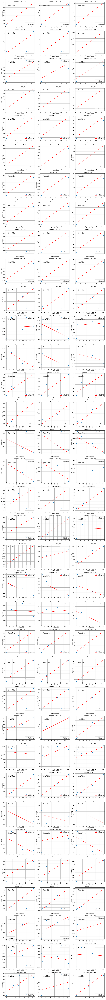

In [33]:
#lin reg individual samples
# Group data by replicate
grouped = corr_data_cut_DW.groupby('Name')

# Store slopes and intercepts for each replicate
slopes = []
intercepts = []
results_DW = {}


# Calculate the number of rows needed for 3 columns
num_plots = len(grouped)
num_rows = (num_plots + 2) // 3  # Round up to the nearest integer

# Create subplots with 3 columns
fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 4))  # Adjust figsize as needed

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot data and regression for each name
plot_index = 0
# Iterate through each replicate and perform regression
for name, group in grouped:
    X = group['Days of incubation'].values.reshape(-1, 1)  # Reshape for scikit-learn
    y = group['total CO2/gDW']
    model = LinearRegression().fit(X, y)

    y_pred = model.predict(X)
    r_squared = r2_score(y, y_pred)

    results_DW[name] = (model.coef_[0], model.intercept_, r_squared)

    # Plot on the current subplot
    ax = axes[plot_index]
    ax.scatter(X, y, label=name)
    ax.plot(X, y_pred, color='red', label='Regression Line')

    # Display R² and slope
    ax.text(0.1, 0.9, f"R² = {r_squared:.3f}", transform=ax.transAxes, fontsize=10)
    ax.text(0.1, 0.85, f"Slope = {model.coef_[0]:.3f}", transform=ax.transAxes, fontsize=10)

    ax.set_xlabel('Days of Incubation', fontsize=8)
    ax.set_ylabel('total CO2/gDW', fontsize=8)
    ax.set_title(f'Regression for {name}', fontsize=10)
    ax.legend(fontsize=8)
    ax.grid(True)

    plot_index += 1

# Hide any extra subplots
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

In [34]:
results_df_DW = pd.DataFrame(results_DW).T.reset_index()
results_df_DW.columns = ['Name', 'Slope', 'Intercept', 'r_squared']
results_df_DW

,Name,Slope,Intercept,r_squared
0,BTL_dA_1,0.061964,0.459039,0.999969
1,BTL_dA_2,0.162053,1.107077,0.971325
2,BTL_dA_3,0.186445,1.046274,0.995014
3,BTL_dA_4,0.179119,0.218018,0.929421
4,BTL_dA_5,0.150460,0.131485,0.963464
...,...,...,...,...
100,SL4_dC_8,-0.000037,0.087482,0.035615
101,SL4_dC_9,-0.000040,0.132471,0.004454
102,SL4_dC_inoc_1,0.018505,1.422277,0.646527
103,SL4_dC_inoc_2,0.007510,1.562851,0.125919


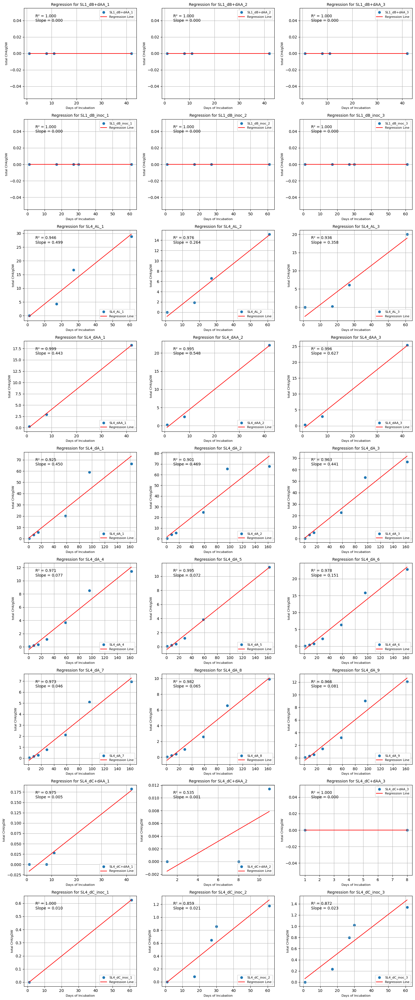

In [35]:
#lin reg individual samples CH4
# Group data by replicate
grouped = corr_data_cut_CH4_DW.groupby('Name')

# Store slopes and intercepts for each replicate
slopes = []
intercepts = []
results_CH4_DW = {}


# Calculate the number of rows needed for 3 columns
num_plots = len(grouped)
num_rows = (num_plots + 2) // 3  # Round up to the nearest integer

# Create subplots with 3 columns
fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 4))  # Adjust figsize as needed

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot data and regression for each name
plot_index = 0
# Iterate through each replicate and perform regression
for name, group in grouped:
    X = group['Days of incubation'].values.reshape(-1, 1)  # Reshape for scikit-learn
    y = group['total CH4/gDW']
    model = LinearRegression().fit(X, y)

    y_pred = model.predict(X)
    r_squared = r2_score(y, y_pred)

    results_CH4_DW[name] = (model.coef_[0], model.intercept_, r_squared)

    # Plot on the current subplot
    ax = axes[plot_index]
    ax.scatter(X, y, label=name)
    ax.plot(X, y_pred, color='red', label='Regression Line')

    # Display R² and slope
    ax.text(0.1, 0.9, f"R² = {r_squared:.3f}", transform=ax.transAxes, fontsize=10)
    ax.text(0.1, 0.85, f"Slope = {model.coef_[0]:.3f}", transform=ax.transAxes, fontsize=10)

    ax.set_xlabel('Days of Incubation', fontsize=8)
    ax.set_ylabel('total CH4/gDW', fontsize=8)
    ax.set_title(f'Regression for {name}', fontsize=10)
    ax.legend(fontsize=8)
    ax.grid(True)

    plot_index += 1

# Hide any extra subplots
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

In [36]:
results_df_CH4_DW = pd.DataFrame(results_CH4_DW).T.reset_index()
results_df_CH4_DW.columns = ['Name', 'Slope', 'Intercept', 'r_squared']
results_df_CH4_DW

,Name,Slope,Intercept,r_squared
0,SL1_dB+dAA_1,0.000000,0.000000,1.000000
1,SL1_dB+dAA_2,0.000000,0.000000,1.000000
2,SL1_dB+dAA_3,0.000000,0.000000,1.000000
3,SL1_dB_inoc_1,0.000000,0.000000,1.000000
4,SL1_dB_inoc_2,0.000000,0.000000,1.000000
5,SL1_dB_inoc_3,0.000000,0.000000,1.000000
6,SL4_AL_1,0.499483,-0.773319,0.945573
7,SL4_AL_2,0.263632,-1.081542,0.975663
8,SL4_AL_3,0.358470,-2.902267,0.936352
9,SL4_dAA_1,0.442803,-0.381181,0.999363


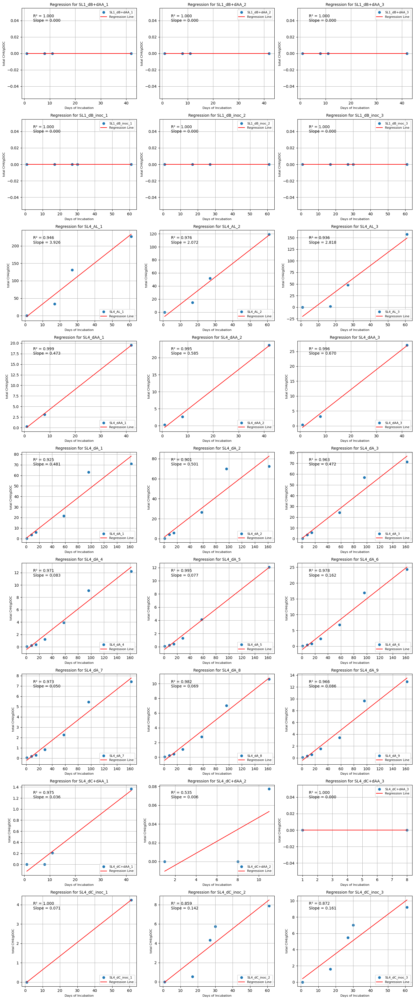

In [37]:
#lin reg individual samples CH4
# Group data by replicate
grouped = corr_data_cut_CH4.groupby('Name')

# Store slopes and intercepts for each replicate
slopes = []
intercepts = []
results_CH4 = {}


# Calculate the number of rows needed for 3 columns
num_plots = len(grouped)
num_rows = (num_plots + 2) // 3  # Round up to the nearest integer

# Create subplots with 3 columns
fig, axes = plt.subplots(num_rows, 3, figsize=(15, num_rows * 4))  # Adjust figsize as needed

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Plot data and regression for each name
plot_index = 0
# Iterate through each replicate and perform regression
for name, group in grouped:
    X = group['Days of incubation'].values.reshape(-1, 1)  # Reshape for scikit-learn
    y = group['total CH4/gDOC']
    model = LinearRegression().fit(X, y)

    y_pred = model.predict(X)
    r_squared = r2_score(y, y_pred)

    results_CH4[name] = (model.coef_[0], model.intercept_, r_squared)

    # Plot on the current subplot
    ax = axes[plot_index]
    ax.scatter(X, y, label=name)
    ax.plot(X, y_pred, color='red', label='Regression Line')

    # Display R² and slope
    ax.text(0.1, 0.9, f"R² = {r_squared:.3f}", transform=ax.transAxes, fontsize=10)
    ax.text(0.1, 0.85, f"Slope = {model.coef_[0]:.3f}", transform=ax.transAxes, fontsize=10)

    ax.set_xlabel('Days of Incubation', fontsize=8)
    ax.set_ylabel('total CH4/gDOC', fontsize=8)
    ax.set_title(f'Regression for {name}', fontsize=10)
    ax.legend(fontsize=8)
    ax.grid(True)

    plot_index += 1

# Hide any extra subplots
for i in range(plot_index, len(axes)):
    axes[i].axis('off')

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

In [38]:
results_df_CH4 = pd.DataFrame(results_CH4).T.reset_index()
results_df_CH4.columns = ['Name', 'Slope', 'Intercept', 'r_squared']
results_df_CH4

,Name,Slope,Intercept,r_squared
0,SL1_dB+dAA_1,0.000000,0.000000,1.000000
1,SL1_dB+dAA_2,0.000000,0.000000,1.000000
2,SL1_dB+dAA_3,0.000000,0.000000,1.000000
3,SL1_dB_inoc_1,0.000000,0.000000,1.000000
4,SL1_dB_inoc_2,0.000000,0.000000,1.000000
5,SL1_dB_inoc_3,0.000000,0.000000,1.000000
6,SL4_AL_1,3.926126,-6.078589,0.945573
7,SL4_AL_2,2.072249,-8.501333,0.975663
8,SL4_AL_3,2.817713,-22.812938,0.936352
9,SL4_dAA_1,0.473060,-0.407227,0.999363


In [39]:
#make sets
sample_sets = {
    'SL1_dA_25C': ['SL1_dA_1', 'SL1_dA_2', 'SL1_dA_3'],
    'SL1_dA_6C': ['SL1_dA_4', 'SL1_dA_5', 'SL1_dA_6'],
    'SL1_dA_2C': ['SL1_dA_7', 'SL1_dA_8', 'SL1_dA_9'],
    'SL1_dB_25C': ['SL1_dB_1', 'SL1_dB_2', 'SL1_dB_3'],
    'SL1_dB_6C': ['SL1_dB_4', 'SL1_dB_5', 'SL1_dB_6'],
    'SL1_dB_2C': ['SL1_dB_7', 'SL1_dB_8', 'SL1_dB_9'],
    'SL1_dC_25C': ['SL1_dC_1', 'SL1_dC_2', 'SL1_dC_3'],
    'SL1_dC_6C': ['SL1_dC_4', 'SL1_dC_5', 'SL1_dC_6'],
    'SL1_dC_2C': ['SL1_dC_7', 'SL1_dC_8', 'SL1_dC_9'],
    'SL1_dC_25C_wet': ['SL1_dC_10', 'SL1_dC_11', 'SL1_dC_12'],
    'SL4_dA_25C': ['SL4_dA_1', 'SL4_dA_2', 'SL4_dA_3'],
    'SL4_dA_6C': ['SL4_dA_4', 'SL4_dA_5', 'SL4_dA_6'],
    'SL4_dA_2C': ['SL4_dA_7', 'SL4_dA_8', 'SL4_dA_9'],
    'SL4_dB_25C': ['SL4_dB_1', 'SL4_dB_2', 'SL4_dB_3'],
    'SL4_dB_6C': ['SL4_dB_4', 'SL4_dB_5', 'SL4_dB_6'],
    'SL4_dB_2C': ['SL4_dB_7', 'SL4_dB_8', 'SL4_dB_9'],
    'SL4_dC_25C': ['SL4_dC_1', 'SL4_dC_2', 'SL4_dC_3'],
    'SL4_dC_6C': ['SL4_dC_4', 'SL4_dC_5', 'SL4_dC_6'],
    'SL4_dC_2C': ['SL4_dC_7', 'SL4_dC_8', 'SL4_dC_9'],
    'BTL_dA_25C': ['BTL_dA_1', 'BTL_dA_2', 'BTL_dA_3'],
    'BTL_dA_6C': ['BTL_dA_4', 'BTL_dA_5', 'BTL_dA_6'],
    'BTL_dB_25C': ['BTL_dB_1', 'BTL_dB_2', 'BTL_dB_3'],
    'BTL_dB_6C': ['BTL_dB_4', 'BTL_dB_5', 'BTL_dB_6'],
    'BTL_dC_25C': ['BTL_dC_1', 'BTL_dC_2', 'BTL_dC_3'],
    'BTL_dC_6C': ['BTL_dC_4', 'BTL_dC_5', 'BTL_dC_6'],
    'BTL_dD_25C': ['BTL_dD_1', 'BTL_dD_2', 'BTL_dD_3'],
    'BTL_dD_6C': ['BTL_dD_4', 'BTL_dD_5', 'BTL_dD_6'],
    'BTL_dE_25C': ['BTL_dE_1', 'BTL_dE_2', 'BTL_dE_3'],
    'BTL_dE_6C': ['BTL_dE_4', 'BTL_dE_5', 'BTL_dE_6'],
    'SL4_dC+dAA_25C': ['SL4_dC+dAA_1', 'SL4_dC+dAA_2', 'SL4_dC+dAA_3'],
    'SL1_dB+dAA_25C': ['SL1_dB+dAA_1', 'SL1_dB+dAA_2', 'SL1_dB+dAA_3'],
    'SL1_dC_inoc_25C': ['SL1_dC_inoc_1', 'SL1_dC_inoc_2', 'SL1_dC_inoc_3'],
    'SL4_dC_inoc_25C': ['SL4_dC_inoc_1', 'SL4_dC_inoc_2', 'SL4_dC_inoc_3'],
    'SL4_dAA_25C': ['SL4_dAA_1', 'SL4_dAA_2', 'SL4_dAA_3'],
    'SL4_AL_25C': ['SL4_AL_1', 'SL4_AL_2', 'SL4_AL_3']
}

#empty list
averaged_dfs = []

# Loop through each sample set
for new_name, sample_names in sample_sets.items():
    filtered_df = results_df[results_df['Name'].isin(sample_names)]

    # Calculate average, standard deviation, and standard error
    averaged_values = filtered_df[['Slope', 'Intercept', 'r_squared']].agg(['mean', 'std'])

    # Reshape and rename columns
    averaged_values = averaged_values.T.reset_index()
    averaged_values.columns = ['metric', 'mean', 'std']
    averaged_values['SE'] = averaged_values['std'] / np.sqrt(len(sample_names))
    averaged_values['Name'] = new_name

    # Append to the list of averaged DataFrames
    averaged_dfs.append(averaged_values)

# Concatenate all averaged DataFrames
final_averaged_df = pd.concat(averaged_dfs)

# Pivot the final DataFrame to have metrics as columns
final_averaged_df = final_averaged_df.pivot(index='Name', columns='metric', values=['mean', 'std', 'SE'])
final_averaged_df.columns = ['_'.join(col) for col in final_averaged_df.columns]
final_averaged_df = final_averaged_df.reset_index()

# Print the final_averaged_df
final_averaged_df.reset_index(drop=True, inplace=True)
final_averaged_df

,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared
0,BTL_dA_25C,23.806834,3.740563,0.988769,9.784306,1.803440,0.015309,5.648972,1.041217,0.008839
1,BTL_dA_6C,6.290123,3.579349,0.955286,2.874495,1.650788,0.022899,1.659590,0.953083,0.013221
2,BTL_dB_25C,3.868787,0.108719,0.568403,0.218484,0.018895,0.082492,0.126142,0.010909,0.047627
3,BTL_dB_6C,2.681720,0.108332,0.837131,0.767002,0.042871,0.057263,0.442829,0.024751,0.033061
4,BTL_dC_25C,35.000101,2.140562,0.756682,1.227069,0.280960,0.077320,0.708449,0.162212,0.044641
5,BTL_dC_6C,15.060213,1.169276,0.846819,2.082282,0.216179,0.096683,1.202206,0.124811,0.055820
6,BTL_dD_25C,19.697025,0.752470,0.801861,2.146008,0.202615,0.073589,1.238998,0.116980,0.042487
7,BTL_dD_6C,10.769777,0.382734,0.839210,1.983610,0.148627,0.058762,1.145238,0.085810,0.033926
8,BTL_dE_25C,21.839541,1.114091,0.674716,0.682926,0.107002,0.071480,0.394288,0.061778,0.041269
9,BTL_dE_6C,8.063337,0.665327,0.872871,1.389508,0.221261,0.073499,0.802233,0.127745,0.042435


In [40]:
#empty list
averaged_dfs_CH4 = []

# Loop through each sample set
for new_name, sample_names in sample_sets.items():
    filtered_df_CH4 = results_df_CH4[results_df_CH4['Name'].isin(sample_names)]

    # Calculate average, standard deviation, and standard error
    averaged_values_CH4 = filtered_df_CH4[['Slope', 'Intercept', 'r_squared']].agg(['mean', 'std'])

    # Reshape and rename columns
    averaged_values_CH4 = averaged_values_CH4.T.reset_index()
    averaged_values_CH4.columns = ['metric', 'mean', 'std']
    averaged_values_CH4['SE'] = averaged_values_CH4['std'] / np.sqrt(len(sample_names))
    averaged_values_CH4['Name'] = new_name

    # Append to the list of averaged DataFrames
    averaged_dfs_CH4.append(averaged_values_CH4)

# Concatenate all averaged DataFrames
final_averaged_df_CH4 = pd.concat(averaged_dfs_CH4)

# Pivot the final DataFrame to have metrics as columns
final_averaged_df_CH4 = final_averaged_df_CH4.pivot(index='Name', columns='metric', values=['mean', 'std', 'SE'])
final_averaged_df_CH4.columns = ['_'.join(col) for col in final_averaged_df_CH4.columns]
final_averaged_df_CH4 = final_averaged_df_CH4.reset_index()

# Print the final_averaged_df
final_averaged_df_CH4.reset_index(drop=True, inplace=True)
final_averaged_df_CH4 = final_averaged_df_CH4.dropna()
final_averaged_df_CH4

,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared
13,SL1_dB+dAA_25C,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
22,SL4_AL_25C,-12.464286,2.938696,0.952529,9.043692,0.932841,0.020558,5.221378,0.538576,0.011869
23,SL4_dAA_25C,-0.897000,0.576163,0.996854,0.430035,0.098816,0.002178,0.248281,0.057052,0.001258
24,SL4_dA_25C,0.703318,0.484500,0.929735,0.635927,0.015312,0.031316,0.367152,0.008840,0.018080
25,SL4_dA_2C,-0.407338,0.068446,0.973878,0.134160,0.018428,0.007962,0.077457,0.010639,0.004597
26,SL4_dA_6C,-0.700499,0.107150,0.981296,0.390736,0.047370,0.012710,0.225592,0.027349,0.007338
30,SL4_dC+dAA_25C,-0.058383,0.013988,0.836541,0.087125,0.018992,0.261610,0.050302,0.010965,0.151041
34,SL4_dC_inoc_25C,0.008854,0.124600,0.910408,0.230510,0.047604,0.077841,0.133085,0.027484,0.044942


In [41]:
#empty list
averaged_dfs_DW_short = []

# Loop through each sample set
for new_name, sample_names in sample_sets.items():
    filtered_df_DW_short = results_df_DW_short[results_df_DW_short['Name'].isin(sample_names)]

    # Calculate average, standard deviation, and standard error
    averaged_values_DW_short = filtered_df_DW_short[['Slope', 'Intercept', 'r_squared']].agg(['mean', 'std'])

    # Reshape and rename columns
    averaged_values_DW_short = averaged_values_DW_short.T.reset_index()
    averaged_values_DW_short.columns = ['metric', 'mean', 'std']
    averaged_values_DW_short['SE'] = averaged_values_DW_short['std'] / np.sqrt(len(sample_names))
    averaged_values_DW_short['Name'] = new_name

    # Append to the list of averaged DataFrames
    averaged_dfs_DW_short.append(averaged_values_DW_short)

# Concatenate all averaged DataFrames
final_averaged_df_DW_short = pd.concat(averaged_dfs_DW_short)

# Pivot the final DataFrame to have metrics as columns
final_averaged_df_DW_short = final_averaged_df_DW_short.pivot(index='Name', columns='metric', values=['mean', 'std', 'SE'])
final_averaged_df_DW_short.columns = ['_'.join(col) for col in final_averaged_df_DW_short.columns]
final_averaged_df_DW_short = final_averaged_df_DW_short.reset_index()

# Print the final_averaged_df
final_averaged_df_DW_short.reset_index(drop=True, inplace=True)
final_averaged_df_DW_short

,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared
0,BTL_dA_25C,0.870796,0.136821,0.988769,0.357886,0.065965,0.015309,0.206626,0.038085,0.008839
1,BTL_dA_6C,0.230077,0.130924,0.955286,0.105142,0.060382,0.022899,0.060704,0.034861,0.013221
2,BTL_dB_25C,1.667077,0.046847,0.568403,0.094146,0.008142,0.082492,0.054355,0.004701,0.047627
3,BTL_dB_6C,1.155565,0.046681,0.837131,0.330505,0.018473,0.057263,0.190817,0.010665,0.033061
4,BTL_dC_25C,1.558172,0.095296,0.756682,0.054628,0.012508,0.077320,0.031539,0.007222,0.044641
5,BTL_dC_6C,0.670467,0.052055,0.846819,0.092701,0.009624,0.096683,0.053521,0.005556,0.055820
6,BTL_dD_25C,1.608157,0.061435,0.801861,0.175210,0.016542,0.073589,0.101158,0.009551,0.042487
7,BTL_dD_6C,0.879295,0.031248,0.839210,0.161951,0.012135,0.058762,0.093503,0.007006,0.033926
8,BTL_dE_25C,1.950478,0.099499,0.674716,0.060992,0.009556,0.071480,0.035214,0.005517,0.041269
9,BTL_dE_6C,0.720133,0.059420,0.872871,0.124096,0.019761,0.073499,0.071647,0.011409,0.042435


In [42]:
#empty list
averaged_dfs_DW = []

# Loop through each sample set
for new_name, sample_names in sample_sets.items():
    filtered_df_DW = results_df_DW[results_df_DW['Name'].isin(sample_names)]

    # Calculate average, standard deviation, and standard error
    averaged_values_DW = filtered_df_DW[['Slope', 'Intercept', 'r_squared']].agg(['mean', 'std'])

    # Reshape and rename columns
    averaged_values_DW = averaged_values_DW.T.reset_index()
    averaged_values_DW.columns = ['metric', 'mean', 'std']
    averaged_values_DW['SE'] = averaged_values_DW['std'] / np.sqrt(len(sample_names))
    averaged_values_DW['Name'] = new_name

    # Append to the list of averaged DataFrames
    averaged_dfs_DW.append(averaged_values_DW)

# Concatenate all averaged DataFrames
final_averaged_df_DW = pd.concat(averaged_dfs_DW)

# Pivot the final DataFrame to have metrics as columns
final_averaged_df_DW = final_averaged_df_DW.pivot(index='Name', columns='metric', values=['mean', 'std', 'SE'])
final_averaged_df_DW.columns = ['_'.join(col) for col in final_averaged_df_DW.columns]
final_averaged_df_DW = final_averaged_df_DW.reset_index()

# Print the final_averaged_df
final_averaged_df_DW.reset_index(drop=True, inplace=True)
final_averaged_df_DW

,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared
0,BTL_dA_25C,0.870796,0.136821,0.988769,0.357886,0.065965,0.015309,0.206626,0.038085,0.008839
1,BTL_dA_6C,0.230077,0.130924,0.955286,0.105142,0.060382,0.022899,0.060704,0.034861,0.013221
2,BTL_dB_25C,1.667077,0.046847,0.568403,0.094146,0.008142,0.082492,0.054355,0.004701,0.047627
3,BTL_dB_6C,1.155565,0.046681,0.837131,0.330505,0.018473,0.057263,0.190817,0.010665,0.033061
4,BTL_dC_25C,1.558172,0.095296,0.756682,0.054628,0.012508,0.077320,0.031539,0.007222,0.044641
5,BTL_dC_6C,0.670467,0.052055,0.846819,0.092701,0.009624,0.096683,0.053521,0.005556,0.055820
6,BTL_dD_25C,1.608157,0.061435,0.801861,0.175210,0.016542,0.073589,0.101158,0.009551,0.042487
7,BTL_dD_6C,0.879295,0.031248,0.839210,0.161951,0.012135,0.058762,0.093503,0.007006,0.033926
8,BTL_dE_25C,1.950478,0.099499,0.674716,0.060992,0.009556,0.071480,0.035214,0.005517,0.041269
9,BTL_dE_6C,0.720133,0.059420,0.872871,0.124096,0.019761,0.073499,0.071647,0.011409,0.042435


In [43]:
#empty list
averaged_dfs_CH4_DW = []

# Loop through each sample set
for new_name, sample_names in sample_sets.items():
    filtered_df_CH4_DW = results_df_CH4_DW[results_df_CH4_DW['Name'].isin(sample_names)]

    # Calculate average, standard deviation, and standard error
    averaged_values_CH4_DW = filtered_df_CH4_DW[['Slope', 'Intercept', 'r_squared']].agg(['mean', 'std'])

    # Reshape and rename columns
    averaged_values_CH4_DW = averaged_values_CH4_DW.T.reset_index()
    averaged_values_CH4_DW.columns = ['metric', 'mean', 'std']
    averaged_values_CH4_DW['SE'] = averaged_values_CH4_DW['std'] / np.sqrt(len(sample_names))
    averaged_values_CH4_DW['Name'] = new_name

    # Append to the list of averaged DataFrames
    averaged_dfs_CH4_DW.append(averaged_values_CH4_DW)

# Concatenate all averaged DataFrames
final_averaged_df_CH4_DW = pd.concat(averaged_dfs_CH4_DW)

# Pivot the final DataFrame to have metrics as columns
final_averaged_df_CH4_DW = final_averaged_df_CH4_DW.pivot(index='Name', columns='metric', values=['mean', 'std', 'SE'])
final_averaged_df_CH4_DW.columns = ['_'.join(col) for col in final_averaged_df_CH4_DW.columns]
final_averaged_df_CH4_DW = final_averaged_df_CH4_DW.reset_index()

# Print the final_averaged_df
final_averaged_df_CH4_DW.reset_index(drop=True, inplace=True)
final_averaged_df_CH4_DW = final_averaged_df_CH4_DW.dropna()
final_averaged_df_CH4_DW

,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared
13,SL1_dB+dAA_25C,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
22,SL4_AL_25C,-1.585709,0.373862,0.952529,1.150541,0.118676,0.020558,0.664265,0.068518,0.011869
23,SL4_dAA_25C,-0.839628,0.539312,0.996854,0.402530,0.092496,0.002178,0.232401,0.053403,0.001258
24,SL4_dA_25C,0.658373,0.453538,0.929735,0.595288,0.014333,0.031316,0.343690,0.008275,0.018080
25,SL4_dA_2C,-0.381308,0.064072,0.973878,0.125587,0.017250,0.007962,0.072508,0.009960,0.004597
26,SL4_dA_6C,-0.655733,0.100303,0.981296,0.365766,0.044343,0.012710,0.211175,0.025601,0.007338
30,SL4_dC+dAA_25C,-0.007881,0.001899,0.836541,0.011593,0.002522,0.261610,0.006693,0.001456,0.151041
34,SL4_dC_inoc_25C,0.001042,0.018347,0.910408,0.033815,0.006960,0.077841,0.019523,0.004018,0.044942


In [44]:
#assign avg depths to each sample
depth_mapping = {
    'SL1_dA_25C': 79.5,
    'SL1_dA_6C': 79.5,
    'SL1_dA_2C': 79.5,
    'SL1_dB_25C': 179,
    'SL1_dB_6C': 179,
    'SL1_dB_2C': 179,
    'SL1_dC_25C': 302,
    'SL1_dC_6C': 302,
    'SL1_dC_2C': 302,
    'SL1_dC_25C_wet': 302,
    'SL4_dA_25C': 68.5,
    'SL4_dA_6C': 68.5,
    'SL4_dA_2C': 68.5,
    'SL4_dB_25C': 117.5,
    'SL4_dB_6C': 117.5,
    'SL4_dB_2C': 117.5,
    'SL4_dC_25C': 289,
    'SL4_dC_6C': 289,
    'SL4_dC_2C': 289,
    'SL4_AL_25C': 109.5,
    'SL4_dAA_25C': 79.5,
    'BTL_dA_25C': 62.5,
    'BTL_dA_6C': 62.5,
    'BTL_dB_25C': 212.5,
    'BTL_dB_6C': 212.5,
    'BTL_dC_25C': 370,
    'BTL_dC_6C': 370,
    'BTL_dD_25C': 543.5,
    'BTL_dD_6C': 543.5,
    'BTL_dE_25C': 777.5,
    'BTL_dE_6C': 777.5,
}

final_averaged_df['depth (cm)'] = final_averaged_df['Name'].map(depth_mapping)
final_averaged_df_CH4['depth (cm)'] = final_averaged_df_CH4['Name'].map(depth_mapping)
final_averaged_df_DW_short['depth (cm)'] = final_averaged_df_DW_short['Name'].map(depth_mapping)
final_averaged_df_DW['depth (cm)'] = final_averaged_df_DW['Name'].map(depth_mapping)
final_averaged_df_CH4_DW['depth (cm)'] = final_averaged_df_CH4_DW['Name'].map(depth_mapping)

In [45]:
# sorted_df_CH4
C_DOC_CH4 = C_DOC[['Name', 'incubation time', 'total CH4/mgC']]
C_DOC_CO2 = C_DOC[['Name', 'incubation time', 'total CO2/mgC']]

CH4_names_to_keep = ['SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C', 'SL4_AL_25C', 'SL4_dAA_25C'] #, 'SL4_dAA_25C'
CO2_names_to_drop = ['SL1_d0_25C','SL1_d0_6C','SL4_d0_25C','SL4_d0_6C','SL1_dB_inoc_25C', 'SL4_dC_inoc_25', 'SL1_dB+dAA_25C', 'SL4_dC+dAA_25C']

#do some sliming
C_DOC_CH4_slim = C_DOC_CH4[C_DOC_CH4['Name'].isin(CH4_names_to_keep)]
C_DOC_CO2_slim = C_DOC_CO2[~C_DOC_CO2['Name'].isin(CO2_names_to_drop)]

sorted_df_CH4_slim = sorted_df_CH4[['Name', 'incubation time', 'total CH4/gC']]
sorted_df_CH4_slim = sorted_df_CH4_slim[sorted_df_CH4_slim['Name'].isin(CH4_names_to_keep)]

CO2_gDW_slim = CO2_gDW[['Name', 'incubation time', 'total CO2/g']]
CO2_gDW_slim  = CO2_gDW_slim [~CO2_gDW_slim ['Name'].isin(CO2_names_to_drop)]

resp_CO2_hilman_slim = resp_CO2_hilman[['Name', 'incubation time', 'total CO2/gC']]
resp_CO2_hilman_slim = resp_CO2_hilman_slim[~resp_CO2_hilman_slim['Name'].isin(CO2_names_to_drop)]

sorted_df_C_slim = sorted_df_C[['Name', 'incubation time', 'total CO2']]
sorted_df_C_slim = sorted_df_C_slim[~sorted_df_C_slim['Name'].isin(CO2_names_to_drop)]

#lin reg graphs

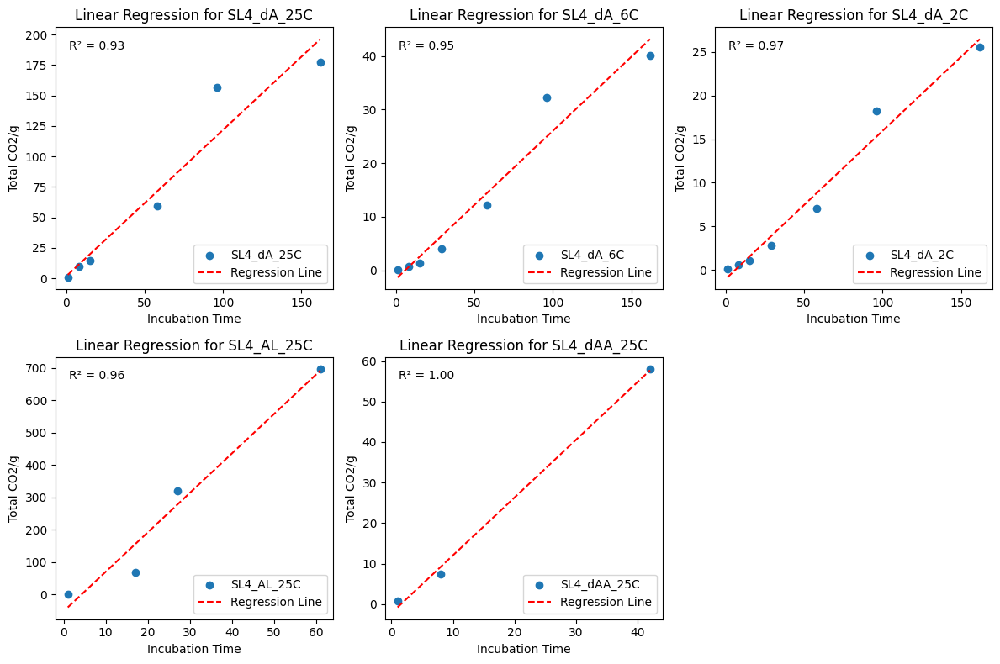

In [46]:
#CH4 per g DOC
#Get unique Names
unique_names = sorted_df_CH4_slim['Name'].unique()
CH4_TOC_results = []

# Create a figure and subplots
num_plots = len(unique_names)
num_cols = 3  # Number of columns
num_rows = int(np.ceil(num_plots / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))  # Adjust figsize as needed
axes = axes.flatten()

# Loop through unique Names and create/clean/regress/plot DataFrames
for i, name in enumerate(unique_names):
    # Filter data for the current Name
    filtered_data = sorted_df_CH4_slim[sorted_df_CH4_slim['Name'] == name]

    # Create new DataFrame with incubation time and total CO2/gC
    new_df = filtered_data[['incubation time', 'total CH4/gC']].copy()
    new_df.columns = ['incubation time', 'total CH4/gC']  # Rename columns

    # Remove rows with NaN in 'Total CO2/gC'
    new_df = new_df.dropna(subset=['total CH4/gC'])

    # Check if DataFrame is empty
    if new_df.empty:
        print(f"Skipping empty DataFrame for {name}\n")
        continue  # Skip to the next iteration

        # Perform linear regression
    X = new_df['incubation time'].values.reshape(-1, 1)  # Reshape X to a 2D array
    y = new_df['total CH4/gC'].values
    reg = LinearRegression().fit(X, y)

    # Get regression coefficients
    slope = reg.coef_[0]
    intercept = reg.intercept_

    # Calculate R-squared
    r_squared = r2_score(y, reg.predict(X))  # Calculate R^2

    # Print or store regression results
    #print(f"Linear Regression for {name}:")
    # print(f"Slope: {slope}")
    # print(f"Intercept: {intercept}\n")
    #print(f"R-squared: {r_squared}\n")  # Print R^2

    # Optionally, store regression results in the DataFrame
    new_df.loc[:, 'Regression Slope'] = slope
    new_df.loc[:,'Regression Intercept'] = intercept
    new_df.loc[:,'R-squared'] = r_squared  # Store R^2 in the DataFrame
    new_df.loc[:, 'Name'] = name

    # Assign the new DataFrame to a variable with the Name
    #globals()[f'{name}_df'] = new_df
    CH4_TOC_results.append(new_df)

    # Plot the data and regression line
    ax = axes[i]  # Get the current subplot axis
    ax.scatter(new_df['incubation time'], new_df['total CH4/gC'], label=name)
    ax.plot(new_df['incubation time'], reg.predict(X), linestyle='--', color='red', label='Regression Line')

    # Add R-squared to the subplot
    axes[i].text(0.05, 0.95, f"R² = {r_squared:.2f}", transform=axes[i].transAxes, va='top') # Print R^2 on subplot

    # Set plot labels and title
    ax.set_xlabel('Incubation Time')
    ax.set_ylabel('Total CO2/g')
    ax.set_title(f'Linear Regression for {name}')
    # ax.set_ylim(0, 200)
    ax.legend()

# Hide any extra empty subplots
for j in range(num_plots, num_rows * num_cols):
    axes[j].set_visible(False)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

CH4_TOC_results_final = pd.concat(CH4_TOC_results, ignore_index=True)

In [47]:
resp_CO2_hilman

,Name,incubation time,total CO2/gC,SE CO2/gC
0,BTL_dA_25C,1,22.392714,4.823045
1,BTL_dA_25C,8,NaN,NaN
2,BTL_dA_25C,11,NaN,NaN
3,BTL_dA_25C,15,NaN,NaN
4,BTL_dA_25C,17,81.936872,22.443287
...,...,...,...,...
736,SL4_dC_inoc_25C,88,NaN,NaN
737,SL4_dC_inoc_25C,96,NaN,NaN
738,SL4_dC_inoc_25C,134,NaN,NaN
739,SL4_dC_inoc_25C,161,NaN,NaN


In [48]:
CO2_gDW

,Name,incubation time,total CO2/g,std CO2/g,SE CO2/g,parent d13C
0,BTL_dA_25C,1,0.929298,0.352684,0.203622,NaN
1,BTL_dA_25C,8,NaN,NaN,NaN,NaN
2,BTL_dA_25C,11,NaN,NaN,NaN,NaN
3,BTL_dA_25C,15,NaN,NaN,NaN,NaN
4,BTL_dA_25C,17,3.400380,1.640897,0.947373,NaN
...,...,...,...,...,...,...
736,SL4_dC_inoc_25C,88,NaN,NaN,NaN,NaN
737,SL4_dC_inoc_25C,96,NaN,NaN,NaN,NaN
738,SL4_dC_inoc_25C,134,NaN,NaN,NaN,NaN
739,SL4_dC_inoc_25C,161,NaN,NaN,NaN,NaN


Skipping empty DataFrame for SL1_d0_25C

Skipping empty DataFrame for SL1_d0_6C

Skipping empty DataFrame for SL4_d0_25C

Skipping empty DataFrame for SL4_d0_6C



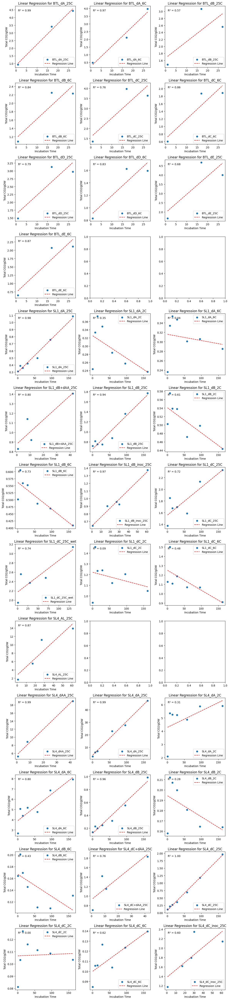

In [49]:
#Co2 per g DW
#Get unique Names
unique_names = CO2_gDW['Name'].unique()
CO2_DW_results = []

# Create a figure and subplots
num_plots = len(unique_names)
num_cols = 3  # Number of columns
num_rows = int(np.ceil(num_plots / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))  # Adjust figsize as needed
axes = axes.flatten()

# Loop through unique Names and create/clean/regress/plot DataFrames
for i, name in enumerate(unique_names):
    # Filter data for the current Name
    filtered_data = CO2_gDW[CO2_gDW['Name'] == name]

    # Create new DataFrame with incubation time and total CO2/gC
    new_df = filtered_data[['incubation time', 'total CO2/g']].copy()
    new_df.columns = ['incubation time', 'total CO2/g']  # Rename columns

    # Remove rows with NaN in 'Total CO2/gC'
    new_df = new_df.dropna(subset=['total CO2/g'])

    # Check if DataFrame is empty
    if new_df.empty:
        print(f"Skipping empty DataFrame for {name}\n")
        continue  # Skip to the next iteration

        # Perform linear regression
    X = new_df['incubation time'].values.reshape(-1, 1)  # Reshape X to a 2D array
    y = new_df['total CO2/g'].values
    reg = LinearRegression().fit(X, y)

    # Get regression coefficients
    slope = reg.coef_[0]
    intercept = reg.intercept_

    # Calculate R-squared
    r_squared = r2_score(y, reg.predict(X))  # Calculate R^2

    # Print or store regression results
    #print(f"Linear Regression for {name}:")
    # print(f"Slope: {slope}")
    # print(f"Intercept: {intercept}\n")
    #print(f"R-squared: {r_squared}\n")  # Print R^2

    # Optionally, store regression results in the DataFrame
    new_df.loc[:, 'Regression Slope'] = slope
    new_df.loc[:,'Regression Intercept'] = intercept
    new_df.loc[:,'R-squared'] = r_squared  # Store R^2 in the DataFrame
    new_df.loc[:, 'Name'] = name

    # Assign the new DataFrame to a variable with the Name
    #globals()[f'{name}_df'] = new_df
    CO2_DW_results.append(new_df)

    # Plot the data and regression line
    ax = axes[i]  # Get the current subplot axis
    ax.scatter(new_df['incubation time'], new_df['total CO2/g'], label=name)
    ax.plot(new_df['incubation time'], reg.predict(X), linestyle='--', color='red', label='Regression Line')

    # Add R-squared to the subplot
    axes[i].text(0.05, 0.95, f"R² = {r_squared:.2f}", transform=axes[i].transAxes, va='top') # Print R^2 on subplot

    # Set plot labels and title
    ax.set_xlabel('Incubation Time')
    ax.set_ylabel('Total CO2/gDW')
    ax.set_title(f'Linear Regression for {name}')
    # ax.set_ylim(0, 200)
    ax.legend()

# Hide any extra empty subplots
for j in range(num_plots, num_rows * num_cols):
    axes[j].set_visible(False)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

CO2_DW_results_final = pd.concat(CO2_DW_results, ignore_index=True)

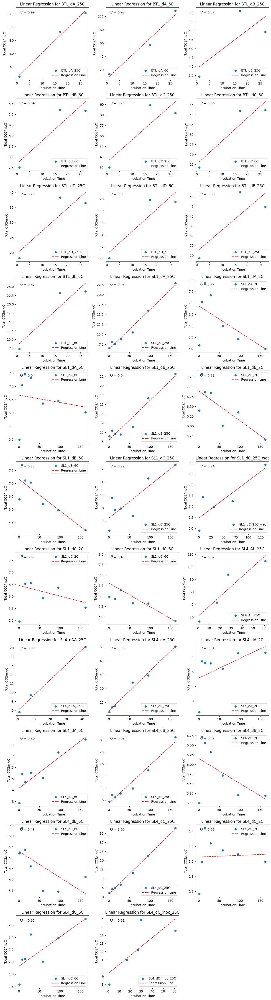

In [50]:
#Co2 per g DOC
#Get unique Names
unique_names = C_DOC_CO2_slim['Name'].unique()
CO2_DOC_results = []

# Create a figure and subplots
num_plots = len(unique_names)
num_cols = 3  # Number of columns
num_rows = int(np.ceil(num_plots / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))  # Adjust figsize as needed
axes = axes.flatten()

# Loop through unique Names and create/clean/regress/plot DataFrames
for i, name in enumerate(unique_names):
    # Filter data for the current Name
    filtered_data = C_DOC_CO2_slim[C_DOC_CO2_slim['Name'] == name]

    # Create new DataFrame with incubation time and total CO2/gC
    new_df = filtered_data[['incubation time', 'total CO2/mgC']].copy()
    new_df.columns = ['incubation time', 'total CO2/mgC']  # Rename columns

    # Remove rows with NaN in 'Total CO2/gC'
    new_df = new_df.dropna(subset=['total CO2/mgC'])

    # Check if DataFrame is empty
    if new_df.empty:
        print(f"Skipping empty DataFrame for {name}\n")
        continue  # Skip to the next iteration

        # Perform linear regression
    X = new_df['incubation time'].values.reshape(-1, 1)  # Reshape X to a 2D array
    y = new_df['total CO2/mgC'].values
    reg = LinearRegression().fit(X, y)

    # Get regression coefficients
    slope = reg.coef_[0]
    intercept = reg.intercept_

    # Calculate R-squared
    r_squared = r2_score(y, reg.predict(X))  # Calculate R^2

    # Print or store regression results
    #print(f"Linear Regression for {name}:")
    # print(f"Slope: {slope}")
    # print(f"Intercept: {intercept}\n")
    #print(f"R-squared: {r_squared}\n")  # Print R^2

    # Optionally, store regression results in the DataFrame
    new_df.loc[:, 'Regression Slope'] = slope
    new_df.loc[:,'Regression Intercept'] = intercept
    new_df.loc[:,'R-squared'] = r_squared  # Store R^2 in the DataFrame
    new_df.loc[:, 'Name'] = name

    # Assign the new DataFrame to a variable with the Name
    #globals()[f'{name}_df'] = new_df
    CO2_DOC_results.append(new_df)

    # Plot the data and regression line
    ax = axes[i]  # Get the current subplot axis
    ax.scatter(new_df['incubation time'], new_df['total CO2/mgC'], label=name)
    ax.plot(new_df['incubation time'], reg.predict(X), linestyle='--', color='red', label='Regression Line')

    # Add R-squared to the subplot
    axes[i].text(0.05, 0.95, f"R² = {r_squared:.2f}", transform=axes[i].transAxes, va='top') # Print R^2 on subplot

    # Set plot labels and title
    ax.set_xlabel('Incubation Time')
    ax.set_ylabel('Total CO2/mgC')
    ax.set_title(f'Linear Regression for {name}')
    # ax.set_ylim(0, 200)
    ax.legend()

# Hide any extra empty subplots
for j in range(num_plots, num_rows * num_cols):
    axes[j].set_visible(False)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

CO2_DOC_results_final = pd.concat(CO2_DOC_results, ignore_index=True)

In [51]:
C_DOC_CH4_slim

,Name,incubation time,total CH4/mgC
456,SL4_AL_25C,1,0.000000
457,SL4_AL_25C,8,NaN
458,SL4_AL_25C,11,NaN
459,SL4_AL_25C,15,NaN
460,SL4_AL_25C,17,16.756625
...,...,...,...
584,SL4_dA_6C,88,NaN
585,SL4_dA_6C,96,13.022356
586,SL4_dA_6C,134,NaN
587,SL4_dA_6C,161,NaN


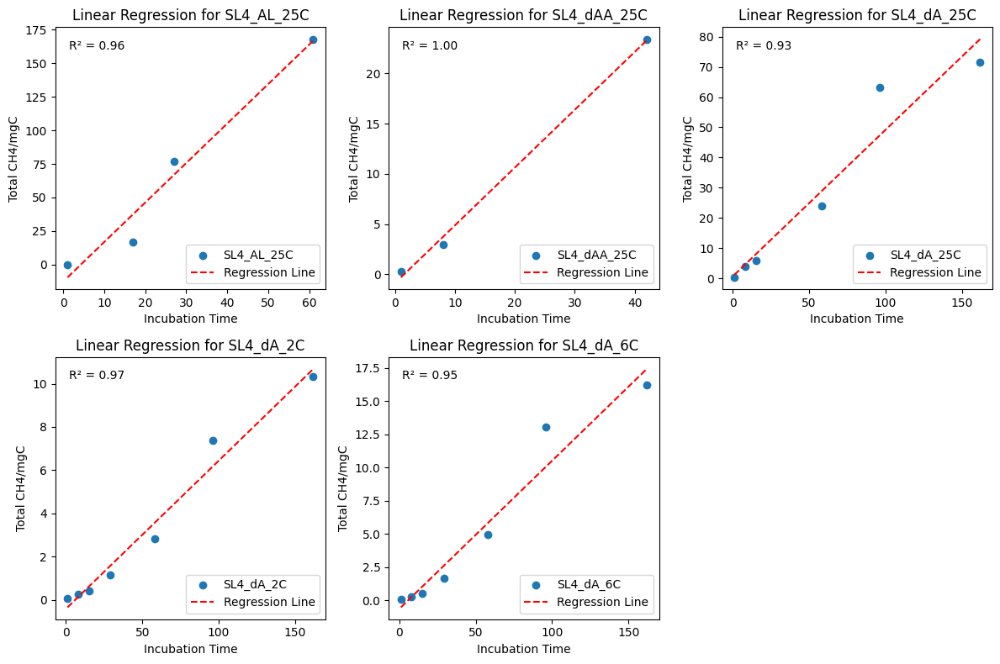

In [52]:
#CH4 per g DOC
#Get unique Names
unique_names = C_DOC_CH4_slim['Name'].unique()
CH4_DOC_results = []

# Create a figure and subplots
num_plots = len(unique_names)
num_cols = 3  # Number of columns
num_rows = int(np.ceil(num_plots / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))  # Adjust figsize as needed
axes = axes.flatten()

# Loop through unique Names and create/clean/regress/plot DataFrames
for i, name in enumerate(unique_names):
    # Filter data for the current Name
    filtered_data = C_DOC_CH4_slim[C_DOC_CH4_slim['Name'] == name]

    # Create new DataFrame with incubation time and total CO2/gC
    new_df = filtered_data[['incubation time', 'total CH4/mgC']].copy()
    new_df.columns = ['incubation time', 'total CH4/mgC']  # Rename columns

    # Remove rows with NaN in 'Total CO2/gC'
    new_df = new_df.dropna(subset=['total CH4/mgC'])

    # Check if DataFrame is empty
    if new_df.empty:
        print(f"Skipping empty DataFrame for {name}\n")
        continue  # Skip to the next iteration

        # Perform linear regression
    X = new_df['incubation time'].values.reshape(-1, 1)  # Reshape X to a 2D array
    y = new_df['total CH4/mgC'].values
    reg = LinearRegression().fit(X, y) #force y intercpt to 0: LinearRegression(fit_intercept=False).fit(X, y)

    # Get regression coefficients
    slope = reg.coef_[0]
    intercept = reg.intercept_

    # Calculate R-squared
    r_squared = r2_score(y, reg.predict(X))  # Calculate R^2

    # Print or store regression results
    #print(f"Linear Regression for {name}:")
    # print(f"Slope: {slope}")
    # print(f"Intercept: {intercept}\n")
    #print(f"R-squared: {r_squared}\n")  # Print R^2

    # Optionally, store regression results in the DataFrame
    new_df.loc[:, 'Regression Slope'] = slope
    new_df.loc[:,'Regression Intercept'] = intercept
    new_df.loc[:,'R-squared'] = r_squared  # Store R^2 in the DataFrame
    new_df.loc[:, 'Name'] = name

    # Assign the new DataFrame to a variable with the Name
    #globals()[f'{name}_df'] = new_df
    CH4_DOC_results.append(new_df)

    # Plot the data and regression line
    ax = axes[i]  # Get the current subplot axis
    ax.scatter(new_df['incubation time'], new_df['total CH4/mgC'], label=name)
    ax.plot(new_df['incubation time'], reg.predict(X), linestyle='--', color='red', label='Regression Line')

    # Add R-squared to the subplot
    axes[i].text(0.05, 0.95, f"R² = {r_squared:.2f}", transform=axes[i].transAxes, va='top') # Print R^2 on subplot

    # Set plot labels and title
    ax.set_xlabel('Incubation Time')
    ax.set_ylabel('Total CH4/mgC')
    ax.set_title(f'Linear Regression for {name}')
    # ax.set_ylim(0, 200)
    ax.legend()

# Hide any extra empty subplots
for j in range(num_plots, num_rows * num_cols):
    axes[j].set_visible(False)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

CH4_DOC_results_final = pd.concat(CH4_DOC_results, ignore_index=True)

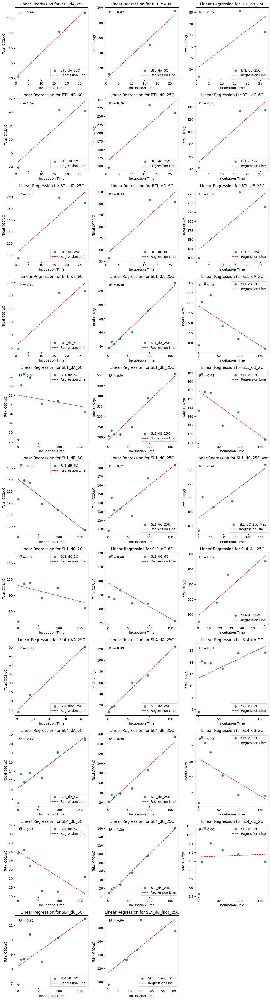

In [53]:
#CO2 per gCorg
#Get unique Names
unique_names = resp_CO2_hilman_slim['Name'].unique()
CO2_TOC_results = []

# Create a figure and subplots
num_plots = len(unique_names)
num_cols = 3  # Number of columns
num_rows = int(np.ceil(num_plots / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(12, 4 * num_rows))  # Adjust figsize as needed
axes = axes.flatten()

# Loop through unique Names and create/clean/regress/plot DataFrames
for i, name in enumerate(unique_names):
    # Filter data for the current Name
    filtered_data = resp_CO2_hilman_slim[resp_CO2_hilman_slim['Name'] == name]

    # Create new DataFrame with incubation time and total CO2/gC
    new_df = filtered_data[['incubation time', 'total CO2/gC']].copy()
    new_df.columns = ['incubation time', 'total CO2/gC']  # Rename columns

    # Remove rows with NaN in 'Total CO2/gC'
    new_df = new_df.dropna(subset=['total CO2/gC'])

    # Check if DataFrame is empty
    # if new_df.empty:
    #     print(f"Skipping empty DataFrame for {name}\n")
    #     continue  # Skip to the next iteration

        # Perform linear regression
    X = new_df['incubation time'].values.reshape(-1, 1)  # Reshape X to a 2D array
    y = new_df['total CO2/gC'].values
    reg = LinearRegression().fit(X, y)

    # Get regression coefficients
    slope = reg.coef_[0]
    intercept = reg.intercept_

    # Calculate R-squared
    r_squared = r2_score(y, reg.predict(X))  # Calculate R^2

    # Print or store regression results
    #print(f"Linear Regression for {name}:")
    # print(f"Slope: {slope}")
    # print(f"Intercept: {intercept}\n")
    #print(f"R-squared: {r_squared}\n")  # Print R^2

    # Optionally, store regression results in the DataFrame
    new_df.loc[:, 'Regression Slope'] = slope
    new_df.loc[:,'Regression Intercept'] = intercept
    new_df.loc[:,'R-squared'] = r_squared  # Store R^2 in the DataFrame
    new_df.loc[:, 'Name'] = name

    # Assign the new DataFrame to a variable with the Name
    #globals()[f'{name}_df'] = new_df
    CO2_TOC_results.append(new_df)

    # Plot the data and regression line
    ax = axes[i]  # Get the current subplot axis
    ax.scatter(new_df['incubation time'], new_df['total CO2/gC'], label=name)
    ax.plot(new_df['incubation time'], reg.predict(X), linestyle='--', color='red', label='Regression Line')

    # Add R-squared to the subplot
    axes[i].text(0.05, 0.95, f"R² = {r_squared:.2f}", transform=axes[i].transAxes, va='top') # Print R^2 on subplot

    # Set plot labels and title
    ax.set_xlabel('Incubation Time')
    ax.set_ylabel('Total CO2/gC')
    ax.set_title(f'Linear Regression for {name}')
    # ax.set_ylim(0, 200)
    ax.legend()

# Hide any extra empty subplots
for j in range(num_plots, num_rows * num_cols):
    axes[j].set_visible(False)

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

CO2_TOC_results_final = pd.concat(CO2_TOC_results, ignore_index=True)

#t-tests

In [54]:
pip install scipy


In [55]:
from scipy.stats import f_oneway
from collections import defaultdict
from scipy.stats import ttest_ind
from itertools import combinations

In [56]:
# CO2_DOC_results_final
results_df_slimmed = results_df[['Name', 'Slope']]
results_df_DW_slimmed = results_df_DW[['Name', 'Slope']]

SL1_dA_25C = results_df_slimmed[results_df_slimmed['Name'].isin(['SL1_dA_1', 'SL1_dA_2', 'SL1_dA_3'])].copy()
SL1_dB_25C = results_df_slimmed[results_df_slimmed['Name'].isin(['SL1_dB_1', 'SL1_dB_2', 'SL1_dB_3'])].copy()
SL1_dC_25C = results_df_slimmed[results_df_slimmed['Name'].isin(['SL1_dC_1', 'SL1_dC_2', 'SL1_dC_3'])].copy()
# Add a unified group label
SL1_dA_25C['Group'] = 'SL1_dA_25C'
SL1_dB_25C['Group'] = 'SL1_dB_25C'
SL1_dC_25C['Group'] = 'SL1_dC_25C'
SL1_25C_all = pd.concat([SL1_dA_25C, SL1_dB_25C, SL1_dC_25C])

dA_values = SL1_25C_all[SL1_25C_all['Group'] == 'SL1_dA_25C']['Slope'].values
dB_values = SL1_25C_all[SL1_25C_all['Group'] == 'SL1_dB_25C']['Slope'].values
dC_values = SL1_25C_all[SL1_25C_all['Group'] == 'SL1_dC_25C']['Slope'].values

f_stat, p_val = f_oneway(dA_values, dB_values, dC_values)
print(f"F-statistic: {f_stat}, p-value: {p_val}")

F-statistic: 9.303035769657212, p-value: 0.014498627903232093


In [57]:
results_df_slimmed

,Name,Slope
0,BTL_dA_1,1.694030
1,BTL_dA_2,4.430403
2,BTL_dA_3,5.097257
3,BTL_dA_4,4.896951
4,BTL_dA_5,4.113461
...,...,...
100,SL4_dC_8,-0.000710
101,SL4_dC_9,-0.000776
102,SL4_dC_inoc_1,0.125671
103,SL4_dC_inoc_2,0.050345


In [58]:
results_df_slimmed = results_df[['Name', 'Slope']]

# Step 2: Define all your groupings
group_definitions = {
    'SL1_dA_25C': ['SL1_dA_1', 'SL1_dA_2', 'SL1_dA_3'],
    'SL1_dB_25C': ['SL1_dB_1', 'SL1_dB_2', 'SL1_dB_3'],
    'SL1_dC_25C': ['SL1_dC_1', 'SL1_dC_2', 'SL1_dC_3'],
    'SL1_dA_6C':  ['SL1_dA_4', 'SL1_dA_5', 'SL1_dA_6'],
    'SL1_dB_6C':  ['SL1_dB_4', 'SL1_dB_5', 'SL1_dB_6'],
    'SL1_dC_6C':  ['SL1_dC_4', 'SL1_dC_5', 'SL1_dC_6'],
    'SL1_dA_2C':  ['SL1_dA_7', 'SL1_dA_8', 'SL1_dA_9'],
    'SL1_dB_2C':  ['SL1_dB_7', 'SL1_dB_8', 'SL1_dB_9'],
    'SL1_dC_2C':  ['SL1_dC_7', 'SL1_dC_8', 'SL1_dC_9'],
    'SL4_dA_25C': ['SL4_dA_1', 'SL4_dA_2', 'SL4_dA_3'],
    'SL4_dB_25C': ['SL4_dB_1', 'SL4_dB_2', 'SL4_dB_3'],
    'SL4_dC_25C': ['SL4_dC_1', 'SL4_dC_2', 'SL4_dC_3'],
    'SL4_dA_6C':  ['SL4_dA_4', 'SL4_dA_5', 'SL4_dA_6'],
    'SL4_dB_6C':  ['SL4_dB_4', 'SL4_dB_5', 'SL4_dB_6'],
    'SL4_dC_6C':  ['SL4_dC_4', 'SL4_dC_5', 'SL4_dC_6'],
    'SL4_dA_2C':  ['SL4_dA_7', 'SL4_dA_8', 'SL4_dA_9'],
    'SL4_dB_2C':  ['SL4_dB_7', 'SL4_dB_8', 'SL4_dB_9'],
    'SL4_dC_2C':  ['SL4_dC_7', 'SL4_dC_8', 'SL4_dC_9'],
    'SL4_AL_25C': ['SL4_AL_1', 'SL4_AL_2', 'SL4_AL_3'],
    'SL4_dAA_25C': ['SL4_dAA_1', 'SL4_dAA_2', 'SL4_dAA_3'],
}

# Step 1: Build master DataFrame with group labels
grouped_dfs = []
for group_name, sample_names in group_definitions.items():
    temp_df = results_df_DW_slimmed[results_df_DW_slimmed['Name'].isin(sample_names)].copy()
    temp_df['Group'] = group_name
    grouped_dfs.append(temp_df)

all_grouped_df = pd.concat(grouped_dfs, ignore_index=True)

def parse_group_name(group_name):
    # Example: SL1_dA_25C -> site=SL1, depth=dA, suffix=25C
    parts = group_name.split('_')
    return parts[0], parts[1], parts[2]

anova_results = []

def run_anova_and_store(df, group_column, value_column, group_list, comparison_type, group_keys):
    group_values = [df[df[group_column] == g][value_column].values for g in group_list]
    if all(len(vals) > 0 for vals in group_values):
        f_stat, p_val = f_oneway(*group_values)
        result = {
            'Comparison_Type': comparison_type,
            **group_keys,  # unpack site/depth/suffix info
            'Groups': ', '.join(group_list),
            'F-statistic': round(f_stat, 4),
            'p-value': round(p_val, 4)
        }
        anova_results.append(result)
    else:
        print(f"Skipping ANOVA for groups with empty data: {group_list}")

# Group by (site, temperature suffix) for first type of comparison
site_temp_groups = defaultdict(list)
# Group by (site, depth) for second type of comparison
site_depth_groups = defaultdict(list)

for group_name in group_definitions:
    site, depth, suffix = parse_group_name(group_name)
    site_temp_groups[(site, suffix)].append(group_name)
    site_depth_groups[(site, depth)].append(group_name)

# Run ANOVA: same site & temperature suffix (varying depth)
for (site, suffix), group_list in site_temp_groups.items():
    if len(group_list) >= 3:  # at least 3 depths to compare
        run_anova_and_store(
            all_grouped_df, 'Group', 'Slope', group_list,
            comparison_type='Site+Temperature',
            group_keys={'Site': site, 'Temperature': suffix, 'Depth': 'VARIED'}
        )

# Run ANOVA: same site & depth (varying temperature suffix)
for (site, depth), group_list in site_depth_groups.items():
    if len(group_list) >= 2:  # at least 2 temps to compare
        run_anova_and_store(
            all_grouped_df, 'Group', 'Slope', group_list,
            comparison_type='Site+Depth',
            group_keys={'Site': site, 'Temperature': 'VARIED', 'Depth': depth}
        )

anova_df = pd.DataFrame(anova_results)
anova_df['Significance'] = anova_df['p-value'].apply(lambda p: 'Significant difference' if p < 0.05 else 'Not significant')
anova_df

,Comparison_Type,Site,Temperature,Depth,Groups,F-statistic,p-value,Significance
0,Site+Temperature,SL1,25C,VARIED,"SL1_dA_25C, SL1_dB_25C, SL1_dC_25C",0.5311,0.6132,Not significant
1,Site+Temperature,SL1,6C,VARIED,"SL1_dA_6C, SL1_dB_6C, SL1_dC_6C",15.2516,0.0044,Significant difference
2,Site+Temperature,SL1,2C,VARIED,"SL1_dA_2C, SL1_dB_2C, SL1_dC_2C",0.0680,0.9350,Not significant
3,Site+Temperature,SL4,25C,VARIED,"SL4_dA_25C, SL4_dB_25C, SL4_dC_25C, SL4_AL_25C...",45.7575,0.0000,Significant difference
4,Site+Temperature,SL4,6C,VARIED,"SL4_dA_6C, SL4_dB_6C, SL4_dC_6C",5.7966,0.0397,Significant difference
5,Site+Temperature,SL4,2C,VARIED,"SL4_dA_2C, SL4_dB_2C, SL4_dC_2C",3.0647,0.1210,Not significant
6,Site+Depth,SL1,VARIED,dA,"SL1_dA_25C, SL1_dA_6C, SL1_dA_2C",32.7792,0.0006,Significant difference
7,Site+Depth,SL1,VARIED,dB,"SL1_dB_25C, SL1_dB_6C, SL1_dB_2C",316.8555,0.0000,Significant difference
8,Site+Depth,SL1,VARIED,dC,"SL1_dC_25C, SL1_dC_6C, SL1_dC_2C",5.4667,0.0445,Significant difference
9,Site+Depth,SL4,VARIED,dA,"SL4_dA_25C, SL4_dA_6C, SL4_dA_2C",69.6209,0.0001,Significant difference


In [59]:

welch_results = []

def run_welch_tests(df, group_column, value_column, group_list, comparison_type, group_keys):
    for g1, g2 in combinations(group_list, 2):
        values1 = df[df[group_column] == g1][value_column].values
        values2 = df[df[group_column] == g2][value_column].values

        if len(values1) > 1 and len(values2) > 1:
            stat, p_val = ttest_ind(values1, values2, equal_var=False)
            result = {
                'Comparison_Type': comparison_type,
                **group_keys,
                'Group1': g1,
                'Group2': g2,
                'T-statistic': round(stat, 4),
                'p-value': round(p_val, 4)
            }
            welch_results.append(result)
        else:
            print(f"Skipping Welch test for {g1} vs {g2}: insufficient data.")

# Run Welch tests for site+temperature groups
for (site, suffix), group_list in site_temp_groups.items():
    if len(group_list) >= 2:
        run_welch_tests(
            all_grouped_df, 'Group', 'Slope', group_list,
            comparison_type='Site+Temperature',
            group_keys={'Site': site, 'Temperature': suffix, 'Depth': 'VARIED'}
        )

# Run Welch tests for site+depth groups
for (site, depth), group_list in site_depth_groups.items():
    if len(group_list) >= 2:
        run_welch_tests(
            all_grouped_df, 'Group', 'Slope', group_list,
            comparison_type='Site+Depth',
            group_keys={'Site': site, 'Temperature': 'VARIED', 'Depth': depth}
        )

# Convert to DataFrame
welch_df = pd.DataFrame(welch_results)
welch_df['Significance'] = welch_df['p-value'].apply(lambda p: 'Significant difference' if p < 0.05 else 'Not significant')
welch_df

,Comparison_Type,Site,Temperature,Depth,Group1,Group2,T-statistic,p-value,Significance
0,Site+Temperature,SL1,25C,VARIED,SL1_dA_25C,SL1_dB_25C,-2.2607,0.1447,Not significant
1,Site+Temperature,SL1,25C,VARIED,SL1_dA_25C,SL1_dC_25C,-0.0138,0.9900,Not significant
2,Site+Temperature,SL1,25C,VARIED,SL1_dB_25C,SL1_dC_25C,0.7619,0.5252,Not significant
3,Site+Temperature,SL1,6C,VARIED,SL1_dA_6C,SL1_dB_6C,4.2621,0.0490,Significant difference
4,Site+Temperature,SL1,6C,VARIED,SL1_dA_6C,SL1_dC_6C,4.4892,0.0229,Significant difference
5,Site+Temperature,SL1,6C,VARIED,SL1_dB_6C,SL1_dC_6C,2.9325,0.0987,Not significant
6,Site+Temperature,SL1,2C,VARIED,SL1_dA_2C,SL1_dB_2C,0.1121,0.9187,Not significant
7,Site+Temperature,SL1,2C,VARIED,SL1_dA_2C,SL1_dC_2C,0.3026,0.7894,Not significant
8,Site+Temperature,SL1,2C,VARIED,SL1_dB_2C,SL1_dC_2C,0.2378,0.8291,Not significant
9,Site+Temperature,SL4,25C,VARIED,SL4_dA_25C,SL4_dB_25C,9.7416,0.0103,Significant difference


#rate v depth

In [60]:
final_averaged_df_DW

,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared,depth (cm)
0,BTL_dA_25C,0.870796,0.136821,0.988769,0.357886,0.065965,0.015309,0.206626,0.038085,0.008839,62.5
1,BTL_dA_6C,0.230077,0.130924,0.955286,0.105142,0.060382,0.022899,0.060704,0.034861,0.013221,62.5
2,BTL_dB_25C,1.667077,0.046847,0.568403,0.094146,0.008142,0.082492,0.054355,0.004701,0.047627,212.5
3,BTL_dB_6C,1.155565,0.046681,0.837131,0.330505,0.018473,0.057263,0.190817,0.010665,0.033061,212.5
4,BTL_dC_25C,1.558172,0.095296,0.756682,0.054628,0.012508,0.077320,0.031539,0.007222,0.044641,370.0
5,BTL_dC_6C,0.670467,0.052055,0.846819,0.092701,0.009624,0.096683,0.053521,0.005556,0.055820,370.0
6,BTL_dD_25C,1.608157,0.061435,0.801861,0.175210,0.016542,0.073589,0.101158,0.009551,0.042487,543.5
7,BTL_dD_6C,0.879295,0.031248,0.839210,0.161951,0.012135,0.058762,0.093503,0.007006,0.033926,543.5
8,BTL_dE_25C,1.950478,0.099499,0.674716,0.060992,0.009556,0.071480,0.035214,0.005517,0.041269,777.5
9,BTL_dE_6C,0.720133,0.059420,0.872871,0.124096,0.019761,0.073499,0.071647,0.011409,0.042435,777.5


In [61]:
keep_names = ['SL1_dA_25C', 'SL1_dA_6C','SL1_dA_2C',
              'SL1_dB_25C', 'SL1_dB_6C','SL1_dB_2C',
              'SL1_dC_25C', 'SL1_dC_6C','SL1_dC_2C',
              'SL4_dA_25C', 'SL4_dA_6C','SL4_dA_2C',
              'SL4_dAA_25C', 'SL4_AL_25C',
              'SL4_dB_25C', 'SL4_dB_6C','SL4_dB_2C',
              'SL4_dC_25C', 'SL4_dC_6C','SL4_dC_2C',
              ]
final_averaged_df_DW_slim = final_averaged_df_DW[final_averaged_df_DW['Name'].isin(keep_names)]
final_averaged_df_DW_slim['Name'] = pd.Categorical(final_averaged_df_DW_slim['Name'], categories=keep_names, ordered=True)
final_averaged_df_DW_slim_final = final_averaged_df_DW_slim.sort_values('Name')
final_averaged_df_DW_slim_final

/tmp/ipython-input-3485440456.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_averaged_df_DW_slim['Name'] = pd.Categorical(final_averaged_df_DW_slim['Name'], categories=keep_names, ordered=True)


,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared,depth (cm)
10,SL1_dA_25C,0.296166,0.004735,0.964301,0.069780,0.001478,0.023653,0.040287,0.000853,0.013656,79.5
12,SL1_dA_6C,0.315910,-0.000132,0.133017,0.017289,0.000333,0.219350,0.009982,0.000192,0.126642,79.5
11,SL1_dA_2C,0.325564,-0.000550,0.359949,0.015354,0.000277,0.272013,0.008865,0.000160,0.157047,79.5
14,SL1_dB_25C,0.652762,0.006694,0.916091,0.130031,0.000263,0.048583,0.075074,0.000152,0.028049,179.0
16,SL1_dB_6C,0.562361,-0.000955,0.627593,0.114550,0.000034,0.244004,0.066135,0.000020,0.140876,179.0
15,SL1_dB_2C,0.541071,-0.000597,0.503472,0.017928,0.000678,0.450944,0.010351,0.000391,0.260353,179.0
17,SL1_dC_25C,1.555065,0.004772,0.533201,0.204617,0.004361,0.405472,0.118136,0.002518,0.234099,302.0
20,SL1_dC_6C,1.251705,-0.002144,0.436704,0.263707,0.000701,0.108191,0.152251,0.000405,0.062464,302.0
19,SL1_dC_2C,1.221788,-0.000842,0.152223,0.008196,0.001650,0.243511,0.004732,0.000953,0.140591,302.0
24,SL4_dA_25C,3.633637,0.269172,0.975552,0.460659,0.046943,0.017241,0.265961,0.027103,0.009954,68.5


In [62]:
keep_names_CH4 = [
              'SL4_dA_25C', 'SL4_dA_6C','SL4_dA_2C',
              'SL4_dAA_25C', 'SL4_AL_25C']

final_averaged_df_CH4_DW_slim = final_averaged_df_CH4_DW[final_averaged_df_CH4_DW['Name'].isin(keep_names_CH4)]
final_averaged_df_CH4_DW_slim['Name'] = pd.Categorical(final_averaged_df_CH4_DW_slim['Name'], categories=keep_names_CH4, ordered=True)
final_averaged_df_CH4_DW_slim_final = final_averaged_df_CH4_DW_slim.sort_values('Name')

final_averaged_df_CH4_DW_slim_final

/tmp/ipython-input-628298230.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_averaged_df_CH4_DW_slim['Name'] = pd.Categorical(final_averaged_df_CH4_DW_slim['Name'], categories=keep_names_CH4, ordered=True)


,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared,depth (cm)
24,SL4_dA_25C,0.658373,0.453538,0.929735,0.595288,0.014333,0.031316,0.343690,0.008275,0.018080,68.5
26,SL4_dA_6C,-0.655733,0.100303,0.981296,0.365766,0.044343,0.012710,0.211175,0.025601,0.007338,68.5
25,SL4_dA_2C,-0.381308,0.064072,0.973878,0.125587,0.017250,0.007962,0.072508,0.009960,0.004597,68.5
23,SL4_dAA_25C,-0.839628,0.539312,0.996854,0.402530,0.092496,0.002178,0.232401,0.053403,0.001258,79.5
22,SL4_AL_25C,-1.585709,0.373862,0.952529,1.150541,0.118676,0.020558,0.664265,0.068518,0.011869,109.5


In [63]:
final_averaged_df_CH4_DW

,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared,depth (cm)
13,SL1_dB+dAA_25C,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,NaN
22,SL4_AL_25C,-1.585709,0.373862,0.952529,1.150541,0.118676,0.020558,0.664265,0.068518,0.011869,109.5
23,SL4_dAA_25C,-0.839628,0.539312,0.996854,0.402530,0.092496,0.002178,0.232401,0.053403,0.001258,79.5
24,SL4_dA_25C,0.658373,0.453538,0.929735,0.595288,0.014333,0.031316,0.343690,0.008275,0.018080,68.5
25,SL4_dA_2C,-0.381308,0.064072,0.973878,0.125587,0.017250,0.007962,0.072508,0.009960,0.004597,68.5
26,SL4_dA_6C,-0.655733,0.100303,0.981296,0.365766,0.044343,0.012710,0.211175,0.025601,0.007338,68.5
30,SL4_dC+dAA_25C,-0.007881,0.001899,0.836541,0.011593,0.002522,0.261610,0.006693,0.001456,0.151041,NaN
34,SL4_dC_inoc_25C,0.001042,0.018347,0.910408,0.033815,0.006960,0.077841,0.019523,0.004018,0.044942,NaN


In [64]:
!pip install brokenaxes

from brokenaxes import brokenaxes
import matplotlib.gridspec as gridspec

In [65]:
# results_df
# CH4_results_final
# CH4_DOC_results_final

#assign avg depths to each sample
depth_mapping = {
    'SL1_dA_25C': 79.5,
    'SL1_dA_6C': 79.5,
    'SL1_dA_2C': 79.5,
    'SL1_dB_25C': 179,
    'SL1_dB_6C': 179,
    'SL1_dB_2C': 179,
    'SL1_dC_25C': 302,
    'SL1_dC_6C': 302,
    'SL1_dC_2C': 302,
    'SL1_dC_25C_wet': 302,
    'SL4_dA_25C': 68.5,
    'SL4_dA_6C': 68.5,
    'SL4_dA_2C': 68.5,
    'SL4_dB_25C': 117.5,
    'SL4_dB_6C': 117.5,
    'SL4_dB_2C': 117.5,
    'SL4_dC_25C': 289,
    'SL4_dC_6C': 289,
    'SL4_dC_2C': 289,
    'SL4_AL_25C': 109.5,
    'SL4_dAA_25C': 79.5,
    'BTL_dA_25C': 62.5,
    'BTL_dA_6C': 62.5,
    'BTL_dB_25C': 212.5,
    'BTL_dB_6C': 212.5,
    'BTL_dC_25C': 370,
    'BTL_dC_6C': 370,
    'BTL_dD_25C': 543.5,
    'BTL_dD_6C': 543.5,
    'BTL_dE_25C': 777.5,
    'BTL_dE_6C': 777.5,
}

# results_df['depth (cm)'] = results_df['Name'].map(depth_mapping)
# CH4_results_final['depth (cm)'] = CH4_results_final['Name'].map(depth_mapping)
CH4_DOC_results_final['depth (cm)'] = CH4_DOC_results_final['Name'].map(depth_mapping)
CO2_DOC_results_final['depth (cm)'] = CO2_DOC_results_final['Name'].map(depth_mapping)
CO2_TOC_results_final['depth (cm)'] = CO2_TOC_results_final['Name'].map(depth_mapping)
CH4_TOC_results_final['depth (cm)'] = CH4_TOC_results_final['Name'].map(depth_mapping)

#add diff to high/low of actual depth taken
SE_mapping = {
    'SL1_dA_25C': 4.5,
    'SL1_dA_6C': 4.5,
    'SL1_dA_2C': 4.5,
    'SL1_dB_25C': 5,
    'SL1_dB_6C': 5,
    'SL1_dB_2C': 5,
    'SL1_dC_25C': 7,
    'SL1_dC_6C': 7,
    'SL1_dC_2C': 7,
    'SL1_dC_25C_wet': 7,
    'SL4_dA_25C': 6.5,
    'SL4_dA_6C': 6.5,
    'SL4_dA_2C': 6.5,
    'SL4_dB_25C': 5,
    'SL4_dB_6C': 5,
    'SL4_dB_2C': 5,
    'SL4_dC_25C': 5,
    'SL4_dC_6C': 5,
    'SL4_dC_2C': 5
}

# results_df['SE depth (cm)'] = results_df['Name'].map(SE_mapping)
# CH4_results_final['SE depth (cm)'] = CH4_results_final['Name'].map(SE_mapping)

name_new_map = {
    'SL4_dA_25C': 'SL4_CH4_dA_25C',
    'SL4_dA_6C': 'SL4_CH4_dA_6C',
    'SL4_dA_2C': 'SL4_CH4_dA_2C',
}

# CH4_results_final['New Name'] = CH4_results_final['Name'].map(name_new_map)

# results_df
# CH4_results_final
CO2_DOC_results_final
CO2_TOC_results_final

,incubation time,total CO2/gC,Regression Slope,Regression Intercept,R-squared,Name,depth (cm)
0,1,22.392714,3.296886,20.983046,0.990266,BTL_dA_25C,62.5
1,17,81.936872,3.296886,20.983046,0.990266,BTL_dA_25C,62.5
2,27,106.979415,3.296886,20.983046,0.990266,BTL_dA_25C,62.5
3,1,11.858138,3.154793,5.544036,0.970793,BTL_dA_6C,62.5
4,17,50.961322,3.154793,5.544036,0.970793,BTL_dA_6C,62.5
...,...,...,...,...,...,...,...
167,1,96.250683,1.319350,112.722106,0.603151,SL4_dC_inoc_25C,NaN
168,17,132.488636,1.319350,112.722106,0.603151,SL4_dC_inoc_25C,NaN
169,27,146.975667,1.319350,112.722106,0.603151,SL4_dC_inoc_25C,NaN
170,30,192.016676,1.319350,112.722106,0.603151,SL4_dC_inoc_25C,NaN


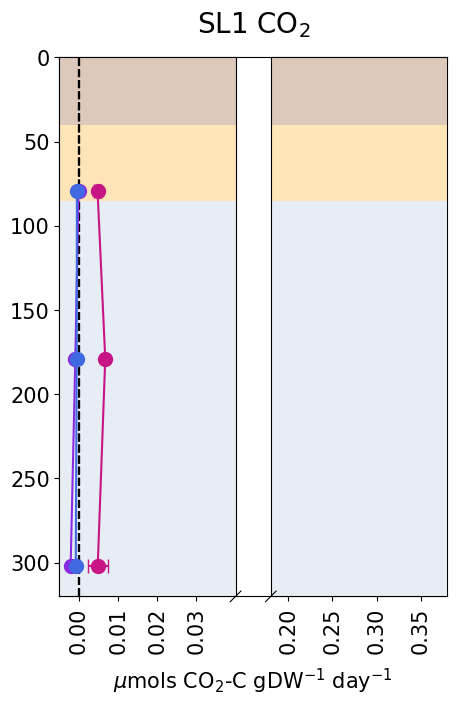

In [66]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL1_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(5, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3]),
        'SL4_dAA_25C': (colors[3], markers[3])
    },


    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

AL_min = 0
AL_max = 40
talik_min = 40
talik_max = 85
perma_min = 85
perma_max = 320


for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    bax = brokenaxes(xlims=((-0.005,0.04),(0.18,0.38)), width_ratios=[1,1], ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = final_averaged_df_DW[final_averaged_df_DW['Name'].isin(names_with_color) &
                                       final_averaged_df_DW['Name'].str.startswith(ending_term) &
                                       ~final_averaged_df_DW['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['mean_Slope'])
        bax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
                     xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)


    # for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
    #     names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
    #     subset = final_averaged_df_DW_short[final_averaged_df_DW_short['Name'].isin(names_with_color) &
    #                                    final_averaged_df_DW_short['Name'].str.startswith(ending_term) &
    #                                    ~final_averaged_df_DW_short['Name'].str.contains('wet')]

    #     subset = subset.sort_values(by=['depth (cm)'])
    #     subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

    #     mask = ~np.isnan(subset['mean_Slope'])
    #     bax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
    #                  xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
    #              label=names_with_color[0],  # Use first site name for label
    #              color=color, marker=marker,
    #              linestyle='--', markersize=10)

    #ax.set_ylim(0, 320)
    # ax.set_xlim(-0.1, 3)


# for i, ending_term in enumerate(ending_terms):
#     # ax = axes_groups #[i]
#     #ax.set_ylim(0, 320)
#     # ax2 = ax.twiny()
#     # subplot_spec = ax.get_subplotspec()
#     # bax = brokenaxes(xlims=((-0.5,10),), ylims=((320,0),), subplot_spec=subplot_spec)
#     for name, (color, marker) in CH4_color_maps.items():  # Iterate over the dictionary
#         if name.startswith(ending_term) and 'wet' not in name and name in CH4_DOC_results_final['Name'].unique():  # Check if name exists in DataFrame
#             subset = CH4_DOC_results_final[CH4_DOC_results_final['Name'] == name]
#             subset = subset.sort_values(by=['depth (cm)'])
#             mask = ~np.isnan(subset['Regression Slope'])
#             bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
#                      color=color, marker=marker, linestyle='-', markersize=11, mec='black', mew=0.2)


        bax.axvline(x=0, color='black', linestyle='--')
        bax.axhspan(AL_min, AL_max, facecolor='saddlebrown', alpha=0.08)
        bax.axhspan(talik_min, talik_max, facecolor='orange', alpha=0.08)
        bax.axhspan(perma_min, perma_max, facecolor='lightsteelblue', alpha=0.08)

    # bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    bax.set_xlabel(r'$\mu$mols CO$_2$-C gDW$^{-1}$ day$^{-1}$', fontsize=15, labelpad=50)
    bax.tick_params(axis='x', labelsize=15, rotation=90, pad=4)
    #ax2.tick_params(axis='x', labelsize=18)
    bax.tick_params(axis='y', labelsize=15, labelcolor='black', color='black')
    ax.set_xticklabels([])  # Hide original x-axis tick labels
    ax.set_yticklabels([])
    ax.tick_params(axis='both', color='white') #idk couldnt get rid of ticks so colored them white
    # bax.set_ylabel('Depth (cm)', color='black', fontsize=19, labelpad=60)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax.set_ylim(0, 320)
    # ax.set_xlim(-0.05, 0.55)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax2.set_xticks([])
    ax.set_title('SL1 CO$_{2}$', fontsize=20, pad=18)
    # ax.set_xlim(-0.02, 0.6)
    # ax.set_ylim(0, 320)
    # ax.set_xticks([-0.5, 0.0, 0.5, 2.0, 3.0])

    # ax2.set_xlabel(r'$\mu$mols CH$_4$ mgDOC$^{-1}$ day$^{-1}$', color='red', fontsize=19, labelpad=5)
    # ax2.xaxis.set_label_coords(0.5, -0.2)
    # ax2.set_xticks([-0.5, 0.0, 1.0, 2.0, 3.0])
    # ax2.set_xticklabels([-0.5, 0.0, 1.0, 2.0, 3.0], fontsize=19)
    # ax2.spines['bottom'].set_position(('outward', 85))
    # ax2.spines['top'].set_position(('outward', 85))
    # ax2.spines['bottom'].set_color('red')


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    bax.axs[0].spines['top'].set_visible(True)
    bax.axs[0].spines['right'].set_visible(True)
    bax.axs[0].spines['left'].set_visible(True)
    bax.axs[1].spines['left'].set_visible(True)
    bax.axs[1].spines['top'].set_visible(True)
    # Manually define your desired tick locations
    ticks_first_segment = np.linspace(-0.005, 0.035, 3)  # or use any custom list
    bax.axs[0].set_xticks(ticks_first_segment)

    ticks_first_segment = np.arange(0, 0.036, 0.01)
    ticks_second_segment = np.arange(0.2, 0.4, 0.05)
    bax.axs[0].set_xticks(ticks_first_segment)
    bax.axs[1].set_xticks(ticks_second_segment)

    # ax2.tick_params(axis='x', which='both', length=6, colors='red', pad=2, labelsize=18, rotation=40)
    # ax2.xaxis.set_ticks_position("bottom")  # Set tick position to bottom
    # ax2.xaxis.set_label_position("bottom")



# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

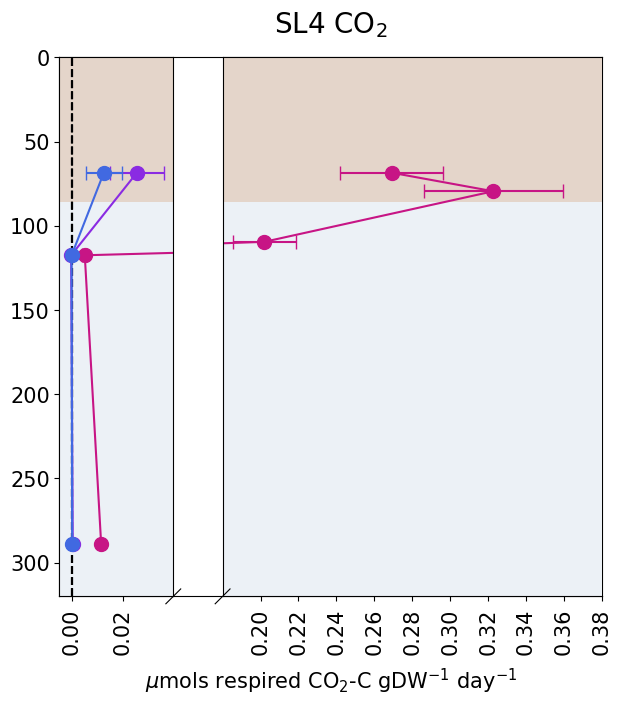

In [67]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL4_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(7, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3]),
        'SL4_dAA_25C': (colors[3], markers[3])
    },


    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

AL_min = 0
AL_max = 86
# talik_min = 40
# talik_max = 85
perma_min = 86
perma_max = 320


for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    bax = brokenaxes(xlims=((-0.005,0.04),(0.18,0.38)), width_ratios=[0.3,1], ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = final_averaged_df_DW[final_averaged_df_DW['Name'].isin(names_with_color) &
                                       final_averaged_df_DW['Name'].str.startswith(ending_term) &
                                       ~final_averaged_df_DW['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['mean_Slope'])
        bax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
                     xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)

    # for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
    #     names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
    #     subset = final_averaged_df_DW_short[final_averaged_df_DW_short['Name'].isin(names_with_color) &
    #                                    final_averaged_df_DW_short['Name'].str.startswith(ending_term) &
    #                                    ~final_averaged_df_DW_short['Name'].str.contains('wet')]

    #     subset = subset.sort_values(by=['depth (cm)'])
    #     subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

    #     mask = ~np.isnan(subset['mean_Slope'])
    #     bax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
    #                  xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
    #              label=names_with_color[0],  # Use first site name for label
    #              color=color, marker=marker,
    #              linestyle='--', markersize=10)


        bax.axvline(x=0, color='black', linestyle='--')
        bax.axhspan(AL_min, AL_max, facecolor='saddlebrown', alpha=0.08)
        # bax.axhspan(talik_min, talik_max, facecolor='orange', alpha=0.08)
        bax.axhspan(perma_min, perma_max, facecolor='lightsteelblue', alpha=0.08)

#     bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # # Set subplot title and labels
    bax.set_xlabel(r'$\mu$mols respired CO$_2$-C gDW$^{-1}$ day$^{-1}$', fontsize=15, labelpad=50)
    bax.tick_params(axis='x', labelsize=15, rotation=90, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    bax.tick_params(axis='y', labelsize=15, labelcolor='black', color='black')
    ax.set_xticklabels([])  # Hide original x-axis tick labels
    ax.set_yticklabels([])
    ax.tick_params(axis='both', color='white') #idk couldnt get rid of ticks so colored them white

    bax.set_title('SL4 CO$_{2}$', fontsize=20, pad=18)


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    bax.axs[0].spines['top'].set_visible(True)
    bax.axs[0].spines['right'].set_visible(True)
    bax.axs[0].spines['left'].set_visible(True)
    bax.axs[1].spines['left'].set_visible(True)
    bax.axs[1].spines['top'].set_visible(True)
    # Manually define your desired tick locations
    # ticks_first_segment = np.linspace(-0.005, 0.04, 3)  # or use any custom list
    # bax.axs[0].set_xticks(ticks_first_segment)

    ticks_first_segment = np.arange(0, 0.036, 0.02)
    ticks_second_segment = np.arange(0.2, 0.4, 0.02)
    bax.axs[0].set_xticks(ticks_first_segment)
    bax.axs[1].set_xticks(ticks_second_segment)



# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

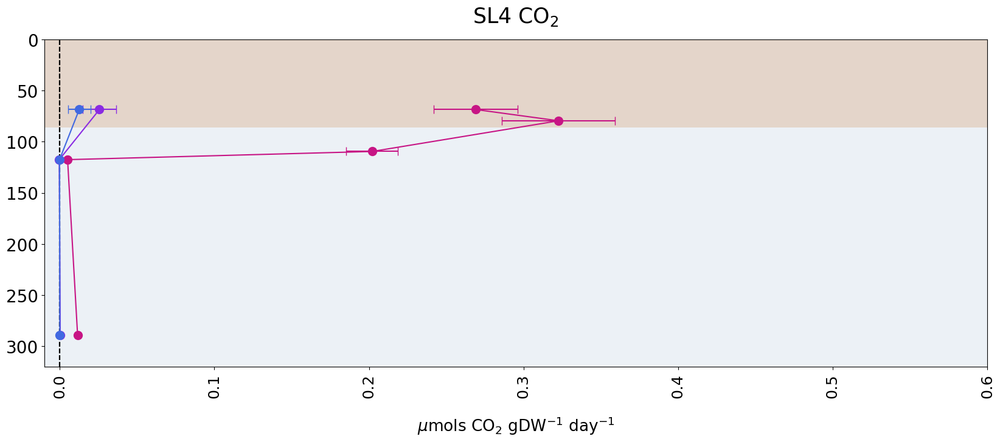

In [68]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL4_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(20, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3]),
        'SL4_dAA_25C': (colors[3], markers[3])
    },


    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

AL_min = 0
AL_max = 86
# talik_min = 40
# talik_max = 85
perma_min = 86
perma_max = 320


for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    # bax = brokenaxes(xlims=((-0.005,0.04),(0.18,0.38)), width_ratios=[1,1], ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = final_averaged_df_DW[final_averaged_df_DW['Name'].isin(names_with_color) &
                                       final_averaged_df_DW['Name'].str.startswith(ending_term) &
                                       ~final_averaged_df_DW['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['mean_Slope'])
        ax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
                     xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)

    # for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
    #     names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
    #     subset = final_averaged_df_DW_short[final_averaged_df_DW_short['Name'].isin(names_with_color) &
    #                                    final_averaged_df_DW_short['Name'].str.startswith(ending_term) &
    #                                    ~final_averaged_df_DW_short['Name'].str.contains('wet')]

    #     subset = subset.sort_values(by=['depth (cm)'])
    #     subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

    #     mask = ~np.isnan(subset['mean_Slope'])
    #     bax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
    #                  xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
    #              label=names_with_color[0],  # Use first site name for label
    #              color=color, marker=marker,
    #              linestyle='--', markersize=10)


        ax.axvline(x=0, color='black', linestyle='--')
        ax.axhspan(AL_min, AL_max, facecolor='saddlebrown', alpha=0.08)
        # bax.axhspan(talik_min, talik_max, facecolor='orange', alpha=0.08)
        ax.axhspan(perma_min, perma_max, facecolor='lightsteelblue', alpha=0.08)

#     bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # # Set subplot title and labels
    ax.set_xlabel(r'$\mu$mols CO$_2$ gDW$^{-1}$ day$^{-1}$', fontsize=19, labelpad=20)
    ax.tick_params(axis='x', labelsize=18, rotation=90, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=20, labelcolor='black', color='black')
    # ax.set_xticklabels([])  # Hide original x-axis tick labels
    # ax.set_yticklabels([])
    # ax.tick_params(axis='both', color='white') #idk couldnt get rid of ticks so colored them white

    ax.set_title('SL4 CO$_{2}$', fontsize=25, pad=20)
    ax.set_xlim(-0.01, 0.6)
    ax.set_ylim(0, 320)


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    # bax.axs[0].spines['top'].set_visible(True)
    # bax.axs[0].spines['right'].set_visible(True)
    # bax.axs[0].spines['left'].set_visible(True)
    # bax.axs[1].spines['left'].set_visible(True)
    # bax.axs[1].spines['top'].set_visible(True)
    # Manually define your desired tick locations
    # ticks_first_segment = np.linspace(-0.005, 0.04, 3)  # or use any custom list
    # bax.axs[0].set_xticks(ticks_first_segment)

    # ticks_first_segment = np.arange(0, 0.036, 0.01)
    # ticks_second_segment = np.arange(0.2, 0.4, 0.05)
    # bax.axs[0].set_xticks(ticks_first_segment)
    # bax.axs[1].set_xticks(ticks_second_segment)



# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

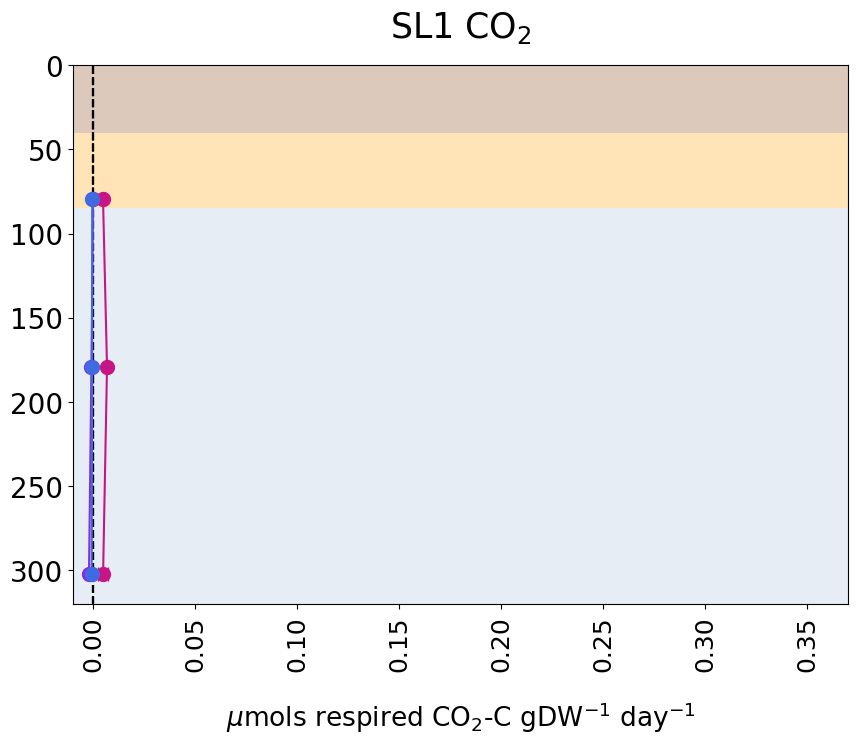

In [69]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL1_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(10, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3]),
        'SL4_dAA_25C': (colors[3], markers[3])
    },


    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

AL_min = 0
AL_max = 40
talik_min = 40
talik_max = 85
perma_min = 85
perma_max = 320



for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    # bax = brokenaxes(xlims=((-0.005,0.04),(0.18,0.38)), width_ratios=[1,1], ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = final_averaged_df_DW[final_averaged_df_DW['Name'].isin(names_with_color) &
                                       final_averaged_df_DW['Name'].str.startswith(ending_term) &
                                       ~final_averaged_df_DW['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['mean_Slope'])
        ax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
                     xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)

    # for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
    #     names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
    #     subset = final_averaged_df_DW_short[final_averaged_df_DW_short['Name'].isin(names_with_color) &
    #                                    final_averaged_df_DW_short['Name'].str.startswith(ending_term) &
    #                                    ~final_averaged_df_DW_short['Name'].str.contains('wet')]

    #     subset = subset.sort_values(by=['depth (cm)'])
    #     subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

    #     mask = ~np.isnan(subset['mean_Slope'])
    #     bax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
    #                  xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
    #              label=names_with_color[0],  # Use first site name for label
    #              color=color, marker=marker,
    #              linestyle='--', markersize=10)


        ax.axvline(x=0, color='black', linestyle='--')
        ax.axhspan(AL_min, AL_max, facecolor='saddlebrown', alpha=0.08)
        ax.axhspan(talik_min, talik_max, facecolor='orange', alpha=0.08)
        ax.axhspan(perma_min, perma_max, facecolor='lightsteelblue', alpha=0.08)

#     bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # # Set subplot title and labels
    ax.set_xlabel(r'$\mu$mols respired CO$_2$-C gDW$^{-1}$ day$^{-1}$', fontsize=19, labelpad=20)
    ax.tick_params(axis='x', labelsize=18, rotation=90, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=20, labelcolor='black', color='black')
    # ax.set_xticklabels([])  # Hide original x-axis tick labels
    # ax.set_yticklabels([])
    # ax.tick_params(axis='both', color='white') #idk couldnt get rid of ticks so colored them white

    ax.set_title('SL1 CO$_{2}$', fontsize=25, pad=20)
    ax.set_xlim(-0.01, 0.37)
    ax.set_ylim(0, 320)


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    # bax.axs[0].spines['top'].set_visible(True)
    # bax.axs[0].spines['right'].set_visible(True)
    # bax.axs[0].spines['left'].set_visible(True)
    # bax.axs[1].spines['left'].set_visible(True)
    # bax.axs[1].spines['top'].set_visible(True)
    # Manually define your desired tick locations
    # ticks_first_segment = np.linspace(-0.005, 0.04, 3)  # or use any custom list
    # bax.axs[0].set_xticks(ticks_first_segment)

    # ticks_first_segment = np.arange(0, 0.036, 0.01)
    # ticks_second_segment = np.arange(0.2, 0.4, 0.05)
    # bax.axs[0].set_xticks(ticks_first_segment)
    # bax.axs[1].set_xticks(ticks_second_segment)



# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

In [70]:
#set zeros
new_samples = ['SL1_dA_25C', 'SL1_dA_6C', 'SL1_dA_2C', 'SL1_dB_25C', 'SL1_dB_6C', 'SL1_dB_2C', 'SL1_dC_25C', 'SL1_dC_6C', 'SL1_dC_2C',
               'SL4_dB_25C', 'SL4_dB_6C', 'SL4_dB_2C', 'SL4_dC_25C', 'SL4_dC_6C', 'SL4_dC_2C']

depths = [79.5, 79.5, 79.5, 179, 179, 179, 302, 302, 302, 117.5, 117.5, 117.5, 289, 289, 289]


# Create a DataFrame for the new entries
new_data = pd.DataFrame({
    'Name': new_samples,
    'depth (cm)': depths
})

# Add the remaining columns with 0s
for col in final_averaged_df_CH4_DW.columns:
    if col not in new_data.columns:
        new_data[col] = 0.0

# Ensure column order matches the original
new_data = new_data[final_averaged_df_CH4_DW.columns]

# Append to original DataFrame
final_averaged_df_CH4_DW = pd.concat([final_averaged_df_CH4_DW, new_data], ignore_index=True)

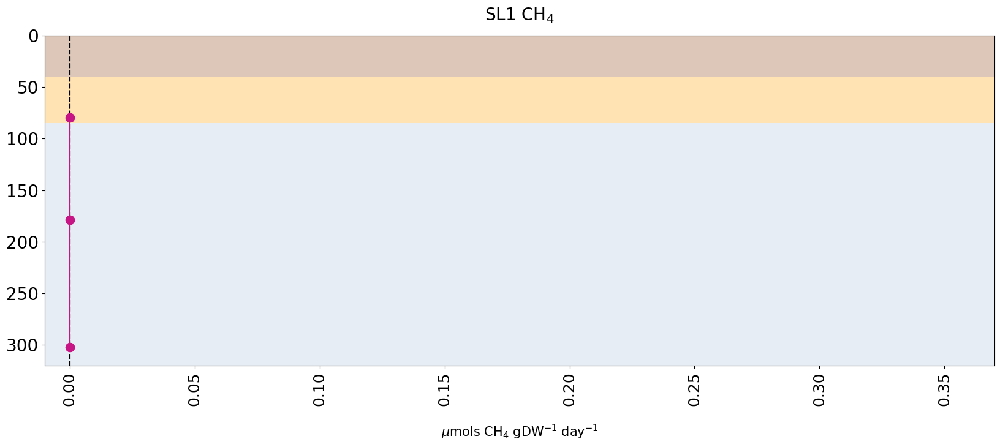

In [71]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL1_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(20, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'mediumvioletred', 'mediumvioletred', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3]),
        'SL4_dAA_25C': (colors[3], markers[3])
    },


    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

AL_min = 0
AL_max = 40
talik_min = 40
talik_max = 85
perma_min = 85
perma_max = 320


for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    # bax = brokenaxes(xlims=((-0.01,0.02),(0.04,0.6)), width_ratios=[0.1,1], ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = final_averaged_df_CH4_DW[final_averaged_df_CH4_DW['Name'].isin(names_with_color) &
                                       final_averaged_df_CH4_DW['Name'].str.startswith(ending_term) &
                                       ~final_averaged_df_CH4_DW['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['mean_Slope'])
        ax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
                     xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)

        ax.axvline(x=0, color='black', linestyle='--')
        ax.axhspan(AL_min, AL_max, facecolor='saddlebrown', alpha=0.16)
        ax.axhspan(talik_min, talik_max, facecolor='orange', alpha=0.16)
        ax.axhspan(perma_min, perma_max, facecolor='lightsteelblue', alpha=0.16)

#     bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    ax.set_xlabel(r'$\mu$mols CH$_4$ gDW$^{-1}$ day$^{-1}$', fontsize=15, labelpad=20)
    ax.tick_params(axis='x', labelsize=18, rotation=90, pad=4)
    #ax2.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=20, labelcolor='black', color='black')
    # ax.set_xticklabels([])  # Hide original x-axis tick labels
    # ax.set_yticklabels([])
    # ax.tick_params(axis='both', color='white') #idk couldnt get rid of ticks so colored them white

    ax.set_title('SL1 CH$_{4}$', fontsize=20, pad=18)
    ax.set_xlim(-0.01, 0.37)
    ax.set_ylim(0, 320)


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    # bax.axs[0].spines['top'].set_visible(True)
    # bax.axs[0].spines['right'].set_visible(True)
    # bax.axs[0].spines['left'].set_visible(True)
    # bax.axs[1].spines['left'].set_visible(True)
    # bax.axs[1].spines['top'].set_visible(True)
    # Manually define your desired tick locations

    # ticks_first_segment = np.arange(0, 0.03, 0.05)  # or use any custom list
    # ticks_second_segment = np.arange(0.05, 0.6, 0.1)
    # bax.axs[0].set_xticks(ticks_first_segment)
    # bax.axs[1].set_xticks(ticks_second_segment)



# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

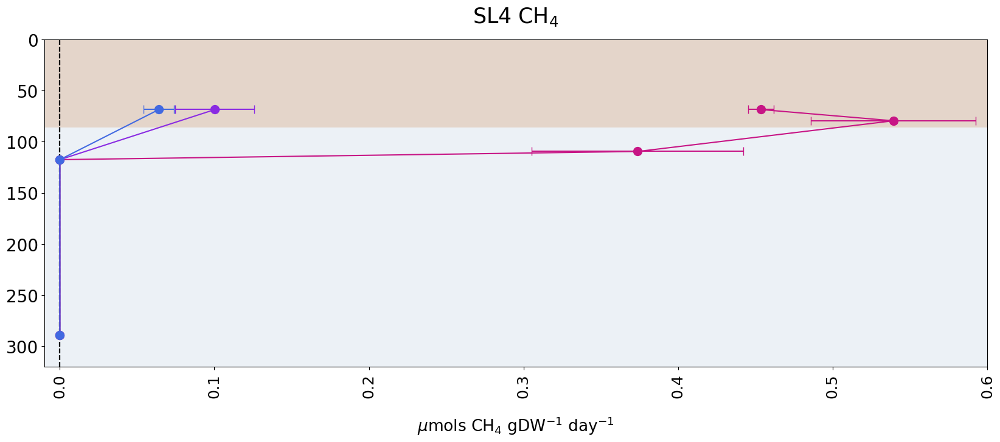

In [72]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL4_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(20, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3]),
        'SL4_dAA_25C': (colors[3], markers[3])
    },


    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

AL_min = 0
AL_max = 86
# talik_min = 40
# talik_max = 85
perma_min = 86
perma_max = 320


for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    # bax = brokenaxes(xlims=((-0.01,0.02),(0.04,0.6)), width_ratios=[0.1,1], ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = final_averaged_df_CH4_DW[final_averaged_df_CH4_DW['Name'].isin(names_with_color) &
                                       final_averaged_df_CH4_DW['Name'].str.startswith(ending_term) &
                                       ~final_averaged_df_CH4_DW['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['mean_Slope'])
        ax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
                     xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)

        ax.axvline(x=0, color='black', linestyle='--')
        ax.axhspan(AL_min, AL_max, facecolor='saddlebrown', alpha=0.08)
        # bax.axhspan(talik_min, talik_max, facecolor='orange', alpha=0.08)
        ax.axhspan(perma_min, perma_max, facecolor='lightsteelblue', alpha=0.08)

#     bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    ax.set_xlabel(r'$\mu$mols CH$_4$ gDW$^{-1}$ day$^{-1}$', fontsize=19, labelpad=20)
    ax.tick_params(axis='x', labelsize=18, rotation=90, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=20, labelcolor='black', color='black')
    # ax.set_xticklabels([])  # Hide original x-axis tick labels
    # ax.set_yticklabels([])
    # ax.tick_params(axis='both', color='white') #idk couldnt get rid of ticks so colored them white

    ax.set_title('SL4 CH$_{4}$', fontsize=25, pad=20)
    ax.set_xlim(-0.01, 0.6)
    ax.set_ylim(0, 320)


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    # bax.axs[0].spines['top'].set_visible(True)
    # bax.axs[0].spines['right'].set_visible(True)
    # bax.axs[0].spines['left'].set_visible(True)
    # bax.axs[1].spines['left'].set_visible(True)
    # bax.axs[1].spines['top'].set_visible(True)
    # Manually define your desired tick locations

    # ticks_first_segment = np.arange(0, 0.03, 0.05)  # or use any custom list
    # ticks_second_segment = np.arange(0.05, 0.6, 0.1)
    # bax.axs[0].set_xticks(ticks_first_segment)
    # bax.axs[1].set_xticks(ticks_second_segment)



# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

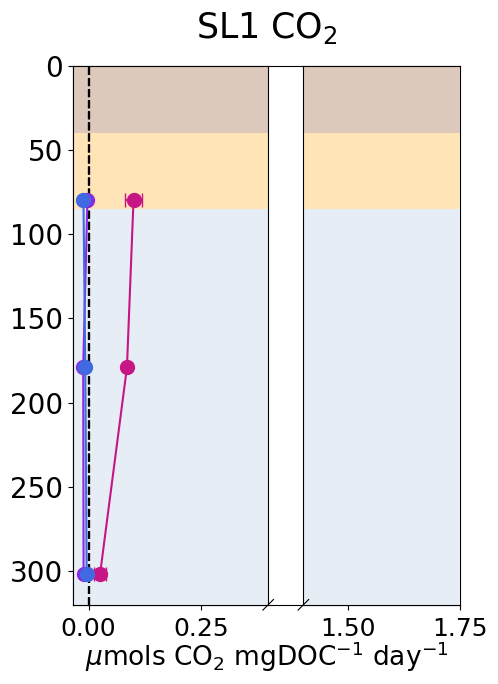

In [73]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL1_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(5, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3]),
        'SL4_dAA_25C': (colors[3], markers[3])
    },


    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

AL_min = 0
AL_max = 40
talik_min = 40
talik_max = 85
perma_min = 85
perma_max = 320


for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    bax = brokenaxes(xlims=((-0.035,0.4),(1.4,1.75)), ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = final_averaged_df[final_averaged_df['Name'].isin(names_with_color) &
                                       final_averaged_df['Name'].str.startswith(ending_term) &
                                       ~final_averaged_df['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['mean_Slope'])
        bax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
                     xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)

    #ax.set_ylim(0, 320)
    # ax.set_xlim(-0.1, 3)


# for i, ending_term in enumerate(ending_terms):
#     # ax = axes_groups #[i]
#     #ax.set_ylim(0, 320)
#     # ax2 = ax.twiny()
#     # subplot_spec = ax.get_subplotspec()
#     # bax = brokenaxes(xlims=((-0.5,10),), ylims=((320,0),), subplot_spec=subplot_spec)
#     for name, (color, marker) in CH4_color_maps.items():  # Iterate over the dictionary
#         if name.startswith(ending_term) and 'wet' not in name and name in CH4_DOC_results_final['Name'].unique():  # Check if name exists in DataFrame
#             subset = CH4_DOC_results_final[CH4_DOC_results_final['Name'] == name]
#             subset = subset.sort_values(by=['depth (cm)'])
#             mask = ~np.isnan(subset['Regression Slope'])
#             bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
#                      color=color, marker=marker, linestyle='-', markersize=11, mec='black', mew=0.2)


        bax.axvline(x=0, color='black', linestyle='--')
        bax.axhspan(AL_min, AL_max, facecolor='saddlebrown', alpha=0.08)
        bax.axhspan(talik_min, talik_max, facecolor='orange', alpha=0.08)
        bax.axhspan(perma_min, perma_max, facecolor='lightsteelblue', alpha=0.08)

#     bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    bax.set_xlabel(r'$\mu$mols CO$_2$ mgDOC$^{-1}$ day$^{-1}$', fontsize=19, labelpad=25)
    bax.tick_params(axis='x', labelsize=18, rotation=0, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    bax.tick_params(axis='y', labelsize=20, labelcolor='black', color='black')
    ax.set_xticklabels([])  # Hide original x-axis tick labels
    ax.set_yticklabels([])
    ax.tick_params(axis='both', color='white') #idk couldnt get rid of ticks so colored them white
    # ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax.set_ylim(0, 320)
    # ax.set_xlim(-0.05, 0.55)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax2.set_xticks([])
    bax.set_title('SL1 CO$_{2}$', fontsize=25, pad=20)
    # ax.set_xticks([-0.5, 0.0, 0.5, 2.0, 3.0])

    # ax2.set_xlabel(r'$\mu$mols CH$_4$ mgDOC$^{-1}$ day$^{-1}$', color='red', fontsize=19, labelpad=5)
    # ax2.xaxis.set_label_coords(0.5, -0.2)
    # ax2.set_xticks([-0.5, 0.0, 1.0, 2.0, 3.0])
    # ax2.set_xticklabels([-0.5, 0.0, 1.0, 2.0, 3.0], fontsize=19)
    # ax2.spines['bottom'].set_position(('outward', 85))
    # ax2.spines['top'].set_position(('outward', 85))
    # ax2.spines['bottom'].set_color('red')


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    bax.axs[0].spines['top'].set_visible(True)
    bax.axs[0].spines['right'].set_visible(True)
    bax.axs[0].spines['left'].set_visible(True)
    bax.axs[1].spines['left'].set_visible(True)
    bax.axs[1].spines['top'].set_visible(True)

    # ax2.tick_params(axis='x', which='both', length=6, colors='red', pad=2, labelsize=18, rotation=40)
    # ax2.xaxis.set_ticks_position("bottom")  # Set tick position to bottom
    # ax2.xaxis.set_label_position("bottom")

# handles, labels = [], []
# for ax in fig.axes:  # Or iterate through desired axes
#     h, l = ax.get_legend_handles_labels()
#     h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
#     #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
#     handles.extend(h)
#     labels.extend(l)

# # Deduplicate legend entries
# unique_labels = []
# unique_handles = []
# for handle, label in zip(handles, labels):
#     if label not in unique_labels:
#         unique_labels.append(label)
#         unique_handles.append(handle)
# # Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.2, 1), ncol=1, fontsize=18)


# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

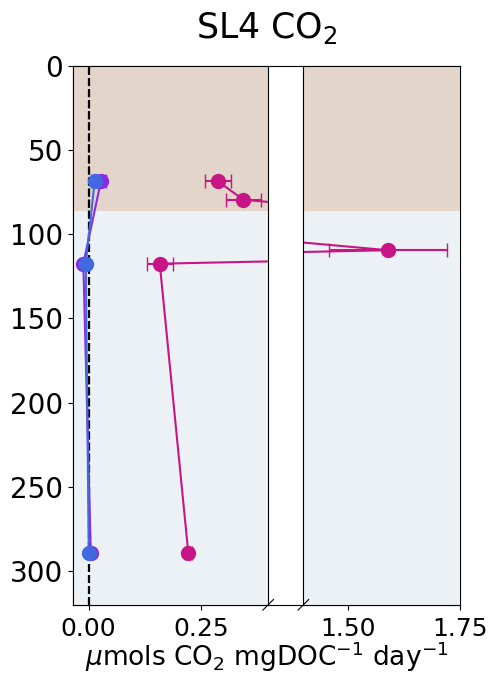

In [74]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL4_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(5, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3]),
        'SL4_dAA_25C': (colors[3], markers[3])
    },


    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

AL_min = 0
AL_max = 86
# talik_min = 40
# talik_max = 85
perma_min = 86
perma_max = 320

for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    bax = brokenaxes(xlims=((-0.035,0.4),(1.4,1.75)), ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = final_averaged_df[final_averaged_df['Name'].isin(names_with_color) &
                                       final_averaged_df['Name'].str.startswith(ending_term) &
                                       ~final_averaged_df['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['mean_Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['mean_Slope'])
        bax.errorbar(subset['mean_Slope'][mask], subset['depth (cm)'][mask],
                     xerr=subset['SE_Slope'][mask], ecolor=color, capsize=5,
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)

    #ax.set_ylim(0, 320)
    # ax.set_xlim(-0.1, 3)


# for i, ending_term in enumerate(ending_terms):
#     # ax = axes_groups #[i]
#     #ax.set_ylim(0, 320)
#     # ax2 = ax.twiny()
#     # subplot_spec = ax.get_subplotspec()
#     # bax = brokenaxes(xlims=((-0.5,10),), ylims=((320,0),), subplot_spec=subplot_spec)
#     for name, (color, marker) in CH4_color_maps.items():  # Iterate over the dictionary
#         if name.startswith(ending_term) and 'wet' not in name and name in CH4_DOC_results_final['Name'].unique():  # Check if name exists in DataFrame
#             subset = CH4_DOC_results_final[CH4_DOC_results_final['Name'] == name]
#             subset = subset.sort_values(by=['depth (cm)'])
#             mask = ~np.isnan(subset['Regression Slope'])
#             bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
#                      color=color, marker=marker, linestyle='-', markersize=11, mec='black', mew=0.2)


        bax.axvline(x=0, color='black', linestyle='--')
        bax.axhspan(AL_min, AL_max, facecolor='saddlebrown', alpha=0.08)
        # bax.axhspan(talik_min, talik_max, facecolor='orange', alpha=0.08)
        bax.axhspan(perma_min, perma_max, facecolor='lightsteelblue', alpha=0.08)

#     bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    bax.set_xlabel(r'$\mu$mols CO$_2$ mgDOC$^{-1}$ day$^{-1}$', fontsize=19, labelpad=25)
    bax.tick_params(axis='x', labelsize=18, rotation=0, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    bax.tick_params(axis='y', labelsize=20, labelcolor='black', color='black')
    ax.set_xticklabels([])  # Hide original x-axis tick labels
    ax.set_yticklabels([])
    ax.tick_params(axis='both', color='white') #idk couldnt get rid of ticks so colored them white
    # ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax.set_ylim(0, 320)
    # ax.set_xlim(-0.05, 0.55)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax2.set_xticks([])
    bax.set_title('SL4 CO$_{2}$', fontsize=25, pad=20)
    # ax.set_xticks([-0.5, 0.0, 0.5, 2.0, 3.0])

    # ax2.set_xlabel(r'$\mu$mols CH$_4$ mgDOC$^{-1}$ day$^{-1}$', color='red', fontsize=19, labelpad=5)
    # ax2.xaxis.set_label_coords(0.5, -0.2)
    # ax2.set_xticks([-0.5, 0.0, 1.0, 2.0, 3.0])
    # ax2.set_xticklabels([-0.5, 0.0, 1.0, 2.0, 3.0], fontsize=19)
    # ax2.spines['bottom'].set_position(('outward', 85))
    # ax2.spines['top'].set_position(('outward', 85))
    # ax2.spines['bottom'].set_color('red')


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(True)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    bax.axs[0].spines['top'].set_visible(True)
    bax.axs[0].spines['right'].set_visible(True)
    bax.axs[0].spines['left'].set_visible(True)
    bax.axs[1].spines['left'].set_visible(True)
    bax.axs[1].spines['top'].set_visible(True)

    # ax2.tick_params(axis='x', which='both', length=6, colors='red', pad=2, labelsize=18, rotation=40)
    # ax2.xaxis.set_ticks_position("bottom")  # Set tick position to bottom
    # ax2.xaxis.set_label_position("bottom")

# handles, labels = [], []
# for ax in fig.axes:  # Or iterate through desired axes
#     h, l = ax.get_legend_handles_labels()
#     h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
#     #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
#     handles.extend(h)
#     labels.extend(l)

# # Deduplicate legend entries
# unique_labels = []
# unique_handles = []
# for handle, label in zip(handles, labels):
#     if label not in unique_labels:
#         unique_labels.append(label)
#         unique_handles.append(handle)
# # Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.2, 1), ncol=1, fontsize=18)


# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

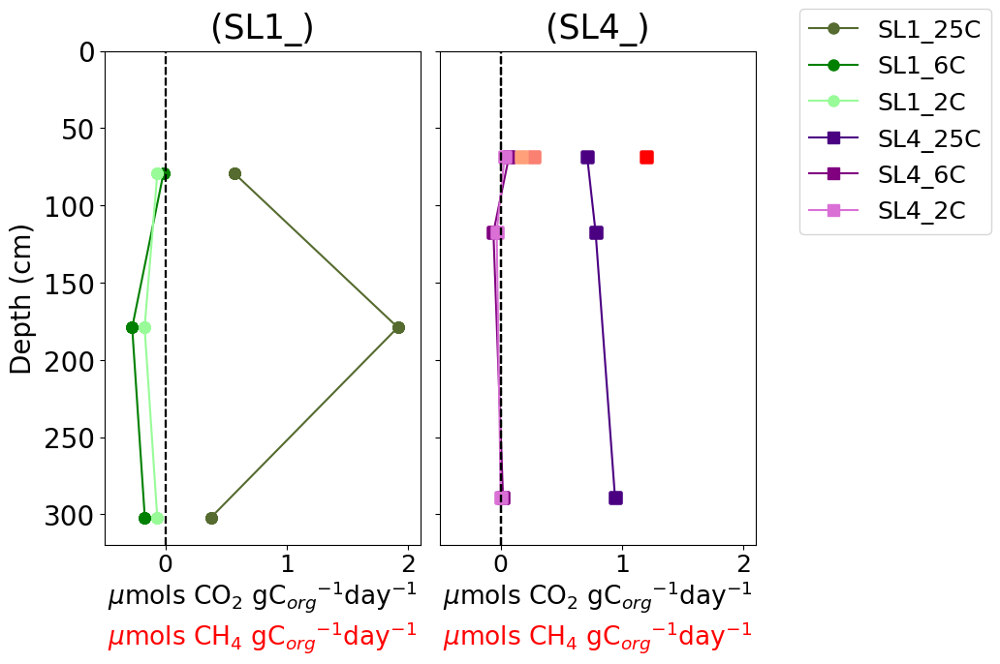

In [75]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL1_', 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(8, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['darkolivegreen', 'green', 'palegreen', 'indigo', 'purple', 'orchid', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 's', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        'SL4_CH4_dA_25C': (colors[7], markers[3]),
        'SL4_CH4_dA_6C': (colors[8], markers[3]),
        'SL4_CH4_dA_2C': (colors[9], markers[3])
        # 'SL4_AL_25C': (colors[3], markers[3]),
        # 'SL4_dAA_25C': (colors[3], markers[3])
    },

}

CH4_color_maps = {
        'SL4_dA_25C': ('red', 's'),
        'SL4_dA_6C': ('salmon', 's'),
        'SL4_dA_2C': ('lightsalmon', 's')
        # 'SL4_AL_25C': ('darkred', 's'),
        # 'SL4_dAA_25C': ('maroon', 's')
}


#also define labels
labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in CO2_TOC_results_final['Name'].unique() if name.startswith(ending_term) and 'wet' not in name]
    ax = axes_groups[i]

    for color, label in labels.items():
        names_with_color = [name for name in filtered_names if site_color_maps[ending_term].get(name, ('black', markers[7]))[0] == color]


        if names_with_color:  # Check if any names have this color
            # Concatenate data for names with the same color
            subset = pd.concat([CO2_TOC_results_final[CO2_TOC_results_final['Name'] == name] for name in names_with_color])

            # Sort by depth for proper line connection
            subset = subset.sort_values(by=['depth (cm)'])

            mask = ~np.isnan(subset['Regression Slope'])  # No error bars, add if needed
            ax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
                     label=label,
                     color=color, marker=site_color_maps[ending_term].get(names_with_color[0], ('black', markers[7]))[1],  # Use marker for the first name in the group
                     linestyle='-', markersize=8)
            ax.axvline(x=0, color='black', linestyle='--')


for i, ending_term in enumerate(ending_terms):
    ax = axes_groups[i]
    ax2 = ax.twiny()
    for name, (color, marker) in CH4_color_maps.items():  # Iterate over the dictionary
        if name.startswith(ending_term) and 'wet' not in name and name in CH4_TOC_results_final['Name'].unique():  # Check if name exists in DataFrame
            subset = CH4_TOC_results_final[CH4_TOC_results_final['Name'] == name]
            subset = subset.sort_values(by=['depth (cm)'])
            mask = ~np.isnan(subset['Regression Slope'])
            ax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
                     color=color, marker=marker, linestyle='-', markersize=8)

            ax.axvline(x=0, color='black', linestyle='--')
        # SL1_AL_min = 0
        # SL1_AL_max = 50
        # SL1_talik_min = 50
        # SL1_talik_max = 80
        # SL1_permafrost_min =80
        # SL1_permafrost_max = 320
        # SL4_AL_min = 0
        # SL4_AL_max = 70
        # SL4_permafrost_min = 70
        # SL4_permafrost_max = 320

        # ax.axhspan(SL1_AL_min, SL1_AL_max, color='brown', alpha=0.2)

    if i == 0:
      ax.set_ylabel('Depth (cm)', color='black', labelpad=5, fontsize=20)
    else:
      ax.set_ylabel('')

    ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    ax.set_xlabel(r'$\mu$mols CO$_2$ gC$_{org}$$^{-1}$day$^{-1}$', fontsize=19, labelpad=2)
    ax.tick_params(axis='x', labelsize=18, rotation=0, pad=2)
    #ax2.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    #ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    ax.set_ylim(0, 320)
    ax.set_xlim(-0.5, 2.1)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    ax2.set_xticks([])
    ax.set_title(f'({ending_term})', fontsize=25, pad=10)
    # ax.set_xticks([-0.5, 0.0, 1.0, 2.0, 2.5])

    ax2.set_xlabel(r'$\mu$mols CH$_4$ gC$_{org}$$^{-1}$day$^{-1}$', color='red', fontsize=19, labelpad=5, loc='center')
    ax2.xaxis.set_label_coords(0.5, -0.2)
    # ax2.set_xticks([-0.5, 0.0, 1.0, 2.0, 2.5])
    # ax2.set_xticklabels([-0.5, 0.0, 1.0, 2.0, 2.5], fontsize=19)
    # ax2.spines['bottom'].set_position(('outward', 85))
    # ax2.spines['top'].set_position(('outward', 85))
    # ax2.spines['bottom'].set_color('red')


    ax2.spines['top'].set_visible(False)
    ax2.spines['bottom'].set_visible(False)
    ax2.spines['right'].set_visible(False)
    ax2.spines['left'].set_visible(False)
    # ax2.tick_params(axis='x', which='both', length=6, colors='red', pad=2, labelsize=18, rotation=40)
    # ax2.xaxis.set_ticks_position("bottom")  # Set tick position to bottom
    # ax2.xaxis.set_label_position("bottom")

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.3, 1), ncol=1, fontsize=18)


plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

In [76]:
CH4_TOC_results_final

,incubation time,total CH4/gC,Regression Slope,Regression Intercept,R-squared,Name,depth (cm)
0,1,0.812661,1.200472,1.742649,0.931640,SL4_dA_25C,68.5
1,8,9.532067,1.200472,1.742649,0.931640,SL4_dA_25C,68.5
2,15,14.418749,1.200472,1.742649,0.931640,SL4_dA_25C,68.5
3,58,59.704184,1.200472,1.742649,0.931640,SL4_dA_25C,68.5
4,96,156.674603,1.200472,1.742649,0.931640,SL4_dA_25C,68.5
5,162,177.474149,1.200472,1.742649,0.931640,SL4_dA_25C,68.5
6,1,0.149454,0.276109,-1.576901,0.952873,SL4_dA_6C,68.5
7,8,0.740664,0.276109,-1.576901,0.952873,SL4_dA_6C,68.5
8,15,1.301340,0.276109,-1.576901,0.952873,SL4_dA_6C,68.5
9,29,4.044895,0.276109,-1.576901,0.952873,SL4_dA_6C,68.5


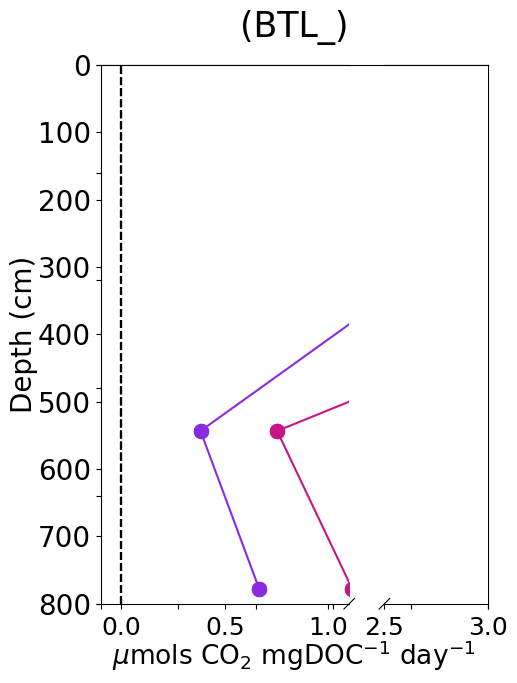

In [77]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['BTL_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(5, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        'SL4_CH4_dA_25C': (colors[7], markers[3]),
        'SL4_CH4_dA_6C': (colors[8], markers[3]),
        'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3])
    },

    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

CH4_color_maps = {
        'SL4_dA_25C': ('red', '^'),
        'SL4_dA_6C': ('darkorange', '^'),
        'SL4_dA_2C': ('gold', '^'),
        'SL4_AL_25C': ('darkred', 's')
}


#also define labels
labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'royalblue':'SL1_2C', 'navy': 'SL4_25C', 'blue':'SL4_6C', 'lightblue':'SL4_2C'}

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in CO2_DOC_results_final['Name'].unique() if name.startswith(ending_term) and 'wet' not in name]
    ax = axes_groups #[i]
    # ax.set_xscale('log')
    # ax.set_ylim(0, 320)
    subplot_spec = ax.get_subplotspec()
    bax = brokenaxes(xlims=((-0.1,1.1),(2.5,3)), ylims=((800,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, label in labels.items():
        names_with_color = [name for name in filtered_names if site_color_maps[ending_term].get(name, ('black', markers[7]))[0] == color]


        if names_with_color:  # Check if any names have this color
            # Concatenate data for names with the same color
            subset = pd.concat([CO2_DOC_results_final[CO2_DOC_results_final['Name'] == name] for name in names_with_color])

            # Sort by depth for proper line connection
            subset = subset.sort_values(by=['depth (cm)'])

            mask = ~np.isnan(subset['Regression Slope'])  # No error bars, add if needed
            bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
                     label=label,
                     color=color, marker=site_color_maps[ending_term].get(names_with_color[0], ('black', markers[7]))[1],  # Use marker for the first name in the group
                     linestyle='-', markersize=10)

    #ax.set_ylim(0, 320)
    # ax.set_xlim(-0.1, 3)


for i, ending_term in enumerate(ending_terms):
    # ax = axes_groups #[i]
    #ax.set_ylim(0, 320)
    # ax2 = ax.twiny()
    # subplot_spec = ax.get_subplotspec()
    # bax = brokenaxes(xlims=((-0.5,10),), ylims=((320,0),), subplot_spec=subplot_spec)
    for name, (color, marker) in CH4_color_maps.items():  # Iterate over the dictionary
        if name.startswith(ending_term) and 'wet' not in name and name in CH4_DOC_results_final['Name'].unique():  # Check if name exists in DataFrame
            subset = CH4_DOC_results_final[CH4_DOC_results_final['Name'] == name]
            subset = subset.sort_values(by=['depth (cm)'])
            mask = ~np.isnan(subset['Regression Slope'])
            bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
                     color=color, marker=marker, linestyle='-', markersize=11, mec='black', mew=0.2)


        bax.axvline(x=0, color='black', linestyle='--')

    bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    bax.set_xlabel(r'$\mu$mols CO$_2$ mgDOC$^{-1}$ day$^{-1}$', fontsize=19, labelpad=25)
    bax.tick_params(axis='x', labelsize=18, rotation=0, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    bax.tick_params(axis='y', labelsize=20, labelcolor='black')
    ax.set_xticklabels([])  # Hide original x-axis tick labels
    ax.set_yticklabels([])
    # ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax.set_ylim(0, 320)
    # ax.set_xlim(-0.05, 0.55)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax2.set_xticks([])
    bax.set_title(f'({ending_term})', fontsize=25, pad=20)
    # ax.set_xticks([-0.5, 0.0, 0.5, 2.0, 3.0])

    # ax2.set_xlabel(r'$\mu$mols CH$_4$ mgDOC$^{-1}$ day$^{-1}$', color='red', fontsize=19, labelpad=5)
    # ax2.xaxis.set_label_coords(0.5, -0.2)
    # ax2.set_xticks([-0.5, 0.0, 1.0, 2.0, 3.0])
    # ax2.set_xticklabels([-0.5, 0.0, 1.0, 2.0, 3.0], fontsize=19)
    # ax2.spines['bottom'].set_position(('outward', 85))
    # ax2.spines['top'].set_position(('outward', 85))
    # ax2.spines['bottom'].set_color('red')


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(False)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(False)
    bax.axs[0].spines['top'].set_visible(True)
    bax.axs[1].spines['top'].set_visible(True)

    # ax2.tick_params(axis='x', which='both', length=6, colors='red', pad=2, labelsize=18, rotation=40)
    # ax2.xaxis.set_ticks_position("bottom")  # Set tick position to bottom
    # ax2.xaxis.set_label_position("bottom")

# handles, labels = [], []
# for ax in fig.axes:  # Or iterate through desired axes
#     h, l = ax.get_legend_handles_labels()
#     h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
#     #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
#     handles.extend(h)
#     labels.extend(l)

# # Deduplicate legend entries
# unique_labels = []
# unique_handles = []
# for handle, label in zip(handles, labels):
#     if label not in unique_labels:
#         unique_labels.append(label)
#         unique_handles.append(handle)
# # Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.2, 1), ncol=1, fontsize=18)


# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

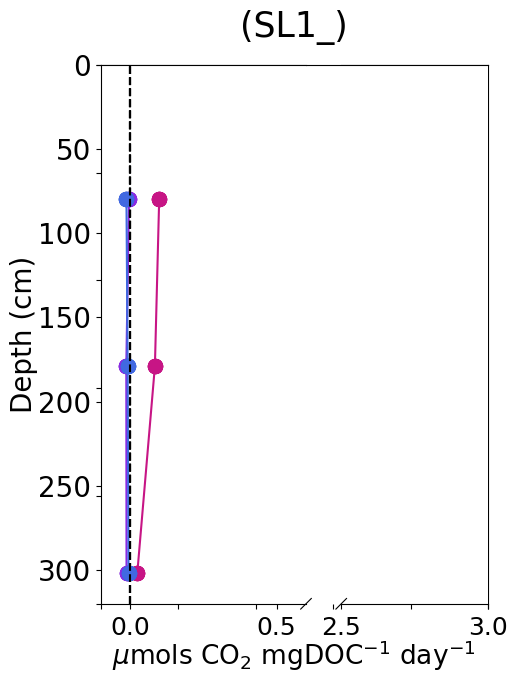

In [78]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL1_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(5, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        'SL4_CH4_dA_25C': (colors[7], markers[3]),
        'SL4_CH4_dA_6C': (colors[8], markers[3]),
        'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3])
    },

    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

CH4_color_maps = {
        'SL4_dA_25C': ('red', '^'),
        'SL4_dA_6C': ('darkorange', '^'),
        'SL4_dA_2C': ('gold', '^'),
        'SL4_AL_25C': ('darkred', 's')
}


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'lightgrey':'SL1_2C', 'grey':'SL1_6C', 'darkgrey':'SL1_25C', 'navy': 'SL4_25C', 'blue':'SL4_6C', 'lightblue':'SL4_2C'}

for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    bax = brokenaxes(xlims=((-0.1,0.6),(2.5,3)), ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = CO2_DOC_results_final[CO2_DOC_results_final['Name'].isin(names_with_color) &
                                       CO2_DOC_results_final['Name'].str.startswith(ending_term) &
                                       ~CO2_DOC_results_final['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['Regression Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['Regression Slope'])
        bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)


# for i, ending_term in enumerate(ending_terms):
#     # ax = axes_groups #[i]
#     #ax.set_ylim(0, 320)
#     # ax2 = ax.twiny()
#     # subplot_spec = ax.get_subplotspec()
#     # bax = brokenaxes(xlims=((-0.5,10),), ylims=((320,0),), subplot_spec=subplot_spec)
#     for name, (color, marker) in CH4_color_maps.items():  # Iterate over the dictionary
#         if name.startswith(ending_term) and 'wet' not in name and name in CH4_DOC_results_final['Name'].unique():  # Check if name exists in DataFrame
#             subset = CH4_DOC_results_final[CH4_DOC_results_final['Name'] == name]
#             subset = subset.sort_values(by=['depth (cm)'])
#             mask = ~np.isnan(subset['Regression Slope'])
#             bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
#                      color=color, marker=marker, linestyle='-', markersize=11, mec='black', mew=0.2)


        bax.axvline(x=0, color='black', linestyle='--')

    bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    bax.set_xlabel(r'$\mu$mols CO$_2$ mgDOC$^{-1}$ day$^{-1}$', fontsize=19, labelpad=25)
    bax.tick_params(axis='x', labelsize=18, rotation=0, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    bax.tick_params(axis='y', labelsize=20, labelcolor='black')
    ax.set_xticklabels([])  # Hide original x-axis tick labels
    ax.set_yticklabels([])
    # ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax.set_ylim(0, 320)
    # ax.set_xlim(-0.05, 0.55)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax2.set_xticks([])
    bax.set_title(f'({ending_term})', fontsize=25, pad=20)
    # ax.set_xticks([-0.5, 0.0, 0.5, 2.0, 3.0])

    # ax2.set_xlabel(r'$\mu$mols CH$_4$ mgDOC$^{-1}$ day$^{-1}$', color='red', fontsize=19, labelpad=5)
    # ax2.xaxis.set_label_coords(0.5, -0.2)
    # ax2.set_xticks([-0.5, 0.0, 1.0, 2.0, 3.0])
    # ax2.set_xticklabels([-0.5, 0.0, 1.0, 2.0, 3.0], fontsize=19)
    # ax2.spines['bottom'].set_position(('outward', 85))
    # ax2.spines['top'].set_position(('outward', 85))
    # ax2.spines['bottom'].set_color('red')


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(False)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(False)
    bax.axs[0].spines['top'].set_visible(True)
    bax.axs[1].spines['top'].set_visible(True)

    # ax2.tick_params(axis='x', which='both', length=6, colors='red', pad=2, labelsize=18, rotation=40)
    # ax2.xaxis.set_ticks_position("bottom")  # Set tick position to bottom
    # ax2.xaxis.set_label_position("bottom")

# handles, labels = [], []
# for ax in fig.axes:  # Or iterate through desired axes
#     h, l = ax.get_legend_handles_labels()
#     h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
#     #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
#     handles.extend(h)
#     labels.extend(l)

# # Deduplicate legend entries
# unique_labels = []
# unique_handles = []
# for handle, label in zip(handles, labels):
#     if label not in unique_labels:
#         unique_labels.append(label)
#         unique_handles.append(handle)
# # Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.2, 1), ncol=1, fontsize=18)


# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

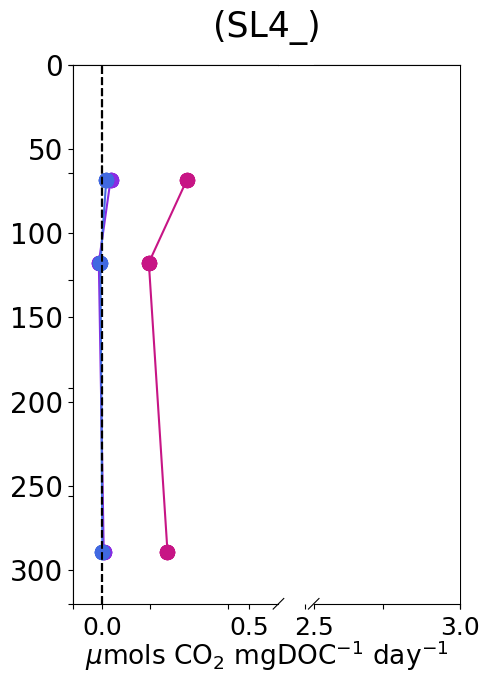

In [79]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL4_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(5, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        # 'SL4_CH4_dA_25C': (colors[7], markers[3]),
        # 'SL4_CH4_dA_6C': (colors[8], markers[3]),
        # 'SL4_CH4_dA_2C': (colors[9], markers[3]),
        # 'SL4_AL_25C': (colors[3], markers[3])
    },

    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

# CH4_color_maps = {
#         'SL4_dA_25C': ('red', '^'),
#         'SL4_dA_6C': ('darkorange', '^'),
#         'SL4_dA_2C': ('gold', '^'),
#         'SL4_AL_25C': ('red', '^')
# }


#also define labels
# labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'silver':'SL1_2C', 'darkgray': 'SL1_25C', 'darkgray':'SL1_6C', 'lightblue':'SL4_2C'}

for ending_term in ending_terms:
    ax = axes_groups #[i]
    subplot_spec = ax.get_subplotspec()
    bax = brokenaxes(xlims=((-0.1,0.6),(2.5,3)), ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, marker in set(site_color_maps[ending_term].values()): # Iterate through unique colors
        names_with_color = [name for name, (c, _) in site_color_maps[ending_term].items() if c == color] # Filter names with the current color
        subset = CO2_DOC_results_final[CO2_DOC_results_final['Name'].isin(names_with_color) &
                                       CO2_DOC_results_final['Name'].str.startswith(ending_term) &
                                       ~CO2_DOC_results_final['Name'].str.contains('wet')]

        subset = subset.sort_values(by=['depth (cm)'])
        subset = subset.dropna(subset=['Regression Slope', 'depth (cm)'])

        mask = ~np.isnan(subset['Regression Slope'])
        bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
                 label=names_with_color[0],  # Use first site name for label
                 color=color, marker=marker,
                 linestyle='-', markersize=10)

    #ax.set_ylim(0, 320)
    # ax.set_xlim(-0.1, 3)


# for i, ending_term in enumerate(ending_terms):
#     # ax = axes_groups #[i]
#     #ax.set_ylim(0, 320)
#     # ax2 = ax.twiny()
#     # subplot_spec = ax.get_subplotspec()
#     # bax = brokenaxes(xlims=((-0.5,10),), ylims=((320,0),), subplot_spec=subplot_spec)
#     for name, (color, marker) in CH4_color_maps.items():  # Iterate over the dictionary
#         if name.startswith(ending_term) and 'wet' not in name and name in CH4_DOC_results_final['Name'].unique():  # Check if name exists in DataFrame
#             subset = CH4_DOC_results_final[CH4_DOC_results_final['Name'] == name]
#             subset = subset.sort_values(by=['depth (cm)'])
#             mask = ~np.isnan(subset['Regression Slope'])
#             bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
#                      color=color, marker=marker, linestyle='-', markersize=11, mec='black', mew=0.2)


        bax.axvline(x=0, color='black', linestyle='--')

#     bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    bax.set_xlabel(r'$\mu$mols CO$_2$ mgDOC$^{-1}$ day$^{-1}$', fontsize=19, labelpad=25)
    bax.tick_params(axis='x', labelsize=18, rotation=0, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    bax.tick_params(axis='y', labelsize=20, labelcolor='black')
    ax.set_xticklabels([])  # Hide original x-axis tick labels
    ax.set_yticklabels([])
    # ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax.set_ylim(0, 320)
    # ax.set_xlim(-0.05, 0.55)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax2.set_xticks([])
    bax.set_title(f'({ending_term})', fontsize=25, pad=20)
    # ax.set_xticks([-0.5, 0.0, 0.5, 2.0, 3.0])

    # ax2.set_xlabel(r'$\mu$mols CH$_4$ mgDOC$^{-1}$ day$^{-1}$', color='red', fontsize=19, labelpad=5)
    # ax2.xaxis.set_label_coords(0.5, -0.2)
    # ax2.set_xticks([-0.5, 0.0, 1.0, 2.0, 3.0])
    # ax2.set_xticklabels([-0.5, 0.0, 1.0, 2.0, 3.0], fontsize=19)
    # ax2.spines['bottom'].set_position(('outward', 85))
    # ax2.spines['top'].set_position(('outward', 85))
    # ax2.spines['bottom'].set_color('red')


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(False)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    bax.axs[0].spines['top'].set_visible(True)
    # bax.axs[0].spines['right'].set_visible(True)
    # bax.axs[0].spines['left'].set_visible(True)
    # bax.axs[1].spines['left'].set_visible(True)
    bax.axs[1].spines['top'].set_visible(True)

    # ax2.tick_params(axis='x', which='both', length=6, colors='red', pad=2, labelsize=18, rotation=40)
    # ax2.xaxis.set_ticks_position("bottom")  # Set tick position to bottom
    # ax2.xaxis.set_label_position("bottom")

# handles, labels = [], []
# for ax in fig.axes:  # Or iterate through desired axes
#     h, l = ax.get_legend_handles_labels()
#     h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
#     #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
#     handles.extend(h)
#     labels.extend(l)

# # Deduplicate legend entries
# unique_labels = []
# unique_handles = []
# for handle, label in zip(handles, labels):
#     if label not in unique_labels:
#         unique_labels.append(label)
#         unique_handles.append(handle)
# # Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.2, 1), ncol=1, fontsize=18)


# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

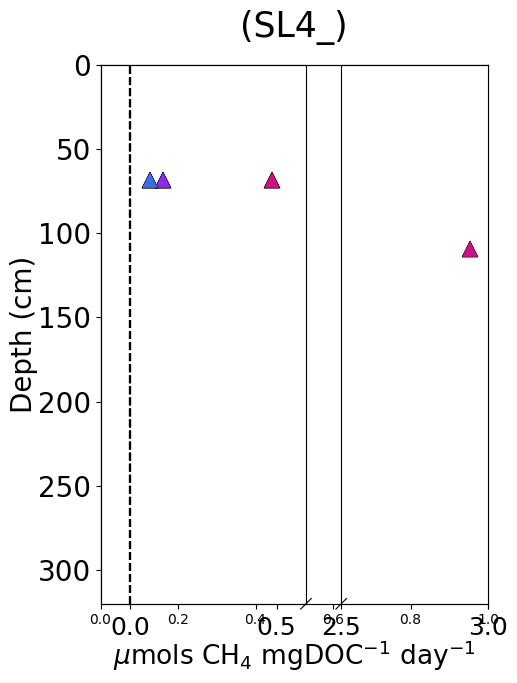

In [80]:
#depth profile
# Define the ending terms you want to filter by
ending_terms = ['SL4_'] #, 'SL4_'] #_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(5, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)
# ax1=fig.add_subplot(gs[0,0])

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['darkgray', 'darkgrey', 'silver', 'darkgray', 'darkgrey', 'silver', 'darkgreen', 'salmon', 'coral', 'lghtsalmon'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },

    'SL4_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
        'SL4_CH4_dA_25C': (colors[7], markers[3]),
        'SL4_CH4_dA_6C': (colors[8], markers[3]),
        'SL4_CH4_dA_2C': (colors[9], markers[3]),
        'SL4_AL_25C': (colors[3], markers[3])
    },

    'BTL_': {  # Color mapping for names ending with 'dC'
        # 'BTL_dA_25C': (colors[3], markers[3]),
        # 'BTL_dA_6C': (colors[4], markers[3]),
        'BTL_dC_25C': (colors[3], markers[3]),
        'BTL_dC_6C': (colors[4], markers[3]),
        'BTL_dD_25C': (colors[3], markers[3]),
        'BTL_dD_6C': (colors[4], markers[3]),
        'BTL_dE_25C': (colors[3], markers[3]),
        'BTL_dE_6C': (colors[4], markers[3])
    },

}

CH4_color_maps = {
        'SL4_dA_25C': ('mediumvioletred', '^'),
        'SL4_dA_6C': ('blueviolet', '^'),
        'SL4_dA_2C': ('royalblue', '^'),
        'SL4_AL_25C': ('mediumvioletred', '^')
}


#also define labels
labels = {'mediumvioletred':'BTL_25C', 'darkgreen':'SL1_25C_wet', 'blueviolet': 'BTL_6C', 'royalblue':'SL1_2C', 'darkgray': 'SL4_25C', 'darkgrey':'SL4_6C', 'silver':'SL4_2C'}

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in CO2_DOC_results_final['Name'].unique() if name.startswith(ending_term) and 'wet' not in name]
    ax = axes_groups #[i]
    # ax.set_xscale('log')
    # ax.set_ylim(0, 320)
    # subplot_spec = ax.get_subplotspec()
    bax = brokenaxes(xlims=((-0.1,0.6),(2.5,3)), ylims=((320,0),), subplot_spec=subplot_spec, hspace=0.4)

    for color, label in labels.items():
        names_with_color = [name for name in filtered_names if site_color_maps[ending_term].get(name, ('black', markers[7]))[0] == color]


        # if names_with_color:  # Check if any names have this color
        #     # Concatenate data for names with the same color
        #     subset = pd.concat([CO2_DOC_results_final[CO2_DOC_results_final['Name'] == name] for name in names_with_color])

        #     # Sort by depth for proper line connection
        #     subset = subset.sort_values(by=['depth (cm)'])

        #     mask = ~np.isnan(subset['Regression Slope'])  # No error bars, add if needed
        #     bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
        #              label=label,
        #              color=color, marker=site_color_maps[ending_term].get(names_with_color[0], ('black', markers[7]))[1],  # Use marker for the first name in the group
        #              linestyle='-', markersize=10)

    #ax.set_ylim(0, 320)
    # ax.set_xlim(-0.1, 3)


for i, ending_term in enumerate(ending_terms):
    # ax = axes_groups #[i]
    #ax.set_ylim(0, 320)
    ax2 = ax.twiny()
    # subplot_spec = ax.get_subplotspec()
    # bax = brokenaxes(xlims=((-0.5,10),), ylims=((320,0),), subplot_spec=subplot_spec)
    for name, (color, marker) in CH4_color_maps.items():  # Iterate over the dictionary
        if name.startswith(ending_term) and 'wet' not in name and name in CH4_DOC_results_final['Name'].unique():  # Check if name exists in DataFrame
            subset = CH4_DOC_results_final[CH4_DOC_results_final['Name'] == name]
            subset = subset.sort_values(by=['depth (cm)'])
            mask = ~np.isnan(subset['Regression Slope'])
            bax.plot(subset['Regression Slope'][mask], subset['depth (cm)'][mask],
                     color=color, marker=marker, linestyle='-', markersize=11, mec='black', mew=0.2)


        bax.axvline(x=0, color='black', linestyle='--')

    bax.set_ylabel('Depth (cm)', color='black', labelpad=45, fontsize=20)

    # ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    # bax.set_xlabel(r'$\mu$mols CO$_2$ mgDOC$^{-1}$ day$^{-1}$', fontsize=19, labelpad=25)
    bax.tick_params(axis='x', labelsize=18, rotation=0, pad=5)
    #ax2.tick_params(axis='x', labelsize=18)
    bax.tick_params(axis='y', labelsize=20, labelcolor='black')
    ax2.set_xticklabels([])  # Hide original x-axis tick labels
    ax2.set_yticklabels([])
    ax2.set_xticks([])
    ax2.set_yticks([])

    # ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax.set_ylim(0, 320)
    # ax.set_xlim(-0.05, 0.55)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax2.set_xticks([])
    bax.set_title(f'({ending_term})', fontsize=25, pad=20)
    # ax.set_xticks([-0.5, 0.0, 0.5, 2.0, 3.0])

    bax.set_xlabel(r'$\mu$mols CH$_4$ mgDOC$^{-1}$ day$^{-1}$', color='black', fontsize=19, labelpad=25)
    # ax2.xaxis.set_label_coords(0.5, -0.2)
    # ax2.set_xticks([-0.5, 0.0, 1.0, 2.0, 3.0])
    # ax2.set_xticklabels([-0.5, 0.0, 1.0, 2.0, 3.0], fontsize=19)
    # ax2.spines['bottom'].set_position(('outward', 85))
    # ax2.spines['top'].set_position(('outward', 85))
    # ax2.spines['bottom'].set_color('red')


    ax.spines['top'].set_visible(True)
    ax.spines['bottom'].set_visible(False)
    ax.spines['right'].set_visible(True)
    ax.spines['left'].set_visible(True)
    bax.axs[0].spines['top'].set_visible(True)
    bax.axs[0].spines['right'].set_visible(True)
    bax.axs[0].spines['left'].set_visible(True)
    bax.axs[1].spines['left'].set_visible(True)
    bax.axs[1].spines['top'].set_visible(True)

    # ax2.tick_params(axis='x', which='both', length=6, colors='red', pad=2, labelsize=18, rotation=40)
    # ax2.xaxis.set_ticks_position("bottom")  # Set tick position to bottom
    # ax2.xaxis.set_label_position("bottom")

# handles, labels = [], []
# for ax in fig.axes:  # Or iterate through desired axes
#     h, l = ax.get_legend_handles_labels()
#     h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
#     #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
#     handles.extend(h)
#     labels.extend(l)

# # Deduplicate legend entries
# unique_labels = []
# unique_handles = []
# for handle, label in zip(handles, labels):
#     if label not in unique_labels:
#         unique_labels.append(label)
#         unique_handles.append(handle)
# # Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.2, 1), ncol=1, fontsize=18)


# plt.tight_layout()
plt.gca().invert_yaxis()

# Show the plot
plt.show()

In [81]:
#day 162 - day 1 over time
resp_CO2_hilman_slim_pivot = resp_CO2_hilman_slim.pivot(index='Name', columns='incubation time', values='total CO2/gC')

resp_CO2_hilman_slim_pivot['net diff'] = (resp_CO2_hilman_slim_pivot[162] - resp_CO2_hilman_slim_pivot[1])/161
resp_CO2_hilman_slim_pivot['day 8'] = (resp_CO2_hilman_slim_pivot[8] - resp_CO2_hilman_slim_pivot[1])/7
resp_CO2_hilman_slim_pivot['day 15'] = (resp_CO2_hilman_slim_pivot[15] - resp_CO2_hilman_slim_pivot[8])/7
resp_CO2_hilman_slim_pivot['day 29'] = (resp_CO2_hilman_slim_pivot[29] - resp_CO2_hilman_slim_pivot[15])/14
resp_CO2_hilman_slim_pivot['day 58'] = (resp_CO2_hilman_slim_pivot[58] - resp_CO2_hilman_slim_pivot[29])/29
resp_CO2_hilman_slim_pivot['day 96'] = (resp_CO2_hilman_slim_pivot[96] - resp_CO2_hilman_slim_pivot[58])/38
resp_CO2_hilman_slim_pivot['day 162'] = (resp_CO2_hilman_slim_pivot[162] - resp_CO2_hilman_slim_pivot[96])/66

#assign avg depths to each sample
depth_mapping = {
    'SL1_dA_25C': 79.5,
    'SL1_dA_6C': 79.5,
    'SL1_dA_2C': 79.5,
    'SL1_dB_25C': 179,
    'SL1_dB_6C': 179,
    'SL1_dB_2C': 179,
    'SL1_dC_25C': 302,
    'SL1_dC_6C': 302,
    'SL1_dC_2C': 302,
    'SL1_dC_25C_wet': 302,
    'SL4_dA_25C': 51.5,
    'SL4_dA_6C': 51.5,
    'SL4_dA_2C': 51.5,
    'SL4_dB_25C': 99,
    'SL4_dB_6C': 99,
    'SL4_dB_2C': 99,
    'SL4_dC_25C': 272,
    'SL4_dC_6C': 272,
    'SL4_dC_2C': 272
}

resp_CO2_hilman_slim_pivot.reset_index(inplace=True)

resp_CO2_hilman_slim_pivot['depth (cm)'] = resp_CO2_hilman_slim_pivot['Name'].map(depth_mapping)

resp_CO2_hilman_slim_pivot

incubation time,Name,1,8,11,15,17,27,29,30,35,...,161,162,net diff,day 8,day 15,day 29,day 58,day 96,day 162,depth (cm)
0,BTL_dA_25C,22.392714,NaN,NaN,NaN,81.936872,106.979415,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BTL_dA_6C,11.858138,NaN,NaN,NaN,50.961322,95.778352,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BTL_dB_25C,26.855737,NaN,NaN,NaN,55.759194,46.411590,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BTL_dB_6C,19.719624,NaN,NaN,NaN,40.833850,40.487068,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BTL_dC_25C,96.244089,NaN,NaN,NaN,283.852253,260.105561,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,BTL_dC_6C,43.021476,NaN,NaN,NaN,133.426964,134.542834,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,BTL_dD_25C,94.725762,NaN,NaN,NaN,199.158513,189.494904,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,BTL_dD_6C,52.814252,NaN,NaN,NaN,103.315116,101.453519,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,BTL_dE_25C,99.029948,NaN,NaN,NaN,279.761685,239.704472,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,BTL_dE_6C,38.801092,NaN,NaN,NaN,124.093751,126.584033,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#graphs

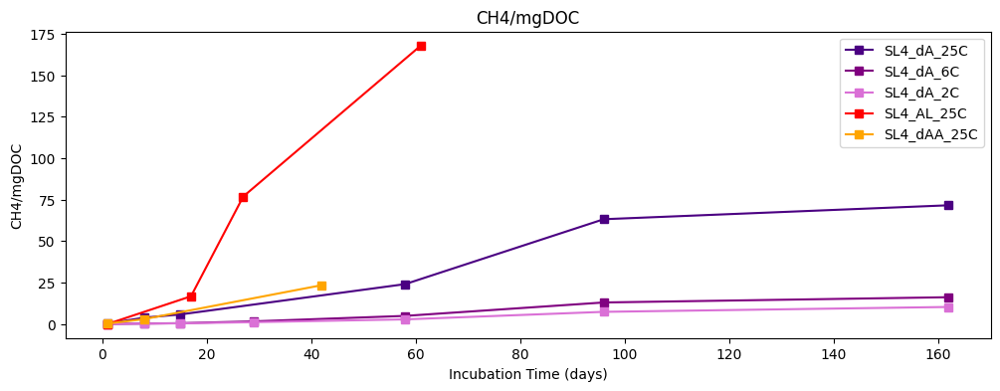

In [82]:
#plot CH4/gC over time
unique_names = C_DOC_CH4['Name'].unique()
color_map ={
    'SL4_dA_25C': 'indigo',
    'SL4_dA_6C': 'purple',
    'SL4_dA_2C': 'orchid',
    'SL4_AL_25C': 'red',
    'SL4_dAA_25C': 'orange'
}
labels = {'indigo':'SL4_dA_25C', 'purple': 'SL4_dA_6C', 'orchid':'SL4_dA_2C', 'red':'SL4_AL_25C', 'orange':'SL4_dAA_25C'}

fig, ax = plt.subplots(1, 1, figsize=(12, 4))
for name, color in color_map.items():
  # for name, (color) in color_map.items():
  #   for color, label in labels.items():
    subset = C_DOC_CH4[C_DOC_CH4['Name'] == name]
    # color = color_map.get(name)
    # label = labels.get(color)
    mask = ~np.isnan(subset['total CH4/mgC']) #No error bars, add if needed
    ax.plot(subset['incubation time'][mask], subset['total CH4/mgC'][mask], color=color, label=name, marker = 's', linestyle='-')


ax.set_title('CH4/mgDOC')
ax.set_xlabel('Incubation Time (days)')
ax.set_ylabel('CH4/mgDOC')
ax.legend()
plt.show()

In [83]:
CO2_gDW['SE CO2/g'].mean()

np.float64(0.23476801653152063)

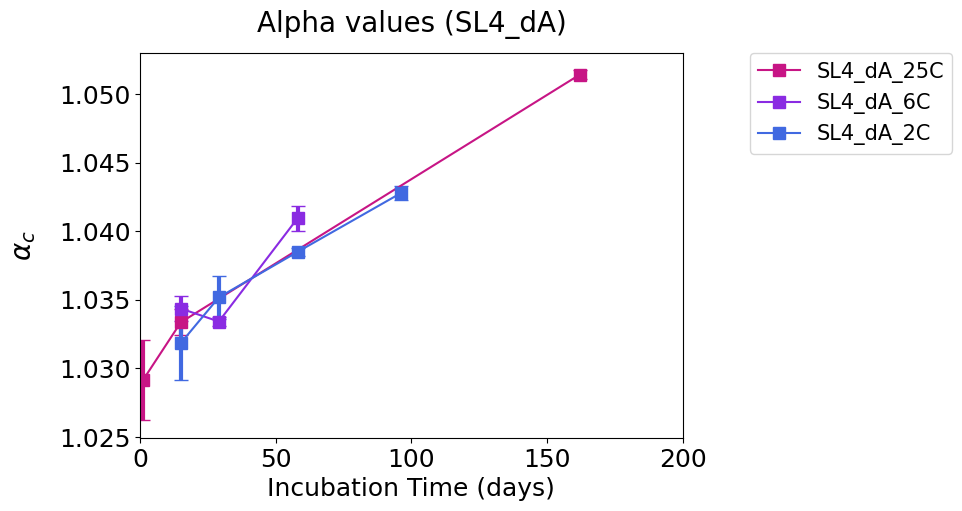

In [84]:
# alpha_final
# Filter for names starting with 'SL1'
sl4_names_CH4 = ['SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C']      #name for name in sorted_df_CH4['Name'].unique() if name.startswith('SL4')]
# colors = plt.cm.get_cmap('viridis', len(sl4_names))
colors = ['mediumvioletred', 'blueviolet', 'royalblue']

site_color_maps = {
    'SL4_dA_25C': ('mediumvioletred', 's'),
    'SL4_dA_6C': ('blueviolet', 's'),
    'SL4_dA_2C': ('royalblue', 's'),
}

iso_color_maps = {
    'SL4_dA_25C': ('mediumvioletred', 's'),
    'SL4_dA_6C': ('blueviolet', 's'),
    'SL4_dA_2C': ('royalblue', 's'),
}

# Define a list of markers
markers = ['o', 'o', 'o', 's', 's', 's', '^', '^', '^']  # Add more if needed


fig, (ax1) = plt.subplots(1,1,figsize=(7, 5), sharex='col',
                               gridspec_kw={'height_ratios': [1],
                                            'hspace': 0.1})

# ax2 = axes.twinx()

for i, name in enumerate(sl4_names_CH4):
    subset = alpha_final[alpha_final['Name'] == name]
    subset = subset.dropna(subset=['SE alpha'])
    color, marker = site_color_maps.get(name, ('black', markers[7]))
    if not subset.empty:
      ax1.errorbar(subset['incubation time'], subset['alpha'],
                  yerr=subset['SE alpha'],
                  color=color, marker=marker, label=name, #+' CH$_4$',
                  ecolor=color, capsize=5, markersize=8.5, elinewidth=3)


ax1.set_xlabel('Incubation Time (days)', fontsize=18)
ax1.set_ylabel(r'$\alpha_{c}$', color='black', fontsize=20, labelpad=15)
# ax1.annotate('($\mu$mols/gC$_o$$_r$$_g$)', xy=(0,1), xycoords='axes fraction', fontsize=12, ha='center', xytext=(-50,-90), textcoords='offset points', va='top', rotation=90)
# ax2.set_ylabel('$\delta$$^{13}$C-CH$_{4}$', rotation=90, labelpad=15, color='black', fontsize=20)
# ax3.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', labelpad=8, color='black', fontsize=20)

ax1.tick_params(axis='y', labelcolor='black', labelsize=18)
# ax2.tick_params(axis='y', labelcolor='black', labelsize=20)
ax1.tick_params(axis='x', labelsize=18)
# ax3.tick_params(axis='y', labelcolor='black', labelsize=20)
# ax3.tick_params(axis='x', labelsize=20)
# ax1.set_xticks([])

# ax1.set_ylim(-5,500)
# ax2.set_ylim(-70,-20)

ax1.set_xlim(0,200)
# ax2.set_xlim(0,200)
# ax3.set_xlim(0,200)

# ax2.yaxis.tick_left()
# ax2.yaxis.set_label_position("left")

ax1.set_title('Alpha values (SL4_dA)', fontsize=20, pad=15)
# plt.grid(True)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
handle_seen = set()  # Keep track of seen handles

for handle, label in zip(handles, labels):
    if handle not in handle_seen:  # Check if the handle is unique
        unique_labels.append(label)
        unique_handles.append(handle)
        handle_seen.add(handle)  # Mark the handle as seen
    else:
        unique_labels.append(label)  # Add the label even if the handle is duplicate
        unique_handles.append(matplotlib.patches.Rectangle((0, 0), 0, 0, fill=False, edgecolor='none', visible=False))
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.3, 0.9), ncol=1, fontsize=15)

# axes.legend(handles, labels, bbox_to_anchor=(1.05,1), loc='upper left')
# ax2.legend(handles, labels, bbox_to_anchor=(1.05,0.85), loc='upper left')
plt.subplots_adjust(wspace=0, hspace=0)
# plt.tight_layout()
plt.show()


In [85]:
# Define the sample names for which you want to fill NaNs
target_names = ['SL4_dC_25C', 'SL1_dB_25C']
target_times = [1, 8, 15, 29, 58, 96, 162]

# Create a mask for those rows
mask = (
    sorted_df_CH4['Name'].isin(target_names) &
    sorted_df_CH4['incubation time'].isin(target_times)
)

numeric_cols = sorted_df_CH4.select_dtypes(include='number').columns
sorted_df_CH4.loc[mask, numeric_cols] = sorted_df_CH4.loc[mask, numeric_cols].fillna(0)


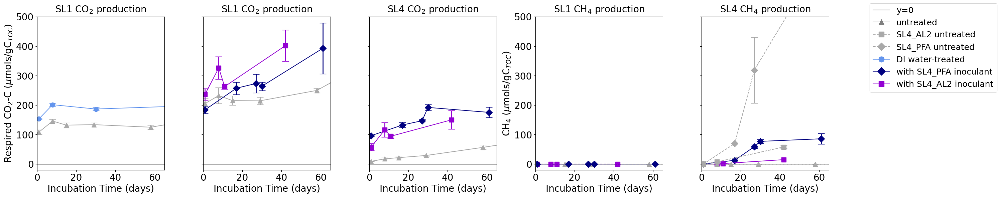

In [86]:
#inoculation incubations

from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
#try plotting two y axis
# Define the ending terms you want to filter by
subplot1_names = ['SL1_dC_25C', 'SL1_dC_25C_wet']
subplot2_names = ['SL4_dC_inoc_25C', 'SL4_dC+dAA_25C']
subplot3_names = ['SL1_dB_25C', 'SL1_dB+dAA_25C', 'SL1_dB_inoc_25C']
subplot4_names = ['SL4_dC_25C', 'SL4_dC_inoc_25C', 'SL4_dC+dAA_25C']
subplot5_names = ['SL4_AL_25C', 'SL4_dAA_25C', 'SL4_dC_25C'] #['SL4_dC_25C', 'SL4_dC_inoc_25C'] #'SL4_AL_25C',,

# Create a figure and subplots
fig, axes = plt.subplots(1,5, figsize=(25,6))  #(1,len(ending_terms), figsize=(22, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            #'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['darkolivegreen', 'green', 'palegreen', 'indigo', 'purple', 'orchid', 'darkgreen'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 's', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dC_25C': ('darkgray', '^'),
    'SL1_dC_25C_wet': ('cornflowerblue', 'o'),
    'SL4_dA_25C': ('blue', 'o'),
    'SL4_dAA_25C': ('darkgrey', 's'),
    'SL1_dB+dAA_25C': ('darkviolet', 's'),
    'SL4_dC+dAA_25C': ('darkviolet', 's'),
    'SL4_AL_25C': ('darkgray', 'D'),
    'SL1_dB_inoc_25C': ('navy', 'D'),
    'SL4_dC_inoc_25C': ('navy', 'D'),
    'SL1_dB_25C': ('darkgray', '^'),
    'SL4_dC_25C': ('darkgray', '^'),

}

# #also define labels
# labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

#define d13C colors
# iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

# #define colors for parent d13C
# SL1_parent_color = 'darkgreen'
# SL4_parent_color = 'indigo'
# # Define a dictionary to map parent d13C labels to colors:
# parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
# for i, ending_term in enumerate(ending_terms):
#     # Filter data for the current ending term
#     filtered_names = [name for name in CO2_gDW['Name'].unique() if name.startswith(ending_term)]

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()

    # ax = axes_groups[0,i]
ax = axes[0]
for name in subplot1_names:
    subset = resp_CO2_hilman[resp_CO2_hilman['Name'] == name]
    color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
    mask = ~np.isnan(subset['total CO2/gC'])
    ax.errorbar(subset['incubation time'][mask], subset['total CO2/gC'][mask],
                 yerr=subset['SE CO2/gC'][mask],
                 ecolor=color, capsize=7,
                 color=color, marker=marker, linestyle='-', markersize=10, elinewidth=2)
# ax = axes[1]
# for name in subplot2_names:
#     subset = CO2_gDW[CO2_gDW['Name'] == name]
#     color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
#     mask = ~np.isnan(subset['total CO2/g'])
#     ax.errorbar(subset['incubation time'][mask], subset['total CO2/g'][mask],
#                  yerr=subset['SE CO2/g'][mask],
#                  ecolor=color, capsize=7,
#                  color=color, marker=marker, linestyle='-', markersize=8, elinewidth=2)
ax = axes[1]
for name in subplot3_names:
    subset = resp_CO2_hilman[resp_CO2_hilman['Name'] == name]
    color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
    mask = ~np.isnan(subset['total CO2/gC'])
    ax.errorbar(subset['incubation time'][mask], subset['total CO2/gC'][mask],
                 yerr=subset['SE CO2/gC'][mask],
                 ecolor=color, capsize=7,
                 color=color, marker=marker, linestyle='-', markersize=10, elinewidth=2)

ax = axes[2]
for name in subplot4_names:
    subset = resp_CO2_hilman[resp_CO2_hilman['Name'] == name]
    color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
    mask = ~np.isnan(subset['total CO2/gC'])
    ax.errorbar(subset['incubation time'][mask], subset['total CO2/gC'][mask],
                 yerr=subset['SE CO2/gC'][mask],
                 ecolor=color, capsize=7,
                 color=color, marker=marker, linestyle='-', markersize=10, elinewidth=2)

ax = axes[4]
for name in subplot2_names:
    subset = sorted_df_CH4[sorted_df_CH4['Name'] == name]
    color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
    mask = ~np.isnan(subset['total CH4/gC'])
    ax.errorbar(subset['incubation time'][mask], subset['total CH4/gC'][mask],
                 yerr=subset['SE CH4/gC'][mask],
                 ecolor=color, capsize=7,
                 color=color, marker=marker, linestyle='-', markersize=10, elinewidth=2)

ax = axes[3]
for name in subplot3_names:
    subset = sorted_df_CH4[sorted_df_CH4['Name'] == name]
    color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
    mask = ~np.isnan(subset['total CH4/gC'])
    ax.errorbar(subset['incubation time'][mask], subset['total CH4/gC'][mask],
                 yerr=subset['SE CH4/gC'][mask],
                 ecolor=color, capsize=7,
                 color=color, marker=marker, linestyle='--', markersize=10, elinewidth=2)

ax = axes[4]
for name in subplot5_names:
    subset = sorted_df_CH4[sorted_df_CH4['Name'] == name]
    color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
    mask = ~np.isnan(subset['total CH4/gC'])
    ax.errorbar(subset['incubation time'][mask], subset['total CH4/gC'][mask],
                 yerr=subset['SE CH4/gC'][mask],
                 ecolor=color, capsize=7,
                 color=color, marker=marker, linestyle='--', markersize=10, elinewidth=2)

    # Set subplot title and labels
ax = axes[0]
ax.set_ylabel(r'Respired CO$_{{2}}$-C ($\mu$mols/gC$_{TOC}$)', color='black', fontsize=20)
ax.set_title(r'SL1 CO$_2$ production', fontsize=20, pad=10)

# ax=axes[1]
# ax.set_title('SL4_dA vs dAA')

ax=axes[1]
ax.set_title('SL1 CO$_2$ production', fontsize=20, pad=10)
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=0, pad=0)
ax.set_yticklabels([])

ax=axes[2]
ax.set_title('SL4 CO$_2$ production', fontsize=20, pad=10)
ax.set_ylabel('')
ax.tick_params(axis='y', labelsize=0)
ax.set_yticklabels([])

ax=axes[3]
ax.set_title(r'SL1 CH$_4$ production', fontsize=20, pad=10)
ax.set_ylabel(r'CH$_{{4}}$ ($\mu$mols/gC$_{TOC}$)', color='black', fontsize=20)

ax=axes[4]
ax.set_title('SL4 CH$_4$ production', fontsize=20, pad=10)
ax.set_ylabel('', color='black', fontsize=20)
# ax.tick_params(axis='y', labelbottom=False)
ax.set_yticklabels([])

for ax in axes.flat:
    ax.tick_params(axis='x', labelsize=20)
    ax.tick_params(axis='y', labelcolor='black', labelsize=20)
    ax.set_xlim(0,65)
    ax.set_ylim(-20, 500)
    ax.set_xlabel('Incubation Time (days)', fontsize=20)
    ax.axhline(y=0, color='black', linestyle='-', linewidth=1)
    #

    #ax2.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    #ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax2.set_ylim(-30, 0)
    # ax2.set_xlim(0, 200)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax.set_xticks([])
# ax.set_title(f'({ending_term})', fontsize=25, pad=10)

custom_legend = [
    Line2D([0], [0], color='black', marker='none', linestyle='-', markersize=12, label='y=0'),
    Line2D([0], [0], color='grey', marker='^', linestyle='-', markersize=12, label='untreated'),
    Line2D([0], [0], color='darkgray', marker='s', linestyle='--', markersize=12, label='SL4_AL2 untreated'),
    Line2D([0], [0], color='darkgray', marker='D', linestyle='--', markersize=12, label='SL4_PFA untreated'),
    Line2D([0], [0], color='cornflowerblue', marker='o', linestyle='-', markersize=12, label='DI water-treated'),
    Line2D([0], [0], color='navy', marker='D', linestyle='-', markersize=12, label='with SL4_PFA inoculant'),
    Line2D([0], [0], color='darkviolet', marker='s', linestyle='-', markersize=12, label='with SL4_AL2 inoculant'),

]

fig.legend(handles=custom_legend, loc='upper right', bbox_to_anchor=(1.2, 1), ncol=1, fontsize=18)


plt.tight_layout()

# Show the plot
plt.show()

<>:90: SyntaxWarning: invalid escape sequence '\m'
<>:95: SyntaxWarning: invalid escape sequence '\m'
<>:90: SyntaxWarning: invalid escape sequence '\m'
<>:95: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-80346855.py:90: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('Total CO$_{{2}}$ ($\mu$mols/g)', color='black', fontsize=20)
/tmp/ipython-input-80346855.py:95: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('Total CH$_{{4}}$ ($\mu$mols)', color='black', fontsize=20)


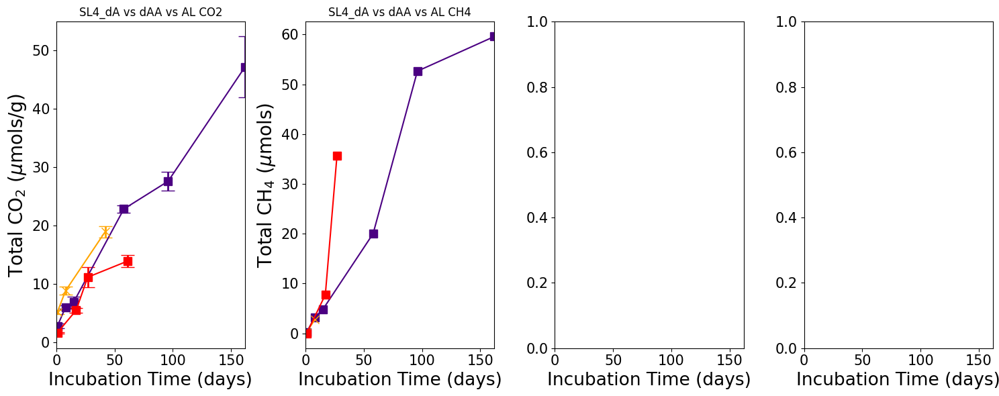

In [87]:
#SL4_dA vs dAA vs AL CO2 and CH4
# Define the ending terms you want to filter by
subplot1_names = ['SL1_dC_25C', 'SL1_dC_25C_wet']
subplot2_names = ['SL4_dA_25C', 'SL4_dAA_25C', 'SL4_AL_25C']
subplot3_names = ['SL4_dAA_25C', 'SL1_dB_25C', 'SL4_dC_25C', 'SL1_dB+dAA_25C', 'SL4_dC+dAA_25C']
subplot4_names = ['SL4_AL_25C', 'SL1_dB_25C', 'SL4_dC_25C', 'SL1_dB_inoc_25C', 'SL4_dC_inoc_25C']

# Create a figure and subplots
fig, axes = plt.subplots(1,4, figsize=(15,6))  #(1,len(ending_terms), figsize=(22, 7), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            #'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
# fig.subplots_adjust(hspace=0.4)

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['darkolivegreen', 'green', 'palegreen', 'indigo', 'purple', 'orchid', 'darkgreen'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 's', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dC_25C': ('darkgray', 'o'),
    'SL1_dC_25C_wet': ('darkgreen', 'o'),
    'SL4_dA_25C': ('indigo', 's'),
    'SL4_dAA_25C': ('orange', 'x'),
    'SL1_dB+dAA_25C': ('darkolivegreen', 'o'),
    'SL4_dC+dAA_25C': ('indigo', 's'),
    'SL4_AL_25C': ('red', 's'),
    'SL1_dB_inoc_25C': ('darkolivegreen', 'o'),
    'SL4_dC_inoc_25C': ('indigo', 's'),
    'SL1_dB_25C': ('darkgray', 'o'),
    'SL4_dC_25C': ('darkgray', 's'),

}

# #also define labels
# labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

#define d13C colors
# iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

# #define colors for parent d13C
# SL1_parent_color = 'darkgreen'
# SL4_parent_color = 'indigo'
# # Define a dictionary to map parent d13C labels to colors:
# parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
# for i, ending_term in enumerate(ending_terms):
#     # Filter data for the current ending term
#     filtered_names = [name for name in CO2_gDW['Name'].unique() if name.startswith(ending_term)]

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()

    # ax = axes_groups[0,i]
ax = axes[0]
for name in subplot2_names:
    subset = CO2_gDW[CO2_gDW['Name'] == name]
    color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
    mask = ~np.isnan(subset['total CO2/g'])
    ax.errorbar(subset['incubation time'][mask], subset['total CO2/g'][mask],
                 yerr=subset['SE CO2/g'][mask],
                 ecolor=color, capsize=7,
                 color=color, marker=marker, linestyle='-', markersize=8, elinewidth=2)
ax = axes[1]
for name in subplot2_names:
    subset = sorted_df_C[sorted_df_C['Name'] == name]
    color, marker = site_color_maps.get(name, ('black', 'o')) # Assuming site is the first part of the name
    mask = ~np.isnan(subset['total CH4'])
    ax.errorbar(subset['incubation time'][mask], subset['total CH4'][mask],
                 yerr=None,
                 color=color, marker=marker, linestyle='-', markersize=8, elinewidth=2)

    # Set labels for the secondary y-axis

    # ax.set_ylim(0,350)


    # if i == 0:
    #   ax.set_ylabel('Total CO$_{{2}}$ ($\mu$mols/gC$_o$$_r$$_g$)', color='black', labelpad=5, fontsize=20)
    # else:
    #   ax.set_ylabel('')



    # Set subplot title and labels
ax = axes[0]
ax.set_ylabel('Total CO$_{{2}}$ ($\mu$mols/g)', color='black', fontsize=20)
ax.set_title('SL4_dA vs dAA vs AL CO2')

ax=axes[1]
ax.set_title('SL4_dA vs dAA vs AL CH4')
ax.set_ylabel('Total CH$_{{4}}$ ($\mu$mols)', color='black', fontsize=20)

ax=axes[2]
ax.set_title('')

ax=axes[3]
ax.set_title('')

for ax in axes.flat:
    ax.tick_params(axis='x', labelsize=15)
    ax.tick_params(axis='y', labelcolor='black', labelsize=15)
    ax.set_xlim(0,162)
    # ax.set_ylim(0, 16)
    ax.set_xlabel('Incubation Time (days)', fontsize=19)


plt.tight_layout()

# Show the plot
plt.show()

<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:117: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:117: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-2775630608.py:111: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('Respired CO$_{{2}}$-C ($\mu$mols/mgDOC)', color='black', fontsize=20)
/tmp/ipython-input-2775630608.py:117: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('Respired CO$_{{2}}$-C ($\mu$mols/mgDOC)', color='black', labelpad=5, fontsize=15)


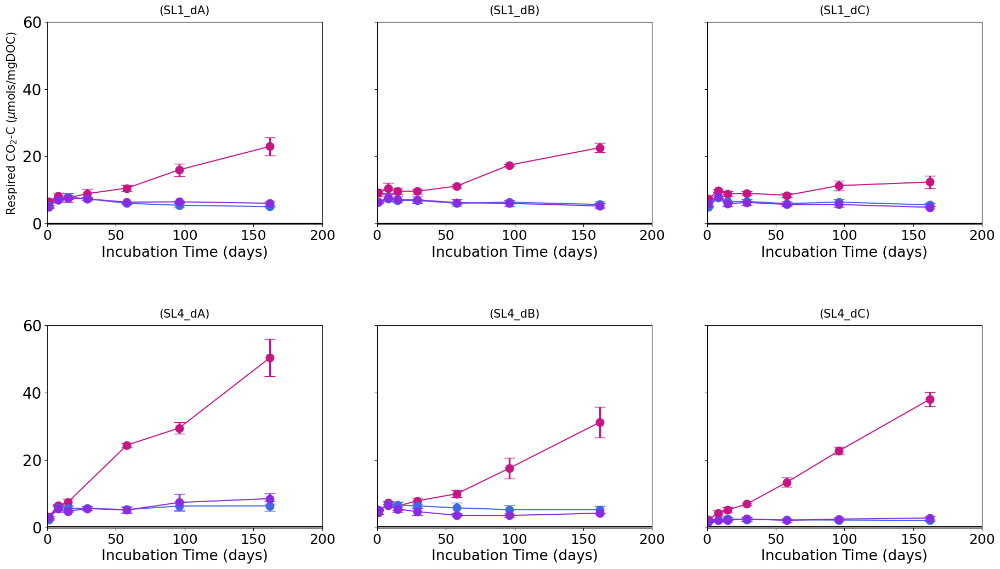

In [88]:
#SL1 ABC, SL4 ABC CO2 per mg DOC
# Define the ending terms you want to filter by
ending_terms = ['SL1_dA', 'SL1_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(2,3, figsize=(22, 12), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1,1],
                                            'hspace': 0.5}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)

axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue','mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', 'o', 'o', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },
    'SL4_dA': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    }
}

#also define labels
labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

#define d13C colors
iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

#define colors for parent d13C
SL1_parent_color = 'darkgreen'
SL4_parent_color = 'indigo'
# Define a dictionary to map parent d13C labels to colors:
parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in CO2_gDW['Name'].unique() if name.startswith(ending_term) and 'wet' not in name and 'inoc' not in name and 'dAA' not in name]

    # Calculate the row and column index for the current subplot
    #row = i // 3  # Integer division to get the row index
    #col = i % 3   # Modulo to get the column index

    # Get the individual subplot Axes object
    #ax = axes[row, col]  # Accessing the subplot using row and column indices

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()
    ax = axes[i]
    # ax = axes_groups[0,i]
    # ax2 = axes_groups[1,i]
    # ax2 = ax.twinx()
#resp_CO2_hilman

    # # Iterate through filtered names and plot total CO2/gC on the secondary y-axis

    for j, name in enumerate(filtered_names):
        subset = C_DOC[C_DOC['Name'] == name]

        color, marker = site_color_maps[ending_term].get(name, ('black', markers[7]))

        mask = ~np.isnan(subset['total CO2/mgC'])
        ax.errorbar(subset['incubation time'][mask], subset['total CO2/mgC'][mask],
                     yerr=subset['SE total CO2/mgC'][mask],
                     ecolor=color, capsize=7, label=labels.get(color),
                     color=color, marker=marker, linestyle='-', markersize=10.5, elinewidth=2.5)

        if name.startswith('SL1'):
            xline_color = SL1_parent_color
        elif name.startswith('SL4'):
            xline_color = SL4_parent_color
        else:
            xline_color = 'black'

        ax.axhline(y=0, color='black')

        #current_label = parent_labels.get(hline_color)

    # Set labels for the secondary y-axis
    ax.set_ylabel('Respired CO$_{{2}}$-C ($\mu$mols/mgDOC)', color='black', fontsize=20)
    # ax.set_ylim(0,350)
    ax.set_xlim(0,200)
    ax.set_ylim(-0.2,60)

    if i == 0:
      ax.set_ylabel('Respired CO$_{{2}}$-C ($\mu$mols/mgDOC)', color='black', labelpad=5, fontsize=15)
    else:
      ax.set_ylabel('')

    ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    ax.set_xlabel('Incubation Time (days)', fontsize=19)
    ax.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    #ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax2.set_ylim(-30, 0)
    # ax2.set_xlim(0, 200)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax.set_xticks([])
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)


# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.09, 1), ncol=1, fontsize=18)


# plt.tight_layout()

# Show the plot
plt.show()

<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:117: SyntaxWarning: invalid escape sequence '\m'
<>:111: SyntaxWarning: invalid escape sequence '\m'
<>:117: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-1039670220.py:111: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('Respired CO$_{{2}}$-C ($\mu$mols/gC)', color='black', fontsize=20)
/tmp/ipython-input-1039670220.py:117: SyntaxWarning: invalid escape sequence '\m'
  ax.set_ylabel('Respired CO$_{{2}}$-C ($\mu$mols/gC)', color='black', labelpad=5, fontsize=15)


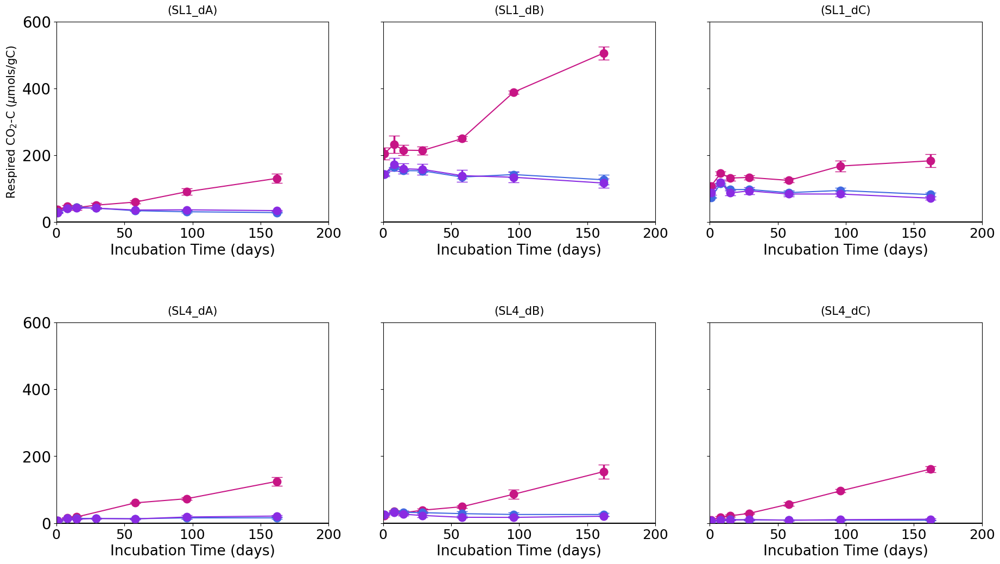

In [89]:
#SL1 ABC, SL4 ABC CO2 produ per gram C
# Define the ending terms you want to filter by
ending_terms = ['SL1_dA', 'SL1_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(2,3, figsize=(22, 12), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1,1],
                                            'hspace': 0.5}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)

axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue','mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', 'o', 'o', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },
    'SL4_dA': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    }
}

#also define labels
labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

#define d13C colors
iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

#define colors for parent d13C
SL1_parent_color = 'darkgreen'
SL4_parent_color = 'indigo'
# Define a dictionary to map parent d13C labels to colors:
parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in CO2_gDW['Name'].unique() if name.startswith(ending_term) and 'wet' not in name and 'inoc' not in name and 'dAA' not in name]

    # Calculate the row and column index for the current subplot
    #row = i // 3  # Integer division to get the row index
    #col = i % 3   # Modulo to get the column index

    # Get the individual subplot Axes object
    #ax = axes[row, col]  # Accessing the subplot using row and column indices

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()
    ax = axes[i]
    # ax = axes_groups[0,i]
    # ax2 = axes_groups[1,i]
    # ax2 = ax.twinx()
#resp_CO2_hilman

    # # Iterate through filtered names and plot total CO2/gC on the secondary y-axis

    for j, name in enumerate(filtered_names):
        subset = resp_CO2_hilman[resp_CO2_hilman['Name'] == name]

        color, marker = site_color_maps[ending_term].get(name, ('black', markers[7]))

        mask = ~np.isnan(subset['total CO2/gC'])
        ax.errorbar(subset['incubation time'][mask], subset['total CO2/gC'][mask],
                     yerr=subset['SE CO2/gC'][mask],
                     ecolor=color, capsize=7, label=labels.get(color),
                     color=color, marker=marker, linestyle='-', markersize=10.5, elinewidth=2.5)

        if name.startswith('SL1'):
            xline_color = SL1_parent_color
        elif name.startswith('SL4'):
            xline_color = SL4_parent_color
        else:
            xline_color = 'black'

        ax.axhline(y=0, color='black')

        #current_label = parent_labels.get(hline_color)

    # Set labels for the secondary y-axis
    ax.set_ylabel('Respired CO$_{{2}}$-C ($\mu$mols/gC)', color='black', fontsize=20)
    # ax.set_ylim(0,350)
    ax.set_xlim(0,200)
    ax.set_ylim(-0.2,600)

    if i == 0:
      ax.set_ylabel('Respired CO$_{{2}}$-C ($\mu$mols/gC)', color='black', labelpad=5, fontsize=15)
    else:
      ax.set_ylabel('')

    ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    ax.set_xlabel('Incubation Time (days)', fontsize=19)
    ax.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    #ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax2.set_ylim(-30, 0)
    # ax2.set_xlim(0, 200)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax.set_xticks([])
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)


# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.09, 1), ncol=1, fontsize=18)


# plt.tight_layout()

# Show the plot
plt.show()

In [90]:
final_averaged_df_DW

,Name,mean_Intercept,mean_Slope,mean_r_squared,std_Intercept,std_Slope,std_r_squared,SE_Intercept,SE_Slope,SE_r_squared,depth (cm)
0,BTL_dA_25C,0.870796,0.136821,0.988769,0.357886,0.065965,0.015309,0.206626,0.038085,0.008839,62.5
1,BTL_dA_6C,0.230077,0.130924,0.955286,0.105142,0.060382,0.022899,0.060704,0.034861,0.013221,62.5
2,BTL_dB_25C,1.667077,0.046847,0.568403,0.094146,0.008142,0.082492,0.054355,0.004701,0.047627,212.5
3,BTL_dB_6C,1.155565,0.046681,0.837131,0.330505,0.018473,0.057263,0.190817,0.010665,0.033061,212.5
4,BTL_dC_25C,1.558172,0.095296,0.756682,0.054628,0.012508,0.077320,0.031539,0.007222,0.044641,370.0
5,BTL_dC_6C,0.670467,0.052055,0.846819,0.092701,0.009624,0.096683,0.053521,0.005556,0.055820,370.0
6,BTL_dD_25C,1.608157,0.061435,0.801861,0.175210,0.016542,0.073589,0.101158,0.009551,0.042487,543.5
7,BTL_dD_6C,0.879295,0.031248,0.839210,0.161951,0.012135,0.058762,0.093503,0.007006,0.033926,543.5
8,BTL_dE_25C,1.950478,0.099499,0.674716,0.060992,0.009556,0.071480,0.035214,0.005517,0.041269,777.5
9,BTL_dE_6C,0.720133,0.059420,0.872871,0.124096,0.019761,0.073499,0.071647,0.011409,0.042435,777.5


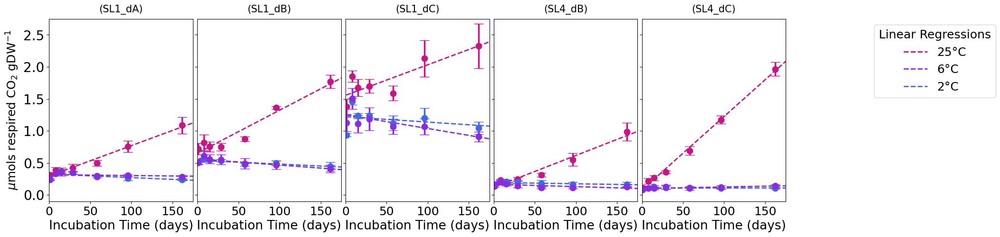

In [91]:
from matplotlib.lines import Line2D
#CO2 per g DW non_CH4 producers untreated incubations
# Define the ending terms you want to filter by
ending_terms = ['SL1_dA', 'SL1_dB', 'SL1_dC', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,5, figsize=(20, 5), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0.2}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.2, wspace=0.03)

axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue','mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', 'o', 'o', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },
    'SL4_dA': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    },

    'SL4_dAA': {  # Color mapping for names ending with 'dC'
        'SL4_dAA_25C': (colors[3], markers[3]),
    },

    'SL4_AL': {  # Color mapping for names ending with 'dC'
        'SL4_AL_25C': (colors[3], markers[3]),
    },
}

#also define labels
labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

#define d13C colors
iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

#define colors for parent d13C
SL1_parent_color = 'darkgreen'
SL4_parent_color = 'indigo'
# Define a dictionary to map parent d13C labels to colors:
parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in CO2_gDW['Name'].unique() if name.startswith(ending_term) and 'wet' not in name and 'inoc' not in name and '+' not in name]

    # Calculate the row and column index for the current subplot
    #row = i // 3  # Integer division to get the row index
    #col = i % 3   # Modulo to get the column index

    # Get the individual subplot Axes object
    #ax = axes[row, col]  # Accessing the subplot using row and column indices

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()
    ax = axes[i]
    # ax = axes_groups[0,i]
    # ax2 = axes_groups[1,i]
    # ax2 = ax.twinx()
#resp_CO2_hilman

    # # Iterate through filtered names and plot total CO2/gC on the secondary y-axis

    # Define the specific samples you want regression lines for
    regression_names = {'SL1_dA_25C', 'SL1_dA_6C', 'SL1_dA_2C'}

    for j, name in enumerate(filtered_names):
        subset = CO2_gDW[CO2_gDW['Name'] == name]

        color, marker = site_color_maps[ending_term].get(name, ('black', markers[7]))

        mask = ~np.isnan(subset['total CO2/g'])
        ax.errorbar(subset['incubation time'][mask], subset['total CO2/g'][mask],
                     yerr=subset['SE CO2/g'][mask],
                     ecolor=color, capsize=7, label=labels.get(color),
                     color=color, marker=marker, linestyle='None', markersize=9, elinewidth=2.5)
        # ax.plot(subset['incubation time'][mask], subset['total CO2/g'][mask], linestyle='-', alpha=0.5, color=color)
            # Dashed fit line based on slope and intercept
        if name in final_averaged_df_DW['Name'].values:
            row = final_averaged_df_DW[final_averaged_df_DW['Name'] == name].iloc[0]
            slope = row['mean_Slope']
            intercept = row['mean_Intercept']

        # Optional: Extend the line over the full x-range of the subset
            x_fit = np.linspace(subset['incubation time'][mask].min(), 200, 100) #subset['incubation time'][mask].max()
            y_fit = slope * x_fit + intercept

            ax.plot(x_fit, y_fit, linestyle='--', color=color, linewidth=2)

        if name.startswith('SL1'):
            xline_color = SL1_parent_color
        elif name.startswith('SL4'):
            xline_color = SL4_parent_color
        else:
            xline_color = 'black'

        # ax.axhline(y=0, color='black')
        # final_averaged_df_DW

        #current_label = parent_labels.get(hline_color)

    # Set labels for the secondary y-axis
    # ax.set_ylabel(r'Respired CO$_{{2}}$-C ($\mu$mols/gDW)', color='black', fontsize=20)
    # ax.set_ylim(0,350)
    ax.set_xlim(0,175)
    ax.set_ylim(-0.1,2.75)

    if i == 0:
      ax.set_ylabel(r'$\mu$mols respired CO$_{{2}}$ gDW$^{-1}$', color='black', labelpad=5, fontsize=18)
    else:
      ax.set_ylabel('')

    ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    ax.set_xlabel('Incubation Time (days)', fontsize=19)
    ax.tick_params(axis='x', labelsize=18, rotation=0)
    #ax2.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    #ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax2.set_ylim(-30, 0)
    # ax2.set_xlim(0, 200)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax.set_xticks([])
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

# handles, labels = [], []
# for ax in fig.axes:  # Or iterate through desired axes
#     h, l = ax.get_legend_handles_labels()
#     h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
#     #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
#     # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
#     handles.extend(h)
#     labels.extend(l)


# # # Deduplicate legend entries
# unique_labels = []
# unique_handles = []
# for handle, label in zip(handles, labels):
#     if label not in unique_labels:
#         unique_labels.append(label)
#         unique_handles.append(handle)
# # Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.09, 1), ncol=1, fontsize=18)

# # Custom regression line handles
custom_lines = [
    Line2D([0], [0], color='mediumvioletred', linestyle='--', linewidth=2, label='25°C'),
    Line2D([0], [0], color='blueviolet', linestyle='--', linewidth=2, label='6°C'),
    Line2D([0], [0], color='royalblue', linestyle='--', linewidth=2, label='2°C'),
]

# Add legend to the plot
ax.legend(handles=custom_lines, fontsize=18, loc='upper right', bbox_to_anchor=(2.5, 1), title='Linear Regressions', title_fontsize=18, handlelength=2)


# plt.tight_layout()

# Show the plot
plt.show()

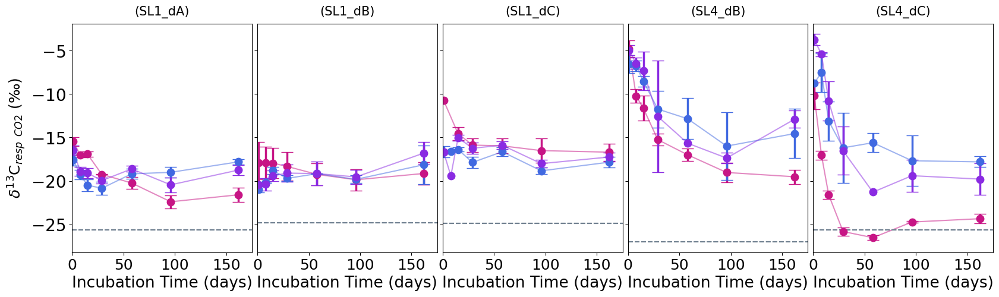

In [92]:
#d13C CO2 non-CH4 untreated incubations
# Define the ending terms you want to filter by
ending_terms = ['SL1_dA', 'SL1_dB', 'SL1_dC', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,5, figsize=(20, 5), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0.2}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.2, wspace=0.03)

axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue','mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', 'o', 'o', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },
    'SL4_dA': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    },

    'SL4_dAA': {  # Color mapping for names ending with 'dC'
        'SL4_dAA_25C': (colors[3], markers[3]),
    },

    'SL4_AL': {  # Color mapping for names ending with 'dC'
        'SL4_AL_25C': (colors[3], markers[3]),
    },
}

#also define labels
labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

#define d13C colors
iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

#define colors for parent d13C
SL1_parent_color = 'darkgreen'
SL4_parent_color = 'indigo'
# Define a dictionary to map parent d13C labels to colors:
parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in final_pure_d13C_CO2['Name'].unique() if name.startswith(ending_term) and 'wet' not in name and 'inoc' not in name and '+' not in name and 'BTL' not in name]

    # Calculate the row and column index for the current subplot
    #row = i // 3  # Integer division to get the row index
    #col = i % 3   # Modulo to get the column index

    # Get the individual subplot Axes object
    #ax = axes[row, col]  # Accessing the subplot using row and column indices

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()
    ax = axes[i]
    # ax = axes_groups[0,i]
    # ax2 = axes_groups[1,i]
    # ax2 = ax.twinx()
#resp_CO2_hilman

    # # Iterate through filtered names and plot total CO2/gC on the secondary y-axis

    for j, name in enumerate(filtered_names):
        subset = final_pure_d13C_CO2[final_pure_d13C_CO2['Name'] == name]

        color, marker = site_color_maps[ending_term].get(name, ('black', markers[7]))

        mask = ~np.isnan(subset['d13C-CO2'])
        ax.errorbar(subset['incubation time'][mask], subset['d13C-CO2'][mask],
                     yerr=subset['SE d13C-CO2'][mask],
                     ecolor=color, capsize=7, label=labels.get(color),
                     color=color, marker=marker, linestyle='None', markersize=9, elinewidth=2.5)
        ax.plot(subset['incubation time'][mask], subset['d13C-CO2'][mask], linestyle='-', alpha=0.5, color=color)

        if name.startswith('SL1'):
            xline_color = SL1_parent_color
        elif name.startswith('SL4'):
            xline_color = SL4_parent_color
        else:
            xline_color = 'black'

        # parent_d13C_value = merged_CO2_d13C['parent d13C'].iloc[0]
        parent_d13C_value = merged_CO2_d13C.loc[merged_CO2_d13C['Name'] == name, 'parent d13C'].iloc[0]

        if name.startswith('SL1'):
            hline_color = 'slategray'
            hline_artist = ax.axhline(y=parent_d13C_value, color=hline_color, linestyle='dashed', label=r'SL1 C$_o$$_r$$_g$ $\delta$$^{13}$C')
        elif name.startswith('SL4'):
            hline_color = 'slategray'
            hline_artist = ax.axhline(y=parent_d13C_value, color=hline_color, linestyle='dashed', label=r'SL4 C$_o$$_r$$_g$ $\delta$$^{13}$C')
        else:
            hline_color = 'black'

        # current_label = parent_labels.get(hline_color)  # Get label from dictionary

        # # Only add label if it's not already in the legend:
        # if current_label not in [h.get_label() for h in ax.get_legend_handles_labels()[0]]:
        #     ax2.hlines(y=subset['parent d13C'], xmin=0, xmax=60, color=hline_color, linestyles='dashed', label=current_label)

        # ax.axhline(y=0, color='black')

        #current_label = parent_labels.get(hline_color)

    # Set labels for the secondary y-axis
    # ax.set_ylabel(r'Respired CO$_{{2}}$-C ($\mu$mols/gDW)', color='black', fontsize=20)
    # ax.set_ylim(0,350)
    ax.set_xlim(0,175)
    # ax.set_ylim(-0.1,2.75)

    if i == 0:
      ax.set_ylabel(r'$\delta^{13}$C$_{resp}$ $_{CO2}$ (‰)', color='black', labelpad=5, fontsize=18)
    else:
      ax.set_ylabel('')

    ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    ax.set_xlabel('Incubation Time (days)', fontsize=19)
    ax.tick_params(axis='x', labelsize=18, rotation=0)
    #ax2.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    #ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax2.set_ylim(-30, 0)
    # ax2.set_xlim(0, 200)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax.set_xticks([])
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)


# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.09, 1), ncol=1, fontsize=18)


# plt.tight_layout()

# Show the plot
plt.show()

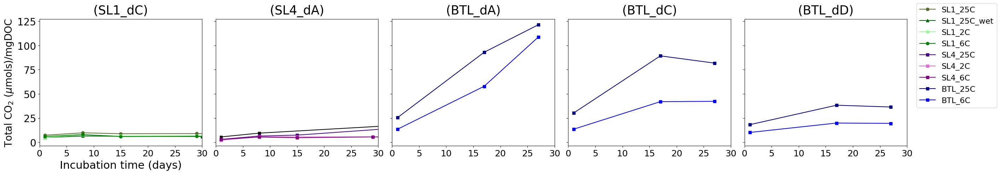

In [93]:
#BIG trail lake samples
# Define the ending terms you want to filter by
ending_terms = ['SL1_dC','SL4_dA', 'BTL_dA', 'BTL_dC', 'BTL_dD'] #'SL1_dA', 'SL1_dB', 'SL4_dB', 'SL4_dC',

# Create a figure and subplots
fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(26, 5), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['darkolivegreen', 'green', 'palegreen', 'indigo', 'purple', 'orchid', 'darkgreen', 'navy', 'blue'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 's', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },
    'SL4_dA': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    },

    'BTL_dA': {  # Color mapping for names ending with 'dC'
        'BTL_dA_25C': (colors[7], markers[3]),
        'BTL_dA_6C': (colors[8], markers[3]),
    },
    'BTL_dB': {  # Color mapping for names ending with 'dC'
        'BTL_dB_25C': (colors[7], markers[3]),
        'BTL_dB_6C': (colors[8], markers[3]),
    },
    'BTL_dC': {  # Color mapping for names ending with 'dC'
        'BTL_dC_25C': (colors[7], markers[3]),
        'BTL_dC_6C': (colors[8], markers[3]),
    },
    'BTL_dD': {  # Color mapping for names ending with 'dC'
        'BTL_dD_25C': (colors[7], markers[3]),
        'BTL_dD_6C': (colors[8], markers[3]),
    },
    'BTL_dE': {  # Color mapping for names ending with 'dC'
        'BTL_dE_25C': (colors[7], markers[3]),
        'BTL_dE_6C': (colors[8], markers[3]),
    }
}

#also define labels
labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C', 'navy':'BTL_25C','blue':'BTL_6C'}

#define d13C colors
# iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

#define colors for parent d13C
# SL1_parent_color = 'darkgreen'
# SL4_parent_color = 'indigo'
# # Define a dictionary to map parent d13C labels to colors:
# parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in C_DOC['Name'].unique() if name.startswith(ending_term)]

    # Calculate the row and column index for the current subplot
    #row = i // 3  # Integer division to get the row index
    #col = i % 3   # Modulo to get the column index

    # Get the individual subplot Axes object
    #ax = axes[row, col]  # Accessing the subplot using row and column indices

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()
    ax = axes_groups[i]
    # ax = axes_groups[0,i]
    # ax2 = axes_groups[1,i]
    # ax2 = ax.twinx()


    # Iterate through filtered names and plot total CO2/gC on the secondary y-axis
    for j, name in enumerate(filtered_names):
        subset = C_DOC[C_DOC['Name'] == name]

        color, marker = site_color_maps[ending_term].get(name, ('black', markers[7]))

        mask = ~np.isnan(subset['total CO2/mgC']) #No error bars, add if needed
        ax.errorbar(subset['incubation time'][mask], subset['total CO2/mgC'][mask],
                    yerr=None, #subset['SE CO2/g'][mask],
                    #ecolor=color, capsize=5,
                    label=labels.get(color),
                    color=color, marker=marker, linestyle='-')
                 # Using linestyle='--' to differentiate from the primary y-axis

        # if name.startswith('SL1'):
        #     xline_color = SL1_parent_color
        # elif name.startswith('SL4'):
        #     xline_color = SL4_parent_color
        # else:
        #     xline_color = 'black'

        #current_label = parent_labels.get(hline_color)

    # Set labels for the secondary y-axis
    ax.set_ylabel(r'Total CO$_{{2}}$ ($\mu$mols)/mgDOC', color='black', fontsize=20)
    # ax.set_ylim(0,320)


    if i == 0:
      ax.set_ylabel(r'Total CO$_{{2}}$ ($\mu$mols)/mgDOC', color='black', labelpad=5, fontsize=20)
    else:
      ax.set_ylabel('')

    ax.tick_params(axis='y', labelcolor='black', labelsize=20)


    # Set subplot title and labels
    # ax.set_xlabel('Incubation Time (days)', fontsize=19)
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='x', labelsize=18)
    # ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    # ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    if i == 0:
      ax.set_xlabel('Incubation time (days)', color='black', fontsize=22, labelpad=5)

    else:
      ax.set_xlabel('')

    #ax2.grid(True)
    # ax.set_ylim(0, 8)
    ax.set_xlim(0, 30)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax.set_xticks([])
    ax.set_title(f'({ending_term})', fontsize=25, pad=10)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.09, 1), ncol=1, fontsize=16)


plt.tight_layout()

# Show the plot
plt.show()

In [94]:
rows_drop = [114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137]
sorted_df_d13C_CH4.drop(index=rows_drop)

,Name,incubation time,d13C-CH4,std d13C-CH4,SE d13C-CH4
0,SL1_dA_25C,1,NaN,NaN,NaN
1,SL1_dA_25C,8,NaN,NaN,NaN
2,SL1_dA_25C,11,NaN,NaN,NaN
3,SL1_dA_25C,15,NaN,NaN,NaN
4,SL1_dA_25C,17,NaN,NaN,NaN
...,...,...,...,...,...
541,NaN,162,NaN,NaN,NaN
542,NaN,162,NaN,NaN,NaN
543,NaN,162,NaN,NaN,NaN
544,NaN,162,NaN,NaN,NaN


<>:101: SyntaxWarning: invalid escape sequence '\d'
<>:107: SyntaxWarning: invalid escape sequence '\d'
<>:101: SyntaxWarning: invalid escape sequence '\d'
<>:107: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipython-input-2762724779.py:101: SyntaxWarning: invalid escape sequence '\d'
  ax.set_ylabel('$\delta$$^{13}$C-CO$_{2}$-C', color='black', fontsize=25)
/tmp/ipython-input-2762724779.py:107: SyntaxWarning: invalid escape sequence '\d'
  ax.set_ylabel('$\delta$$^{13}$C-CO$_{2}$-C', color='black', labelpad=5, fontsize=20)
/tmp/ipython-input-2762724779.py:90: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  subset['SE d13C-CO2'] = subset['SE d13C-CO2'].fillna(0)


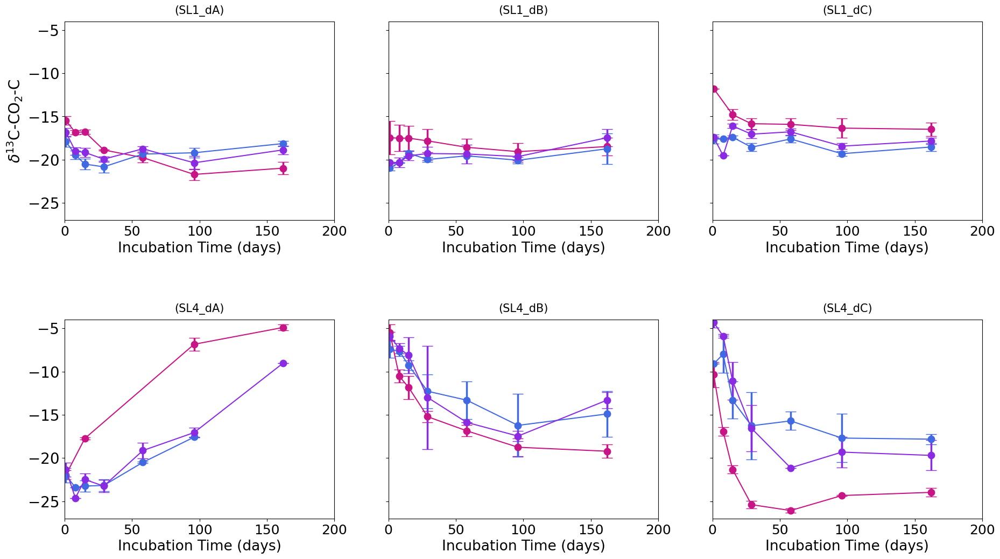

In [95]:
#d13C CO2 SL1 ABC, SL4 ABC
# Define the ending terms you want to filter by
ending_terms = ['SL1_dA', 'SL1_dB', 'SL1_dC', 'SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(2,3, figsize=(22, 12), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1,1],
                                            'hspace': 0.5}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)

axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue','mediumvioletred', 'blueviolet', 'royalblue', 'darkgreen'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 'o', 'o', 'o', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },
    'SL4_dA': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    }
}

#also define labels
labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

#define d13C colors
iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

#define colors for parent d13C
SL1_parent_color = 'darkgreen'
SL4_parent_color = 'indigo'
# Define a dictionary to map parent d13C labels to colors:
parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in CO2_gDW['Name'].unique() if name.startswith(ending_term) and 'wet' not in name and 'inoc' not in name and 'dAA' not in name]

    # Calculate the row and column index for the current subplot
    #row = i // 3  # Integer division to get the row index
    #col = i % 3   # Modulo to get the column index

    # Get the individual subplot Axes object
    #ax = axes[row, col]  # Accessing the subplot using row and column indices

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()
    ax = axes[i]
    # ax = axes_groups[0,i]
    # ax2 = axes_groups[1,i]
    # ax2 = ax.twinx()
#resp_CO2_hilman

    # # Iterate through filtered names and plot total CO2/gC on the secondary y-axis
    for j, name in enumerate(filtered_names):
        subset = merged_CO2_d13C[merged_CO2_d13C['Name'] == name]
        #subset = subset.dropna(subset=['SE d13C-CO2'])
        subset['SE d13C-CO2'] = subset['SE d13C-CO2'].fillna(0)
        mask = ~np.isnan(subset['d13C-CO2']) #& ~np.isnan(subset['SE d13C-CO2'])
        color, marker = site_color_maps[ending_term].get(name, ('black', markers[7]))
        # if not subset.empty:
        ax.errorbar(subset['incubation time'][mask], subset['d13C-CO2'][mask],
                            yerr=subset['SE d13C-CO2'][mask],
                            color=color, marker=marker, label=labels.get(color),
                            ecolor=color, capsize=7, markersize=9, elinewidth=2.5)


    # Set labels for the secondary y-axis
    ax.set_ylabel('$\delta$$^{13}$C-CO$_{2}$-C', color='black', fontsize=25)
    # ax.set_ylim(0,350)
    ax.set_xlim(0,200)
    ax.set_ylim(-27,-4)

    if i == 0:
      ax.set_ylabel('$\delta$$^{13}$C-CO$_{2}$-C', color='black', labelpad=5, fontsize=20)
    else:
      ax.set_ylabel('')

    ax.tick_params(axis='y', labelcolor='black', labelsize=20)

    # Set subplot title and labels
    ax.set_xlabel('Incubation Time (days)', fontsize=19)
    ax.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='x', labelsize=18)
    #ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    #ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    # if i == 0:
    #   ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    # else:
    #   ax2.set_ylabel('')

    #ax2.grid(True)
    # ax2.set_ylim(-30, 0)
    # ax2.set_xlim(0, 200)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    # ax.set_xticks([])
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)


# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.09, 1), ncol=1, fontsize=18)


# plt.tight_layout()

# Show the plot
plt.show()

<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:63: SyntaxWarning: invalid escape sequence '\m'
<>:42: SyntaxWarning: invalid escape sequence '\m'
<>:63: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-719432194.py:42: SyntaxWarning: invalid escape sequence '\m'
  ax1.annotate('($\mu$mols/gC$_o$$_r$$_g$)', xy=(0,1), xycoords='axes fraction', fontsize=12, ha='center', xytext=(-50,-90), textcoords='offset points', va='top', rotation=90)
/tmp/ipython-input-719432194.py:63: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_title('Total $CH_{4}$ ($\mu$mols/g$C_{org})$ (SL4_dA)', fontsize=20)
/tmp/ipython-input-719432194.py:92: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


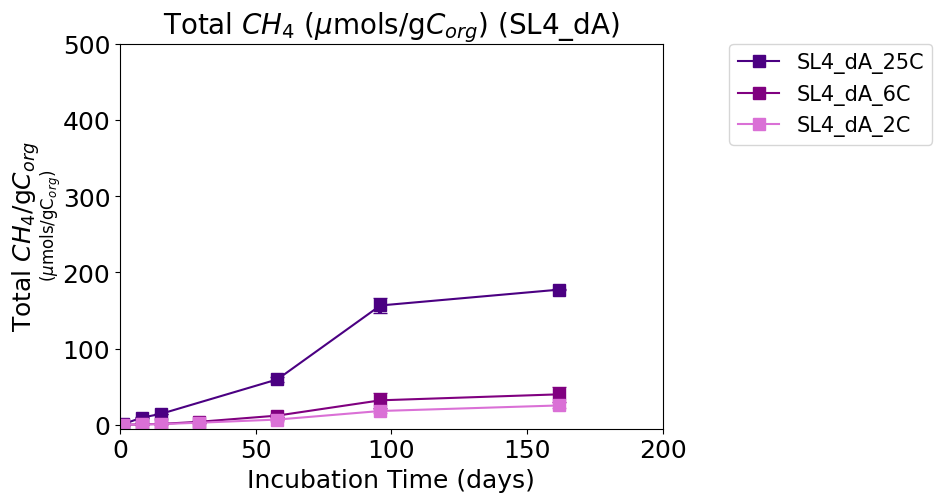

In [96]:
##CH4 conc SL4 dA
# Filter for names
sl4_names_CH4 = ['SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C']      #name for name in sorted_df_CH4['Name'].unique() if name.startswith('SL4')]
# colors = plt.cm.get_cmap('viridis', len(sl4_names))
colors = ['navy', 'blue', 'skyblue']

site_color_maps = {
    'SL4_dA_25C': ('indigo', 's'),
    'SL4_dA_6C': ('purple', 's'),
    'SL4_dA_2C': ('orchid', 's'),
}

iso_color_maps = {
    'SL4_dA_25C': ('indigo', 's'),
    'SL4_dA_6C': ('purple', 's'),
    'SL4_dA_2C': ('orchid', 's'),
}

# Define a list of markers
markers = ['o', 'o', 'o', 's', 's', 's', '^', '^', '^']  # Add more if needed


fig, (ax1) = plt.subplots(1,1,figsize=(7, 5), sharex='col',
                               gridspec_kw={'height_ratios': [1],
                                            'hspace': 0.1})

# ax2 = axes.twinx()

for i, name in enumerate(sl4_names_CH4):
    subset = sorted_df_CH4[sorted_df_CH4['Name'] == name]
    subset = subset.dropna(subset=['SE CH4/gC'])
    color, marker = site_color_maps.get(name, ('black', markers[7]))
    if not subset.empty:
      ax1.errorbar(subset['incubation time'], subset['total CH4/gC'],
                  yerr=subset['SE CH4/gC'],
                  color=color, marker=marker, label=name, #+' CH$_4$',
                  ecolor=color, capsize=5, markersize=8.5, elinewidth=3)


ax1.set_xlabel('Incubation Time (days)', fontsize=18)
ax1.set_ylabel('Total $CH_{4}$/g$C_{org}$', color='black', fontsize=18, labelpad=15)
ax1.annotate('($\mu$mols/gC$_o$$_r$$_g$)', xy=(0,1), xycoords='axes fraction', fontsize=12, ha='center', xytext=(-50,-90), textcoords='offset points', va='top', rotation=90)
# ax2.set_ylabel('$\delta$$^{13}$C-CH$_{4}$', rotation=90, labelpad=15, color='black', fontsize=20)
# ax3.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', labelpad=8, color='black', fontsize=20)

ax1.tick_params(axis='y', labelcolor='black', labelsize=18)
# ax2.tick_params(axis='y', labelcolor='black', labelsize=20)
ax1.tick_params(axis='x', labelsize=18)
# ax3.tick_params(axis='y', labelcolor='black', labelsize=20)
# ax3.tick_params(axis='x', labelsize=20)
# ax1.set_xticks([])

ax1.set_ylim(-5,500)
# ax2.set_ylim(-70,-20)

ax1.set_xlim(0,200)
# ax2.set_xlim(0,200)
# ax3.set_xlim(0,200)

# ax2.yaxis.tick_left()
# ax2.yaxis.set_label_position("left")

ax1.set_title('Total $CH_{4}$ ($\mu$mols/g$C_{org})$ (SL4_dA)', fontsize=20)
# plt.grid(True)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
handle_seen = set()  # Keep track of seen handles

for handle, label in zip(handles, labels):
    if handle not in handle_seen:  # Check if the handle is unique
        unique_labels.append(label)
        unique_handles.append(handle)
        handle_seen.add(handle)  # Mark the handle as seen
    else:
        unique_labels.append(label)  # Add the label even if the handle is duplicate
        unique_handles.append(matplotlib.patches.Rectangle((0, 0), 0, 0, fill=False, edgecolor='none', visible=False))
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.3, 0.9), ncol=1, fontsize=15)

# axes.legend(handles, labels, bbox_to_anchor=(1.05,1), loc='upper left')
# ax2.legend(handles, labels, bbox_to_anchor=(1.05,0.85), loc='upper left')
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
plt.show()

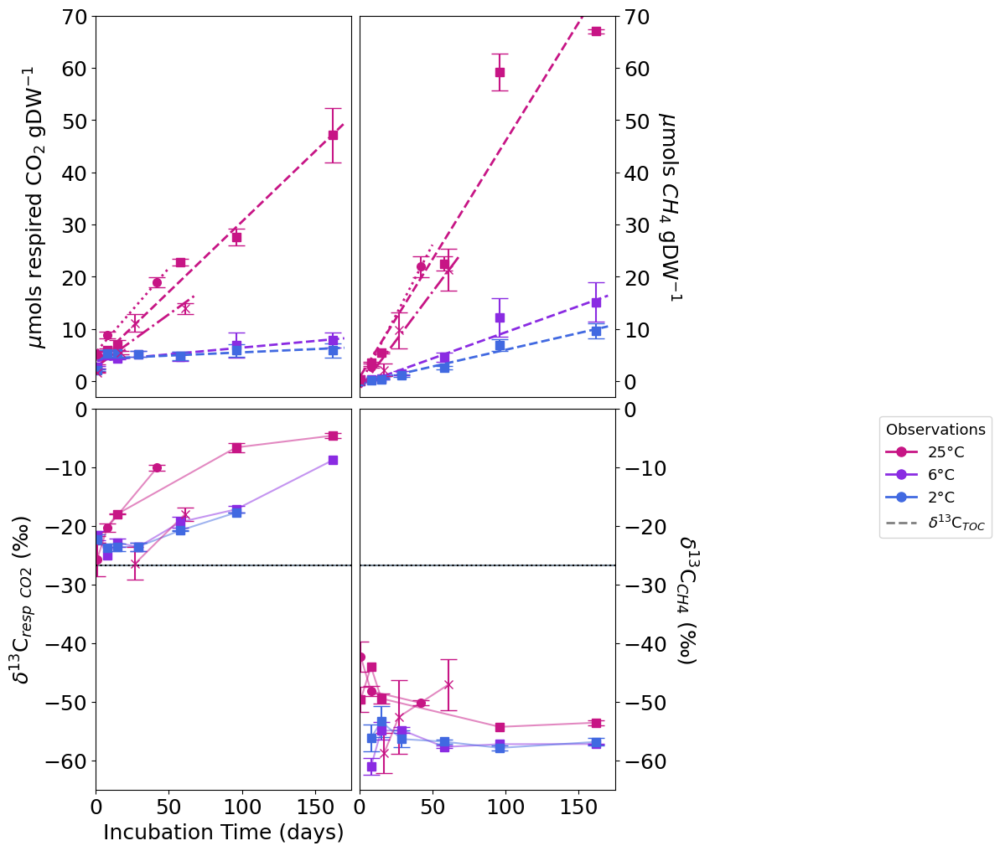

In [97]:
##CH4 and CO2 conc d13C CO2 and CH4 SL4 methane producers
# Filter for names starting with 'SL1'
sl4_names_CH4 = ['SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C', 'SL4_dAA_25C', 'SL4_AL_25C']      #name for name in sorted_df_CH4['Name'].unique() if name.startswith('SL4')]
# colors = plt.cm.get_cmap('viridis', len(sl4_names))
# colors = ['mediumvioletred', 'blueviolet', 'royalblue']

site_color_maps = {
    'SL4_dA_25C': ('mediumvioletred', 's'),
    'SL4_dA_6C': ('blueviolet', 's'),
    'SL4_dA_2C': ('royalblue', 's'),
    'SL4_dAA_25C': ('mediumvioletred', 'o'),
    'SL4_AL_25C': ('mediumvioletred', 'x'),
}

linestyles_maps = {
    'SL4_dA_25C': ('dashed'),
    'SL4_dA_6C': ('dashed'),
    'SL4_dA_2C': ('dashed'),
    'SL4_dAA_25C': ('dotted'),
    'SL4_AL_25C': ('-.'),
}

# iso_color_maps = {
#     'SL4_dA_25C': ('mediumvioletred', 's'),
#     'SL4_dA_6C': ('blueviolet', 's'),
#     'SL4_dA_2C': ('royalblue', 's'),
# }

# Define a list of markers
markers = ['o', 'o', 'o', 's', 's', 's', '^', '^', '^']  # Add more if needed


fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(8, 12),
                               gridspec_kw={'height_ratios': [1,1],
                                            'hspace': 0.03, 'wspace':0.03})

# ax2 = axes.twinx()
#final_pure_d13C_CO2 CO2_gDW

for i, name in enumerate(sl4_names_CH4):
    subset = CH4_gDW[CH4_gDW['Name'] == name]
    mask = ~np.isnan(subset['total CH4/g'])
    # subset = subset.dropna(subset=['SE CH4/gC'])
    color, marker = site_color_maps.get(name, ('black', markers[7]))
    linestyle = linestyles_maps.get(name, 'solid')
    if not subset.empty:
      ax2.errorbar(subset['incubation time'][mask], subset['total CH4/g'][mask],
                  yerr=subset['SE CH4/g'][mask],
                  color=color, marker=marker, label=name, #+' CH$_4$',
                  ecolor=color, capsize=7, linestyle='None', markersize=7)
      # ax2.plot(subset['incubation time'][mask], subset['total CH4/g'][mask], color=color, linestyle='-', alpha=0.5)

    if name in final_averaged_df_CH4_DW['Name'].values:
            row = final_averaged_df_CH4_DW[final_averaged_df_CH4_DW['Name'] == name].iloc[0]
            slope = row['mean_Slope']
            intercept = row['mean_Intercept']

        # Optional: Extend the line over the full x-range of the subset
            x_fit = np.linspace(subset['incubation time'][mask].min(), subset['incubation time'][mask].max()+8, 100) #subset['incubation time'][mask].max()
            y_fit = slope * x_fit + intercept

            ax2.plot(x_fit, y_fit, linestyle=linestyle, color=color, linewidth=2)

# ax2.invert_yaxis()
for j, name in enumerate(sl4_names_CH4):
    subset = sorted_df_d13C_CH4[sorted_df_d13C_CH4['Name'] == name]
    #subset = subset.dropna(subset=['SE d13C-CH4'])  #removes d13C-CH4 points if SE d13C-CH4 is nan
    mask = ~np.isnan(subset['d13C-CH4'])
    # color, marker = iso_color_maps.get(name, ('black', markers[7]))
    color, marker = site_color_maps.get(name, ('black', markers[7]))
    linestyle = linestyles_maps.get(name, 'solid')
    if not subset.empty:

      ax4.errorbar(subset['incubation time'][mask], subset['d13C-CH4'][mask],
                  yerr=subset['SE d13C-CH4'][mask],
                  color=color, marker=marker, label=None, #name + ' $\delta$$^{13}$C-CH$_{4}$',
                  ecolor=color, capsize=7, linestyle='None', markersize=7)

      ax4.plot(subset['incubation time'][mask], subset['d13C-CH4'][mask], color=color, linestyle='-', alpha=0.5)

    # parent_d13C_value = merged_CO2_d13C['parent d13C'].iloc[0]
    parent_d13C_value = merged_CO2_d13C.loc[merged_CO2_d13C['Name'] == name, 'parent d13C'].iloc[0]

    if name.startswith('SL4_dA_25C'):
        hline_color = 'slategray'
        hline_artist = ax4.axhline(y=parent_d13C_value, color=hline_color, linestyle='solid', label=r'SL4_AL1 C$_o$$_r$$_g$ $\delta$$^{13}$C')
    # elif name.startswith('SL4_dAA_25C'):
    #     hline_color = 'darkgray'
        # hline_artist = ax4.axhline(y=parent_d13C_value, color=hline_color, linestyle='dashed', label=r'SL4_AL2 C$_o$$_r$$_g$ $\delta$$^{13}$C')
    elif name.startswith('SL4_AL_25C'):
        hline_color = 'black'
        hline_artist = ax4.axhline(y=parent_d13C_value, color=hline_color, linestyle='dotted', label=r'SL4_PFA C$_o$$_r$$_g$ $\delta$$^{13}$C')
    # else:
    #     hline_color = 'black'



for k, name in enumerate(sl4_names_CH4):
    subset = final_pure_d13C_CO2[final_pure_d13C_CO2['Name'] == name]
    mask = ~np.isnan(subset['d13C-CO2'])
    # subset = subset.dropna(subset=['SE d13C-CO2'])
    # color, marker = iso_color_maps.get(name, ('black', markers[7]))
    color, marker = site_color_maps.get(name, ('black', markers[7]))
    linestyle = linestyles_maps.get(name, 'solid')
    if not subset.empty:
      ax3.errorbar(subset['incubation time'][mask], subset['d13C-CO2'][mask],
                  yerr=subset['SE d13C-CO2'][mask],
                  color=color, marker=marker, label=None, #name + ' $\delta$$^{13}$C-CH$_{4}$',
                  ecolor=color, capsize=7, linestyle='None', markersize=7)

      ax3.plot(subset['incubation time'][mask], subset['d13C-CO2'][mask], color=color, linestyle='-', alpha=0.5)
    # if name.startswith('SL4_dA_25C'):
    #     hline_color = 'slategray'
    #     # hline_artist = ax3.axhline(y=parent_d13C_value, xmin=0, xmax=30, color=hline_color, linestyle='dashed', label='SL4 C$_o$$_r$$_g$ $\delta$$^{13}$C')
    # else:
    #     hline_color = 'black'

    if name.startswith('SL4_dA_25C'):
        hline_color = 'slategray'
        hline_artist = ax3.axhline(y=parent_d13C_value, color=hline_color, linestyle='solid', label='')
    # elif name.startswith('SL4_dAA_25C'):
    #     hline_color = 'darkgray'
        # hline_artist = ax3.axhline(y=parent_d13C_value, color=hline_color, linestyle='dashed', label=r'SL4_AL2 C$_o$$_r$$_g$ $\delta$$^{13}$C')
    elif name.startswith('SL4_AL_25C'):
        hline_color = 'black'
        hline_artist = ax3.axhline(y=parent_d13C_value, color=hline_color, linestyle='dotted', label='')

for l, name in enumerate(sl4_names_CH4):
    subset = CO2_gDW[CO2_gDW['Name'] == name]
    mask = ~np.isnan(subset['total CO2/g'])
    # subset = subset.dropna(subset=['SE d13C-CO2'])
    # color, marker = iso_color_maps.get(name, ('black', markers[7]))
    color, marker = site_color_maps.get(name, ('black', markers[7]))
    linestyle = linestyles_maps.get(name, 'solid')
    if not subset.empty:
      ax1.errorbar(subset['incubation time'][mask], subset['total CO2/g'][mask],
                  yerr=subset['SE CO2/g'][mask],
                  color=color, marker=marker, label=None, #name + ' $\delta$$^{13}$C-CH$_{4}$',
                  ecolor=color, capsize=7, linestyle='None', markersize=7)
      # ax1.plot(subset['incubation time'][mask], subset['total CO2/g'][mask], color=color, linestyle='-', alpha=0.5)

    if name in final_averaged_df_DW['Name'].values:
            row = final_averaged_df_DW[final_averaged_df_DW['Name'] == name].iloc[0]
            slope = row['mean_Slope']
            intercept = row['mean_Intercept']

        # Optional: Extend the line over the full x-range of the subset
            x_fit = np.linspace(subset['incubation time'][mask].min(), subset['incubation time'][mask].max()+8, 100) #subset['incubation time'][mask].max()
            y_fit = slope * x_fit + intercept

            ax1.plot(x_fit, y_fit, linestyle=linestyle, color=color, linewidth=2)

# Get handles and labels from the plot
# handles, labels = plt.gca().get_legend_handles_labels()

# Remove error bars from handles
# new_handles = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]

ax3.set_xlabel('Incubation Time (days)', fontsize=18)
ax2.set_ylabel(r'$\mu$mols $CH_{4}$ gDW$^{-1}$', color='black', fontsize=18, labelpad=27, rotation=270)
#ax1.annotate(r'($\mu$mols/mgDOC)', xy=(0,1), xycoords='axes fraction', fontsize=12, ha='center', xytext=(-50,-20), textcoords='offset points', va='top', rotation=90)
ax4.set_ylabel(r'$\delta$$^{13}$C$_{CH4}$ (‰)', rotation=270, labelpad=27, color='black', fontsize=18)
ax3.set_ylabel(r'$\delta$$^{13}$C$_{resp}$ $_{CO2}$ (‰)', labelpad=4, color='black', fontsize=18)
ax1.set_ylabel(r'$\mu$mols respired CO$_{2}$ gDW$^{-1}$', color='black', fontsize=18, labelpad=10)

# ax1.tick_params(axis='y', labelcolor='black', labelsize=20)
# ax2.tick_params(axis='y', labelcolor='black', labelsize=20)

ax1.tick_params(axis='y', labelsize=18)
ax3.tick_params(axis='y', labelcolor='black', labelsize=18)
ax2.tick_params(axis='y', labelcolor='black', labelsize=18)
ax4.tick_params(axis='y', labelcolor='black', labelsize=18)

ax4.tick_params(axis='x', labelsize=18)
ax3.tick_params(axis='x', labelsize=18)
ax1.tick_params(axis='x', labelsize=18)
ax2.tick_params(axis='x', labelsize=18)


ax1.set_xticks([])
ax2.set_xticks([])
# ax2.set_yticks([])
# ax4.set_yticks([])

# ax1.set_ylim(-5,100)
# ax2.set_ylim(-70,-20)

# ax1.set_xlim(0,200)
# ax2.set_xlim(0,200)
# ax3.set_xlim(0,200)

ax2.yaxis.tick_right()
ax4.yaxis.tick_right()

ax2.yaxis.set_label_position("right")
ax4.yaxis.set_label_position("right")
# ax2.set_ylabel('')
# ax2.set_yticks([])
ax2.set_ylim(-3,70)
ax1.set_ylim(-3,70)
ax3.set_ylim(-65,0)
ax4.set_ylim(-65,0)

ax1.set_xlim(0,175)
ax2.set_xlim(0,175)
ax3.set_xlim(0,175)
ax4.set_xlim(0,175)

# ax1.set_title('Total $CH_{4}$ ($\mu$mols/g$C_{org})$ and $\delta$$^{13}$C (SL4_dA)', fontsize=18)
# plt.grid(True)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
handle_seen = set()  # Keep track of seen handles

for handle, label in zip(handles, labels):
    if handle not in handle_seen:  # Check if the handle is unique
        unique_labels.append(label)
        unique_handles.append(handle)
        handle_seen.add(handle)  # Mark the handle as seen
    else:
        unique_labels.append(label)  # Add the label even if the handle is duplicate
        unique_handles.append(matplotlib.patches.Rectangle((0, 0), 0, 0, fill=False, edgecolor='none', visible=False))
# Create the consolidated legend
# fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.5, 1), ncol=1, fontsize=15)

# axes.legend(handles, labels, bbox_to_anchor=(1.05,1), loc='upper left')
# ax2.legend(handles, labels, bbox_to_anchor=(1.05,0.85), loc='upper left')

custom_lines = [
    Line2D([0], [0], color='mediumvioletred', linestyle='-', marker='o', markersize=8, linewidth=2, label='25°C'),
    Line2D([0], [0], color='blueviolet', linestyle='-', marker='o', markersize=8, linewidth=2, label='6°C'),
    Line2D([0], [0], color='royalblue', linestyle='-', marker='o', markersize=8, linewidth=2, label='2°C'),
    # Line2D([0], [0], color='mediumvioletred', linestyle='-', marker='o', markersize=8, linewidth=2, label='SL4_AL2 25°C'),
    # Line2D([0], [0], color='mediumvioletred', linestyle='-', marker='x', markersize=10, linewidth=2, label='SL4_PFA 25°C'),
    Line2D([0], [0], color='grey', linestyle='--', linewidth=2, label=r'$\delta$$^{13}$C$_{TOC}$'),
    # Line2D([0], [0], color='black', linestyle=':', linewidth=2, label=r'SL4_PFA $\delta$$^{13}$C$_{TOC}$'),
]

# Add legend to the plot
ax.legend(handles=custom_lines, fontsize=13, loc='upper right', bbox_to_anchor=(2.5, 1), title='Observations', title_fontsize=13, handlelength=2)

plt.subplots_adjust(wspace=0, hspace=0)
# plt.tight_layout()
plt.show()

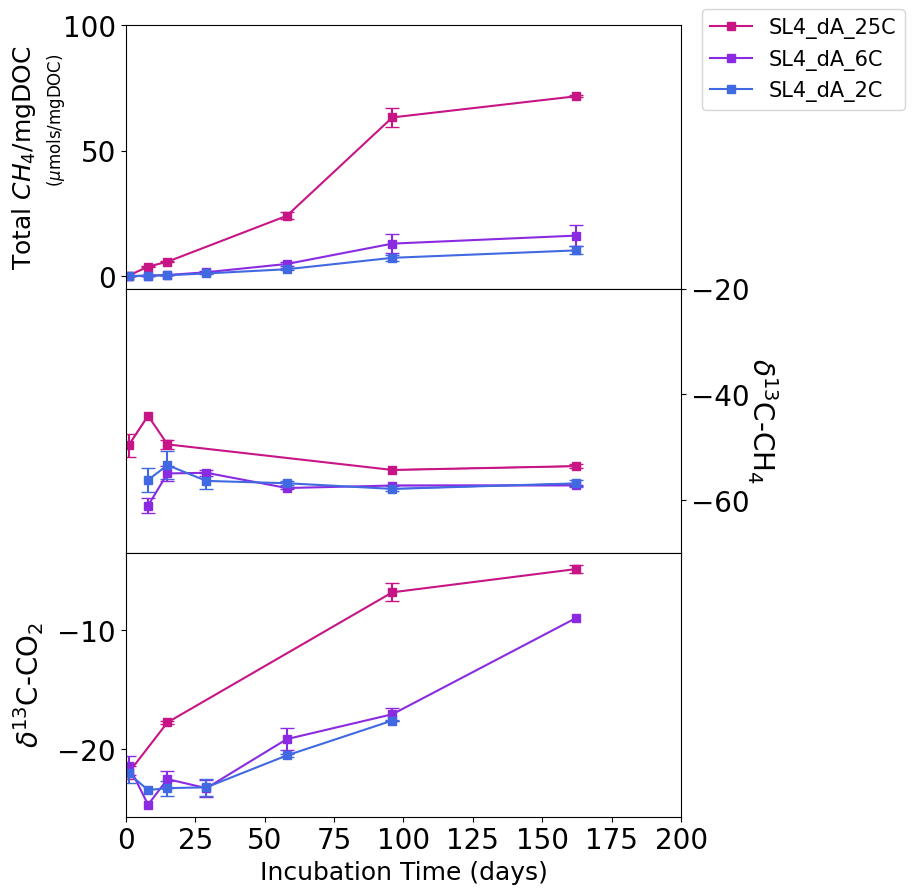

In [98]:
##CH4 conc d13C CO2 and CH4 SL4 dA
# Filter for names starting with 'SL1'
sl4_names_CH4 = ['SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C']      #name for name in sorted_df_CH4['Name'].unique() if name.startswith('SL4')]
# colors = plt.cm.get_cmap('viridis', len(sl4_names))
colors = ['mediumvioletred', 'blueviolet', 'royalblue']

site_color_maps = {
    'SL4_dA_25C': ('mediumvioletred', 's'),
    'SL4_dA_6C': ('blueviolet', 's'),
    'SL4_dA_2C': ('royalblue', 's'),
}

iso_color_maps = {
    'SL4_dA_25C': ('mediumvioletred', 's'),
    'SL4_dA_6C': ('blueviolet', 's'),
    'SL4_dA_2C': ('royalblue', 's'),
}

# Define a list of markers
markers = ['o', 'o', 'o', 's', 's', 's', '^', '^', '^']  # Add more if needed


fig, (ax1, ax2, ax3) = plt.subplots(3,1,figsize=(8, 9), sharex='col',
                               gridspec_kw={'height_ratios': [1, 1,1],
                                            'hspace': 0})

# ax2 = axes.twinx()

for i, name in enumerate(sl4_names_CH4):
    subset = C_DOC[C_DOC['Name'] == name]
    mask = ~np.isnan(subset['total CH4/mgC'])
    # subset = subset.dropna(subset=['SE CH4/gC'])
    color, marker = site_color_maps.get(name, ('black', markers[7]))
    if not subset.empty:
      ax1.errorbar(subset['incubation time'][mask], subset['total CH4/mgC'][mask],
                  yerr=subset['SE total CH4/mgC'][mask],
                  color=color, marker=marker, label=name, #+' CH$_4$',
                  ecolor=color, capsize=5)
ax2.invert_yaxis()
for j, name in enumerate(sl4_names_CH4):
    subset = sorted_df_d13C_CH4[sorted_df_d13C_CH4['Name'] == name]
    #subset = subset.dropna(subset=['SE d13C-CH4'])  #removes d13C-CH4 points if SE d13C-CH4 is nan
    mask = ~np.isnan(subset['d13C-CH4'])
    color, marker = iso_color_maps.get(name, ('black', markers[7]))
    if not subset.empty:

      ax2.errorbar(subset['incubation time'][mask], subset['d13C-CH4'][mask],
                  yerr=subset['SE d13C-CH4'][mask],
                  color=color, marker=marker, label=None, #name + ' $\delta$$^{13}$C-CH$_{4}$',
                  ecolor=color, capsize=5)

      ax2.plot(subset['incubation time'], subset['d13C-CH4'],
                      color=color, linestyle='-', linewidth=1)

    parent_d13C_value = merged_CO2_d13C['parent d13C'].iloc[0]

    # if name.startswith('SL4_dA_25C'):
    #     hline_color = 'slategray'
    #     hline_artist = ax2.axhline(y=parent_d13C_value, xmin=0, xmax=30, color=hline_color, linestyle='dashed', label='SL4 C$_o$$_r$$_g$ $\delta$$^{13}$C')
    # else:
    #     hline_color = 'black'


for k, name in enumerate(sl4_names_CH4):
    subset = merged_CO2_d13C[merged_CO2_d13C['Name'] == name]
    mask = ~np.isnan(subset['d13C-CO2'])
    # subset = subset.dropna(subset=['SE d13C-CO2'])
    color, marker = iso_color_maps.get(name, ('black', markers[7]))
    if not subset.empty:
      ax3.errorbar(subset['incubation time'][mask], subset['d13C-CO2'][mask],
                  yerr=subset['SE d13C-CO2'][mask],
                  color=color, marker=marker, label=None, #name + ' $\delta$$^{13}$C-CH$_{4}$',
                  ecolor=color, capsize=5)
    # if name.startswith('SL4_dA_25C'):
    #     hline_color = 'slategray'
    #     # hline_artist = ax3.axhline(y=parent_d13C_value, xmin=0, xmax=30, color=hline_color, linestyle='dashed', label='SL4 C$_o$$_r$$_g$ $\delta$$^{13}$C')
    # else:
    #     hline_color = 'black'

# Get handles and labels from the plot
# handles, labels = plt.gca().get_legend_handles_labels()

# Remove error bars from handles
# new_handles = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]

ax3.set_xlabel('Incubation Time (days)', fontsize=18)
ax1.set_ylabel('Total $CH_{4}$/mgDOC', color='black', fontsize=18, labelpad=18)
ax1.annotate(r'($\mu$mols/mgDOC)', xy=(0,1), xycoords='axes fraction', fontsize=12, ha='center', xytext=(-50,-20), textcoords='offset points', va='top', rotation=90)
ax2.set_ylabel(r'$\delta$$^{13}$C-CH$_{4}$', rotation=270, labelpad=22, color='black', fontsize=20)
ax3.set_ylabel(r'$\delta$$^{13}$C-CO$_{2}$', labelpad=8, color='black', fontsize=20)

ax1.tick_params(axis='y', labelcolor='black', labelsize=20)
ax2.tick_params(axis='y', labelcolor='black', labelsize=20)
ax3.tick_params(axis='y', labelcolor='black', labelsize=20)
ax3.tick_params(axis='x', labelsize=20)
# ax1.set_xticks([])

ax1.set_ylim(-5,100)
ax2.set_ylim(-70,-20)

ax1.set_xlim(0,200)
ax2.set_xlim(0,200)
ax3.set_xlim(0,200)

ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")

# ax1.set_title('Total $CH_{4}$ ($\mu$mols/g$C_{org})$ and $\delta$$^{13}$C (SL4_dA)', fontsize=18)
# plt.grid(True)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
handle_seen = set()  # Keep track of seen handles

for handle, label in zip(handles, labels):
    if handle not in handle_seen:  # Check if the handle is unique
        unique_labels.append(label)
        unique_handles.append(handle)
        handle_seen.add(handle)  # Mark the handle as seen
    else:
        unique_labels.append(label)  # Add the label even if the handle is duplicate
        unique_handles.append(matplotlib.patches.Rectangle((0, 0), 0, 0, fill=False, edgecolor='none', visible=False))
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.15, 1), ncol=1, fontsize=15)

# axes.legend(handles, labels, bbox_to_anchor=(1.05,1), loc='upper left')
# ax2.legend(handles, labels, bbox_to_anchor=(1.05,0.85), loc='upper left')
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
plt.show()

<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:70: SyntaxWarning: invalid escape sequence '\m'
<>:54: SyntaxWarning: invalid escape sequence '\m'
<>:70: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-2486557033.py:54: SyntaxWarning: invalid escape sequence '\m'
  ax1.annotate('($\mu$mols/gC$_o$$_r$$_g$)', xy=(0,1), xycoords='axes fraction', fontsize=12, ha='center', xytext=(-50,-300), textcoords='offset points', va='top', rotation=90, color='blue')
/tmp/ipython-input-2486557033.py:70: SyntaxWarning: invalid escape sequence '\m'
  ax1.set_title('Total $CH_{4}$ and Total $CO_{2}$/g$C_{org}$ ($\mu$mols/g$C_{org})$ (SL4_dA)', fontsize=18)


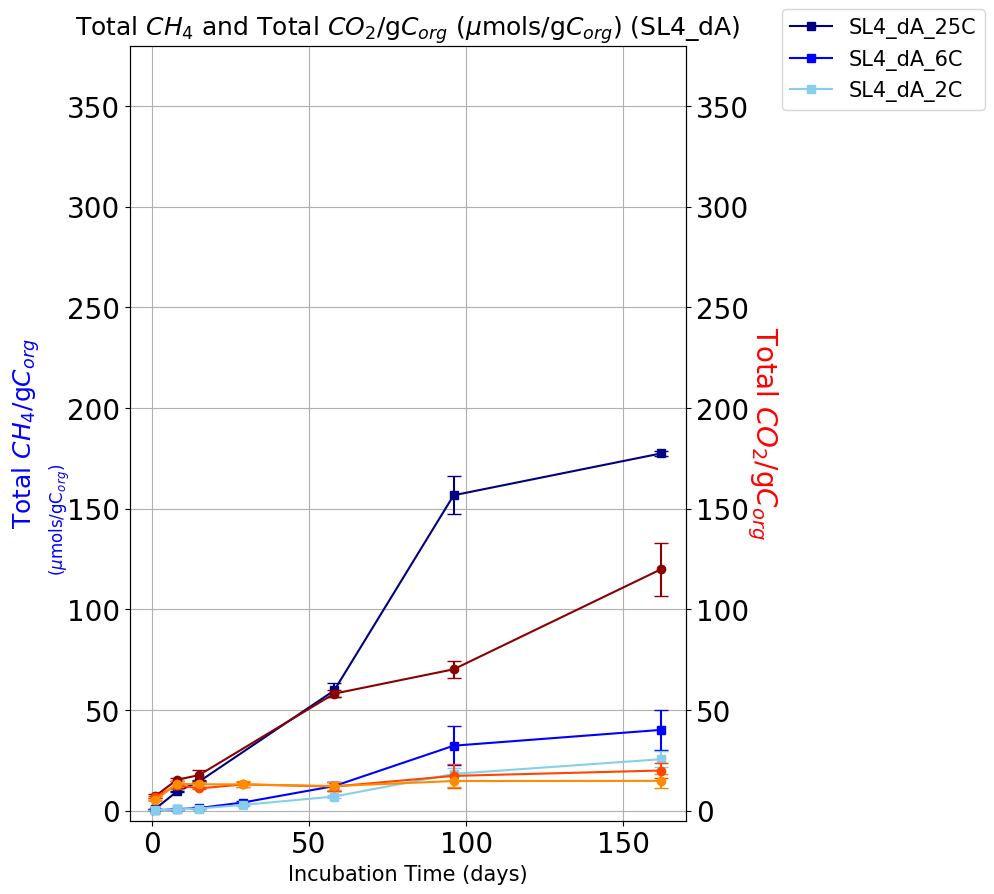

In [99]:
#CO2 vs H4
# Filter for names starting with 'SL1'
sl4_names_CH4 = ['SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C']      #name for name in sorted_df_CH4['Name'].unique() if name.startswith('SL4')]
# colors = plt.cm.get_cmap('viridis', len(sl4_names))
colors = ['navy', 'blue', 'skyblue']

iso_color_maps = {
    'SL4_dA_25C': ('darkred', 'o'),
    'SL4_dA_6C': ('orangered', 'o'),
    'SL4_dA_2C': ('darkorange', 'o'),
}

site_color_maps = {
    'SL4_dA_25C': ('navy', 's'),
    'SL4_dA_6C': ('blue', 's'),
    'SL4_dA_2C': ('skyblue', 's'),
}

# Define a list of markers
markers = ['o', 'o', 'o', 's', 's', 's', '^', '^', '^']  # Add more if needed


fig, (ax1) = plt.subplots(1,1,figsize=(8, 9), sharex='col',
                               gridspec_kw={'height_ratios': [1],
                                            'hspace': 0})

# ax2 = axes.twinx()

for i, name in enumerate(sl4_names_CH4):
    subset = sorted_df_CH4[sorted_df_CH4['Name'] == name]
    subset = subset.dropna(subset=['SE CH4/gC'])
    color, marker = site_color_maps.get(name, ('black', markers[7]))
    if not subset.empty:
      ax1.errorbar(subset['incubation time'], subset['total CH4/gC'],
                  yerr=subset['SE CH4/gC'],
                  color=color, marker=marker, label=name, #+' CH$_4$',
                  ecolor=color, capsize=5)
ax2 = ax1.twinx()
for j, name in enumerate(sl4_names_CH4):
    subset = merged_CO2_d13C[merged_CO2_d13C['Name'] == name]
    #subset = subset.dropna(subset=['SE d13C-CH4'])  #removes d13C-CH4 points if SE d13C-CH4 is nan
    mask = ~np.isnan(subset['total CO2/gC'])
    color, marker = iso_color_maps.get(name, ('black', markers[7]))
    if not subset.empty:

      ax2.errorbar(subset['incubation time'][mask], subset['total CO2/gC'][mask],
                  yerr=subset['SE CO2/gC'][mask],
                  color=color, marker=marker, label=None, #name + ' $\delta$$^{13}$C-CH$_{4}$',
                  ecolor=color, capsize=5)


ax1.set_xlabel('Incubation Time (days)', fontsize=15)
ax1.set_ylabel('Total $CH_{4}$/g$C_{org}$', color='blue', fontsize=18, labelpad=18)
ax1.annotate('($\mu$mols/gC$_o$$_r$$_g$)', xy=(0,1), xycoords='axes fraction', fontsize=12, ha='center', xytext=(-50,-300), textcoords='offset points', va='top', rotation=90, color='blue')
ax2.set_ylabel('Total $CO_{2}$/g$C_{org}$', rotation=270, labelpad=22, color='red', fontsize=20)
#ax3.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', labelpad=8, color='black', fontsize=20)

ax1.tick_params(axis='y', labelcolor='black', labelsize=20)
ax2.tick_params(axis='y', labelcolor='black', labelsize=20)
#ax3.tick_params(axis='y', labelcolor='black', labelsize=20)
ax1.tick_params(axis='x', labelsize=20)
# ax1.set_xticks([])

ax1.set_ylim(-5,380)
ax2.set_ylim(-5,380)

ax2.yaxis.tick_right()
ax2.yaxis.set_label_position("right")

ax1.set_title('Total $CH_{4}$ and Total $CO_{2}$/g$C_{org}$ ($\mu$mols/g$C_{org})$ (SL4_dA)', fontsize=18)
ax1.grid(True)
#ax2.grid(True)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
handle_seen = set()  # Keep track of seen handles

for handle, label in zip(handles, labels):
    if handle not in handle_seen:  # Check if the handle is unique
        unique_labels.append(label)
        unique_handles.append(handle)
        handle_seen.add(handle)  # Mark the handle as seen
    else:
        unique_labels.append(label)  # Add the label even if the handle is duplicate
        unique_handles.append(matplotlib.patches.Rectangle((0, 0), 0, 0, fill=False, edgecolor='none', visible=False))
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.25, 1), ncol=1, fontsize=15)

#axes.legend(handles, labels, bbox_to_anchor=(1.05,1), loc='upper left')
#ax1.legend(handles, labels, bbox_to_anchor=(1.05,1), loc='upper left')
#ax2.legend(handles, labels, bbox_to_anchor=(1.05,0.85), loc='upper left')
plt.subplots_adjust(wspace=0, hspace=0)
plt.tight_layout()
plt.show()

#lability

In [100]:
DOC_quick = pd.read_csv('https://docs.google.com/spreadsheets/d/19IvtzXX08vc1FTZS4Ksv1ouLZcWHKryY_cKksT-vY1E/export?format=csv')

DOC_quick = DOC_quick.reset_index()
#drop names with BTL
DOC_quick = DOC_quick[~DOC_quick['Name'].str.contains('BTL')]
DOC_quick = DOC_quick.reset_index(drop=True)

DOC_quick

,index,Name,Temperature,DOC (mg/L),TOC (wt %),CO2/gDW/day,SE CO2/gDW/day,CO2/gwater/day,SE CO2/gwater/day,CO2/mgDOC/day,CO2/gC/day (TOC),CO2/gDW/day short,C/N,water content,CO2/gCTOC/day (microg C-CO2 /gC/day),CH4/gCTOC/day (microg C-CH4 /gC/day)
0,0,SL1_dA,25,158.000000,0.83,0.004735,0.000853,0.015792,0.002845,0.099950,0.570507,0.003302,10.310,29.984779,6.851789,NaN
1,1,SL1_dB,25,255.000647,0.35,0.006694,0.000152,0.021753,0.000493,0.085306,1.912540,0.000179,10.210,30.772369,22.969610,NaN
2,2,SL1_dC,25,386.100000,1.27,0.004772,0.002518,0.009746,0.005143,0.025243,0.375735,0.007220,10.285,48.959947,4.512576,NaN
3,3,SL4_dA,25,170.557621,37.78,0.269172,0.036596,0.049044,0.004938,0.287548,0.712472,0.292952,13.705,548.836276,8.556789,14.417669
4,4,SL4_AL,25,200.100000,3.07,0.202086,0.016743,0.317854,0.026335,1.588474,6.582607,0.352905,13.810,63.578330,79.057116,146.256615
5,5,SL4_dB,25,69.030000,0.64,0.005004,0.000900,0.010933,0.001967,0.158382,0.781864,0.003138,12.685,45.770000,9.390189,NaN
6,6,SL4_dC,25,114.800000,1.22,0.011485,0.000390,0.025476,0.000865,0.221920,0.941414,0.008234,11.835,45.081892,11.306388,NaN
7,12,SL1_dA,6,158.000000,0.83,-0.000132,0.000192,-0.000441,0.000641,NaN,NaN,0.003358,10.310,29.984779,NaN,NaN
8,13,SL1_dB,6,255.000647,0.35,-0.000955,0.000020,-0.003104,0.000064,NaN,NaN,0.000824,10.210,30.772369,NaN,NaN
9,14,SL1_dC,6,386.100000,1.27,-0.002144,0.000405,-0.004379,0.000827,NaN,NaN,-0.002448,10.285,48.959947,NaN,NaN


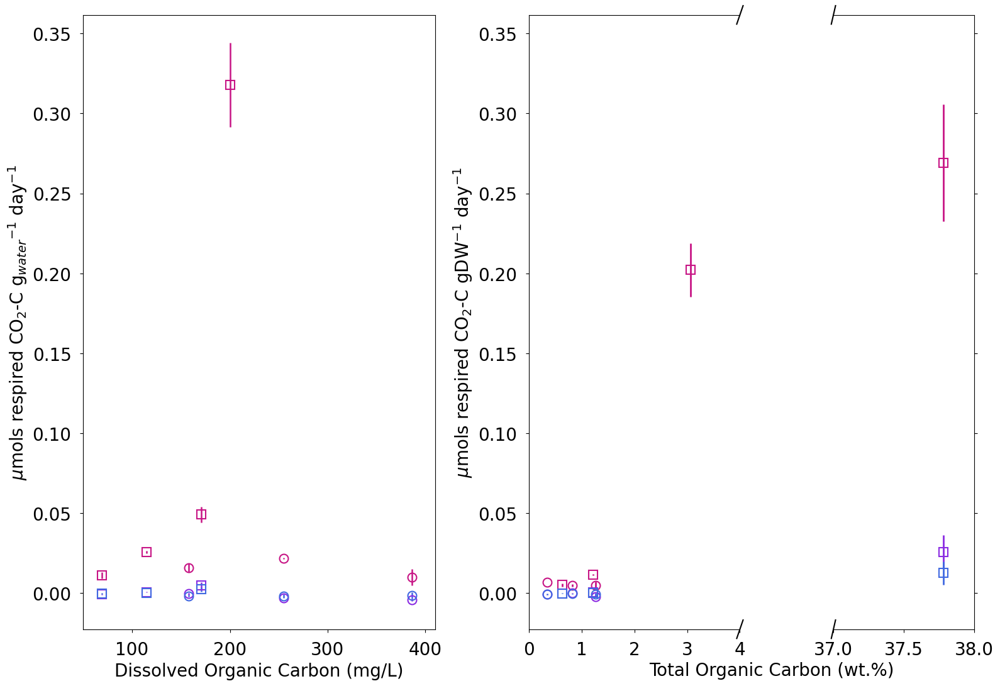

In [101]:
color_map = {
    'SL1_dA': ('darkgreen', 'o'),
    'SL1_dB': ('darkgreen', 'o'),
    'SL1_dC': ('darkgreen', 'o'),
    'SL4_dA': ('indigo', 's'),
    'SL4_dB': ('indigo', 's'),
    'SL4_dC': ('indigo', 's'),
    'SL4_AL': ('indigo', 's'),
    # 'BTL_dA': ('dodgerblue', '^'),
    # 'BTL_dB': ('dodgerblue', '^'),
    # 'BTL_dC': ('dodgerblue', '^'),
    # 'BTL_dD': ('dodgerblue', '^'),
    # 'BTL_dE': ('dodgerblue', '^'),
}
# colors = [color_map.get(name, marker) for name in DOC_quick['Name']]
temp_to_alpha = {25: 1.0, 6: 1.0, 2: 1.0}

# Define mapping from temperature to color
temp_to_color = {
    25: 'mediumvioletred',
    6: 'blueviolet',
    2: 'royalblue'
}

# Define mapping from group prefix to marker style
group_to_marker = {
    'SL1': 'o',
    'SL4': 's'
}

# Initialize sets to keep track of what’s been plotted for legend
plotted_labels = set()


# labels = {'darkgree':'SL1', 'indigo':'SL4', 'dodgerblue':'BTL'}
# DOC_quick['Name'] = DOC_quick['Name'].map(labels)
plotted_colors = set()
plotted_labels = set()

# Create a scatter plot
fig, (ax, ax1a, ax1b) = plt.subplots(1, 3, figsize=(16,11), gridspec_kw={'width_ratios': [1, 0.6, 0.4]}, sharey=True)

# Iterate through the data
for i in range(len(DOC_quick)):
    name = DOC_quick['Name'][i]
    temp = DOC_quick['Temperature'][i]
    doc = DOC_quick['DOC (mg/L)'][i]
    co2 = DOC_quick['CO2/gwater/day'][i]

    # if co2 < 0:
    #     continue

    # Determine group (e.g., 'SL1', 'SL4', etc.)
    group = name.split('_')[0]  # Assumes names like 'SL1_dA'

    # Get color based on temperature
    color = temp_to_color.get(temp, 'gray')

    # Get marker based on group
    marker = group_to_marker.get(group, 'o')

    # Build label for legend only once per group-temp combo
    label = f'{group} - {temp}°C'
    if label not in plotted_labels:
        ax.errorbar(doc, co2, fmt=marker, markeredgecolor=color, markerfacecolor='none', markersize=10, markeredgewidth=1.5, label=label,
                    linewidth=1.8, linestyle='none', yerr=DOC_quick['SE CO2/gwater/day'][i], ecolor=color, capsize=0)
        plotted_labels.add(label)
    else:
        ax.errorbar(doc, co2, fmt=marker, markeredgecolor=color, markerfacecolor='none', markersize=10, markeredgewidth=1.5, label=label,
                    linewidth=1.8, linestyle='none', yerr=DOC_quick['SE CO2/gwater/day'][i], ecolor=color, capsize=0)

    # ax.hlines(y=0, xmin=50, xmax=500, color='black', linestyles='dashed', linewidth=1)

plotted_colors = set()
plotted_labels = set()


for i in range(len(DOC_quick)):
    name = DOC_quick['Name'][i]
    temp = DOC_quick['Temperature'][i]
    x_val = DOC_quick['TOC (wt %)'][i]
    y_val = DOC_quick['CO2/gDW/day'][i]
    alpha = temp_to_alpha.get(temp, 1.0)

    # if y_val < 0:
    #     continue

    # Get group from name
    group = name.split('_')[0]  # Assumes names like 'SL1_dA'

    # Assign color and marker
    color = temp_to_color.get(temp, 'gray')
    marker = group_to_marker.get(group, 'o')

    # Plot in appropriate subplot
    if 0 <= x_val <= 6:
        ax1a.errorbar(x_val, y_val, yerr=DOC_quick['SE CO2/gDW/day'][i], markeredgecolor=color, markeredgewidth=1.5, markerfacecolor='none',
                      fmt=marker, markersize=10, alpha=alpha, linewidth=2, linestyle='none', ecolor=color, capsize=0)
    elif 37 <= x_val <= 38:
        ax1b.errorbar(x_val, y_val, yerr=DOC_quick['SE CO2/gDW/day'][i], markeredgecolor=color, markeredgewidth=1.5, markerfacecolor='none',
                      fmt=marker, markersize=10, alpha=alpha, linewidth=2, linestyle='none', ecolor=color, capsize=0)

# for i in range(len(DOC_quick)):
#     name = DOC_quick['Name'][i]
#     temp = DOC_quick['Temperature'][i]
#     alpha = temp_to_alpha.get(temp, 1.0)
#     x_val = DOC_quick['TOC (wt %)'][i]
#     y_val = DOC_quick['CO2/gDW/day'][i]
#     color, marker = color_map.get(name, ('gray', 'o'))

#     if 0 <= x_val <= 6:
#         ax1a.scatter(x_val, y_val, color=color, marker=marker, s=90, alpha=alpha)
#     elif 37 <= x_val <= 38:
#         ax1b.scatter(x_val, y_val, color=color, marker=marker, s=90, alpha=alpha)

ax.set_xlim(50, 410)
# Set x-limits for broken axis
ax1a.set_xlim(0, 4)
ax1b.set_xlim(37, 38)
# ax1a.set_ylim(-0.1, 0.05)
# ax1b.set_ylim(-0.1, 0.05)

#log?
# ax.set_yscale('log')
# ax1a.set_yscale('log')
# ax1b.set_yscale('log')


# Hide spines between the two plots
ax1a.spines['right'].set_visible(False)
ax1b.spines['left'].set_visible(False)
ax1a.yaxis.tick_left()
ax1a.tick_params(labelright=False, labelsize=20, pad=10)
ax1b.yaxis.tick_right()
ax1a.yaxis.set_tick_params(labelleft=True, labelsize=20, pad=10)
ax1b.set_xticks([37, 37.5, 38])  # Tick positions

# Add diagonal lines to indicate the axis break
d = .015  # size of diagonal lines
kwargs = dict(transform=ax1a.transAxes, color='k', clip_on=False)
ax1a.plot((1 - d, 1 + d), (-d, +d), **kwargs)        # top-right
ax1a.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)  # bottom-right

kwargs.update(transform=ax1b.transAxes)  # switch to the right axes
ax1b.plot((-d, +d), (-d, +d), **kwargs)             # top-left
ax1b.plot((-d, +d), (1 - d, 1 + d), **kwargs)       # bottom-left

# Set labels and titles
ax.set_xlabel('Dissolved Organic Carbon (mg/L)', fontsize=20)
ax.set_ylabel(r'$\mu$mols respired CO$_{2}$-C g$_{water}$$^{-1}$ day$^{-1}$', fontsize=20)

ax1a.set_xlabel('')
ax1b.set_xlabel('')
fig.text(0.77, 0.02, 'Total Organic Carbon (wt.%)', ha='center', fontsize=20)
ax1b.set_xlabel('', fontsize=20)
ax1a.set_ylabel(r'$\mu$mols respired CO$_{2}$-C gDW$^{-1}$ day$^{-1}$', fontsize=20)

# Format ticks
for axis in [ax, ax1a, ax1b]:
    axis.tick_params(axis='x', labelsize=20, pad=10)
    axis.tick_params(axis='y', labelsize=20, pad=10)

# Legend
# ax.legend(loc='upper right', fontsize=15)

plt.tight_layout()
plt.show()


#core characteristics

In [102]:
#use google sheets
core_char=pd.read_csv('https://docs.google.com/spreadsheets/d/1Abmo9sjGRRavq-RFeuLL3ARmd5m1B6hP3QwQhfiiBdk/export?format=csv')

core_char = core_char.reset_index()
core_char

,index,Site Name,Depth (cm),Corr depth (cm),TOC (wt %),D13CTOC,TN (wt %),D15NTN,TOC/TN,Water content (%),Grain density (g/cm3),Depth range (cm),DOC (mg/L),pH
0,0,SL1,54.0,54.0,2.70,-26.11,0.15,5.33,17.90,28.124547,2.600,4.0,NaN,NaN
1,1,SL1,72.5,72.5,0.56,-26.10,0.05,5.44,10.31,45.908273,2.652,5.0,NaN,NaN
2,2,SL1,79.5,79.5,0.83,-25.64,NaN,NaN,NaN,29.984779,NaN,9.0,NaN,NaN
3,3,SL1,87.5,87.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,158.000000,7.100
4,4,SL1,94.0,94.0,0.45,-26.28,0.04,3.17,12.03,65.158371,2.646,6.0,NaN,NaN
5,5,SL1,125.5,125.5,0.33,-25.77,0.03,4.00,10.70,62.266415,NaN,5.0,NaN,NaN
6,6,SL1,131.0,131.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,44.190000,7.600
7,7,SL1,136.0,136.0,0.68,-25.37,0.07,5.59,10.06,34.237187,NaN,4.0,NaN,NaN
8,8,SL1,147.5,147.5,0.71,-25.46,0.07,5.06,10.12,29.281046,NaN,5.0,NaN,NaN
9,9,SL1,163.0,163.0,0.54,-25.44,0.05,5.42,10.70,30.914394,2.697,4.0,NaN,NaN


In [103]:
#drop depth range column
# core_char = core_char.drop(columns=['Depth range (cm)'])
core_char = core_char.drop(columns=['Depth (cm)'])
core_char = core_char.drop(index=22)
core_char

,index,Site Name,Corr depth (cm),TOC (wt %),D13CTOC,TN (wt %),D15NTN,TOC/TN,Water content (%),Grain density (g/cm3),Depth range (cm),DOC (mg/L),pH
0,0,SL1,54.0,2.70,-26.11,0.15,5.33,17.90,28.124547,2.600,4.0,NaN,NaN
1,1,SL1,72.5,0.56,-26.10,0.05,5.44,10.31,45.908273,2.652,5.0,NaN,NaN
2,2,SL1,79.5,0.83,-25.64,NaN,NaN,NaN,29.984779,NaN,9.0,NaN,NaN
3,3,SL1,87.5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.0,158.000000,7.100
4,4,SL1,94.0,0.45,-26.28,0.04,3.17,12.03,65.158371,2.646,6.0,NaN,NaN
5,5,SL1,125.5,0.33,-25.77,0.03,4.00,10.70,62.266415,NaN,5.0,NaN,NaN
6,6,SL1,131.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.0,44.190000,7.600
7,7,SL1,136.0,0.68,-25.37,0.07,5.59,10.06,34.237187,NaN,4.0,NaN,NaN
8,8,SL1,147.5,0.71,-25.46,0.07,5.06,10.12,29.281046,NaN,5.0,NaN,NaN
9,9,SL1,163.0,0.54,-25.44,0.05,5.42,10.70,30.914394,2.697,4.0,NaN,NaN


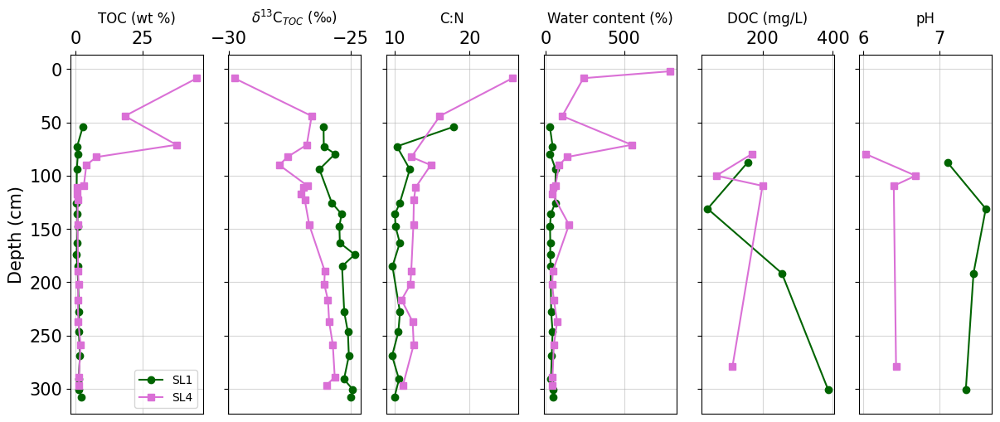

In [104]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

custom_titles = {
    'D13CTOC': r'$\delta$$^{13}$C$_{TOC}$ ($\perthousand$)',
    'D15NTN': r'$\delta$$^{15}$N$_{TN}$ ($\perthousand$)',
    'Grain density (g/cm3)': 'Grain density (g/cm$^{3}$)',
    'TOC (wt %)': 'TOC (wt %)',
    'TN (wt %)': 'TN (wt %)',
    'Water content (%)': 'Water content (%)',
    'DOC (mg/L)': 'DOC (mg/L)',
    'pH': 'pH',
    'Depth range (cm)': 'Depth range (cm)',
    'TOC/TN' : 'C:N', # Include 'Depth range (cm)' in custom_titles if needed

}

# Filter data for SL1 and SL4
SL1_data = core_char[core_char['Site Name'] == 'SL1'].copy() # Use .copy() to avoid SettingWithCopyWarning
SL4_data = core_char[core_char['Site Name'] == 'SL4'].copy() # Use .copy() to avoid SettingWithCopyWarning

# Create masks for NaN values (for all columns)
SL1_masks = {col: np.isfinite(pd.to_numeric(SL1_data[col], errors='coerce'))
             for col in SL1_data.columns if col != 'Site Name'}
SL4_masks = {col: np.isfinite(pd.to_numeric(SL4_data[col], errors='coerce'))
             for col in SL4_data.columns if col != 'Site Name'}


# Select columns for plotting, excluding 'Site Name' and index column
cols_to_plot = [col for col in SL1_data.columns if col not in ['Site Name', SL1_data.index.name, 'Corr depth (cm)', 'index', 'TN (wt %)', 'Grain density (g/cm3)', 'Depth range (cm)', 'index', 'D15NTN']]

#add incub depths
SL1_dA_min = 75
SL1_dA_max = 84

SL1_dB_min = 165
SL1_dB_max = 183

SL1_dC_min = 295
SL1_dC_max = 306

SL4_dA_min = 62
SL4_dA_max = 75

SL4_dAA_min = 75
SL4_dAA_max = 84

SL4_dAB_min = 106
SL4_dAB_max = 113

SL4_dB_min = 114
SL4_dB_max = 121

SL4_dC_min = 284
SL4_dC_max = 294

# Create the figure and axes
num_cols_to_plot = len(cols_to_plot)
fig, axes = plt.subplots(1, num_cols_to_plot, figsize=(12, 5), sharey=True)
# plt.subplots_adjust(wspace=0) doesnt work since im already using tight.layout()

# Loop through selected columns and plot
for i, col in enumerate(cols_to_plot):
    # Access the correct axes object
    ax = axes[i] if num_cols_to_plot > 1 else axes  # Handle single subplot case

    # Plot SL1 data with mask, using 'Depth range (cm)' for yerr
    ax.plot(SL1_data[col][SL1_masks[col]], SL1_data['Corr depth (cm)'][SL1_masks[col]], label='SL1', marker='o', color='darkgreen')
                #yerr=SL1_data['Depth range (cm)'][SL1_masks[col]], ecolor='darkgreen', fmt='o') # Pass numerical values for yerr

    # Plot SL4 data with mask
    ax.plot(SL4_data[col][SL4_masks[col]], SL4_data['Corr depth (cm)'][SL4_masks[col]], label='SL4', marker='s', color='orchid')


    # ax.axhspan(SL1_dA_min, SL1_dA_max, color='lightgreen', alpha=0.4)
    # ax.axhspan(SL1_dB_min, SL1_dB_max, color='lightgreen', alpha=0.4)
    # ax.axhspan(SL1_dC_min, SL1_dC_max, color='lightgreen', alpha=0.4)
    # ax.axhspan(SL4_dA_min, SL4_dA_max, color='orchid', alpha=0.4)
    # ax.axhspan(SL4_dAA_min, SL4_dAA_max, color='orchid', alpha=0.4)
    # ax.axhspan(SL4_dAB_min, SL4_dAB_max, color='orchid', alpha=0.4)
    # ax.axhspan(SL4_dB_min, SL4_dB_max, color='orchid', alpha=0.4)
    # ax.axhspan(SL4_dC_min, SL4_dC_max, color='orchid', alpha=0.4)

    # #dephts
    # if i == 0:
    #   ax.axhspan(SL4_dA_min, SL4_dA_max, color='darkgrey', alpha=0.5)
    #   ax.axhspan(SL4_dAA_min, SL4_dAA_max, color='darkgrey', alpha=0.5)
    #   ax.axhspan(SL4_dAB_min, SL4_dAB_max, color='darkgrey', alpha=0.5)
    #   ax.axhspan(SL4_dB_min, SL4_dB_max, color='darkgrey', alpha=0.5)
    #   ax.axhspan(SL4_dC_min, SL4_dC_max, color='darkgrey', alpha=0.5)

    # if i == 1:
    #   ax.axhspan(SL1_dA_min, SL1_dA_max, color='lightgrey', alpha=0.5)
    #   ax.axhspan(SL1_dB_min, SL1_dB_max, color='lightgrey', alpha=0.5)
    #   ax.axhspan(SL1_dC_min, SL1_dC_max, color='lightgrey', alpha=0.5)



    # Customize the plot
    #ax.set_xlabel(col)  # Set x-axis label to column name
    ax.set_ylabel('Depth (cm)', fontsize=15)
    ax.tick_params(axis='x', labelsize=15, top=True, labeltop=True, bottom=False, labelbottom=False)
    ax.tick_params(axis='y', labelsize=15)
    ax.grid(True, alpha=0.5)

    ax.set_title(custom_titles.get(col,col),loc='center', y=1.07)

    # Control tick visibility
    if i > 0:  # For all but the first subplot (i=0)
        # Hide tick labels but keep tick marks
        plt.setp(ax.get_yticklabels(), visible=False)
        ax.set_ylabel('')


# Only add legend to the first subplot
if num_cols_to_plot > 1:
    axes[0].legend(loc='lower right')  # Add legend to the first subplot
else:
    axes.legend()   # Handle single subplot case
ax.invert_yaxis()  # Invert y-axis for depth

# Adjust layout and display the plot
# ref_pos = ax.get_position()

plt.tight_layout(pad=0.5)
plt.show()

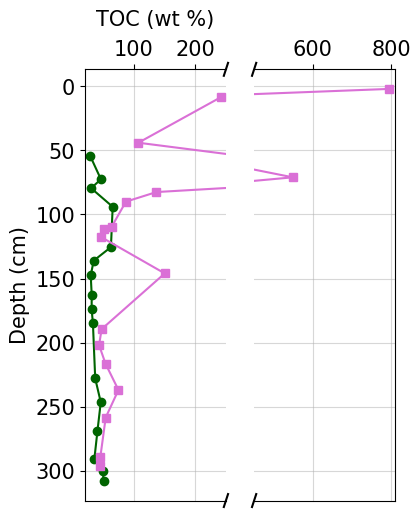

In [105]:
from matplotlib.transforms import Bbox
# Set up the figure with two x-axes side-by-side, sharing y
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(4, 5.6), gridspec_kw={'width_ratios': [1, 1]})

# Define the break range
x1_lim = (20, 250)
x2_lim = (450, 810)

def plot_site(ax, data, mask, label, color, marker):
    x = data['Water content (%)'][mask]
    y = data['Corr depth (cm)'][mask]
    sorted_idx = y.argsort()
    x = x.iloc[sorted_idx]
    y = y.iloc[sorted_idx]
    ax.plot(x, y, marker=marker, color=color, label=label, linestyle='-')

# Plot on the left (0–100)
plot_site(ax1, SL1_data, SL1_masks['Water content (%)'], 'SL1', 'darkgreen', 'o')
plot_site(ax1, SL4_data, SL4_masks['Water content (%)'], 'SL4', 'orchid', 's')
ax1.set_xlim(x1_lim)
ax1.invert_yaxis()
ax1.set_xlabel('Water content (%)', fontsize=15)
ax1.set_ylabel('Depth (cm)', fontsize=15)

# Plot on the right (200–500)
plot_site(ax2, SL1_data, SL1_masks['Water content (%)'], None, 'darkgreen', 'o')
plot_site(ax2, SL4_data, SL4_masks['Water content (%)'], None, 'orchid', 's')
ax2.set_xlim(x2_lim)
ax2.invert_yaxis()
ax2.set_xlabel(' ')

# Hide spines between the two plots
ax1.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
# ax2.yaxis.tick_right()
ax2.yaxis.set_ticks_position('none')
ax2.tick_params(labelright=False)
ax1.tick_params(labelright=False)
ax1.tick_params(labelleft=True, labelsize=15)
ax2.tick_params(axis='x', labelleft=True, labelsize=15)
ax1.grid(True, alpha=0.5)
ax2.grid(True, alpha=0.5)

# Add diagonal lines to indicate break
d = 0.015  # size of diagonal lines
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot((1 - d, 1 + d), (-d, +d), **kwargs)
ax1.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)

kwargs.update(transform=ax2.transAxes)
ax2.plot((-d, +d), (-d, +d), **kwargs)
ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)

ax1.invert_yaxis()
for ax in [ax1, ax2]:
    ax.xaxis.set_ticks_position('top')    # Show ticks on top
    ax.xaxis.set_label_position('top')    # Move label to top
    ax.tick_params(axis='x', which='both', bottom=False, top=True)  # Hide bottom ticks, show top

# Move x-axis label to the top (optional, set only on one axis to avoid duplication)
ax1.set_xlabel('TOC (wt %)', labelpad=10)

# pos1 = ax1.get_position()
# pos2 = ax2.get_position()
# combined_bbox = Bbox.union([pos1, pos2])

# # We'll scale both ax1 and ax2 to match the reference bounding box
# width_scale = ref_pos.width / combined_bbox.width
# height_scale = ref_pos.height / combined_bbox.height
# x_shift = ref_pos.x0 - combined_bbox.x0
# y_shift = ref_pos.y0 - combined_bbox.y0

# # 5. Shift and scale each axis accordingly
# def transform_bbox(original_bbox):
#     new_x0 = (original_bbox.x0 + x_shift)
#     new_y0 = (original_bbox.y0 + y_shift)
#     new_width = original_bbox.width * width_scale
#     new_height = original_bbox.height * height_scale
#     return [new_x0, new_y0, new_width, new_height]

# ax1.set_position(transform_bbox(pos1))
# ax2.set_position(transform_bbox(pos2))

# # Legend and layout
# ax1.legend(loc='upper left')
# plt.tight_layout()
plt.show()

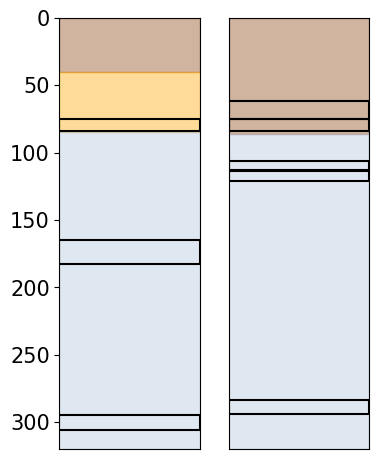

In [106]:
from matplotlib.patches import Rectangle
#add incub depths
SL1_dA_min = 75
SL1_dA_max = 84

SL1_dB_min = 165
SL1_dB_max = 183

SL1_dC_min = 295
SL1_dC_max = 306

SL4_dA_min = 62
SL4_dA_max = 75

SL4_dAA_min = 75
SL4_dAA_max = 84

SL4_dAB_min = 106
SL4_dAB_max = 113

SL4_dB_min = 114
SL4_dB_max = 121

SL4_dC_min = 284
SL4_dC_max = 294

#SL1
AL_min_SL1 = 0
AL_max_SL1 = 40
talik_min_SL1 = 40
talik_max_SL1 = 85
perma_min_SL1 = 85
perma_max_SL1 = 320

#SL4
AL_min_SL4 = 0
AL_max_SL4 = 86
perma_min_SL4 = 86
perma_max_SL4 = 320

# Set up the figure with two x-axes side-by-side, sharing y
fig, (ax1, ax2) = plt.subplots(1, 2, sharey=True, figsize=(4, 5.6), gridspec_kw={'width_ratios': [1, 1]})

# Define the break range
x1_lim = (20, 250)
x2_lim = (450, 810)


ax1.axhspan(AL_min_SL1, AL_max_SL1, color='saddlebrown', alpha=0.4)
ax1.axhspan(talik_min_SL1, talik_max_SL1, color='orange', alpha=0.4)
ax1.axhspan(perma_min_SL1, perma_max_SL1, color='lightsteelblue', alpha=0.4)

ax1.add_patch(
    Rectangle(
        (ax1.get_xlim()[0], SL1_dA_min),               # (x, y) starting point
        ax1.get_xlim()[1] - ax1.get_xlim()[0],         # width spans entire x-axis
        SL1_dA_max - SL1_dA_min,                       # height of the box
        linewidth=1.5,
        edgecolor='black',
        facecolor='none',                              # No fill
        zorder=3                                       # Put it above background
    )
)
ax1.add_patch(
    Rectangle(
        (ax1.get_xlim()[0], SL1_dB_min),               # (x, y) starting point
        ax1.get_xlim()[1] - ax1.get_xlim()[0],         # width spans entire x-axis
        SL1_dB_max - SL1_dB_min,                       # height of the box
        linewidth=1.5,
        edgecolor='black',
        facecolor='none',                              # No fill
        zorder=3                                       # Put it above background
    )
)
ax1.add_patch(
    Rectangle(
        (ax1.get_xlim()[0], SL1_dC_min),               # (x, y) starting point
        ax1.get_xlim()[1] - ax1.get_xlim()[0],         # width spans entire x-axis
        SL1_dC_max - SL1_dC_min,                       # height of the box
        linewidth=1.5,
        edgecolor='black',
        facecolor='none',                              # No fill
        zorder=3                                       # Put it above background
    )
)


ax2.axhspan(AL_min_SL4, AL_max_SL4, color='saddlebrown', alpha=0.4)
ax2.axhspan(perma_min_SL4, perma_max_SL4, color='lightsteelblue', alpha=0.4)

ax2.add_patch(
    Rectangle(
        (ax1.get_xlim()[0], SL4_dA_min),               # (x, y) starting point
        ax1.get_xlim()[1] - ax1.get_xlim()[0],         # width spans entire x-axis
        SL4_dA_max - SL4_dA_min,                       # height of the box
        linewidth=1.5,
        edgecolor='black',
        facecolor='none',                              # No fill
        zorder=3                                       # Put it above background
    )
)
ax2.add_patch(
    Rectangle(
        (ax1.get_xlim()[0], SL4_dAA_min),               # (x, y) starting point
        ax1.get_xlim()[1] - ax1.get_xlim()[0],         # width spans entire x-axis
        SL4_dAA_max - SL4_dAA_min,                       # height of the box
        linewidth=1.5,
        edgecolor='black',
        facecolor='none',                              # No fill
        zorder=3                                       # Put it above background
    )
)
ax2.add_patch(
    Rectangle(
        (ax1.get_xlim()[0], SL4_dAB_min),               # (x, y) starting point
        ax1.get_xlim()[1] - ax1.get_xlim()[0],         # width spans entire x-axis
        SL4_dAB_max - SL4_dAB_min,                       # height of the box
        linewidth=1.5,
        edgecolor='black',
        facecolor='none',                              # No fill
        zorder=3                                       # Put it above background
    )
)
ax2.add_patch(
    Rectangle(
        (ax1.get_xlim()[0], SL4_dB_min),               # (x, y) starting point
        ax1.get_xlim()[1] - ax1.get_xlim()[0],         # width spans entire x-axis
        SL4_dB_max - SL4_dB_min,                       # height of the box
        linewidth=1.5,
        edgecolor='black',
        facecolor='none',                              # No fill
        zorder=3                                       # Put it above background
    )
)
ax2.add_patch(
    Rectangle(
        (ax1.get_xlim()[0], SL4_dC_min),               # (x, y) starting point
        ax1.get_xlim()[1] - ax1.get_xlim()[0],         # width spans entire x-axis
        SL4_dC_max - SL4_dC_min,                       # height of the box
        linewidth=1.5,
        edgecolor='black',
        facecolor='none',                              # No fill
        zorder=3                                       # Put it above background
    )
)


# Hide spines between the two plots
ax1.spines['right'].set_visible(True)
ax2.spines['left'].set_visible(True)
# ax2.yaxis.tick_right()
ax2.yaxis.set_ticks_position('none')
ax2.tick_params(labelright=False)
ax1.tick_params(labelright=False)
ax1.tick_params(axis='y', labelleft=True, labelsize=15)
ax2.tick_params(axis='x', labelleft=True, labelsize=15)
# ax1.grid(True, alpha=0.5)
# ax2.grid(True, alpha=0.5)

# Add diagonal lines to indicate break
# d = 0.015  # size of diagonal lines
# kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
# ax1.plot((1 - d, 1 + d), (-d, +d), **kwargs)
# ax1.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)

# kwargs.update(transform=ax2.transAxes)
# ax2.plot((-d, +d), (-d, +d), **kwargs)
# ax2.plot((-d, +d), (1 - d, 1 + d), **kwargs)

ax1.invert_yaxis()
for ax in [ax1, ax2]:
    ax.xaxis.set_ticks_position('none')    # Show ticks on top
    ax.xaxis.set_label_position('top')    # Move label to top
    ax.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False, labeltop=False)  # Hide bottom ticks, show top
    ax.set_ylim(320, 0)

# Move x-axis label to the top (optional, set only on one axis to avoid duplication)
# ax1.set_xlabel('TOC (wt %)', labelpad=10)

plt.show()

#DIC corr graphs

In [107]:
resp_string = data['CO2 resp Hilman (micromols)'].to_string()

# print(resp_string)

In [108]:
data_slim = data[['Name', 'Days of incubation', 'pH', 'total CO2 (micromols)', 'headspace CO2 (nmols)', 'porewater_CO2 (mols)', 'mCa (mols/L)', 'porewater_Ca (mols)', 'Missing CO2', 'total CO2 new (micromols)', 'CO2 resp (micromols)', 'pCO2 (atm)', 'porewater_DIC_Hilman (mols)', 'total CO2 new Hilman (micromols)', 'porewater_Ca_Hilman (mols)','CO2 resp Hilman (micromols)']].copy()

data_slim['headspace CO2 (micromols)'] = data_slim['headspace CO2 (nmols)'] * 0.001
data_slim['porewater_CO2 (micromols)'] = data_slim['porewater_CO2 (mols)'] * 10**6
data_slim['Missing CO2 (micromols)'] = data_slim['Missing CO2'] *0.001
# data_slim['log pCO2'] = np.log10(data_slim['pCO2 (atm)'])

data_slim

,Name,Days of incubation,pH,total CO2 (micromols),headspace CO2 (nmols),porewater_CO2 (mols),mCa (mols/L),porewater_Ca (mols),Missing CO2,total CO2 new (micromols),CO2 resp (micromols),pCO2 (atm),porewater_DIC_Hilman (mols),total CO2 new Hilman (micromols),porewater_Ca_Hilman (mols),CO2 resp Hilman (micromols),headspace CO2 (micromols),porewater_CO2 (micromols),Missing CO2 (micromols)
0,SL4_d0_1,15,7.809783,0.702152,662.695983,3.945559e-08,0.000740,5.670783e-07,0.000000,1.839803,1.272725,0.001514,NaN,NaN,NaN,NaN,0.662696,0.039456,0.000000
1,SL4_d0_2,15,7.861269,0.586169,551.640102,3.452907e-08,0.000697,5.587341e-07,0.000000,1.707500,1.148766,0.001267,NaN,NaN,NaN,NaN,0.551640,0.034529,0.000000
2,SL4_d0_3,15,7.719059,0.955334,896.451990,5.888205e-08,0.000821,6.867418e-07,0.000000,2.332285,1.645543,0.002071,NaN,NaN,NaN,NaN,0.896452,0.058882,0.000000
3,SL4_d0_4,15,7.787163,0.913284,802.818469,1.104653e-07,0.001066,1.113803e-06,0.000000,3.150709,2.036906,0.001798,NaN,NaN,NaN,NaN,0.802818,0.110465,0.000000
4,SL4_d0_5,15,7.755561,1.010756,858.803701,1.519527e-07,0.001105,1.424590e-06,0.000000,3.872710,2.448120,0.002005,NaN,NaN,NaN,NaN,0.858804,0.151953,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
615,SL4_dC+dAA_1,42,7.490923,4.809627,3601.995858,6.003584e-07,0.001068,4.140807e-06,607.273258,13.104234,8.963427,0.004555,0.000001,5.214995,2.021864e-07,5.012809,3.601996,0.600358,0.607273
616,SL4_dC+dAA_2,42,7.441590,5.799065,4381.251020,6.622440e-07,0.001131,4.077178e-06,755.570227,13.965056,9.887878,0.005401,0.000001,6.232032,2.159353e-07,6.016096,4.381251,0.662244,0.755570
617,SL4_dC+dAA_3,42,7.255961,10.361829,8106.938869,1.352698e-06,0.001400,5.431425e-06,902.191863,21.236039,15.804614,0.010254,0.000002,11.275504,4.557164e-07,10.819788,8.106939,1.352698,0.902192
618,N2 blank vial,1,8.640532,0.087129,87.128766,0.000000e+00,0.000284,0.000000e+00,0.000000,0.087129,0.087129,0.000086,NaN,NaN,NaN,NaN,0.087129,0.000000,0.000000


In [109]:
data_slim['tot minus resp'] = data_slim['total CO2 new Hilman (micromols)'] - data_slim['CO2 resp Hilman (micromols)']
data_slim['tot minus resp'].mean()

# data_slim

np.float64(0.5991866951137519)

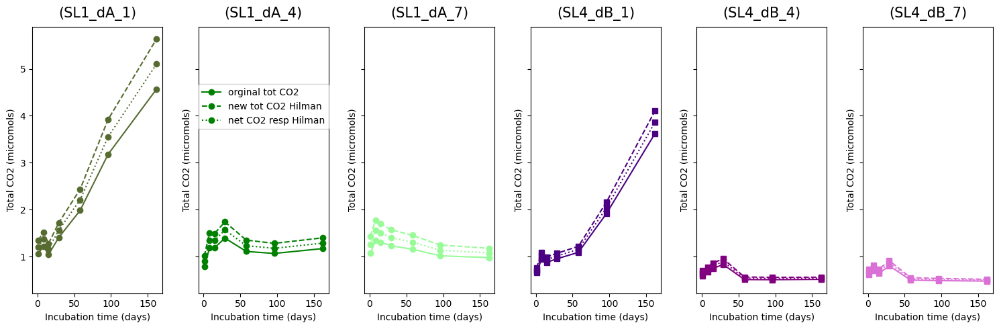

In [110]:
ending_terms = ['SL1_dA_1', 'SL1_dA_4', 'SL1_dA_7','SL4_dB_1', 'SL4_dB_4', 'SL4_dB_7']

site_color_maps = {
    'SL1_dA_1': ('darkolivegreen', 'o'),
    'SL1_dA_4': ('green', 'o'),
    'SL1_dA_7': ('palegreen', 'o'),
    'SL4_dB_1': ('indigo', 's'),
    'SL4_dB_4': ('purple', 's'),
    'SL4_dB_7': ('orchid', 's')
}

fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(15, 5), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in data_slim['Name'].unique() if name.startswith(ending_term)]

    # Create the twin axis for the current subplot
    ax = axes_groups[i]
    # ax2 = ax.twinx()
    #Iterate through filtered names and plot total CO2/gC on the secondary y-axis
    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['total CO2 (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['total CO2 (micromols)'][mask],
                     color=color, marker=marker, linestyle='-', label= 'orginal tot CO2')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['total CO2 new Hilman (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['total CO2 new Hilman (micromols)'][mask],
                     color=color, marker=marker, linestyle='--', label='new tot CO2 Hilman')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['CO2 resp Hilman (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['CO2 resp Hilman (micromols)'][mask],
                     color=color, marker=marker, linestyle=':', label='net CO2 resp Hilman')


    # for j, name in enumerate(filtered_names):
    #     subset = data_slim[data_slim['Name'] == name]

    #     color, marker = site_color_maps[ending_term]

    #     mask = ~np.isnan(subset['pH']) #No error bars, add if needed
    #     ax.plot(subset['Days of incubation'][mask], subset['pH'][mask],
    #                  color=color, marker=marker, linestyle='-.', label='pH')

    # for j, name in enumerate(filtered_names):
    #     subset = data_slim[data_slim['Name'] == name]

    #     color, marker = site_color_maps[ending_term]

    #     mask = ~np.isnan(subset['Missing CO2 (micromols)']) #No error bars, add if needed
    #     ax.plot(subset['Days of incubation'][mask], subset['Missing CO2 (micromols)'][mask],
    #                  color=color, marker=marker, linestyle='-.')

    ax.set_xlabel('Incubation time (days)')
    ax.set_ylabel('Total CO2 (micromols)')
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

# handles, labels = plt.gca().get_legend_handles_labels()

#    # Create a new list of handles with only the linestyle
# new_handles = handles  # Assuming handles are Line2D objects

#    # Update the legend with the new handles
# plt.legend(new_handles, labels)

    # ax.set_xlim(80, 95)
    # ax.set_ylim(3,3.2)
    if ax == axes_groups[1]:
      ax.legend(loc='center', bbox_to_anchor=(0.5, 0.7))
plt.tight_layout()

# Show the plot
plt.show()

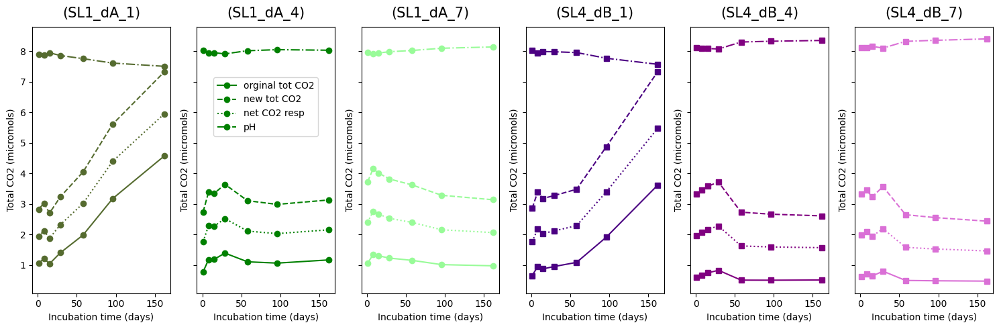

In [111]:
ending_terms = ['SL1_dA_1', 'SL1_dA_4', 'SL1_dA_7','SL4_dB_1', 'SL4_dB_4', 'SL4_dB_7']

site_color_maps = {
    'SL1_dA_1': ('darkolivegreen', 'o'),
    'SL1_dA_4': ('green', 'o'),
    'SL1_dA_7': ('palegreen', 'o'),
    'SL4_dB_1': ('indigo', 's'),
    'SL4_dB_4': ('purple', 's'),
    'SL4_dB_7': ('orchid', 's')
}

fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(15, 5), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in data_slim['Name'].unique() if name.startswith(ending_term)]

    # Create the twin axis for the current subplot
    ax = axes_groups[i]
    # ax2 = ax.twinx()
    #Iterate through filtered names and plot total CO2/gC on the secondary y-axis
    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['total CO2 (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['total CO2 (micromols)'][mask],
                     color=color, marker=marker, linestyle='-', label= 'orginal tot CO2')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['total CO2 new (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['total CO2 new (micromols)'][mask],
                     color=color, marker=marker, linestyle='--', label='new tot CO2')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['CO2 resp (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['CO2 resp (micromols)'][mask],
                     color=color, marker=marker, linestyle=':', label='net CO2 resp')


    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['pH']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['pH'][mask],
                     color=color, marker=marker, linestyle='-.', label='pH')

    # for j, name in enumerate(filtered_names):
    #     subset = data_slim[data_slim['Name'] == name]

    #     color, marker = site_color_maps[ending_term]

    #     mask = ~np.isnan(subset['Missing CO2 (micromols)']) #No error bars, add if needed
    #     ax.plot(subset['Days of incubation'][mask], subset['Missing CO2 (micromols)'][mask],
    #                  color=color, marker=marker, linestyle='-.')

    ax.set_xlabel('Incubation time (days)')
    ax.set_ylabel('Total CO2 (micromols)')
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

# handles, labels = plt.gca().get_legend_handles_labels()

#    # Create a new list of handles with only the linestyle
# new_handles = handles  # Assuming handles are Line2D objects

#    # Update the legend with the new handles
# plt.legend(new_handles, labels)

    # ax2.set_ylim(0, 0.1)
    # ax.set_ylim(1,1.25)
    if ax == axes_groups[1]:
      ax.legend(loc='center', bbox_to_anchor=(0.5, 0.7))
plt.tight_layout()

# Show the plot
plt.show()

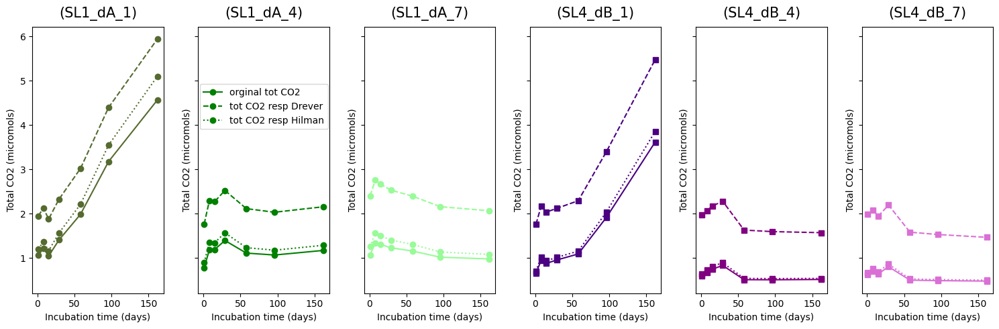

In [112]:
#Hilman v Drever
ending_terms = ['SL1_dA_1', 'SL1_dA_4', 'SL1_dA_7','SL4_dB_1', 'SL4_dB_4', 'SL4_dB_7']

site_color_maps = {
    'SL1_dA_1': ('darkolivegreen', 'o'),
    'SL1_dA_4': ('green', 'o'),
    'SL1_dA_7': ('palegreen', 'o'),
    'SL4_dB_1': ('indigo', 's'),
    'SL4_dB_4': ('purple', 's'),
    'SL4_dB_7': ('orchid', 's')
}

fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(15, 5), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in data_slim['Name'].unique() if name.startswith(ending_term)]

    # Create the twin axis for the current subplot
    ax = axes_groups[i]
    # ax2 = ax.twinx()
    #Iterate through filtered names and plot total CO2/gC on the secondary y-axis
    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['total CO2 (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['total CO2 (micromols)'][mask],
                     color=color, marker=marker, linestyle='-', label= 'orginal tot CO2')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['CO2 resp (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['CO2 resp (micromols)'][mask],
                     color=color, marker=marker, linestyle='--', label='tot CO2 resp Drever')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['CO2 resp Hilman (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['CO2 resp Hilman (micromols)'][mask],
                     color=color, marker=marker, linestyle=':', label='tot CO2 resp Hilman')


    # for j, name in enumerate(filtered_names):
    #     subset = data_slim[data_slim['Name'] == name]

    #     color, marker = site_color_maps[ending_term]

    #     mask = ~np.isnan(subset['pH']) #No error bars, add if needed
    #     ax.plot(subset['Days of incubation'][mask], subset['pH'][mask],
    #                  color=color, marker=marker, linestyle='-.', label='pH')

    # for j, name in enumerate(filtered_names):
    #     subset = data_slim[data_slim['Name'] == name]

    #     color, marker = site_color_maps[ending_term]

    #     mask = ~np.isnan(subset['Missing CO2 (micromols)']) #No error bars, add if needed
    #     ax.plot(subset['Days of incubation'][mask], subset['Missing CO2 (micromols)'][mask],
    #                  color=color, marker=marker, linestyle='-.')

    ax.set_xlabel('Incubation time (days)')
    ax.set_ylabel('Total CO2 (micromols)')
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

# handles, labels = plt.gca().get_legend_handles_labels()

#    # Create a new list of handles with only the linestyle
# new_handles = handles  # Assuming handles are Line2D objects

#    # Update the legend with the new handles
# plt.legend(new_handles, labels)

    # ax2.set_ylim(0, 0.1)
    # ax.set_ylim(0,9)
    if ax == axes_groups[1]:
      ax.legend(loc='center', bbox_to_anchor=(0.5, 0.7))
plt.tight_layout()

# Show the plot
plt.show()

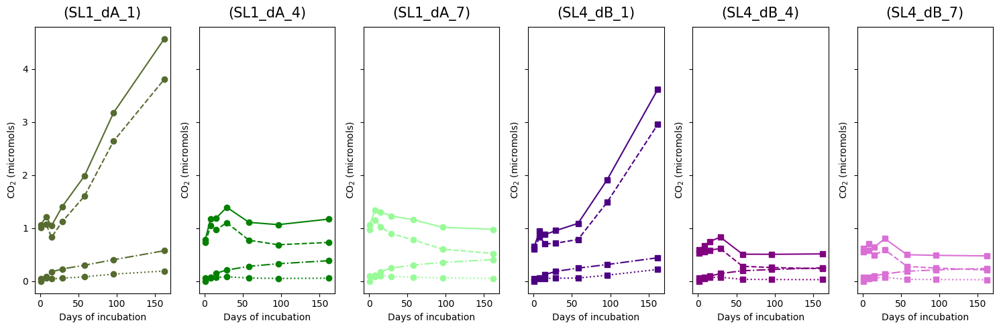

In [113]:
#plot unaveraged headspace (nmols) and tot CO2 (nmols) vs incubation time

ending_terms = ['SL1_dA_1', 'SL1_dA_4', 'SL1_dA_7','SL4_dB_1', 'SL4_dB_4', 'SL4_dB_7']

site_color_maps = {
    'SL1_dA_1': ('darkolivegreen', 'o'),
    'SL1_dA_4': ('green', 'o'),
    'SL1_dA_7': ('palegreen', 'o'),
    'SL4_dB_1': ('indigo', 's'),
    'SL4_dB_4': ('purple', 's'),
    'SL4_dB_7': ('orchid', 's')
}

fig, axes_groups = plt.subplots(1,len(ending_terms), figsize=(15, 5), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in data_slim['Name'].unique() if name.startswith(ending_term)]

    # Create the twin axis for the current subplot
    ax = axes_groups[i]

    # Iterate through filtered names and plot total CO2/gC on the secondary y-axis
    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['total CO2 (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['total CO2 (micromols)'][mask],
                     color=color, marker=marker, linestyle='-')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['headspace CO2 (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['headspace CO2 (micromols)'][mask],
                     color=color, marker=marker, linestyle='--')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['porewater_CO2 (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['porewater_CO2 (micromols)'][mask],
                     color=color, marker=marker, linestyle=':')

    for j, name in enumerate(filtered_names):
        subset = data_slim[data_slim['Name'] == name]

        color, marker = site_color_maps[ending_term]

        mask = ~np.isnan(subset['Missing CO2 (micromols)']) #No error bars, add if needed
        ax.plot(subset['Days of incubation'][mask], subset['Missing CO2 (micromols)'][mask],
                     color=color, marker=marker, linestyle='-.')

    ax.set_xlabel('Days of incubation')
    ax.set_ylabel('CO$_{2}$ (micromols)')
    ax.set_title(f'({ending_term})', fontsize=15, pad=10)

plt.tight_layout()

# Show the plot
plt.show()


<>:107: SyntaxWarning: invalid escape sequence '\d'
<>:112: SyntaxWarning: invalid escape sequence '\d'
<>:160: SyntaxWarning: invalid escape sequence '\d'
<>:163: SyntaxWarning: invalid escape sequence '\d'
<>:107: SyntaxWarning: invalid escape sequence '\d'
<>:112: SyntaxWarning: invalid escape sequence '\d'
<>:160: SyntaxWarning: invalid escape sequence '\d'
<>:163: SyntaxWarning: invalid escape sequence '\d'
/tmp/ipython-input-1340163738.py:107: SyntaxWarning: invalid escape sequence '\d'
  ax.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=20)
/tmp/ipython-input-1340163738.py:112: SyntaxWarning: invalid escape sequence '\d'
  ax.set_ylabel('$\delta$$^{13}$C', color='black', labelpad=5, fontsize=20)
/tmp/ipython-input-1340163738.py:160: SyntaxWarning: invalid escape sequence '\d'
  ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)
/tmp/ipython-input-1340163738.py:163: SyntaxWarning: invalid escape sequence '\d'
  ax2.set_ylabel('$\

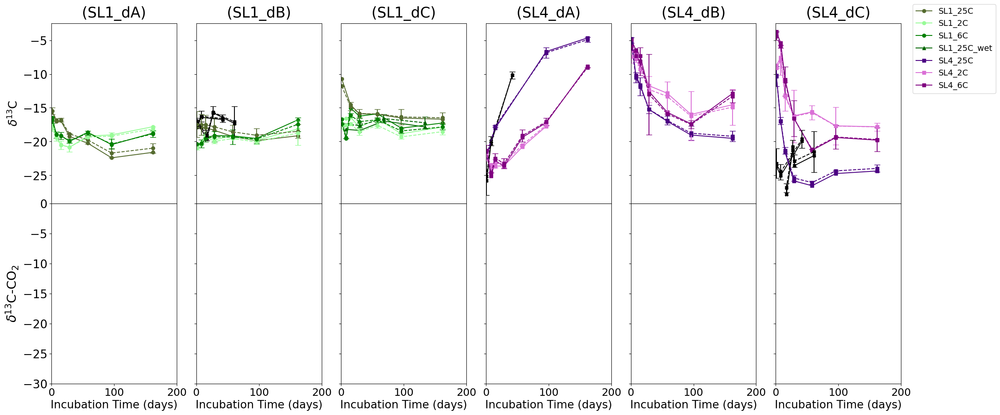

In [114]:
#per and post DIC and cal corrected d13C CO2 values
# Define the ending terms you want to filter by
ending_terms = ['SL1_dA', 'SL1_dB', 'SL1_dC','SL4_dA', 'SL4_dB', 'SL4_dC']

# Create a figure and subplots
fig, axes_groups = plt.subplots(2,len(ending_terms), figsize=(22, 10), sharex='row', sharey='row', gridspec_kw={'height_ratios': [1, 1],
                                            'hspace': 0}) #, squeeze=False)  # 1 row, 3 columns
fig.subplots_adjust(hspace=0.4)

#axes= axes_groups.flatten()

# Define colors and markers (same as before)
colors = ['darkolivegreen', 'green', 'palegreen', 'indigo', 'purple', 'orchid', 'darkgreen'] #'darkolivegreen', 'green', 'palegreen',
markers = ['o', 'o', 'o', 's', '^', 's', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL1_dC_25C_wet': (colors[6], markers[4]),
    },
    'SL4_dA': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    }
}

#also define labels
labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

#define d13C colors
iso_colors = ['royalblue', 'cornflowerblue', 'lightsteelblue']

#define colors for parent d13C
SL1_parent_color = 'darkgreen'
SL4_parent_color = 'indigo'
# Define a dictionary to map parent d13C labels to colors:
parent_labels = {'darkolivegreen': 'SL1 parent Corg d13C', 'indigo': 'SL4 parent Corg d13C'}

# subplot_order = [0,1,2,3,4,5,6,7,8,9,10,11]

# Iterate through ending terms and create subplots
for i, ending_term in enumerate(ending_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in final_pure_d13C_CO2['Name'].unique() if name.startswith(ending_term)]

    # Calculate the row and column index for the current subplot
    #row = i // 3  # Integer division to get the row index
    #col = i % 3   # Modulo to get the column index

    # Get the individual subplot Axes object
    #ax = axes[row, col]  # Accessing the subplot using row and column indices

    # Create the twin axis for the current subplot
    #x2 = ax.twinx()
    ax = axes_groups[0,i]
    ax2 = axes_groups[1,i]
    # ax2 = ax.twinx()


    # Iterate through filtered names and plot total CO2/gC on the secondary y-axis
    for j, name in enumerate(filtered_names):
        subset = final_pure_d13C_CO2[final_pure_d13C_CO2['Name'] == name]

        color, marker = site_color_maps[ending_term].get(name, ('black', markers[7]))

        mask = ~np.isnan(subset['d13C-CO2']) #No error bars, add if needed
        ax.plot(subset['incubation time'][mask], subset['d13C-CO2'][mask],
                     label=labels.get(color),
                     color=color, marker=marker, linestyle='-')
                 # Using linestyle='--' to differentiate from the primary y-axis

        if name.startswith('SL1'):
            xline_color = SL1_parent_color
        elif name.startswith('SL4'):
            xline_color = SL4_parent_color
        else:
            xline_color = 'black'

        #current_label = parent_labels.get(hline_color)

    # Set labels for the secondary y-axis
    ax.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=20)
    # ax.set_ylim(0,20)
    ax.set_xlim(0,200)

    if i == 0:
      ax.set_ylabel('$\delta$$^{13}$C', color='black', labelpad=5, fontsize=20)
    else:
      ax.set_ylabel('')

    ax.tick_params(axis='y', labelcolor='black', labelsize=20)
    # ax.legend()

    # Iterate through filtered names and plot on the current subplot
    for j, name in enumerate(filtered_names):
        subset = sorted_df_d13C_CO2[sorted_df_d13C_CO2['Name'] == name]
        #subset = subset.dropna(subset=['SE d13C-CO2'])
        subset['SE d13C-CO2'] = subset['SE d13C-CO2'].fillna(0)
        mask = ~np.isnan(subset['d13C-CO2']) #& ~np.isnan(subset['SE d13C-CO2'])
        color, marker = site_color_maps[ending_term].get(name, ('black', markers[7]))
        if not subset.empty:
          ax.errorbar(subset['incubation time'][mask], subset['d13C-CO2'][mask],
                            yerr=subset['SE d13C-CO2'][mask],
                            color=color, marker=marker, label=labels.get(color),
                            ecolor=color, capsize=5, linestyle='--')
        # Select color and label for hlines:
        #current_color = parent_colors[j % len(parent_colors)]
        #current_label = parent_labels.get(current_color)  # Get label from dictionary


        # parent_d13C_value = subset['parent d13C'].iloc[0]

        # if name.startswith('SL1'):
        #     hline_color = 'slategray'
        #     hline_artist = ax2.axhline(y=parent_d13C_value, xmin=0, xmax=60, color=hline_color, linestyle='dashed', label='SL1 C$_o$$_r$$_g$ $\delta$$^{13}$C')
        # elif name.startswith('SL4'):
        #     hline_color = 'slategray'
        #     hline_artist = ax2.axhline(y=parent_d13C_value, xmin=0, xmax=60, color=hline_color, linestyle='dashed', label='SL4 C$_o$$_r$$_g$ $\delta$$^{13}$C')
        # else:
        #     hline_color = 'black'

        # current_label = parent_labels.get(hline_color)  # Get label from dictionary

        # Only add label if it's not already in the legend:
        # if current_label not in [h.get_label() for h in ax.get_legend_handles_labels()[0]]:
        #     ax2.hlines(y=subset['parent d13C'], xmin=0, xmax=60, color=hline_color, linestyles='dashed', label=current_label)

        #axes[i].hlines(y=subset['parent d13C'], xmin=0, xmax=30, color=parent_colors[j % len(parent_colors)], linestyles='dashed', label=name.replace(ending_term, '').strip())  #subset['plotting Name'].iloc[0]

    # Set subplot title and labels
    ax2.set_xlabel('Incubation Time (days)', fontsize=19)
    ax.tick_params(axis='x', labelsize=18)
    ax2.tick_params(axis='x', labelsize=18)
    ax2.tick_params(axis='y', labelsize=20, labelcolor='black')
    ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=10)

    if i == 0:
      ax2.set_ylabel('$\delta$$^{13}$C-CO$_{2}$', color='black', fontsize=22, labelpad=5)

    else:
      ax2.set_ylabel('')

    #ax2.grid(True)
    ax2.set_ylim(-30, 0)
    ax2.set_xlim(0, 200)
    # ax2.legend()
    # ax2.yaxis.tick_right()
    # ax2.yaxis.set_label_position("right")
    ax.set_xticks([])
    ax.set_title(f'({ending_term})', fontsize=25, pad=10)

handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.09, 1), ncol=1, fontsize=14)


plt.tight_layout()

# Show the plot
plt.show()

#Rates over time

In [115]:
#rates between each sampling time interval

keep_name = 'SL4_dA_25C'
C_DOC_rates['CO2 rate (micromols/mgC/day) 15-58'] = C_DOC_rates['CO2 rate (micromols/mgC/day) 15-58'].astype(float)
C_DOC_rates.loc[
    (C_DOC_rates['Name'] != keep_name) & np.isfinite(C_DOC_rates['CO2 rate (micromols/mgC/day) 15-58']),
    'CO2 rate (micromols/mgC/day) 15-58',
] = np.nan

C_DOC_rates_CH4['CH4 rate (micromols/mgC/day) 15-58'] = C_DOC_rates_CH4['CH4 rate (micromols/mgC/day) 15-58'].astype(float)
C_DOC_rates_CH4.loc[
    (C_DOC_rates_CH4['Name'] != keep_name) & np.isfinite(C_DOC_rates_CH4['CH4 rate (micromols/mgC/day) 15-58']),
    'CH4 rate (micromols/mgC/day) 15-58',
] = np.nan

CO2_DW_rates['CO2 rate (micromols/g/day) 15-58'] = CO2_DW_rates['CO2 rate (micromols/g/day) 15-58'].astype(float)
CO2_DW_rates.loc[
    (CO2_DW_rates['Name'] != keep_name) & np.isfinite(CO2_DW_rates['CO2 rate (micromols/g/day) 15-58']),
    'CO2 rate (micromols/g/day) 15-58',
] = np.nan

# sorted_df_CH4
C_DOC_rates
CO2_DW_rates

,Name,incubation time,total CO2/g,std CO2/g,SE CO2/g,CO2 rate (micromols/g/day) 1-8,CO2 rate (micromols/g/day) 8-15,CO2 rate (micromols/g/day) 15-29,CO2 rate (micromols/g/day) 15_35,CO2 rate (micromols/g/day) 35_59,CO2 rate (micromols/g/day) 59_88,CO2 rate (micromols/g/day) 88_161,CO2 rate (micromols/g/day) 96_162,CO2 rate (micromols/g/day) 29-58,CO2 rate (micromols/g/day) 8-30,CO2 rate (micromols/g/day) 58-96,CO2 rate (micromols/g/day) 30-68,CO2 rate (micromols/g/day) 68-134,CO2 rate (micromols/g/day) 15-58
0,BTL_dA_25C,1,0.929298,0.352684,0.203622,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BTL_dA_25C,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BTL_dA_25C,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,BTL_dA_25C,15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BTL_dA_25C,17,3.400380,1.640897,0.947373,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
736,SL4_dC_inoc_25C,88,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
737,SL4_dC_inoc_25C,96,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
738,SL4_dC_inoc_25C,134,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
739,SL4_dC_inoc_25C,161,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [116]:
# CO2_rate = sorted_df[['Name', 'CO2 rate (micromols/gC/day) 1-8', 'CO2 rate (micromols/gC/day) 8-15', 'CO2 rate (micromols/gC/day) 15-29', 'CO2 rate (micromols/gC/day) 29-58',
#                       'CO2 rate (micromols/gC/day) 15-58', 'CO2 rate (micromols/gC/day) 8-30', 'CO2 rate (micromols/gC/day) 30-68', 'CO2 rate (micromols/gC/day) 58-96']]#, 'CO2 rate (micromols/gC/day) 15_35', 'CO2 rate (micromols/gC/day) 35_59', 'CO2 rate (micromols/gC/day) 59_88', 'CO2 rate (micromols/gC/day) 88_161']]

C_DOC_rates_slim = C_DOC_rates[['Name', 'CO2 rate (micromols/mgC/day) 1-8', 'CO2 rate (micromols/mgC/day) 8-15', 'CO2 rate (micromols/mgC/day) 15-29',
                                'CO2 rate (micromols/mgC/day) 29-58',
                                'CO2 rate (micromols/mgC/day) 15-58', 'CO2 rate (micromols/mgC/day) 8-30', 'CO2 rate (micromols/mgC/day) 30-68',
                                'CO2 rate (micromols/mgC/day) 58-96', 'CO2 rate (micromols/mgC/day) 96_162', 'CO2 rate (micromols/mgC/day) 68-134']]

# Remove duplicate names, keeping the first occurrence
# filtered_CO2_rate = CO2_rate.drop_duplicates(subset=['Name'], keep='first')
filtered_C_DOC_rates = C_DOC_rates_slim.drop_duplicates(subset=['Name'], keep='first')

CO2_DW_rates_slim = CO2_DW_rates[['Name', 'CO2 rate (micromols/g/day) 1-8', 'CO2 rate (micromols/g/day) 8-15', 'CO2 rate (micromols/g/day) 15-29',
                                'CO2 rate (micromols/g/day) 29-58',
                                'CO2 rate (micromols/g/day) 15-58', 'CO2 rate (micromols/g/day) 8-30', 'CO2 rate (micromols/g/day) 30-68',
                                'CO2 rate (micromols/g/day) 58-96', 'CO2 rate (micromols/g/day) 96_162', 'CO2 rate (micromols/g/day) 68-134']]

filtered_CO2_DW_rates = CO2_DW_rates_slim.drop_duplicates(subset=['Name'], keep='first')

C_DOC_rates_melted = pd.melt(
    filtered_C_DOC_rates,
    id_vars=['Name'],
    value_vars=['CO2 rate (micromols/mgC/day) 1-8', 'CO2 rate (micromols/mgC/day) 8-15', 'CO2 rate (micromols/mgC/day) 15-29',
                                'CO2 rate (micromols/mgC/day) 29-58',
                                'CO2 rate (micromols/mgC/day) 15-58', 'CO2 rate (micromols/mgC/day) 8-30', 'CO2 rate (micromols/mgC/day) 30-68',
                                'CO2 rate (micromols/mgC/day) 58-96', 'CO2 rate (micromols/mgC/day) 96_162', 'CO2 rate (micromols/mgC/day) 68-134'],
    var_name='Incubation Period',
    value_name='CO2 rate (micromols/mgC/day)'
)
#C_DOC_rates_melted['incubation time'] = C_DOC_rates_melted['Incubation Period'].str.extract('(\d+)-\d+').astype(float).fillna(-1).astype(int)

C_DOC_rates_melted[['start_day', 'end_day']] = C_DOC_rates_melted['Incubation Period'].str.extract(r'(\d+)[-_](\d+)').astype(float)
C_DOC_rates_melted = C_DOC_rates_melted.drop(columns=['Incubation Period'])

CO2_DW_rates_melted = pd.melt(
    filtered_CO2_DW_rates,
    id_vars=['Name'],
    value_vars=['CO2 rate (micromols/g/day) 1-8', 'CO2 rate (micromols/g/day) 8-15', 'CO2 rate (micromols/g/day) 15-29',
                                'CO2 rate (micromols/g/day) 29-58',
                                'CO2 rate (micromols/g/day) 15-58', 'CO2 rate (micromols/g/day) 8-30', 'CO2 rate (micromols/g/day) 30-68',
                                'CO2 rate (micromols/g/day) 58-96', 'CO2 rate (micromols/g/day) 96_162', 'CO2 rate (micromols/g/day) 68-134'],
    var_name='Incubation Period',
    value_name='CO2 rate (micromols/g/day)'
)
CO2_DW_rates_melted[['start_day', 'end_day']] = CO2_DW_rates_melted['Incubation Period'].str.extract(r'(\d+)[-_](\d+)').astype(float)
CO2_DW_rates_melted = CO2_DW_rates_melted.drop(columns=['Incubation Period'])

# Display the final DataFrame
# CO2_rate_melted
C_DOC_rates_melted
CO2_DW_rates_melted

,Name,CO2 rate (micromols/g/day),start_day,end_day
0,BTL_dA_25C,NaN,1.0,8.0
1,BTL_dA_6C,NaN,1.0,8.0
2,BTL_dB_25C,NaN,1.0,8.0
3,BTL_dB_6C,NaN,1.0,8.0
4,BTL_dC_25C,NaN,1.0,8.0
...,...,...,...,...
385,SL4_dC+dAA_25C,NaN,68.0,134.0
386,SL4_dC_25C,NaN,68.0,134.0
387,SL4_dC_2C,NaN,68.0,134.0
388,SL4_dC_6C,NaN,68.0,134.0


In [117]:
# CO2_rate = sorted_df[['Name', 'CO2 rate (micromols/gC/day) 1-8', 'CO2 rate (micromols/gC/day) 8-15', 'CO2 rate (micromols/gC/day) 15-29', 'CO2 rate (micromols/gC/day) 29-58',
#                       'CO2 rate (micromols/gC/day) 15-58', 'CO2 rate (micromols/gC/day) 8-30', 'CO2 rate (micromols/gC/day) 30-68', 'CO2 rate (micromols/gC/day) 58-96']]#, 'CO2 rate (micromols/gC/day) 15_35', 'CO2 rate (micromols/gC/day) 35_59', 'CO2 rate (micromols/gC/day) 59_88', 'CO2 rate (micromols/gC/day) 88_161']]

C_DOC_rates_slim_CH4 = C_DOC_rates[['Name', 'CO2 rate (micromols/mgC/day) 1-8', 'CO2 rate (micromols/mgC/day) 8-15', 'CO2 rate (micromols/mgC/day) 15-29',
                                'CO2 rate (micromols/mgC/day) 29-58',
                                'CO2 rate (micromols/mgC/day) 15-58', 'CO2 rate (micromols/mgC/day) 8-30', 'CO2 rate (micromols/mgC/day) 30-68',
                                'CO2 rate (micromols/mgC/day) 58-96', 'CO2 rate (micromols/mgC/day) 96_162', 'CO2 rate (micromols/mgC/day) 68-134']]

# Remove duplicate names, keeping the first occurrence
# filtered_CO2_rate = CO2_rate.drop_duplicates(subset=['Name'], keep='first')
filtered_C_DOC_rates = C_DOC_rates_slim.drop_duplicates(subset=['Name'], keep='first')

# names_keep = ['SL4_dA_25C']

# Display the filtered DataFrame
# filtered_CO2_rate

# Melt the DataFrame to combine CO2 rate columns
# CO2_rate_melted = pd.melt(
#     filtered_CO2_rate,
#     id_vars=['Name'],
#     value_vars=['CO2 rate (micromols/gC/day) 1-8', 'CO2 rate (micromols/gC/day) 8-15', 'CO2 rate (micromols/gC/day) 15-29', 'CO2 rate (micromols/gC/day) 29-58',
#                 'CO2 rate (micromols/gC/day) 15-58', 'CO2 rate (micromols/gC/day) 8-30', 'CO2 rate (micromols/gC/day) 30-68', 'CO2 rate (micromols/gC/day) 58-96'],
#     var_name='Incubation Period',
#     value_name='CO2 rate (micromols/gC/day)'
# )

# # Extract incubation days from 'Incubation Period' column
# CO2_rate_melted['incubation time'] = CO2_rate_melted['Incubation Period'].str.extract('(\d+)-\d+').astype(int)
# Replace NaN with specific value or remove rows
# CO2_rate_melted['incubation time'] = CO2_rate_melted['incubation time'].fillna(-1).astype(int) # Replace NaN with -1 or desired value before converting to int

C_DOC_rates_melted = pd.melt(
    filtered_C_DOC_rates,
    id_vars=['Name'],
    value_vars=['CO2 rate (micromols/mgC/day) 1-8', 'CO2 rate (micromols/mgC/day) 8-15', 'CO2 rate (micromols/mgC/day) 15-29',
                                'CO2 rate (micromols/mgC/day) 29-58',
                                'CO2 rate (micromols/mgC/day) 15-58', 'CO2 rate (micromols/mgC/day) 8-30', 'CO2 rate (micromols/mgC/day) 30-68',
                                'CO2 rate (micromols/mgC/day) 58-96', 'CO2 rate (micromols/mgC/day) 96_162', 'CO2 rate (micromols/mgC/day) 68-134'],
    var_name='Incubation Period',
    value_name='CO2 rate (micromols/mgC/day)'
)
#C_DOC_rates_melted['incubation time'] = C_DOC_rates_melted['Incubation Period'].str.extract('(\d+)-\d+').astype(float).fillna(-1).astype(int)

C_DOC_rates_melted[['start_day', 'end_day']] = C_DOC_rates_melted['Incubation Period'].str.extract(r'(\d+)[-_](\d+)').astype(float)
C_DOC_rates_melted = C_DOC_rates_melted.drop(columns=['Incubation Period'])


C_DOC_rates_melted

,Name,CO2 rate (micromols/mgC/day),start_day,end_day
0,BTL_dA_25C,NaN,1.0,8.0
1,BTL_dA_6C,NaN,1.0,8.0
2,BTL_dB_25C,NaN,1.0,8.0
3,BTL_dB_6C,NaN,1.0,8.0
4,BTL_dC_25C,NaN,1.0,8.0
...,...,...,...,...
385,SL4_dC+dAA_25C,NaN,68.0,134.0
386,SL4_dC_25C,NaN,68.0,134.0
387,SL4_dC_2C,NaN,68.0,134.0
388,SL4_dC_6C,NaN,68.0,134.0


In [118]:
C_DOC_rates_melted

,Name,CO2 rate (micromols/mgC/day),start_day,end_day
0,BTL_dA_25C,NaN,1.0,8.0
1,BTL_dA_6C,NaN,1.0,8.0
2,BTL_dB_25C,NaN,1.0,8.0
3,BTL_dB_6C,NaN,1.0,8.0
4,BTL_dC_25C,NaN,1.0,8.0
...,...,...,...,...
385,SL4_dC+dAA_25C,NaN,68.0,134.0
386,SL4_dC_25C,NaN,68.0,134.0
387,SL4_dC_2C,NaN,68.0,134.0
388,SL4_dC_6C,NaN,68.0,134.0


In [119]:
CH4_rate = sorted_df_CH4[['Name', 'CH4 rate (micromols/gC/day) 1-8', 'CH4 rate (micromols/gC/day) 8-15', 'CH4 rate (micromols/gC/day) 15-29', 'CH4 rate (micromols/gC/day) 29-58',
                      'CH4 rate (micromols/gC/day) 15-58', 'CH4 rate (micromols/gC/day) 58-96']]#, 'CO2 rate (micromols/gC/day) 15_35', 'CO2 rate (micromols/gC/day) 35_59', 'CO2 rate (micromols/gC/day) 59_88', 'CO2 rate (micromols/gC/day) 88_161']]

# Remove duplicate names, keeping the first occurrence
filtered_CH4_rate = CH4_rate.drop_duplicates(subset=['Name'], keep='first')

# names_keep = ['SL4_dA_25C']

# Display the filtered DataFrame
filtered_CH4_rate

# Melt the DataFrame to combine CH4 rate columns
CH4_rate_melted = pd.melt(
    filtered_CH4_rate,
    id_vars=['Name'],
    value_vars=['CH4 rate (micromols/gC/day) 1-8', 'CH4 rate (micromols/gC/day) 8-15', 'CH4 rate (micromols/gC/day) 15-29', 'CH4 rate (micromols/gC/day) 29-58',
                      'CH4 rate (micromols/gC/day) 15-58', 'CH4 rate (micromols/gC/day) 58-96'],
    var_name='Incubation Period',
    value_name='CH4 rate (micromols/gC/day)'
)

# Extract incubation days from 'Incubation Period' column
# CH4_rate_melted['incubation time'] = CH4_rate_melted['Incubation Period'].str.extract('(\d+)-\d+').astype(int)
CH4_rate_melted[['start_day', 'end_day']] = CH4_rate_melted['Incubation Period'].str.extract(r'(\d+)[-_](\d+)').astype(float)
CH4_rate_melted = CH4_rate_melted.drop(columns=['Incubation Period'])

# Replace NaN with specific value or remove rows
# CO2_rate_melted['incubation time'] = CH4_rate_melted['incubation time'].fillna(-1).astype(int) # Replace NaN with -1 or desired value before converting to int


# Replace incubation days for 8-15 period with 15
# CH4_rate_melted.loc[CH4_rate_melted['Incubation Period'] == 'CH4 rate (micromols/gC/day) 58-96', 'incubation time'] = 96
# CH4_rate_melted.loc[CH4_rate_melted['Incubation Period'] == 'CH4 rate (micromols/gC/day) 15-58', 'incubation time'] = 58.01
# CH4_rate_melted.loc[CH4_rate_melted['Incubation Period'] == 'CH4 rate (micromols/gC/day) 29-58', 'incubation time'] = 58
# CH4_rate_melted.loc[CH4_rate_melted['Incubation Period'] == 'CH4 rate (micromols/gC/day) 15-29', 'incubation time'] = 29
# CH4_rate_melted.loc[CH4_rate_melted['Incubation Period'] == 'CH4 rate (micromols/gC/day) 8-15', 'incubation time'] = 15
# CH4_rate_melted.loc[CH4_rate_melted['Incubation Period'] == 'CH4 rate (micromols/gC/day) 1-8', 'incubation time'] = 8

# CH4_rate_melted.loc[CH4_rate_melted['Incubation Period'] == 'CH4 rate (micromols/gC/day) 8-30', 'incubation time'] = 30
# CH4_rate_melted.loc[CH4_rate_melted['Incubation Period'] == 'CH4 rate (micromols/gC/day) 30-68', 'incubation time'] = 68

# CH4_rate_melted = CH4_rate_melted[
#     (CH4_rate_melted['incubation time'] >= 15) & (CH4_rate_melted['incubation time'] <= 58) & (CH4_rate_melted['Name'].isin(names_keep))
# ]

# Drop the 'Incubation Period' column
# CH4_rate_melted = CH4_rate_melted.drop(columns=['Incubation Period'])

# Display the final DataFrame
CH4_rate_melted

,Name,CH4 rate (micromols/gC/day),start_day,end_day
0,SL1_d0_25C,NaN,1.0,8.0
1,SL1_d0_6C,NaN,1.0,8.0
2,SL1_dA_25C,NaN,1.0,8.0
3,SL1_dA_6C,NaN,1.0,8.0
4,SL1_dA_2C,NaN,1.0,8.0
...,...,...,...,...
169,SL4_dAA_25C,NaN,58.0,96.0
170,SL1_dB_inoc_25C,NaN,58.0,96.0
171,SL4_dC_inoc_25C,NaN,58.0,96.0
172,SL1_dB+dAA_25C,NaN,58.0,96.0


In [120]:
new_CO2_rate = sorted_df[['Name', 'incubation time', 'total CO2/gC']].copy()

new_CO2_rate['CO2 rate (micromols/gC/day)'] = new_CO2_rate['total CO2/gC'] / new_CO2_rate['incubation time']

new_CO2_rate

,Name,incubation time,total CO2/gC,CO2 rate (micromols/gC/day)
0,SL1_d0_25C,1,NaN,NaN
1,SL1_d0_25C,8,NaN,NaN
2,SL1_d0_25C,15,140.962744,9.397516
3,SL1_d0_25C,29,NaN,NaN
4,SL1_d0_25C,30,NaN,NaN
...,...,...,...,...
619,NaN,162,NaN,NaN
620,NaN,162,NaN,NaN
621,NaN,162,NaN,NaN
622,NaN,162,NaN,NaN


<>:69: SyntaxWarning: invalid escape sequence '\m'
<>:69: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-3160213533.py:69: SyntaxWarning: invalid escape sequence '\m'
  axes[0].set_ylabel('CO$_2$ Rate ($\mu$mols/gDW/day)', fontsize=20)


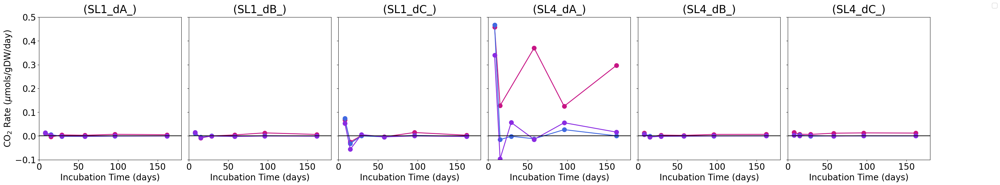

In [121]:
# Define the ending terms you want to filter by
site_terms = ['SL1_dA_', 'SL1_dB_', 'SL1_dC_','SL4_dA_', 'SL4_dB_', 'SL4_dC_' ]


# Create a figure and subplots
fig, axes = plt.subplots(1, 6, figsize=(30, 6), gridspec_kw={
                                            'hspace': 0})  # 1 row, 3 columns

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue'] #, 'indigo', 'purple', 'orchid']
markers = ['o', 'o', 'o', 'o', 'o', 'o', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA_': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB_': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC_': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
    },
    'SL4_dA_': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB_': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC_': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    }
}

labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

# Iterate through ending terms and create subplots
for i, site_term in enumerate(site_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in CO2_DW_rates_melted['Name'].unique()
    if site_term in name and 'wet' not in name and 'inoc' not in name and '+' not in name]

    # Iterate through filtered names and plot on the current subplot
    for j, name in enumerate(filtered_names):
        subset = CO2_DW_rates_melted[CO2_DW_rates_melted['Name'] == name]
        mask = ~np.isnan(subset['CO2 rate (micromols/g/day)'])
        color, marker = site_color_maps[site_term].get(name, (colors[j % len(colors)], markers[j % len(markers)]))
        axes[i].plot(subset['end_day'][mask], subset['CO2 rate (micromols/g/day)'][mask],
                          color=color, marker=marker, label=labels.get(color), markersize=10, linewidth=2,
                          )
        axes[i].axhline(y=0, color='black')

    # Set subplot title and labels
    axes[i].set_xlabel('Incubation Time (days)', fontsize=20)

    axes[0].set_ylabel('CO$_2$ Rate ($\mu$mols/gDW/day)', fontsize=20)
    axes[0].tick_params(axis='y', labelsize=20)
    for ax in axes[1:]:
      ax.tick_params(axis='y', which='major', left=True, right=False, labelleft=False)
    # axes[i].set_ylabel('CO$_2$/gC Rate ($\mu$omols/gC/day)'
    # for ax in axes[1:]:
    #   ax.set_ylabel('')
    axes[i].set_title(f'({site_term})', fontsize=25, pad=10)
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].grid(False)
    # axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[i].set_ylim(-0.1, 0.5)
    axes[i].set_xlim(0, 180)

    #removing error bars from legend handles
    # handles, labels = axes[i].get_legend_handles_labels()
    # new_handles = [h[0] for h in handles]
    # axes[i].legend(new_handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')
handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.07, 1), ncol=1, fontsize=15)
# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

<>:69: SyntaxWarning: invalid escape sequence '\m'
<>:69: SyntaxWarning: invalid escape sequence '\m'
/tmp/ipython-input-1160752317.py:69: SyntaxWarning: invalid escape sequence '\m'
  axes[0].set_ylabel('CO$_2$ Rate ($\mu$mols/mgDOC/day)', fontsize=20)


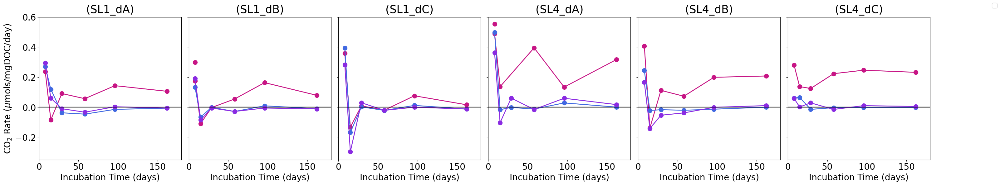

In [122]:
# Define the ending terms you want to filter by
site_terms = ['SL1_dA', 'SL1_dB', 'SL1_dC','SL4_dA', 'SL4_dB', 'SL4_dC' ]


# Create a figure and subplots
fig, axes = plt.subplots(1, 6, figsize=(30, 6), gridspec_kw={
                                            'hspace': 0})  # 1 row, 3 columns

# Define colors and markers (same as before)
colors = ['mediumvioletred', 'blueviolet', 'royalblue', 'mediumvioletred', 'blueviolet', 'royalblue'] #, 'indigo', 'purple', 'orchid']
markers = ['o', 'o', 'o', 'o', 'o', 'o', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'SL1_dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
    },
    'SL1_dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
    },
    'SL1_dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
    },
    'SL4_dA': {  # Color mapping for names ending with 'dC'
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
        'SL4_dB': {  # Color mapping for names ending with 'dC'
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },

    'SL4_dC': {  # Color mapping for names ending with 'dC'
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    }
}

labels = {'darkolivegreen':'SL1_25C', 'darkgreen':'SL1_25C_wet', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

# Iterate through ending terms and create subplots
for i, site_term in enumerate(site_terms):
    # Filter data for the current ending term
    filtered_names = [name for name in C_DOC_rates_melted['Name'].unique()
    if site_term in name and 'wet' not in name]

    # Iterate through filtered names and plot on the current subplot
    for j, name in enumerate(filtered_names):
        subset = C_DOC_rates_melted[C_DOC_rates_melted['Name'] == name]
        mask = ~np.isnan(subset['CO2 rate (micromols/mgC/day)'])
        color, marker = site_color_maps[site_term].get(name, (colors[j % len(colors)], markers[j % len(markers)]))
        axes[i].plot(subset['end_day'][mask], subset['CO2 rate (micromols/mgC/day)'][mask],
                          color=color, marker=marker, label=labels.get(color), markersize=10, linewidth=2,
                          )
        axes[i].axhline(y=0, color='black')

    # Set subplot title and labels
    axes[i].set_xlabel('Incubation Time (days)', fontsize=20)

    axes[0].set_ylabel('CO$_2$ Rate ($\mu$mols/mgDOC/day)', fontsize=20)
    axes[0].tick_params(axis='y', labelsize=20)
    for ax in axes[1:]:
      ax.tick_params(axis='y', which='major', left=True, right=False, labelleft=False)
    # axes[i].set_ylabel('CO$_2$/gC Rate ($\mu$omols/gC/day)'
    # for ax in axes[1:]:
    #   ax.set_ylabel('')
    axes[i].set_title(f'({site_term})', fontsize=25, pad=10)
    axes[i].tick_params(axis='x', labelsize=20)
    axes[i].grid(False)
    # axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[i].set_ylim(-0.35, 0.6)
    axes[i].set_xlim(0, 180)

    #removing error bars from legend handles
    # handles, labels = axes[i].get_legend_handles_labels()
    # new_handles = [h[0] for h in handles]
    # axes[i].legend(new_handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')
handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.07, 1), ncol=1, fontsize=15)
# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

#kinetics

In [123]:
# manipulate sorted_df_C df
#need to make day 0 incubation
# sorted_df_C = sorted_df_C[['Name', 'incubation time', 'total CO2', 'initial_organic_C_g_dry_mass']]
# Group by 'Name' and get the first value of 'initial_organic_C_g_dry_mass' for each group
initial_C_values = sorted_df_C.groupby('Name')['initial_organic_C_g_dry_mass'].first().reset_index()
initial_DOC_values = melted_DOC_avg.groupby('Name')['total DOC (mg)'].first().reset_index()

# Merge this back into the original DataFrame using 'Name' as the key
initial_C_values = pd.merge(initial_C_values, initial_DOC_values, on='Name', how='left')
sorted_df_C = pd.merge(sorted_df_C[['Name', 'incubation time', 'total CO2', 'total CH4']],  # Keep relevant columns
                       initial_C_values,
                       on='Name',
                       how='left')


new_data = sorted_df_C[sorted_df_C['incubation time'] == 1].copy()  # Start with data from day 1
new_data['incubation time'] = 0  # Set incubation time to 0
new_data['total CO2'] = 0  # Set total CO2 to 0
new_data['total CH4'] = 0  # Set total CH4 to 0
# Concatenate the new DataFrame with the original
updated_df = pd.concat([sorted_df_C, new_data], ignore_index=True)

# Define desired order
desired_order = ['SL1_d0_25C', 'SL1_d0_6C' ,'SL1_dA_25C', 'SL1_dA_6C', 'SL1_dA_2C', 'SL1_dB_25C', 'SL1_dB_6C', 'SL1_dB_2C',
                 'SL1_dC_25C', 'SL1_dC_6C', 'SL1_dC_2C', 'SL1_dC_25C_wet', 'SL4_d0_25C', 'SL4_d0_6C','SL4_dA_25C', 'SL4_dA_6C', 'SL4_dA_2C',
                 'SL4_dB_25C', 'SL4_dB_6C', 'SL4_dB_2C', 'SL4_dC_25C', 'SL4_dC_6C', 'SL4_dC_2C']

# Convert 'Name' to Categorical
updated_df['Name'] = pd.Categorical(updated_df['Name'], categories=desired_order, ordered=True)

# Sort the DataFrame
updated_df = updated_df.sort_values(by=['Name', 'incubation time'])
updated_df = updated_df.reset_index(drop=True)

#do some conversions to get the right units
updated_df['total DOC (g)'] = updated_df['total DOC (mg)']/1000

#need to convert total CO2 (micromols) to g CO2
updated_df['tot g CO2'] = (updated_df['total CO2']*10**-6)*44.01
updated_df['tot g CH4'] = (updated_df['total CH4']*10**-6)*16.04

#fill Nans
updated_df['tot g CO2'] = updated_df['tot g CO2'].fillna(0)  # Fill NaN in 'tot g CO2' with 0
updated_df['tot g CH4'] = updated_df['tot g CH4'].fillna(0)  # Fill NaN in 'tot g CH4' with 0

# Add 0 to 'tot g CO2' if 'tot g CH4' is NaN
updated_df.loc[updated_df['tot g CH4'].isnull(), 'tot g CO2'] = updated_df.loc[updated_df['tot g CH4'].isnull(), 'tot g CO2'] + 0

#need to find g C from g CO2 - use scale factor 12.01/44.01 (molar mass C/ molar mass CO2)
updated_df['tot g C'] = updated_df['tot g CO2']*(12.01/44.01) + updated_df['tot g CH4']*(12.01/16.04)

#re nan values so unfilled data doesnt go back to initial
# updated_df.loc[(['tot g C'] == 0) & (updated_df['incubation time'] != 0), 'tot g C'] = np.nan
updated_df.loc[(updated_df['tot g C'].eq(0)) & (updated_df['incubation time'].ne(0)), 'tot g C'] = np.nan

#find ln Ci
updated_df['ln Ci'] = np.log(updated_df['initial_organic_C_g_dry_mass'])
updated_df['ln Ci-Cres'] = np.log(updated_df['initial_organic_C_g_dry_mass'] - updated_df['tot g C'])

#find ln Ci DOC
updated_df['ln Ci_DOC'] = np.log(updated_df['total DOC (g)'])
updated_df['ln Ci_DOC-Cres_DOC'] = np.log(updated_df['total DOC (g)'] - updated_df['tot g C'])

#find percent change
updated_df['% remaining'] = ((updated_df['initial_organic_C_g_dry_mass'] - updated_df['tot g C'])/updated_df['initial_organic_C_g_dry_mass'])*100
updated_df['% remaining DOC'] = ((updated_df['total DOC (g)'] - updated_df['tot g C'])/updated_df['total DOC (g)'])*100


updated_df
# print(updated_df['tot g C'].dtype)

/tmp/ipython-input-2189488383.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  initial_C_values = sorted_df_C.groupby('Name')['initial_organic_C_g_dry_mass'].first().reset_index()
/usr/local/lib/python3.12/dist-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,Name,incubation time,total CO2,total CH4,initial_organic_C_g_dry_mass,total DOC (mg),total DOC (g),tot g CO2,tot g CH4,tot g C,ln Ci,ln Ci-Cres,ln Ci_DOC,ln Ci_DOC-Cres_DOC,% remaining,% remaining DOC
0,SL1_d0_25C,0,0.0,0.0,0.006329,NaN,NaN,0.0,0.0,0.0,-5.062598,-5.062598,NaN,NaN,100.0,NaN
1,SL1_d0_25C,1,NaN,NaN,0.006329,NaN,NaN,0.0,0.0,NaN,-5.062598,NaN,NaN,NaN,NaN,NaN
2,SL1_d0_25C,8,NaN,NaN,0.006329,NaN,NaN,0.0,0.0,NaN,-5.062598,NaN,NaN,NaN,NaN,NaN
3,SL1_d0_25C,11,NaN,NaN,0.006329,NaN,NaN,0.0,0.0,NaN,-5.062598,NaN,NaN,NaN,NaN,NaN
4,SL1_d0_25C,15,NaN,NaN,0.006329,NaN,NaN,0.0,0.0,NaN,-5.062598,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
775,NaN,162,NaN,NaN,0.372267,0.922331,0.000922,0.0,0.0,NaN,-0.988145,NaN,-6.988607,NaN,NaN,NaN
776,NaN,162,NaN,NaN,0.016415,0.768229,0.000768,0.0,0.0,NaN,-4.109542,NaN,-7.171423,NaN,NaN,NaN
777,NaN,162,NaN,NaN,0.051099,0.616969,0.000617,0.0,0.0,NaN,-2.973991,NaN,-7.390693,NaN,NaN,NaN
778,NaN,162,NaN,NaN,0.016933,0.720730,0.000721,0.0,0.0,NaN,-4.078507,NaN,-7.235247,NaN,NaN,NaN


In [124]:

#find linear regresson of ln Ci-Cres (y) vs time (x)
from sklearn.linear_model import LinearRegression

def calculate_linear_regression(df):
  """Calculates linear regression for each unique name in the DataFrame.

  Args:
    df: The input DataFrame containing 'Name', 'incubation time', 'initial_organic_C_g_dry_mass', and 'total CO2' columns.

  Returns:
    A DataFrame with regression results for each unique name.
  """

  results = []
  for name in df['Name'].unique():
    subset = df[df['Name'] == name].copy()

    #drop Nan  values
    subset = subset.dropna(subset=['ln Ci-Cres'])

    X = subset['incubation time'].values.reshape(-1, 1)  # Reshape for scikit-learn
    y = subset['ln Ci-Cres'].values

    if len(X) > 0 and len(y) > 0:
      reg = LinearRegression().fit(X, y)
      results.append({
          'Name': name,
          'slope': reg.coef_[0],
          'intercept': reg.intercept_,
         'r_squared': reg.score(X, y)
     })
    else:
      print(f"warning: SKipping regression for {name} due to empty or invalid data after removings NaNa")

  return pd.DataFrame(results)

# Call the function to calculate regression and store results in a new DataFrame
regression_results = calculate_linear_regression(updated_df)
# print(regression_results)

#find k values
regression_results['k'] = (regression_results['slope'])*-1



# updated_df
regression_results

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


,Name,slope,intercept,r_squared,k
0,SL1_d0_25C,0.000000e+00,-5.062598,NaN,-0.000000e+00
1,SL1_d0_6C,0.000000e+00,-5.406694,NaN,-0.000000e+00
2,SL1_dA_25C,-7.722405e-06,-3.349332,0.894668,7.722405e-06
3,SL1_dA_6C,-7.138245e-07,-3.319504,0.059679,7.138245e-07
4,SL1_dA_2C,-1.507448e-07,-3.325413,0.002650,1.507448e-07
5,SL1_dB_25C,-2.758643e-05,-4.144465,0.787239,2.758643e-05
6,SL1_dB_6C,-5.981773e-07,-4.172696,0.002729,5.981773e-07
7,SL1_dB_2C,-1.691976e-06,-4.132974,0.023278,1.691976e-06
8,SL1_dC_25C,-7.600683e-06,-2.952070,0.418129,7.600683e-06
9,SL1_dC_6C,-3.518453e-07,-2.990637,0.002370,3.518453e-07


In [125]:

#find linear regresson of ln Ci-Cres (y) vs time (x) DOC

def calculate_linear_regression(df):
  """Calculates linear regression for each unique name in the DataFrame.

  Args:
    df: The input DataFrame containing 'Name', 'incubation time', 'initial_organic_C_g_dry_mass', and 'total CO2' columns.

  Returns:
    A DataFrame with regression results for each unique name.
  """

  results = []
  for name in df['Name'].unique():
    subset = df[df['Name'] == name].copy()

    #drop Nan  values
    subset = subset.dropna(subset=['ln Ci_DOC-Cres_DOC'])

    X = subset['incubation time'].values.reshape(-1, 1)  # Reshape for scikit-learn
    y = subset['ln Ci_DOC-Cres_DOC'].values

    if len(X) > 0 and len(y) > 0:
      reg = LinearRegression().fit(X, y)
      results.append({
          'Name': name,
          'slope': reg.coef_[0],
          'intercept': reg.intercept_,
         'r_squared': reg.score(X, y)
     })
    else:
      print(f"warning: SKipping regression for {name} due to empty or invalid data after removings NaNa")

  return pd.DataFrame(results)

# Call the function to calculate regression and store results in a new DataFrame
regression_results_DOC = calculate_linear_regression(updated_df)
# print(regression_results)

#find k values
regression_results_DOC['k DOC'] = (regression_results_DOC['slope'])*-1



# updated_df
regression_results_DOC

,Name,slope,intercept,r_squared,k DOC
0,SL1_dA_25C,-0.001612,-8.573181,0.916881,0.001612
1,SL1_dA_6C,-0.000128,-8.550522,0.057443,0.000128
2,SL1_dA_2C,-0.000022,-8.558226,0.001741,0.000022
3,SL1_dB_25C,-0.001473,-8.021856,0.824174,0.001473
4,SL1_dB_6C,-0.000023,-8.039349,0.001806,0.000023
5,SL1_dB_2C,-0.000075,-7.996926,0.021276,0.000075
6,SL1_dC_25C,-0.000564,-7.239386,0.439554,0.000564
7,SL1_dC_6C,-0.000020,-7.262181,0.001523,0.000020
8,SL1_dC_2C,-0.000103,-7.216204,0.040010,0.000103
9,SL1_dC_25C_wet,-0.000421,-6.568226,0.411342,0.000421


In [126]:

#find linear regresson of ln Ci-Cres (y) vs time (x) DOC

def calculate_linear_regression(df, start_day=None, end_day=None):
  """Calculates linear regression for each unique name in the DataFrame.

  Args:
    df: The input DataFrame containing 'Name', 'incubation time', 'initial_organic_C_g_dry_mass', and 'total CO2' columns.

  Returns:
    A DataFrame with regression results for each unique name.
  """

  results = []
  for name in df['Name'].unique():
    subset = df[df['Name'] == name].copy()

    if start_day is not None:
      subset = subset[subset['incubation time'] >= start_day]

    if end_day is not None:
      subset = subset[subset['incubation time'] <= end_day]

    #drop Nan  values
    subset = subset.dropna(subset=['ln Ci_DOC-Cres_DOC'])

    X = subset['incubation time'].values.reshape(-1, 1)  # Reshape for scikit-learn
    y = subset['ln Ci_DOC-Cres_DOC'].values

    if len(X) > 0 and len(y) > 0:
      reg = LinearRegression().fit(X, y)
      results.append({
          'Name': name,
          'slope': reg.coef_[0],
          'intercept': reg.intercept_,
         'r_squared': reg.score(X, y)
     })
    else:
      print(f"warning: SKipping regression for {name} due to empty or invalid data after removings NaNa")

  return pd.DataFrame(results)

start_day = 30
end_day = 170

# Call the function to calculate regression and store results in a new DataFrame
regression_results_DOC_start = calculate_linear_regression(updated_df, start_day, end_day)
# print(regression_results)

#find k values
regression_results_DOC_start['k DOC start'] = (regression_results_DOC_start['slope'])*-1



# updated_df
regression_results_DOC_start

/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_regression.py:1266: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)


,Name,slope,intercept,r_squared,k DOC start
0,SL1_dA_25C,-0.001782,-8.550238,0.996723,0.001782
1,SL1_dA_6C,0.000050,-8.568524,0.680374,-0.000050
2,SL1_dA_2C,0.000118,-8.571328,0.942114,-0.000118
3,SL1_dB_25C,-0.001627,-8.001012,0.970615,0.001627
4,SL1_dB_6C,0.000126,-8.054438,0.976574,-0.000126
5,SL1_dB_2C,0.000055,-8.009922,0.408078,-0.000055
6,SL1_dC_25C,-0.000495,-7.244240,0.840542,0.000495
7,SL1_dC_6C,0.000110,-7.275665,0.873168,-0.000110
8,SL1_dC_2C,0.000061,-7.233200,0.359937,-0.000061
9,SL1_dC_25C_wet,-0.000255,-6.583964,0.945201,0.000255


#k graphs

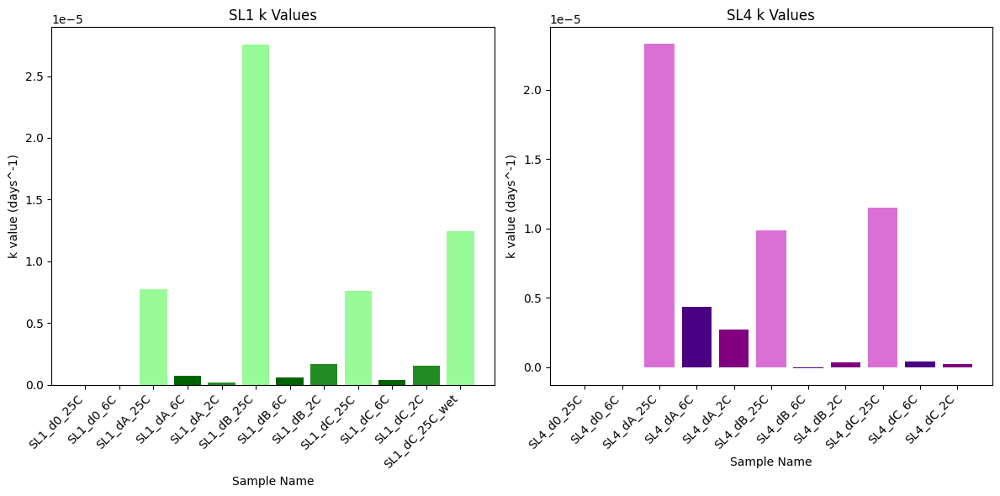

In [127]:
#graph k values
# Filter data for SL1 and SL4
sl1_data = regression_results[regression_results['Name'].str.startswith('SL1')]
sl4_data = regression_results[regression_results['Name'].str.startswith('SL4')]

SL1_colors = ['darkgreen', 'forestgreen', 'palegreen']
SL4_colors = ['indigo', 'purple', 'orchid']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(12, 6))  # 1 row, 2 columns

# Bar plot for SL1
axes[0].bar(sl1_data['Name'], sl1_data['k'], color=SL1_colors)
axes[0].set_xlabel('Sample Name')
# axes[0].set_ylim(0,3e-5)
axes[0].set_ylabel('k value (days^-1)')
axes[0].set_title('SL1 k Values')
plt.setp(axes[0].get_xticklabels(), rotation=45, ha='right')  # Rotate x-axis labels for better readability


# Bar plot for SL4
axes[1].bar(sl4_data['Name'], sl4_data['k'], color=SL4_colors)
axes[1].set_xlabel('Sample Name')
# axes[1].set_ylim(0,3e-5)
axes[1].set_ylabel('k value (days^-1)')
axes[1].set_title('SL4 k Values')
plt.setp(axes[1].get_xticklabels(), rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Adjust spacing between subplots
plt.tight_layout()

# Display the plots
plt.show()

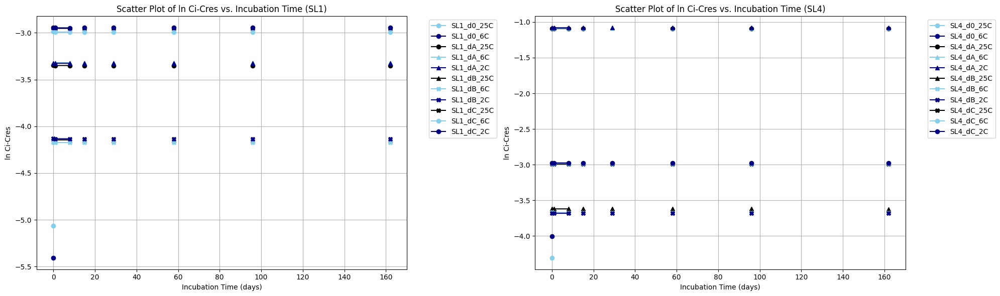

In [128]:
# Define the ending terms you want to filter by
site_terms = ['SL1', 'SL4']

# Create a figure and subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 6))  # 1 row, 2 columns

# Define colors and markers (same as before)
colors = ['skyblue', 'navy', 'black'] #, 'indigo', 'purple', 'orchid']
markers = ['o', 'o', 'o', '^', '^', '^', 'X', 'X', 'X']

# Iterate through ending terms and create subplots
for i, site_term in enumerate(site_terms):
    # Filter data for the current ending term
    updated_df['Name'] = updated_df['Name'].astype(str)
    filtered_names = [name for name in updated_df['Name'].unique() if site_term in name and 'wet' not in name]
    #if site_term in name and 'wet' not in name]

    # Iterate through filtered names and plot on the current subplot
    for j, name in enumerate(filtered_names):
        subset = updated_df[updated_df['Name'] == name]
        axes[i].plot(subset['incubation time'], subset['ln Ci-Cres'],
                          color=colors[j % len(colors)], marker=markers[j % len(markers)], label=name,
                          )

    # Set subplot title and labels
    axes[i].set_xlabel('Incubation Time (days)')
    axes[i].set_ylabel('ln Ci-Cres')
    axes[i].set_title(f'Scatter Plot of ln Ci-Cres vs. Incubation Time ({site_term})')
    axes[i].grid(True)
    axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    # axes[i].set_ylim(-3.5675, -3.5625)

    #removing error bars from legend handles
    # handles, labels = axes[i].get_legend_handles_labels()
    # new_handles = [h[0] for h in handles]
    # axes[i].legend(new_handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

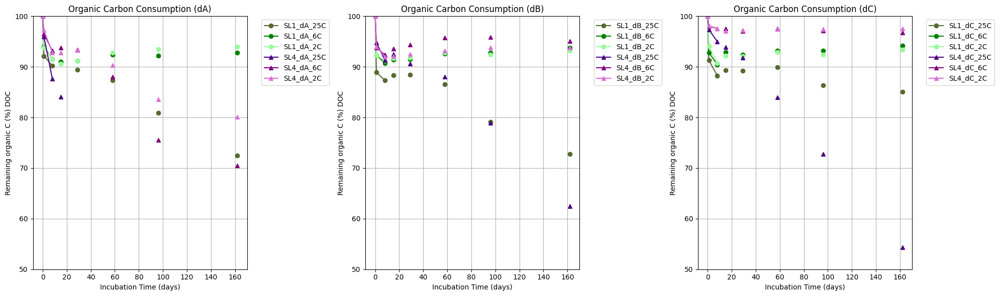

In [129]:
# Define the ending terms you want to filter by
site_terms = ['dA', 'dB', 'dC']

# Create a figure and subplots
fig, axes = plt.subplots(1, 3, figsize=(20, 6))  # 1 row, 2 columns

# Define colors and markers (same as before)
colors = ['darkolivegreen', 'green', 'palegreen', 'indigo', 'purple', 'orchid'] #, 'indigo', 'purple', 'orchid']
markers = ['o', 'o', 'o', '^', '^', '^', 'X', 'X', 'X']

# Iterate through ending terms and create subplots
for i, site_term in enumerate(site_terms):
    # Filter data for the current ending term
    updated_df['Name'] = updated_df['Name'].astype(str)
    filtered_names = [name for name in updated_df['Name'].unique() if site_term in name and 'wet' not in name]
    #if site_term in name and 'wet' not in name]

    # Iterate through filtered names and plot on the current subplot
    for j, name in enumerate(filtered_names):
        subset = updated_df[updated_df['Name'] == name]
        axes[i].plot(subset['incubation time'], subset['% remaining DOC'],
                          color=colors[j % len(colors)], marker=markers[j % len(markers)], label=name,
                          )

    # Set subplot title and labels
    axes[i].set_xlabel('Incubation Time (days)')
    axes[i].set_ylabel('Remaining organic C (%) DOC')
    axes[i].set_title(f'Organic Carbon Consumption ({site_term})')
    axes[i].grid(True)
    axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[i].set_ylim(50, 100)

    #removing error bars from legend handles
    # handles, labels = axes[i].get_legend_handles_labels()
    # new_handles = [h[0] for h in handles]
    # axes[i].legend(new_handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

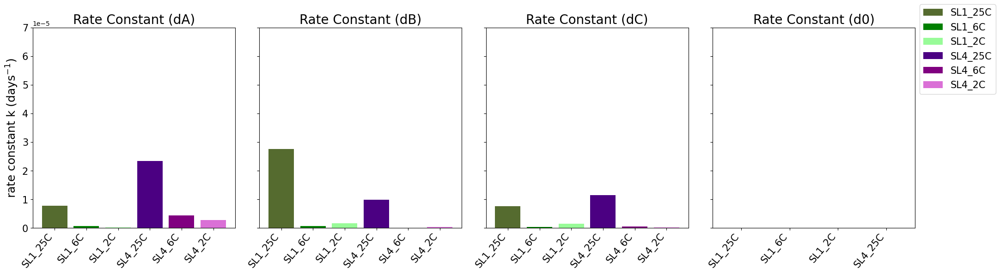

In [130]:
# Define the ending terms you want to filter by
site_terms = ['dA', 'dB', 'dC','d0']

# Create a figure and subplots
fig, axes = plt.subplots(1, 4, figsize=(20, 6))  # 1 row, 2 columns

# Define colors and markers (same as before)
colors = ['darkolivegreen', 'green', 'palegreen', 'indigo', 'purple', 'orchid'] #, 'indigo', 'purple', 'orchid']
markers = ['o', 'o', 'o', '^', '^', '^', 'X', 'X', 'X']

# Define the color mapping for each site term
site_color_maps = {
    'dA': {  # Color mapping for names ending with 'dA'
        'SL1_dA_25C': (colors[0], markers[0]),
        'SL1_dA_6C': (colors[1], markers[1]),
        'SL1_dA_2C': (colors[2], markers[2]),
        'SL4_dA_25C': (colors[3], markers[3]),
        'SL4_dA_6C': (colors[4], markers[3]),
        'SL4_dA_2C': (colors[5], markers[3]),
    },
    'dB': {  # Color mapping for names ending with 'dB'
        'SL1_dB_25C': (colors[0], markers[0]),
        'SL1_dB_6C': (colors[1], markers[1]),
        'SL1_dB_2C': (colors[2], markers[2]),
        'SL4_dB_25C': (colors[3], markers[3]),
        'SL4_dB_6C': (colors[4], markers[3]),
        'SL4_dB_2C': (colors[5], markers[3]),
    },
    'dC': {  # Color mapping for names ending with 'dC'
        'SL1_dC_25C': (colors[0], markers[0]),
        'SL1_dC_6C': (colors[1], markers[1]),
        'SL1_dC_2C': (colors[2], markers[2]),
        'SL4_dC_25C': (colors[3], markers[3]),
        'SL4_dC_6C': (colors[4], markers[3]),
        'SL4_dC_2C': (colors[5], markers[3]),
    },

    'd0': {  # Color mapping for names ending with 'dC'
        'SL1_d0_25C': (colors[0], markers[0]),
        'SL1_d0_6C': (colors[1], markers[0]),
        'SL1_d0_2C': (colors[2], markers[0]),
        'SL4_d0_25C': (colors[3], markers[3]),
        'SL4_d0_6C': (colors[4], markers[3]),
        'SL4_d0_2C': (colors[5], markers[3]),
    },
}

#also define labels
x_label = [
    'SL1_25C',
    'SL1_6C',
    'SL1_2C',
    'SL4_25C',
    'SL4_6C',
    'SL4_2C',
    'SL1_25C',
    'SL1_6C',
    'SL1_2C',
    'SL4_25C',
    'SL4_6C',
    'SL4_2C',
    'SL1_25C',
    'SL1_6C',
    'SL1_2C',
    'SL4_25C',
    'SL4_6C',
    'SL4_2C',
    'SL1_25C',
    'SL1_6C',
    'SL4_25C',
    'SL4_6C',
]

#x_label = {'SL1_25C', 'SL1_6C', 'SL1_2C', 'SL4_25C', 'SL4_6C', 'SL4_2C'}
labels = {'darkolivegreen':'SL1_25C', 'green': 'SL1_6C', 'palegreen':'SL1_2C', 'indigo': 'SL4_25C', 'purple':'SL4_6C', 'orchid':'SL4_2C'}

# Iterate through ending terms and create subplots
for i, site_term in enumerate(site_terms):
    # Filter data for the current ending term
    regression_results['Name'] = regression_results['Name'].astype(str)
    filtered_names = [name for name in regression_results['Name'].unique() if site_term in name and 'wet' not in name]
    #if site_term in name and 'wet' not in name]
    axes[i].set_xticks(np.arange(len(x_label)))
    axes[i].set_xticklabels(x_label, ha='right')

    # Iterate through filtered names and plot on the current subplot
    for j, name in enumerate(filtered_names):
        subset = regression_results[regression_results['Name'] == name]
        # color = site_color_maps[site_term][name]
        color, marker = site_color_maps[site_term].get(name, ('black', markers[7]))
        axes[i].bar(subset['Name'], subset['k'],
                          color=color, label=labels.get(color), zorder=3
                          )

    # Set subplot title and labels
    # axes[i].set_xlabel('Incubation Time (days)')
    axes[0].set_ylabel('rate constant k (days$^{-1}$)', fontsize=18)
    for ax in axes[1:]:
      ax.tick_params(axis='y', which='major', left=True, right=False, labelleft=False)
    axes[i].set_title(f'Rate Constant ({site_term})',fontsize=20)
    # axes[i].grid(True, zorder=0)
    # axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[i].set_ylim(0, 7e-5)
    axes[i].tick_params(axis='x', labelsize=15, rotation=50, pad=2)
    axes[i].tick_params(axis='y', labelsize=15)

    #removing error bars from legend handles
    # handles, labels = axes[i].get_legend_handles_labels()
    # new_handles = [h[0] for h in handles]
    # axes[i].legend(new_handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')
handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.085, 1), ncol=1, fontsize=15)
# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

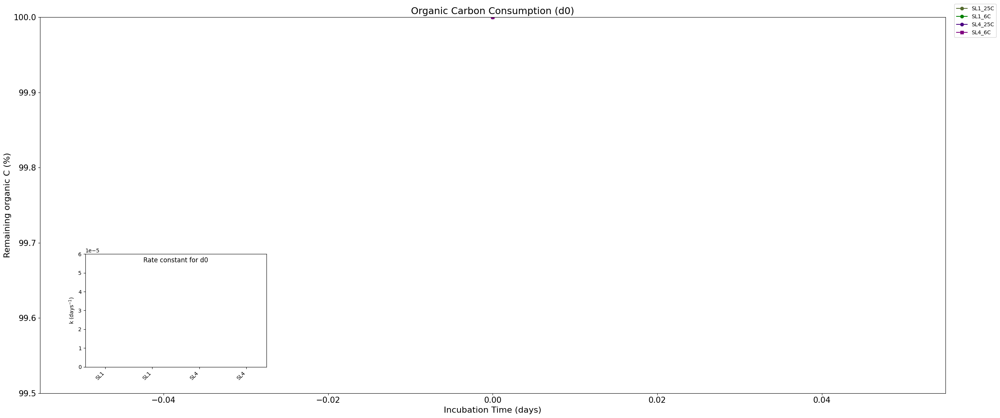

In [131]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import re
# Define the ending terms you want to filter by
site_terms = ['d0']

# Create a figure and subplots
fig, axes = plt.subplots(1, 1, figsize=(25, 11))  # 1 row, 2 columns
# Create the inset axes
axins = inset_axes(ax, width="30%", height="30%", loc='upper right')

# Define colors and markers (same as before)
colors = ['darkolivegreen', 'green', 'indigo', 'purple', 'orchid'] #, 'indigo', 'purple', 'orchid']
markers = ['o', 'o', 'o', 's', 's', 's', 'X', 'X', 'X']
remove_string = ['_d0'] #, '_dB', '_dC']

# Iterate through ending terms and create subplots
for i, site_term in enumerate(site_terms):
    # Filter data for the current ending term
    updated_df['Name'] = updated_df['Name'].astype(str)
    filtered_names = [name for name in updated_df['Name'].unique() if site_term in name and 'wet' not in name]
    #if site_term in name and 'wet' not in name]

    # Iterate through filtered names and plot on the current subplot
    for j, name in enumerate(filtered_names):
        subset = updated_df[updated_df['Name'] == name]
        mask = ~np.isnan(subset['% remaining']) & ~np.isnan(subset['incubation time'])
        # new_name = re.sub(r'_dA', '', name)
        new_name = name
        for string in remove_string:
            new_name = re.sub(string, '', new_name)

        axes.plot(subset['incubation time'][mask], subset['% remaining'][mask],
                          color=colors[j % len(colors)], marker=markers[j % len(markers)], label=new_name,
                          )


for i, site_term in enumerate(site_terms):
    regression_results['Name'] = regression_results['Name'].astype(str)
    filtered_names = [name for name in updated_df['Name'].unique() if site_term in name and 'wet' not in name]

    # Get the current subplot
    ax = axes

    # Create axins within the current subplot
    axins = ax.inset_axes([0.05, 0.07, 0.2, 0.3])  # Adjust position and size as needed

    # Collect data for the bar chart
    names = []
    k_values = []
    for j, name in enumerate(filtered_names):
        subset = regression_results[regression_results['Name'] == name]
        names.extend(subset['Name'].tolist())
        k_values.extend(subset['k'].tolist())

    # Create the bar chart on axins
    x_positions = np.arange(len(names))  # Create x positions for bars
    axins.bar(x_positions, k_values, color=colors[:len(names)], label=names, width=0.5)  # Adjust width as needed

    #remove part of name
    removal = [r'_d0_25C', r'_d0_6C', r'_d0_2C'] #, r'_dB_25C', r'_dB_6C', r'_dB_2C', r'_dC_25C', r'_dC_6C', r'_dC_2C']

    # Function to remove multiple patterns from a string
    def remove_patterns(text, patterns):
        for pattern in patterns:
            text = re.sub(pattern, '', text)
        return text

    modified_names = [remove_patterns(name, removal) for name in names]

    # Set x-axis tick labels and rotation on axins
    axins.set_xticks(x_positions)
    axins.set_xticklabels(modified_names, rotation=45, ha='right')  # Rotate labels for better readability
    axins.set_ylim(0, 6e-5)

    # Customize axins
    axins.set_title(f'Rate constant for {site_term}', x=0.5, y=0.9)
    # axins.set_xlabel('Name')
    axins.set_ylabel('k (days$^{-1}$)')

    # axins.tick_params(axis='y', pad=-20, direction='in')
    # axins.legend()

# for i, site_term in enumerate(site_terms):
#     regression_results['Name'] = regression_results['Name'].astype(str)
#     filtered_names = [name for name in updated_df['Name'].unique() if site_term in name and 'wet' not in name]

#     # Get the current subplot
#     ax = axes[i]

#     # Iterate through filtered names and plot
#     for j, name in enumerate(filtered_names):
#         subset = regression_results[regression_results['Name'] == name]

#         # Create inset axes within the current subplot using axins
#         axins = ax.inset_axes([0.1, 0.1 + j * 0.2, 0.8, 0.1])  # Adjust position and size as needed
#         x_values = range(len(subset))
#         axins.bar(x_values, subset['k'], color=colors[j % len(colors)], label=name, width=0.5)

#         # Customize inset plot (optional)
#         axins.set_xlabel('Name')
#         axins.set_ylabel('k')
#         # axins.set_title(f'Small Bar Chart for {name}')
#         axins.legend()

    # Set subplot title and labels
    axes.set_xlabel('Incubation Time (days)', fontsize=16)
    axes.set_ylabel('Remaining organic C (%)', fontsize=16)
    axes.set_title(f'Organic Carbon Consumption ({site_term})', fontsize=18)
    # axes[i].grid(True)
    # axes[i].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes.set_ylim(99.5, 100)
    axes.tick_params(axis='x', labelsize=15)
    axes.tick_params(axis='y', labelsize=15)

    #removing error bars from legend handles
    # handles, labels = axes[i].get_legend_handles_labels()
    # new_handles = [h[0] for h in handles]
    # axes[i].legend(new_handles, labels, bbox_to_anchor=(1.05, 1), loc='upper left')
handles, labels = [], []
for ax in fig.axes:  # Or iterate through desired axes
    h, l = ax.get_legend_handles_labels()
    h = [h_elem[0] if isinstance(h_elem, matplotlib.container.ErrorbarContainer) else h_elem for h_elem in h]
    #h = [(h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem) if isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    #h = [h_elem if not isinstance(h_elem, matplotlib.lines.Line2D) else h_elem for h_elem in h]
    # = [h_elem[0] if not isinstance(h_elem, matplotlib.collections.LineCollection) else h_elem for h_elem in h]
    handles.extend(h)
    labels.extend(l)

# Deduplicate legend entries
unique_labels = []
unique_handles = []
for handle, label in zip(handles, labels):
    if label not in unique_labels:
        unique_labels.append(label)
        unique_handles.append(handle)
# Create the consolidated legend
fig.legend(unique_handles, unique_labels, loc='upper right', bbox_to_anchor=(1.05, 1), ncol=1)
# Adjust spacing between subplots
plt.tight_layout()

# Show the plot
plt.show()

#export

In [ ]:
#dataframes to export
# merged_CO2_d13C
# sorted_df_CH4
# sorted_df_d13C_CH4
# updated_df
# CH4_rate_melted
# CO2_rate_melted
# final_pure_d13C_CO2
# results_df_DW
# results_df_CH4_DW
# final_averaged_df_DW
# final_averaged_df_CH4_DW
final_total_C_CO2


output_path = r'cal corr d13C new attempt.xlsx'

with pd.ExcelWriter(output_path, engine='openpyxl') as writer:
  # data.to_excel(writer, sheet_name='Raw Data', index=False)
  # merged_CO2_d13C.to_excel(writer, sheet_name='CO2 and d13C', index=False)
  # CH4_rate_melted.to_excel(writer, sheet_name='CH4 rate', index=False)
  # CO2_rate_melted.to_excel(writer, sheet_name='CO2 rate', index=False)
  # melted_df_CO2.to_excel(writer, sheet_name='C tot', index=False)
  # sorted_df_CH4.to_excel(writer, sheet_name='CH4', index=False)
  # sorted_df_d13C_CH4.to_excel(writer, sheet_name='d13C-CH4', index=False)
  # regression_results.to_excel(writer, sheet_name='rate constants', index=False)
  final_pure_d13C_CO2.to_excel(writer, sheet_name='calcite corr d13C CO2', index=False)
  # final_averaged_df_DW.to_excel(writer, sheet_name='CO2 DW', index=False)
  # final_averaged_df_CH4_DW.to_excel(writer, sheet_name='CH4 DW', index=False)
  # final_total_C_CO2.to_excel(writer, sheet_name='total C-CO2 (g)', index=False)

files.download(output_path)



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>